In [ ]:
! pip install transformers==4.28.0
! pip install accelerate
! pip install datasets
! pip install rouge-score nltk
! pip install huggingface_hub
! pip install sentencepiece
! pip install evaluate
! pip install gdown
! pip install git-lfs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 72.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 74.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 7.9 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 474.6/474.6 kB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.5/110.5 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 212.5/212.5 kB 13.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 34

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import string

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import warnings
warnings.filterwarnings('ignore')

In [ ]:
df = pd.read_csv('/content/df_new_fix.csv', header=0)

In [ ]:
df

,description,category
0,wallet payment paxel,Shipping
1,penarikan tunai atm himbara,Cash Withdrawal
2,debit domestik tanggal trn joão lisa hotel,Travel
3,transfer banking tagihan ftscy uang bensin gely,Gas & Fuel
4,transfer banking debit gebetanku jne jan yulianty,Shipping
...,...,...
29308,pembayaran banking debit service vespa,Service & Auto Parts
29309,pengaliran domestik tanggal trn dom spbu kuni,Gas & Fuel
29310,nib hnk fee atmb transfer,Fees & Charges
29311,tagihan otomatis kor biaya swit,Fees & Charges


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29313 entries, 0 to 29312
Data columns (total 2 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   description  29313 non-null  object
 1   category     29313 non-null  object
dtypes: object(2)
memory usage: 458.1+ KB


In [ ]:
df.isnull().sum()

description    0
category       0
dtype: int64

In [ ]:
df.drop_duplicates(subset=['description'], inplace=True)

In [ ]:
df.shape

(28718, 2)

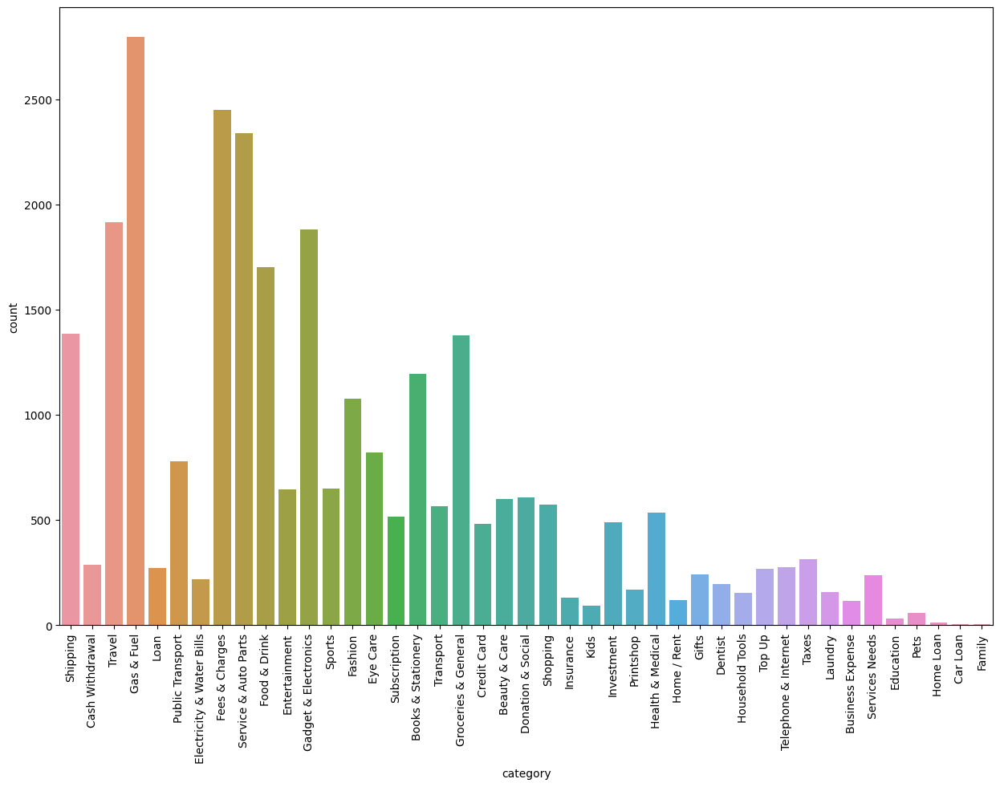

In [ ]:
plt.figure(figsize=(15,10))
sns.countplot(data=df, x='category')
plt.xticks(rotation=90)
plt.show()

In [ ]:
from collections import Counter

Counter(df['category'])

Counter({'Shipping': 1384,
         'Cash Withdrawal': 288,
         'Travel': 1915,
         'Gas & Fuel': 2797,
         'Loan': 271,
         'Public Transport': 780,
         'Electricity & Water Bills': 218,
         'Fees & Charges': 2449,
         'Service & Auto Parts': 2339,
         'Food & Drink': 1702,
         'Entertainment': 645,
         'Gadget & Electronics': 1882,
         'Sports': 650,
         'Fashion': 1075,
         'Eye Care': 821,
         'Subscription': 516,
         'Books & Stationery': 1195,
         'Transport': 564,
         'Groceries & General': 1376,
         'Credit Card': 482,
         'Beauty & Care': 598,
         'Donation & Social': 605,
         'Shopping': 573,
         'Insurance': 130,
         'Kids': 93,
         'Investment': 489,
         'Printshop': 169,
         'Health & Medical': 535,
         'Home / Rent': 118,
         'Gifts': 239,
         'Dentist': 193,
         'Household Tools': 154,
         'Top Up': 267,
         'Tele

In [ ]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df['category'] = le.fit_transform(df['category'])

In [ ]:
keys = le.classes_
values = le.transform(le.classes_)
dictionary = dict(zip(keys, values))
print(dictionary)

{'Beauty & Care': 0, 'Books & Stationery': 1, 'Business Expense': 2, 'Car Loan': 3, 'Cash Withdrawal': 4, 'Credit Card': 5, 'Dentist': 6, 'Donation & Social': 7, 'Education': 8, 'Electricity & Water Bills': 9, 'Entertainment': 10, 'Eye Care': 11, 'Family': 12, 'Fashion': 13, 'Fees & Charges': 14, 'Food & Drink': 15, 'Gadget & Electronics': 16, 'Gas & Fuel': 17, 'Gifts': 18, 'Groceries & General': 19, 'Health & Medical': 20, 'Home / Rent': 21, 'Home Loan': 22, 'Household Tools': 23, 'Insurance': 24, 'Investment': 25, 'Kids': 26, 'Laundry': 27, 'Loan': 28, 'Pets': 29, 'Printshop': 30, 'Public Transport': 31, 'Service & Auto Parts': 32, 'Services Needs': 33, 'Shipping': 34, 'Shopping': 35, 'Sports': 36, 'Subscription': 37, 'Taxes': 38, 'Telephone & Internet': 39, 'Top Up': 40, 'Transport': 41, 'Travel': 42}


In [ ]:
re = {v:k for k,v in dictionary.items()}
print(re)

{0: 'Beauty & Care', 1: 'Books & Stationery', 2: 'Business Expense', 3: 'Car Loan', 4: 'Cash Withdrawal', 5: 'Credit Card', 6: 'Dentist', 7: 'Donation & Social', 8: 'Education', 9: 'Electricity & Water Bills', 10: 'Entertainment', 11: 'Eye Care', 12: 'Family', 13: 'Fashion', 14: 'Fees & Charges', 15: 'Food & Drink', 16: 'Gadget & Electronics', 17: 'Gas & Fuel', 18: 'Gifts', 19: 'Groceries & General', 20: 'Health & Medical', 21: 'Home / Rent', 22: 'Home Loan', 23: 'Household Tools', 24: 'Insurance', 25: 'Investment', 26: 'Kids', 27: 'Laundry', 28: 'Loan', 29: 'Pets', 30: 'Printshop', 31: 'Public Transport', 32: 'Service & Auto Parts', 33: 'Services Needs', 34: 'Shipping', 35: 'Shopping', 36: 'Sports', 37: 'Subscription', 38: 'Taxes', 39: 'Telephone & Internet', 40: 'Top Up', 41: 'Transport', 42: 'Travel'}


# Modeling

In [ ]:
df = df.reset_index(drop=True)

In [ ]:
from huggingface_hub import notebook_login

notebook_login()

In [ ]:
from sklearn.model_selection import train_test_split

df_trans = df.copy()

train, valid = train_test_split(df_trans, test_size=0.2, random_state=42, stratify=df_trans.category)

In [ ]:
train.reset_index(drop=True, inplace=True)

In [ ]:
valid.reset_index(drop=True, inplace=True)

In [ ]:
train = train.rename(columns={'description': 'text', 'category': 'label'})

In [ ]:
valid = valid.rename(columns={'description': 'text', 'category': 'label'})

In [ ]:
from datasets import Dataset

train_dataset = Dataset.from_dict(train)
valid_dataset = Dataset.from_dict(valid)

In [ ]:
import datasets
dd = datasets.DatasetDict({"train":train_dataset,"validation":valid_dataset})

In [ ]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained("distilbert-base-uncased")

In [ ]:
def tokenize_function(examples):
    return tokenizer(examples["text"], truncation=True, padding='max_length')

In [ ]:
tokenized_datasets = dd.map(tokenize_function, batched=True)

Map:   0%|          | 0/22974 [00:00<?, ? examples/s]

Map:   0%|          | 0/5744 [00:00<?, ? examples/s]

In [ ]:
print(tokenized_datasets['train'][0])

{'text': 'overbooking atm roshi purchuniqlo singapore pte sgd', 'label': 13, 'input_ids': [101, 2058, 8654, 2075, 27218, 20996, 6182, 16405, 11140, 19496, 4160, 4135, 5264, 13866, 2063, 22214, 2094, 102, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0

In [ ]:
tokenized_datasets

DatasetDict({
    train: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 22974
    })
    validation: Dataset({
        features: ['text', 'label', 'input_ids', 'attention_mask'],
        num_rows: 5744
    })
})

In [ ]:
tokenized_datasets = tokenized_datasets.remove_columns(
    'text'
)

In [ ]:
from transformers import DataCollatorWithPadding

data_collator = DataCollatorWithPadding(tokenizer=tokenizer)

In [ ]:
data_collator(tokenized_datasets["train"][1])

You're using a DistilBertTokenizerFast tokenizer. Please note that with a fast tokenizer, using the `__call__` method is faster than using a method to encode the text followed by a call to the `pad` method to get a padded encoding.


{'input_ids': tensor([  101,  3769,  6030,  2863,  2863, 10733,  1998, 24857,   102,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0,     0,     0,     0,     0,
            0,     0,     0,     0,     0,     0, 

In [ ]:
import evaluate

#accuracy = evaluate.load("accuracy")

In [ ]:
import numpy as np

def compute_metrics(eval_pred):
    metric1 = evaluate.load("accuracy")
    metric2 = evaluate.load("precision")
    metric3 = evaluate.load("recall")
    
    logits, labels = eval_pred
    predictions = np.argmax(logits, axis=-1)
    accuracy = metric1.compute(predictions=predictions, references=labels)['accuracy']
    precision = metric2.compute(predictions=predictions, references=labels, average='macro')["precision"]
    recall = metric3.compute(predictions=predictions, references=labels, average='macro')["recall"]
    return {"accuracy": accuracy, "precision": precision, "recall": recall}

In [ ]:
id2label = {0: 'Beauty & Care', 1: 'Books & Stationery', 2: 'Business Expense', 3: 'Car Loan', 4: 'Cash Withdrawal', 5: 'Credit Card', 6: 'Dentist', 7: 'Donation & Social', 8: 'Education', 9: 'Electricity & Water Bills', 10: 'Entertainment', 11: 'Eye Care', 12: 'Family', 13: 'Fashion', 14: 'Fees & Charges', 15: 'Food & Drink', 16: 'Gadget & Electronics', 17: 'Gas & Fuel', 18: 'Gifts', 19: 'Groceries & General', 20: 'Health & Medical', 21: 'Home / Rent', 22: 'Home Loan', 23: 'Household Tools', 24: 'Insurance', 25: 'Investment', 26: 'Kids', 27: 'Laundry', 28: 'Loan', 29: 'Pets', 30: 'Printshop', 31: 'Public Transport', 32: 'Service & Auto Parts', 33: 'Services Needs', 34: 'Shipping', 35: 'Shopping', 36: 'Sports', 37: 'Subscription', 38: 'Taxes', 39: 'Telephone & Internet', 40: 'Top Up', 41: 'Transport', 42: 'Travel'}
label2id = {'Beauty & Care': 0, 'Books & Stationery': 1, 'Business Expense': 2, 'Car Loan': 3, 'Cash Withdrawal': 4, 'Credit Card': 5, 'Dentist': 6, 'Donation & Social': 7, 'Education': 8, 'Electricity & Water Bills': 9, 'Entertainment': 10, 'Eye Care': 11, 'Family': 12, 'Fashion': 13, 'Fees & Charges': 14, 'Food & Drink': 15, 'Gadget & Electronics': 16, 'Gas & Fuel': 17, 'Gifts': 18, 'Groceries & General': 19, 'Health & Medical': 20, 'Home / Rent': 21, 'Home Loan': 22, 'Household Tools': 23, 'Insurance': 24, 'Investment': 25, 'Kids': 26, 'Laundry': 27, 'Loan': 28, 'Pets': 29, 'Printshop': 30, 'Public Transport': 31, 'Service & Auto Parts': 32, 'Services Needs': 33, 'Shipping': 34, 'Shopping': 35, 'Sports': 36, 'Subscription': 37, 'Taxes': 38, 'Telephone & Internet': 39, 'Top Up': 40, 'Transport': 41, 'Travel': 42}

# Kalau mau hypetuning ini gak perlu dirun

In [ ]:
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer

model = AutoModelForSequenceClassification.from_pretrained(
    "distilbert-base-uncased", num_labels=43, id2label=id2label, label2id=label2id
)

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.bias', 'vocab_transform.weight']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier

In [ ]:
batch_size = 16
num_train_epochs = 10
# Show the training loss with every epoch
logging_steps = len(tokenized_datasets["train"]) // batch_size

training_args = TrainingArguments(
    output_dir='distilbert-base-uncased-PINA-dfnew-tuning',
    learning_rate=2e-4,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    num_train_epochs=num_train_epochs,
    weight_decay=0.0001,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    push_to_hub=True,
    logging_steps=logging_steps
)

In [ ]:
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

Cloning https://huggingface.co/GhifSmile/distilbert-base-uncased-PINA-dfnew-tuning into local empty directory.


In [ ]:
trainer.train()

Epoch,Training Loss,Validation Loss,Accuracy,Precision,Recall
1,0.848400,0.496270,0.889624,0.791806,0.757535
2,0.378300,0.429757,0.911386,0.828767,0.791824
3,0.264900,0.380830,0.930188,0.848389,0.814834
4,0.195100,0.362720,0.936281,0.863142,0.820494
5,0.149000,0.340343,0.943767,0.852837,0.845387
6,0.106100,0.341471,0.945508,0.857062,0.836594
7,0.074500,0.344142,0.946727,0.855351,0.841818
8,0.045200,0.385042,0.950035,0.869730,0.871110
9,0.027300,0.394086,0.950557,0.854554,0.846941
10,0.016600,0.404571,0.952472,0.862135,0.849226


TrainOutput(global_step=14360, training_loss=0.21039913253531814, metrics={'train_runtime': 11956.6224, 'train_samples_per_second': 19.214, 'train_steps_per_second': 1.201, 'total_flos': 3.045531211462656e+16, 'train_loss': 0.21039913253531814, 'epoch': 10.0})

In [ ]:
trainer.evaluate()

{'eval_loss': 0.34034258127212524,
 'eval_accuracy': 0.9437674094707521,
 'eval_precision': 0.8528373197378261,
 'eval_recall': 0.845387143299675,
 'eval_runtime': 101.2459,
 'eval_samples_per_second': 56.733,
 'eval_steps_per_second': 3.546,
 'epoch': 10.0}

In [ ]:
trainer.push_to_hub()

Upload file runs/May23_11-22-44_7dcf9f5eb0dd/events.out.tfevents.1684840999.7dcf9f5eb0dd.231.0:   0%|         …

Upload file runs/May23_11-22-44_7dcf9f5eb0dd/events.out.tfevents.1684853057.7dcf9f5eb0dd.231.2:   0%|         …

To https://huggingface.co/GhifSmile/distilbert-base-uncased-PINA-dfnew-tuning
   f7e2ad0..4758a0f  main -> main

   f7e2ad0..4758a0f  main -> main

To https://huggingface.co/GhifSmile/distilbert-base-uncased-PINA-dfnew-tuning
   4758a0f..f0c75ad  main -> main

   4758a0f..f0c75ad  main -> main



'https://huggingface.co/GhifSmile/distilbert-base-uncased-PINA-dfnew-tuning/commit/4758a0f7a9aa13b21c088d1049ee4dc860c17ebd'

#Hyperparameter Tuning

In [ ]:
from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer, AutoConfig

In [ ]:
! pip install ray[tune]

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.6/58.6 MB 13.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.7/8.7 MB 81.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 113.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 16.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 468.5/468.5 kB 48.4 MB/s eta 0:00:00
  Attempting uninstall: grpcio
    Found existing installation: grpcio 1.54.0
    Uninstalling grpcio-1.54.0:
      Successfully uninstalled grpcio-1.54.0


In [ ]:
#train_dataset = encoded_dataset["train"].shard(index=1, num_shards=10) #Buat bikin partisi, jadi gak seluruh datanya bakal ditrain (makan waktu)

In [ ]:
db_config_base = AutoConfig.from_pretrained("distilbert-base-uncased")

In [ ]:
db_config_base

DistilBertConfig {
  "_name_or_path": "distilbert-base-uncased",
  "activation": "gelu",
  "architectures": [
    "DistilBertForMaskedLM"
  ],
  "attention_dropout": 0.1,
  "dim": 768,
  "dropout": 0.1,
  "hidden_dim": 3072,
  "initializer_range": 0.02,
  "max_position_embeddings": 512,
  "model_type": "distilbert",
  "n_heads": 12,
  "n_layers": 6,
  "pad_token_id": 0,
  "qa_dropout": 0.1,
  "seq_classif_dropout": 0.2,
  "sinusoidal_pos_embds": false,
  "tie_weights_": true,
  "transformers_version": "4.28.0",
  "vocab_size": 30522
}

In [ ]:
from ray import tune

def model_init(params):
        db_config = db_config_base
        if params is not None:
            db_config.update({'dropout': params['dropout'],'num_labels':43, 'id2label':id2label, 'label2id':label2id})
        return AutoModelForSequenceClassification.from_pretrained("distilbert-base-uncased", config=db_config)

def hp_space_ray(trial):
    return {
        "learning_rate": tune.choice([2e-5, 2e-4, 2e-3]),
        "per_device_train_batch_size": tune.choice([8, 16, 24, 32]),
        "per_device_eval_batch_size":tune.choice([8, 16, 24, 32]),
        "weight_decay": tune.choice([1e-4, 1e-3, 1e-2]),
        "dropout" : tune.choice([0.1, 0.2, 0.3, 0.4])
    }

In [ ]:
#!pip install --upgrade accelerate

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 219.1/219.1 kB 16.9 MB/s eta 0:00:00


In [ ]:
training_args = TrainingArguments(
    output_dir='distilbert-base-uncased-PINA-hypetune',
    evaluation_strategy='epoch',
    eval_steps=500,
    gradient_accumulation_steps=1000,
    eval_accumulation_steps=1
)

In [ ]:
trainer = Trainer(
    model_init=model_init,
    args=training_args,
    train_dataset=tokenized_datasets["train"],
    eval_dataset=tokenized_datasets["validation"],
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_transform.bias', 'vocab_projector.weight']
- This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier

In [ ]:
best_trial = trainer.hyperparameter_search(
    hp_space=hp_space_ray,
    direction="maximize", 
    backend="ray",
    n_trials=7)

2023-05-15 06:16:38,876	INFO worker.py:1625 -- Started a local Ray instance.
2023-05-15 06:16:41,297	INFO tune.py:218 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `tune.run(...)`.
/usr/local/lib/python3.10/dist-packages/ray/tune/trainable/function_trainable.py:611: DeprecationWarning: `checkpoint_dir` in `func(config, checkpoint_dir)` is being deprecated. To save and load checkpoint in trainable functions, please use the `ray.air.session` API:

from ray.air import session

def train(config):
    # ...
    session.report({"metric": metric}, checkpoint=checkpoint)

For more information please see https://docs.ray.io/en/latest/tune/api/trainable.html

  warnings.warn(
(pid=1981) 2023-05-15 06:16:47.466177: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 06:16:41 (running for 00:00:00.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=1981) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_transform.weight', 'vocab_layer_norm.weight', 'vocab_layer_norm.bias', 'vocab_transform.bias', 'vocab_projector.weight', 'vocab_projector.bias']
(_objective pid=1981) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=1981) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_objectiv

== Status ==
Current time: 2023-05-15 06:16:53 (running for 00:00:12.59)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

 33%|███▎      | 1/3 [17:12<34:25, 1032.82s/it]
(_objective pid=1981) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=1981) 
  0%|          | 2/718 [00:00<00:43, 16.57it/s]
(_objective pid=1981) 
  1%|          | 4/718 [00:00<01:12,  9.90it/s]


== Status ==
Current time: 2023-05-15 06:34:05 (running for 00:17:23.98)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
  1%|          | 6/718 [00:00<01:21,  8.71it/s]
(_objective pid=1981) 
  1%|          | 7/718 [00:00<01:26,  8.26it/s]
(_objective pid=1981) 
  1%|          | 8/718 [00:00<01:30,  7.86it/s]
(_objective pid=1981) 
  1%|▏         | 9/718 [00:01<01:30,  7.81it/s]
(_objective pid=1981) 
  1%|▏         | 10/718 [00:01<01:30,  7.79it/s]
(_objective pid=1981) 
  2%|▏         | 11/718 [00:01<01:30,  7.81it/s]
(_objective pid=1981) 
  2%|▏         | 12/718 [00:01<01:30,  7.82it/s]
(_objective pid=1981) 
  2%|▏         | 13/718 [00:01<01:30,  7.75it/s]
(_objective pid=1981) 
  2%|▏         | 14/718 [00:01<01:31,  7.66it/s]
(_objective pid=1981) 
  2%|▏         | 15/718 [00:01<01:33,  7.52it/s]
(_objective pid=1981) 
  2%|▏         | 16/718 [00:01<01:34,  7.46it/s]
(_objective pid=1981) 
  2%|▏         | 17/718 [00:02<01:33,  7.54it/s]
(_objective pid=1981) 
  3%|▎         | 18/718 [00:02<01:32,  7.58it/s]
(_objective pid=1981) 
  3%|▎         | 19/718 [00:02<01:31,  7.62it

== Status ==
Current time: 2023-05-15 06:34:10 (running for 00:17:28.98)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
  6%|▌         | 43/718 [00:05<01:30,  7.43it/s]
(_objective pid=1981) 
  6%|▌         | 44/718 [00:05<01:30,  7.47it/s]
(_objective pid=1981) 
  6%|▋         | 45/718 [00:05<01:29,  7.49it/s]
(_objective pid=1981) 
  6%|▋         | 46/718 [00:05<01:29,  7.48it/s]
(_objective pid=1981) 
  7%|▋         | 47/718 [00:06<01:30,  7.37it/s]
(_objective pid=1981) 
  7%|▋         | 48/718 [00:06<01:30,  7.40it/s]
(_objective pid=1981) 
  7%|▋         | 49/718 [00:06<01:30,  7.43it/s]
(_objective pid=1981) 
  7%|▋         | 50/718 [00:06<01:29,  7.43it/s]
(_objective pid=1981) 
  7%|▋         | 51/718 [00:06<01:29,  7.46it/s]
(_objective pid=1981) 
  7%|▋         | 52/718 [00:06<01:29,  7.47it/s]
(_objective pid=1981) 
  7%|▋         | 53/718 [00:06<01:29,  7.47it/s]
(_objective pid=1981) 
  8%|▊         | 54/718 [00:07<01:28,  7.47it/s]
(_objective pid=1981) 
  8%|▊         | 55/718 [00:07<01:29,  7.45it/s]
(_objective pid=1981) 
  8%|▊         | 56/718 [00:07<01:28,  7.

== Status ==
Current time: 2023-05-15 06:34:15 (running for 00:17:34.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 11%|█▏        | 82/718 [00:10<01:23,  7.59it/s]
(_objective pid=1981) 
 12%|█▏        | 83/718 [00:10<01:23,  7.63it/s]
(_objective pid=1981) 
 12%|█▏        | 84/718 [00:11<01:23,  7.64it/s]
(_objective pid=1981) 
 12%|█▏        | 85/718 [00:11<01:23,  7.62it/s]
(_objective pid=1981) 
 12%|█▏        | 86/718 [00:11<01:23,  7.61it/s]
(_objective pid=1981) 
 12%|█▏        | 87/718 [00:11<01:22,  7.62it/s]
(_objective pid=1981) 
 12%|█▏        | 88/718 [00:11<01:22,  7.60it/s]
(_objective pid=1981) 
 12%|█▏        | 89/718 [00:11<01:22,  7.61it/s]
(_objective pid=1981) 
 13%|█▎        | 90/718 [00:11<01:22,  7.62it/s]
(_objective pid=1981) 
 13%|█▎        | 91/718 [00:11<01:22,  7.64it/s]
(_objective pid=1981) 
 13%|█▎        | 92/718 [00:12<01:22,  7.61it/s]
(_objective pid=1981) 
 13%|█▎        | 93/718 [00:12<01:22,  7.62it/s]
(_objective pid=1981) 
 13%|█▎        | 94/718 [00:12<01:22,  7.61it/s]
(_objective pid=1981) 
 13%|█▎        | 95/718 [00:12<01:22,  7.

== Status ==
Current time: 2023-05-15 06:34:20 (running for 00:17:39.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 17%|█▋        | 119/718 [00:15<01:19,  7.57it/s]
(_objective pid=1981) 
 17%|█▋        | 120/718 [00:15<01:18,  7.62it/s]
(_objective pid=1981) 
 17%|█▋        | 121/718 [00:15<01:18,  7.63it/s]
(_objective pid=1981) 
 17%|█▋        | 122/718 [00:16<01:18,  7.61it/s]
(_objective pid=1981) 
 17%|█▋        | 123/718 [00:16<01:18,  7.62it/s]
(_objective pid=1981) 
 17%|█▋        | 124/718 [00:16<01:18,  7.61it/s]
(_objective pid=1981) 
 17%|█▋        | 125/718 [00:16<01:17,  7.61it/s]
(_objective pid=1981) 
 18%|█▊        | 126/718 [00:16<01:18,  7.58it/s]
(_objective pid=1981) 
 18%|█▊        | 127/718 [00:16<01:17,  7.59it/s]
(_objective pid=1981) 
 18%|█▊        | 128/718 [00:16<01:17,  7.61it/s]
(_objective pid=1981) 
 18%|█▊        | 129/718 [00:16<01:17,  7.61it/s]
(_objective pid=1981) 
 18%|█▊        | 130/718 [00:17<01:17,  7.62it/s]
(_objective pid=1981) 
 18%|█▊        | 131/718 [00:17<01:17,  7.62it/s]
(_objective pid=1981) 
 18%|█▊        | 132/718 [00

== Status ==
Current time: 2023-05-15 06:34:25 (running for 00:17:44.01)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 22%|██▏       | 157/718 [00:20<01:14,  7.48it/s]
(_objective pid=1981) 
 22%|██▏       | 158/718 [00:20<01:15,  7.43it/s]
(_objective pid=1981) 
 22%|██▏       | 159/718 [00:20<01:14,  7.47it/s]
(_objective pid=1981) 
 22%|██▏       | 160/718 [00:21<01:14,  7.51it/s]
(_objective pid=1981) 
 22%|██▏       | 161/718 [00:21<01:14,  7.52it/s]
(_objective pid=1981) 
 23%|██▎       | 162/718 [00:21<01:13,  7.51it/s]
(_objective pid=1981) 
 23%|██▎       | 163/718 [00:21<01:14,  7.49it/s]
(_objective pid=1981) 
 23%|██▎       | 164/718 [00:21<01:14,  7.45it/s]
(_objective pid=1981) 
 23%|██▎       | 165/718 [00:21<01:14,  7.42it/s]
(_objective pid=1981) 
 23%|██▎       | 166/718 [00:21<01:13,  7.48it/s]
(_objective pid=1981) 
 23%|██▎       | 167/718 [00:22<01:13,  7.48it/s]
(_objective pid=1981) 
 23%|██▎       | 168/718 [00:22<01:13,  7.50it/s]
(_objective pid=1981) 
 24%|██▎       | 169/718 [00:22<01:13,  7.50it/s]
(_objective pid=1981) 
 24%|██▎       | 170/718 [00

== Status ==
Current time: 2023-05-15 06:34:30 (running for 00:17:49.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 27%|██▋       | 194/718 [00:25<01:11,  7.36it/s]
(_objective pid=1981) 
 27%|██▋       | 195/718 [00:25<01:10,  7.37it/s]
(_objective pid=1981) 
 27%|██▋       | 196/718 [00:25<01:10,  7.39it/s]
(_objective pid=1981) 
 27%|██▋       | 197/718 [00:26<01:10,  7.34it/s]
(_objective pid=1981) 
 28%|██▊       | 198/718 [00:26<01:09,  7.43it/s]
(_objective pid=1981) 
 28%|██▊       | 199/718 [00:26<01:09,  7.48it/s]
(_objective pid=1981) 
 28%|██▊       | 200/718 [00:26<01:09,  7.49it/s]
(_objective pid=1981) 
 28%|██▊       | 201/718 [00:26<01:08,  7.53it/s]
(_objective pid=1981) 
 28%|██▊       | 202/718 [00:26<01:08,  7.56it/s]
(_objective pid=1981) 
 28%|██▊       | 203/718 [00:26<01:08,  7.50it/s]
(_objective pid=1981) 
 28%|██▊       | 204/718 [00:26<01:08,  7.52it/s]
(_objective pid=1981) 
 29%|██▊       | 205/718 [00:27<01:07,  7.55it/s]
(_objective pid=1981) 
 29%|██▊       | 206/718 [00:27<01:07,  7.58it/s]
(_objective pid=1981) 
 29%|██▉       | 207/718 [00

== Status ==
Current time: 2023-05-15 06:34:35 (running for 00:17:54.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 32%|███▏      | 233/718 [00:30<01:04,  7.57it/s]
(_objective pid=1981) 
 33%|███▎      | 234/718 [00:30<01:03,  7.58it/s]
(_objective pid=1981) 
 33%|███▎      | 235/718 [00:31<01:03,  7.60it/s]
(_objective pid=1981) 
 33%|███▎      | 236/718 [00:31<01:03,  7.62it/s]
(_objective pid=1981) 
 33%|███▎      | 237/718 [00:31<01:03,  7.61it/s]
(_objective pid=1981) 
 33%|███▎      | 238/718 [00:31<01:03,  7.61it/s]
(_objective pid=1981) 
 33%|███▎      | 239/718 [00:31<01:02,  7.61it/s]
(_objective pid=1981) 
 33%|███▎      | 240/718 [00:31<01:02,  7.61it/s]
(_objective pid=1981) 
 34%|███▎      | 241/718 [00:31<01:02,  7.58it/s]
(_objective pid=1981) 
 34%|███▎      | 242/718 [00:31<01:02,  7.56it/s]
(_objective pid=1981) 
 34%|███▍      | 243/718 [00:32<01:02,  7.64it/s]
(_objective pid=1981) 
 34%|███▍      | 244/718 [00:32<01:02,  7.64it/s]
(_objective pid=1981) 
 34%|███▍      | 245/718 [00:32<01:02,  7.62it/s]
(_objective pid=1981) 
 34%|███▍      | 246/718 [00

== Status ==
Current time: 2023-05-15 06:34:40 (running for 00:17:59.03)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 38%|███▊      | 271/718 [00:35<00:58,  7.61it/s]
(_objective pid=1981) 
 38%|███▊      | 272/718 [00:35<00:58,  7.59it/s]
(_objective pid=1981) 
 38%|███▊      | 273/718 [00:36<00:58,  7.58it/s]
(_objective pid=1981) 
 38%|███▊      | 274/718 [00:36<00:58,  7.61it/s]
(_objective pid=1981) 
 38%|███▊      | 275/718 [00:36<00:58,  7.61it/s]
(_objective pid=1981) 
 38%|███▊      | 276/718 [00:36<00:57,  7.62it/s]
(_objective pid=1981) 
 39%|███▊      | 277/718 [00:36<00:58,  7.60it/s]
(_objective pid=1981) 
 39%|███▊      | 278/718 [00:36<00:58,  7.53it/s]
(_objective pid=1981) 
 39%|███▉      | 279/718 [00:36<00:58,  7.50it/s]
(_objective pid=1981) 
 39%|███▉      | 280/718 [00:36<00:58,  7.49it/s]
(_objective pid=1981) 
 39%|███▉      | 281/718 [00:37<00:58,  7.50it/s]
(_objective pid=1981) 
 39%|███▉      | 282/718 [00:37<00:58,  7.44it/s]
(_objective pid=1981) 
 39%|███▉      | 283/718 [00:37<00:58,  7.46it/s]
(_objective pid=1981) 
 40%|███▉      | 284/718 [00

== Status ==
Current time: 2023-05-15 06:34:45 (running for 00:18:04.03)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 43%|████▎     | 308/718 [00:40<00:55,  7.32it/s]
(_objective pid=1981) 
 43%|████▎     | 309/718 [00:40<00:55,  7.43it/s]
(_objective pid=1981) 
 43%|████▎     | 310/718 [00:40<00:55,  7.36it/s]
(_objective pid=1981) 
 43%|████▎     | 311/718 [00:41<00:55,  7.29it/s]
(_objective pid=1981) 
 43%|████▎     | 312/718 [00:41<00:54,  7.38it/s]
(_objective pid=1981) 
 44%|████▎     | 313/718 [00:41<00:54,  7.45it/s]
(_objective pid=1981) 
 44%|████▎     | 314/718 [00:41<00:54,  7.40it/s]
(_objective pid=1981) 
 44%|████▍     | 315/718 [00:41<00:53,  7.46it/s]
(_objective pid=1981) 
 44%|████▍     | 316/718 [00:41<00:53,  7.50it/s]
(_objective pid=1981) 
 44%|████▍     | 317/718 [00:41<00:54,  7.38it/s]
(_objective pid=1981) 
 44%|████▍     | 318/718 [00:42<00:54,  7.41it/s]
(_objective pid=1981) 
 44%|████▍     | 319/718 [00:42<00:53,  7.46it/s]
(_objective pid=1981) 
 45%|████▍     | 320/718 [00:42<00:53,  7.41it/s]
(_objective pid=1981) 
 45%|████▍     | 321/718 [00

== Status ==
Current time: 2023-05-15 06:34:50 (running for 00:18:09.04)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 48%|████▊     | 346/718 [00:45<00:48,  7.63it/s]
(_objective pid=1981) 
 48%|████▊     | 347/718 [00:45<00:48,  7.63it/s]
(_objective pid=1981) 
 48%|████▊     | 348/718 [00:46<00:48,  7.60it/s]
(_objective pid=1981) 
 49%|████▊     | 349/718 [00:46<00:48,  7.60it/s]
(_objective pid=1981) 
 49%|████▊     | 350/718 [00:46<00:48,  7.58it/s]
(_objective pid=1981) 
 49%|████▉     | 351/718 [00:46<00:48,  7.58it/s]
(_objective pid=1981) 
 49%|████▉     | 352/718 [00:46<00:48,  7.58it/s]
(_objective pid=1981) 
 49%|████▉     | 353/718 [00:46<00:48,  7.60it/s]
(_objective pid=1981) 
 49%|████▉     | 354/718 [00:46<00:47,  7.62it/s]
(_objective pid=1981) 
 49%|████▉     | 355/718 [00:46<00:47,  7.58it/s]
(_objective pid=1981) 
 50%|████▉     | 356/718 [00:47<00:47,  7.60it/s]
(_objective pid=1981) 
 50%|████▉     | 357/718 [00:47<00:47,  7.60it/s]
(_objective pid=1981) 
 50%|████▉     | 358/718 [00:47<00:47,  7.60it/s]
(_objective pid=1981) 
 50%|█████     | 359/718 [00

== Status ==
Current time: 2023-05-15 06:34:55 (running for 00:18:14.06)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 53%|█████▎    | 384/718 [00:50<00:43,  7.63it/s]
(_objective pid=1981) 
 54%|█████▎    | 385/718 [00:50<00:43,  7.62it/s]
(_objective pid=1981) 
 54%|█████▍    | 386/718 [00:51<00:43,  7.63it/s]
(_objective pid=1981) 
 54%|█████▍    | 387/718 [00:51<00:43,  7.62it/s]
(_objective pid=1981) 
 54%|█████▍    | 388/718 [00:51<00:43,  7.60it/s]
(_objective pid=1981) 
 54%|█████▍    | 389/718 [00:51<00:43,  7.56it/s]
(_objective pid=1981) 
 54%|█████▍    | 390/718 [00:51<00:43,  7.53it/s]
(_objective pid=1981) 
 54%|█████▍    | 391/718 [00:51<00:42,  7.62it/s]
(_objective pid=1981) 
 55%|█████▍    | 392/718 [00:51<00:42,  7.62it/s]
(_objective pid=1981) 
 55%|█████▍    | 393/718 [00:51<00:42,  7.62it/s]
(_objective pid=1981) 
 55%|█████▍    | 394/718 [00:52<00:42,  7.63it/s]
(_objective pid=1981) 
 55%|█████▌    | 395/718 [00:52<00:42,  7.62it/s]
(_objective pid=1981) 
 55%|█████▌    | 396/718 [00:52<00:42,  7.58it/s]
(_objective pid=1981) 
 55%|█████▌    | 397/718 [00

== Status ==
Current time: 2023-05-15 06:35:00 (running for 00:18:19.06)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 59%|█████▉    | 422/718 [00:55<00:39,  7.49it/s]
(_objective pid=1981) 
 59%|█████▉    | 423/718 [00:55<00:39,  7.38it/s]
(_objective pid=1981) 
 59%|█████▉    | 424/718 [00:56<00:39,  7.41it/s]
(_objective pid=1981) 
 59%|█████▉    | 425/718 [00:56<00:39,  7.49it/s]
(_objective pid=1981) 
 59%|█████▉    | 426/718 [00:56<00:39,  7.48it/s]
(_objective pid=1981) 
 59%|█████▉    | 427/718 [00:56<00:39,  7.43it/s]
(_objective pid=1981) 
 60%|█████▉    | 428/718 [00:56<00:38,  7.46it/s]
(_objective pid=1981) 
 60%|█████▉    | 429/718 [00:56<00:38,  7.43it/s]
(_objective pid=1981) 
 60%|█████▉    | 430/718 [00:56<00:38,  7.40it/s]
(_objective pid=1981) 
 60%|██████    | 431/718 [00:57<00:38,  7.46it/s]
(_objective pid=1981) 
 60%|██████    | 432/718 [00:57<00:38,  7.48it/s]
(_objective pid=1981) 
 60%|██████    | 433/718 [00:57<00:37,  7.50it/s]
(_objective pid=1981) 
 60%|██████    | 434/718 [00:57<00:37,  7.55it/s]
(_objective pid=1981) 
 61%|██████    | 435/718 [00

== Status ==
Current time: 2023-05-15 06:35:05 (running for 00:18:24.07)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 64%|██████▍   | 459/718 [01:00<00:34,  7.61it/s]
(_objective pid=1981) 
 64%|██████▍   | 460/718 [01:00<00:33,  7.60it/s]
(_objective pid=1981) 
 64%|██████▍   | 461/718 [01:00<00:33,  7.60it/s]
(_objective pid=1981) 
 64%|██████▍   | 462/718 [01:01<00:33,  7.61it/s]
(_objective pid=1981) 
 64%|██████▍   | 463/718 [01:01<00:33,  7.62it/s]
(_objective pid=1981) 
 65%|██████▍   | 464/718 [01:01<00:33,  7.60it/s]
(_objective pid=1981) 
 65%|██████▍   | 465/718 [01:01<00:33,  7.60it/s]
(_objective pid=1981) 
 65%|██████▍   | 466/718 [01:01<00:33,  7.60it/s]
(_objective pid=1981) 
 65%|██████▌   | 467/718 [01:01<00:33,  7.60it/s]
(_objective pid=1981) 
 65%|██████▌   | 468/718 [01:01<00:32,  7.61it/s]
(_objective pid=1981) 
 65%|██████▌   | 469/718 [01:02<00:32,  7.62it/s]
(_objective pid=1981) 
 65%|██████▌   | 470/718 [01:02<00:32,  7.60it/s]
(_objective pid=1981) 
 66%|██████▌   | 471/718 [01:02<00:32,  7.60it/s]
(_objective pid=1981) 
 66%|██████▌   | 472/718 [01

== Status ==
Current time: 2023-05-15 06:35:10 (running for 00:18:29.07)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 69%|██████▉   | 498/718 [01:05<00:29,  7.58it/s]
(_objective pid=1981) 
 69%|██████▉   | 499/718 [01:05<00:28,  7.60it/s]
(_objective pid=1981) 
 70%|██████▉   | 500/718 [01:06<00:28,  7.57it/s]
(_objective pid=1981) 
 70%|██████▉   | 501/718 [01:06<00:28,  7.62it/s]
(_objective pid=1981) 
 70%|██████▉   | 502/718 [01:06<00:28,  7.61it/s]
(_objective pid=1981) 
 70%|███████   | 503/718 [01:06<00:28,  7.61it/s]
(_objective pid=1981) 
 70%|███████   | 504/718 [01:06<00:28,  7.61it/s]
(_objective pid=1981) 
 70%|███████   | 505/718 [01:06<00:28,  7.59it/s]
(_objective pid=1981) 
 70%|███████   | 506/718 [01:06<00:28,  7.53it/s]
(_objective pid=1981) 
 71%|███████   | 507/718 [01:07<00:27,  7.56it/s]
(_objective pid=1981) 
 71%|███████   | 508/718 [01:07<00:27,  7.57it/s]
(_objective pid=1981) 
 71%|███████   | 509/718 [01:07<00:27,  7.63it/s]
(_objective pid=1981) 
 71%|███████   | 510/718 [01:07<00:27,  7.62it/s]
(_objective pid=1981) 
 71%|███████   | 511/718 [01

== Status ==
Current time: 2023-05-15 06:35:15 (running for 00:18:34.08)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 75%|███████▍  | 536/718 [01:10<00:24,  7.34it/s]
(_objective pid=1981) 
 75%|███████▍  | 537/718 [01:11<00:24,  7.39it/s]
(_objective pid=1981) 
 75%|███████▍  | 538/718 [01:11<00:24,  7.39it/s]
(_objective pid=1981) 
 75%|███████▌  | 539/718 [01:11<00:24,  7.41it/s]
(_objective pid=1981) 
 75%|███████▌  | 540/718 [01:11<00:24,  7.26it/s]
(_objective pid=1981) 
 75%|███████▌  | 541/718 [01:11<00:24,  7.36it/s]
(_objective pid=1981) 
 75%|███████▌  | 542/718 [01:11<00:23,  7.37it/s]
(_objective pid=1981) 
 76%|███████▌  | 543/718 [01:11<00:24,  7.24it/s]
(_objective pid=1981) 
 76%|███████▌  | 544/718 [01:11<00:23,  7.31it/s]
(_objective pid=1981) 
 76%|███████▌  | 545/718 [01:12<00:23,  7.37it/s]
(_objective pid=1981) 
 76%|███████▌  | 546/718 [01:12<00:23,  7.28it/s]
(_objective pid=1981) 
 76%|███████▌  | 547/718 [01:12<00:23,  7.36it/s]
(_objective pid=1981) 
 76%|███████▋  | 548/718 [01:12<00:22,  7.40it/s]
(_objective pid=1981) 
 76%|███████▋  | 549/718 [01

== Status ==
Current time: 2023-05-15 06:35:20 (running for 00:18:39.09)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 80%|███████▉  | 572/718 [01:15<00:19,  7.48it/s]
(_objective pid=1981) 
 80%|███████▉  | 573/718 [01:15<00:19,  7.54it/s]
(_objective pid=1981) 
 80%|███████▉  | 574/718 [01:15<00:18,  7.58it/s]
(_objective pid=1981) 
 80%|████████  | 575/718 [01:16<00:18,  7.59it/s]
(_objective pid=1981) 
 80%|████████  | 576/718 [01:16<00:18,  7.61it/s]
(_objective pid=1981) 
 80%|████████  | 577/718 [01:16<00:18,  7.61it/s]
(_objective pid=1981) 
 81%|████████  | 578/718 [01:16<00:18,  7.60it/s]
(_objective pid=1981) 
 81%|████████  | 579/718 [01:16<00:18,  7.62it/s]
(_objective pid=1981) 
 81%|████████  | 580/718 [01:16<00:18,  7.61it/s]
(_objective pid=1981) 
 81%|████████  | 581/718 [01:16<00:17,  7.63it/s]
(_objective pid=1981) 
 81%|████████  | 582/718 [01:17<00:17,  7.61it/s]
(_objective pid=1981) 
 81%|████████  | 583/718 [01:17<00:17,  7.60it/s]
(_objective pid=1981) 
 81%|████████▏ | 584/718 [01:17<00:17,  7.58it/s]
(_objective pid=1981) 
 81%|████████▏ | 585/718 [01

== Status ==
Current time: 2023-05-15 06:35:25 (running for 00:18:44.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 85%|████████▌ | 611/718 [01:20<00:14,  7.61it/s]
(_objective pid=1981) 
 85%|████████▌ | 612/718 [01:20<00:13,  7.59it/s]
(_objective pid=1981) 
 85%|████████▌ | 613/718 [01:21<00:13,  7.61it/s]
(_objective pid=1981) 
 86%|████████▌ | 614/718 [01:21<00:13,  7.61it/s]
(_objective pid=1981) 
 86%|████████▌ | 615/718 [01:21<00:13,  7.62it/s]
(_objective pid=1981) 
 86%|████████▌ | 616/718 [01:21<00:13,  7.63it/s]
(_objective pid=1981) 
 86%|████████▌ | 617/718 [01:21<00:13,  7.62it/s]
(_objective pid=1981) 
 86%|████████▌ | 618/718 [01:21<00:13,  7.58it/s]
(_objective pid=1981) 
 86%|████████▌ | 619/718 [01:21<00:13,  7.58it/s]
(_objective pid=1981) 
 86%|████████▋ | 620/718 [01:22<00:12,  7.60it/s]
(_objective pid=1981) 
 86%|████████▋ | 621/718 [01:22<00:12,  7.62it/s]
(_objective pid=1981) 
 87%|████████▋ | 622/718 [01:22<00:12,  7.62it/s]
(_objective pid=1981) 
 87%|████████▋ | 623/718 [01:22<00:12,  7.63it/s]
(_objective pid=1981) 
 87%|████████▋ | 624/718 [01

== Status ==
Current time: 2023-05-15 06:35:30 (running for 00:18:49.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 90%|█████████ | 649/718 [01:25<00:09,  7.61it/s]
(_objective pid=1981) 
 91%|█████████ | 650/718 [01:25<00:09,  7.54it/s]
(_objective pid=1981) 
 91%|█████████ | 651/718 [01:26<00:08,  7.52it/s]
(_objective pid=1981) 
 91%|█████████ | 652/718 [01:26<00:08,  7.49it/s]
(_objective pid=1981) 
 91%|█████████ | 653/718 [01:26<00:08,  7.51it/s]
(_objective pid=1981) 
 91%|█████████ | 654/718 [01:26<00:08,  7.52it/s]
(_objective pid=1981) 
 91%|█████████ | 655/718 [01:26<00:08,  7.52it/s]
(_objective pid=1981) 
 91%|█████████▏| 656/718 [01:26<00:08,  7.49it/s]
(_objective pid=1981) 
 92%|█████████▏| 657/718 [01:26<00:08,  7.47it/s]
(_objective pid=1981) 
 92%|█████████▏| 658/718 [01:27<00:08,  7.36it/s]
(_objective pid=1981) 
 92%|█████████▏| 659/718 [01:27<00:07,  7.39it/s]
(_objective pid=1981) 
 92%|█████████▏| 660/718 [01:27<00:07,  7.43it/s]
(_objective pid=1981) 
 92%|█████████▏| 661/718 [01:27<00:07,  7.45it/s]
(_objective pid=1981) 
 92%|█████████▏| 662/718 [01

== Status ==
Current time: 2023-05-15 06:35:35 (running for 00:18:54.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
 96%|█████████▌| 686/718 [01:30<00:04,  7.51it/s]
(_objective pid=1981) 
 96%|█████████▌| 687/718 [01:30<00:04,  7.53it/s]
(_objective pid=1981) 
 96%|█████████▌| 688/718 [01:31<00:03,  7.52it/s]
(_objective pid=1981) 
 96%|█████████▌| 689/718 [01:31<00:03,  7.53it/s]
(_objective pid=1981) 
 96%|█████████▌| 690/718 [01:31<00:03,  7.50it/s]
(_objective pid=1981) 
 96%|█████████▌| 691/718 [01:31<00:03,  7.45it/s]
(_objective pid=1981) 
 96%|█████████▋| 692/718 [01:31<00:03,  7.51it/s]
(_objective pid=1981) 
 97%|█████████▋| 693/718 [01:31<00:03,  7.53it/s]
(_objective pid=1981) 
 97%|█████████▋| 694/718 [01:31<00:03,  7.41it/s]
(_objective pid=1981) 
 97%|█████████▋| 695/718 [01:31<00:03,  7.46it/s]
(_objective pid=1981) 
 97%|█████████▋| 696/718 [01:32<00:02,  7.49it/s]
(_objective pid=1981) 
 97%|█████████▋| 697/718 [01:32<00:02,  7.49it/s]
(_objective pid=1981) 
 97%|█████████▋| 698/718 [01:32<00:02,  7.51it/s]
(_objective pid=1981) 
 97%|█████████▋| 699/718 [01

== Status ==
Current time: 2023-05-15 06:35:40 (running for 00:18:59.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3 |          0.002  |                      8 |           

(_objective pid=1981) 
(_objective pid=1981) 
(_objective pid=1981) 
(_objective pid=1981) 
(_objective pid=1981) 
(_objective pid=1981) 


Trial name,date,done,epoch,eval_accuracy,eval_loss,eval_precision,eval_recall,eval_runtime,eval_samples_per_second,eval_steps_per_second,experiment_tag,hostname,iterations_since_restore,node_ip,objective,pid,time_since_restore,time_this_iter_s,time_total_s,timestamp,training_iteration,trial_id
_objective_0ece9_00000,2023-05-15_06-54-36,True,2,0.0374304,3.76246,0.000870474,0.0232558,98.1459,58.525,7.316,"0_dropout=0.3000,learning_rate=0.0020,per_device_eval_batch_size=8,per_device_train_batch_size=32,weight_decay=0.0100",7b7d2b495b75,2,172.28.0.12,0.0615566,1981,2267.88,1132.73,2267.88,1684133676,2,0ece9_00000
_objective_0ece9_00001,2023-05-15_07-35-50,True,2.09,0.0995822,3.70822,0.010979,0.0285735,103.259,55.627,2.324,"1_dropout=0.3000,learning_rate=0.0000,per_device_eval_batch_size=24,per_device_train_batch_size=8,weight_decay=0.0010",7b7d2b495b75,3,172.28.0.12,0.139135,13561,2466.45,195.265,2466.45,1684136150,3,0ece9_00001
_objective_0ece9_00002,2023-05-15_08-13-23,True,2,0.0489206,3.59946,0.00577717,0.0235294,101.631,56.518,2.361,"2_dropout=0.4000,learning_rate=0.0020,per_device_eval_batch_size=24,per_device_train_batch_size=24,weight_decay=0.0001",7b7d2b495b75,2,172.28.0.12,0.0782272,24928,2244.19,1119.81,2244.19,1684138403,2,0ece9_00002
_objective_0ece9_00003,2023-05-15_08-54-26,True,2.09,0.0853064,3.30727,0.00198387,0.0232558,99.1118,57.955,7.244,"3_dropout=0.4000,learning_rate=0.0020,per_device_eval_batch_size=8,per_device_train_batch_size=16,weight_decay=0.0010",7b7d2b495b75,3,172.28.0.12,0.110546,35091,2457.66,191.061,2457.66,1684140866,3,0ece9_00003
_objective_0ece9_00004,2023-05-15_09-35-49,True,2.09,0.134401,3.54511,0.0155366,0.0369123,105.083,54.661,3.416,"4_dropout=0.1000,learning_rate=0.0002,per_device_eval_batch_size=16,per_device_train_batch_size=16,weight_decay=0.0001",7b7d2b495b75,3,172.28.0.12,0.18685,48108,2476.13,197.157,2476.13,1684143349,3,0ece9_00004
_objective_0ece9_00005,2023-05-15_10-17-00,True,2.09,0.134401,3.54511,0.0155366,0.0369123,101.358,56.67,7.084,"5_dropout=0.1000,learning_rate=0.0002,per_device_eval_batch_size=8,per_device_train_batch_size=16,weight_decay=0.0001",7b7d2b495b75,3,172.28.0.12,0.18685,60247,2464.46,193.643,2464.46,1684145820,3,0ece9_00005
_objective_0ece9_00006,2023-05-15_10-54-34,True,2,0.0489206,3.59948,0.00577717,0.0235294,103.067,55.731,2.329,"6_dropout=0.4000,learning_rate=0.0020,per_device_eval_batch_size=24,per_device_train_batch_size=24,weight_decay=0.0010",7b7d2b495b75,2,172.28.0.12,0.0782272,73405,2247.34,1121.81,2247.34,1684148074,2,0ece9_00006


(_objective pid=1981) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=1981)   _warn_prf(average, modifier, msg_start, len(result))
                                               
100%|██████████| 718/718 [01:39<00:00,  7.63it/s]
                                                 


(_objective pid=1981) {'eval_loss': 3.452047348022461, 'eval_accuracy': 0.08530640668523677, 'eval_precision': 0.001983869922912483, 'eval_recall': 0.023255813953488372, 'eval_runtime': 99.5661, 'eval_samples_per_second': 57.69, 'eval_steps_per_second': 7.211, 'epoch': 1.0}
== Status ==
Current time: 2023-05-15 06:35:49 (running for 00:19:07.76)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                

 67%|██████▋   | 2/3 [25:39<12:03, 723.40s/it] 


== Status ==
Current time: 2023-05-15 06:42:35 (running for 00:25:53.82)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

100%|██████████| 3/3 [36:06<00:00, 679.53s/it]
(_objective pid=1981) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=1981) 
  0%|          | 2/718 [00:00<00:49, 14.41it/s]
(_objective pid=1981) 
  1%|          | 4/718 [00:00<01:17,  9.17it/s]
(_objective pid=1981) 
  1%|          | 6/718 [00:00<01:25,  8.34it/s]
(_objective pid=1981) 
  1%|          | 7/718 [00:00<01:27,  8.11it/s]
(_objective pid=1981) 
  1%|          | 8/718 [00:00<01:29,  7.97it/s]
(_objective pid=1981) 
  1%|▏         | 9/718 [00:01<01:31,  7.75it/s]
(_objective pid=1981) 
  1%|▏         | 10/718 [00:01<01:31,  7.72it/s]
(_objective pid=1981) 
  2%|▏         | 11/718 [00:01<01:31,  7.70it/s]
(_objective pid=1981) 
  2%|▏         | 12/718 [00:01<01:32,  7.60it/s]
(_objective pid=1981) 
  2%|▏         | 13/718 [00:01<01:32,  7.63it/s]
(_objective pid=1981) 
  2%|▏         | 14/718 [00:01<01:32,  7.63it/s]
(_objective pid=1981) 
  2%|▏         | 15/718 [00:01<01:31,  7.66it/s]
(_objective pid=1981) 
  2%|▏   

== Status ==
Current time: 2023-05-15 06:53:01 (running for 00:36:19.71)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
  3%|▎         | 19/718 [00:02<01:31,  7.64it/s]
(_objective pid=1981) 
  3%|▎         | 20/718 [00:02<01:31,  7.62it/s]
(_objective pid=1981) 
  3%|▎         | 21/718 [00:02<01:31,  7.66it/s]
(_objective pid=1981) 
  3%|▎         | 22/718 [00:02<01:30,  7.73it/s]
(_objective pid=1981) 
  3%|▎         | 23/718 [00:02<01:29,  7.72it/s]
(_objective pid=1981) 
  3%|▎         | 24/718 [00:03<01:30,  7.68it/s]
(_objective pid=1981) 
  3%|▎         | 25/718 [00:03<01:30,  7.69it/s]
(_objective pid=1981) 
  4%|▎         | 26/718 [00:03<01:30,  7.67it/s]
(_objective pid=1981) 
  4%|▍         | 27/718 [00:03<01:30,  7.67it/s]
(_objective pid=1981) 
  4%|▍         | 28/718 [00:03<01:29,  7.67it/s]
(_objective pid=1981) 
  4%|▍         | 29/718 [00:03<01:30,  7.64it/s]
(_objective pid=1981) 
  4%|▍         | 30/718 [00:03<01:30,  7.64it/s]
(_objective pid=1981) 
  4%|▍         | 31/718 [00:03<01:30,  7.62it/s]
(_objective pid=1981) 
  4%|▍         | 32/718 [00:04<01:30,  7.

== Status ==
Current time: 2023-05-15 06:53:06 (running for 00:36:24.71)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
  8%|▊         | 56/718 [00:07<01:26,  7.65it/s]
(_objective pid=1981) 
  8%|▊         | 57/718 [00:07<01:26,  7.64it/s]
(_objective pid=1981) 
  8%|▊         | 58/718 [00:07<01:25,  7.69it/s]
(_objective pid=1981) 
  8%|▊         | 59/718 [00:07<01:25,  7.70it/s]
(_objective pid=1981) 
  8%|▊         | 60/718 [00:07<01:25,  7.67it/s]
(_objective pid=1981) 
  8%|▊         | 61/718 [00:07<01:25,  7.67it/s]
(_objective pid=1981) 
  9%|▊         | 62/718 [00:08<01:25,  7.66it/s]
(_objective pid=1981) 
  9%|▉         | 63/718 [00:08<01:25,  7.65it/s]
(_objective pid=1981) 
  9%|▉         | 64/718 [00:08<01:25,  7.66it/s]
(_objective pid=1981) 
  9%|▉         | 65/718 [00:08<01:25,  7.65it/s]
(_objective pid=1981) 
  9%|▉         | 66/718 [00:08<01:25,  7.65it/s]
(_objective pid=1981) 
  9%|▉         | 67/718 [00:08<01:25,  7.64it/s]
(_objective pid=1981) 
  9%|▉         | 68/718 [00:08<01:24,  7.65it/s]
(_objective pid=1981) 
 10%|▉         | 69/718 [00:08<01:24,  7.

== Status ==
Current time: 2023-05-15 06:53:11 (running for 00:36:29.72)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 13%|█▎        | 94/718 [00:12<01:22,  7.58it/s]
(_objective pid=1981) 
 13%|█▎        | 95/718 [00:12<01:22,  7.52it/s]
(_objective pid=1981) 
 13%|█▎        | 96/718 [00:12<01:22,  7.52it/s]
(_objective pid=1981) 
 14%|█▎        | 97/718 [00:12<01:24,  7.39it/s]
(_objective pid=1981) 
 14%|█▎        | 98/718 [00:12<01:23,  7.44it/s]
(_objective pid=1981) 
 14%|█▍        | 99/718 [00:12<01:23,  7.44it/s]
(_objective pid=1981) 
 14%|█▍        | 100/718 [00:13<01:22,  7.48it/s]
(_objective pid=1981) 
 14%|█▍        | 101/718 [00:13<01:22,  7.48it/s]
(_objective pid=1981) 
 14%|█▍        | 102/718 [00:13<01:21,  7.52it/s]
(_objective pid=1981) 
 14%|█▍        | 103/718 [00:13<01:21,  7.51it/s]
(_objective pid=1981) 
 14%|█▍        | 104/718 [00:13<01:21,  7.56it/s]
(_objective pid=1981) 
 15%|█▍        | 105/718 [00:13<01:22,  7.44it/s]
(_objective pid=1981) 
 15%|█▍        | 106/718 [00:13<01:21,  7.50it/s]
(_objective pid=1981) 
 15%|█▍        | 107/718 [00:13<01

== Status ==
Current time: 2023-05-15 06:53:16 (running for 00:36:34.73)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 19%|█▊        | 133/718 [00:17<01:17,  7.52it/s]
(_objective pid=1981) 
 19%|█▊        | 134/718 [00:17<01:18,  7.46it/s]
(_objective pid=1981) 
 19%|█▉        | 135/718 [00:17<01:18,  7.47it/s]
(_objective pid=1981) 
 19%|█▉        | 136/718 [00:17<01:17,  7.52it/s]
(_objective pid=1981) 
 19%|█▉        | 137/718 [00:17<01:16,  7.55it/s]
(_objective pid=1981) 
 19%|█▉        | 138/718 [00:18<01:17,  7.52it/s]
(_objective pid=1981) 
 19%|█▉        | 139/718 [00:18<01:16,  7.54it/s]
(_objective pid=1981) 
 19%|█▉        | 140/718 [00:18<01:16,  7.57it/s]
(_objective pid=1981) 
 20%|█▉        | 141/718 [00:18<01:16,  7.54it/s]
(_objective pid=1981) 
 20%|█▉        | 142/718 [00:18<01:16,  7.53it/s]
(_objective pid=1981) 
 20%|█▉        | 143/718 [00:18<01:16,  7.53it/s]
(_objective pid=1981) 
 20%|██        | 144/718 [00:18<01:15,  7.57it/s]
(_objective pid=1981) 
 20%|██        | 145/718 [00:19<01:16,  7.54it/s]
(_objective pid=1981) 
 20%|██        | 146/718 [00

== Status ==
Current time: 2023-05-15 06:53:21 (running for 00:36:39.75)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 24%|██▍       | 171/718 [00:22<01:11,  7.65it/s]
(_objective pid=1981) 
 24%|██▍       | 172/718 [00:22<01:11,  7.62it/s]
(_objective pid=1981) 
 24%|██▍       | 173/718 [00:22<01:11,  7.61it/s]
(_objective pid=1981) 
 24%|██▍       | 174/718 [00:22<01:11,  7.63it/s]
(_objective pid=1981) 
 24%|██▍       | 175/718 [00:22<01:11,  7.62it/s]
(_objective pid=1981) 
 25%|██▍       | 176/718 [00:23<01:11,  7.62it/s]
(_objective pid=1981) 
 25%|██▍       | 177/718 [00:23<01:11,  7.59it/s]
(_objective pid=1981) 
 25%|██▍       | 178/718 [00:23<01:10,  7.64it/s]
(_objective pid=1981) 
 25%|██▍       | 179/718 [00:23<01:10,  7.60it/s]
(_objective pid=1981) 
 25%|██▌       | 180/718 [00:23<01:10,  7.60it/s]
(_objective pid=1981) 
 25%|██▌       | 181/718 [00:23<01:10,  7.61it/s]
(_objective pid=1981) 
 25%|██▌       | 182/718 [00:23<01:09,  7.67it/s]
(_objective pid=1981) 
 25%|██▌       | 183/718 [00:23<01:09,  7.70it/s]
(_objective pid=1981) 
 26%|██▌       | 184/718 [00

== Status ==
Current time: 2023-05-15 06:53:26 (running for 00:36:44.76)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 29%|██▉       | 209/718 [00:27<01:06,  7.63it/s]
(_objective pid=1981) 
 29%|██▉       | 210/718 [00:27<01:05,  7.70it/s]
(_objective pid=1981) 
 29%|██▉       | 211/718 [00:27<01:05,  7.73it/s]
(_objective pid=1981) 
 30%|██▉       | 212/718 [00:27<01:06,  7.66it/s]
(_objective pid=1981) 
 30%|██▉       | 213/718 [00:27<01:05,  7.68it/s]
(_objective pid=1981) 
 30%|██▉       | 214/718 [00:28<01:05,  7.64it/s]
(_objective pid=1981) 
 30%|██▉       | 215/718 [00:28<01:05,  7.62it/s]
(_objective pid=1981) 
 30%|███       | 216/718 [00:28<01:05,  7.64it/s]
(_objective pid=1981) 
 30%|███       | 217/718 [00:28<01:05,  7.63it/s]
(_objective pid=1981) 
 30%|███       | 218/718 [00:28<01:05,  7.62it/s]
(_objective pid=1981) 
 31%|███       | 219/718 [00:28<01:05,  7.58it/s]
(_objective pid=1981) 
 31%|███       | 220/718 [00:28<01:05,  7.62it/s]
(_objective pid=1981) 
 31%|███       | 221/718 [00:28<01:05,  7.61it/s]
(_objective pid=1981) 
 31%|███       | 222/718 [00

== Status ==
Current time: 2023-05-15 06:53:31 (running for 00:36:49.77)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 34%|███▍      | 247/718 [00:32<01:02,  7.53it/s]
(_objective pid=1981) 
 35%|███▍      | 248/718 [00:32<01:02,  7.49it/s]
(_objective pid=1981) 
 35%|███▍      | 249/718 [00:32<01:02,  7.47it/s]
(_objective pid=1981) 
 35%|███▍      | 250/718 [00:32<01:02,  7.44it/s]
(_objective pid=1981) 
 35%|███▍      | 251/718 [00:32<01:02,  7.50it/s]
(_objective pid=1981) 
 35%|███▌      | 252/718 [00:33<01:01,  7.54it/s]
(_objective pid=1981) 
 35%|███▌      | 253/718 [00:33<01:01,  7.54it/s]
(_objective pid=1981) 
 35%|███▌      | 254/718 [00:33<01:02,  7.48it/s]
(_objective pid=1981) 
 36%|███▌      | 255/718 [00:33<01:01,  7.52it/s]
(_objective pid=1981) 
 36%|███▌      | 256/718 [00:33<01:01,  7.49it/s]
(_objective pid=1981) 
 36%|███▌      | 257/718 [00:33<01:01,  7.50it/s]
(_objective pid=1981) 
 36%|███▌      | 258/718 [00:33<01:00,  7.55it/s]
(_objective pid=1981) 
 36%|███▌      | 259/718 [00:33<01:00,  7.58it/s]
(_objective pid=1981) 
 36%|███▌      | 260/718 [00

== Status ==
Current time: 2023-05-15 06:53:36 (running for 00:36:54.79)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 40%|███▉      | 285/718 [00:37<00:56,  7.70it/s]
(_objective pid=1981) 
 40%|███▉      | 286/718 [00:37<00:56,  7.68it/s]
(_objective pid=1981) 
 40%|███▉      | 287/718 [00:37<00:56,  7.62it/s]
(_objective pid=1981) 
 40%|████      | 288/718 [00:37<00:55,  7.68it/s]
(_objective pid=1981) 
 40%|████      | 289/718 [00:37<00:55,  7.67it/s]
(_objective pid=1981) 
 40%|████      | 290/718 [00:38<00:55,  7.65it/s]
(_objective pid=1981) 
 41%|████      | 291/718 [00:38<00:56,  7.62it/s]
(_objective pid=1981) 
 41%|████      | 292/718 [00:38<00:55,  7.62it/s]
(_objective pid=1981) 
 41%|████      | 293/718 [00:38<00:56,  7.59it/s]
(_objective pid=1981) 
 41%|████      | 294/718 [00:38<00:55,  7.60it/s]
(_objective pid=1981) 
 41%|████      | 295/718 [00:38<00:55,  7.63it/s]
(_objective pid=1981) 
 41%|████      | 296/718 [00:38<00:55,  7.63it/s]
(_objective pid=1981) 
 41%|████▏     | 297/718 [00:38<00:55,  7.62it/s]
(_objective pid=1981) 
 42%|████▏     | 298/718 [00

== Status ==
Current time: 2023-05-15 06:53:41 (running for 00:36:59.81)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 45%|████▌     | 324/718 [00:42<00:51,  7.69it/s]
(_objective pid=1981) 
 45%|████▌     | 325/718 [00:42<00:51,  7.70it/s]
(_objective pid=1981) 
 45%|████▌     | 326/718 [00:42<00:50,  7.70it/s]
(_objective pid=1981) 
 46%|████▌     | 327/718 [00:42<00:50,  7.68it/s]
(_objective pid=1981) 
 46%|████▌     | 328/718 [00:43<00:50,  7.68it/s]
(_objective pid=1981) 
 46%|████▌     | 329/718 [00:43<00:50,  7.64it/s]
(_objective pid=1981) 
 46%|████▌     | 330/718 [00:43<00:50,  7.63it/s]
(_objective pid=1981) 
 46%|████▌     | 331/718 [00:43<00:51,  7.57it/s]
(_objective pid=1981) 
 46%|████▌     | 332/718 [00:43<00:50,  7.57it/s]
(_objective pid=1981) 
 46%|████▋     | 333/718 [00:43<00:50,  7.63it/s]
(_objective pid=1981) 
 47%|████▋     | 334/718 [00:43<00:50,  7.65it/s]
(_objective pid=1981) 
 47%|████▋     | 335/718 [00:43<00:50,  7.65it/s]
(_objective pid=1981) 
 47%|████▋     | 336/718 [00:44<00:50,  7.62it/s]
(_objective pid=1981) 
 47%|████▋     | 337/718 [00

== Status ==
Current time: 2023-05-15 06:53:46 (running for 00:37:04.82)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 50%|█████     | 361/718 [00:47<00:47,  7.48it/s]
(_objective pid=1981) 
 50%|█████     | 362/718 [00:47<00:47,  7.51it/s]
(_objective pid=1981) 
 51%|█████     | 363/718 [00:47<00:47,  7.45it/s]
(_objective pid=1981) 
 51%|█████     | 364/718 [00:47<00:46,  7.53it/s]
(_objective pid=1981) 
 51%|█████     | 365/718 [00:47<00:46,  7.58it/s]
(_objective pid=1981) 
 51%|█████     | 366/718 [00:48<00:46,  7.57it/s]
(_objective pid=1981) 
 51%|█████     | 367/718 [00:48<00:47,  7.46it/s]
(_objective pid=1981) 
 51%|█████▏    | 368/718 [00:48<00:46,  7.49it/s]
(_objective pid=1981) 
 51%|█████▏    | 369/718 [00:48<00:46,  7.49it/s]
(_objective pid=1981) 
 52%|█████▏    | 370/718 [00:48<00:46,  7.54it/s]
(_objective pid=1981) 
 52%|█████▏    | 371/718 [00:48<00:46,  7.53it/s]
(_objective pid=1981) 
 52%|█████▏    | 372/718 [00:48<00:45,  7.59it/s]
(_objective pid=1981) 
 52%|█████▏    | 373/718 [00:48<00:45,  7.56it/s]
(_objective pid=1981) 
 52%|█████▏    | 374/718 [00

== Status ==
Current time: 2023-05-15 06:53:51 (running for 00:37:09.83)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 56%|█████▌    | 399/718 [00:52<00:42,  7.59it/s]
(_objective pid=1981) 
 56%|█████▌    | 400/718 [00:52<00:41,  7.64it/s]
(_objective pid=1981) 
 56%|█████▌    | 401/718 [00:52<00:41,  7.66it/s]
(_objective pid=1981) 
 56%|█████▌    | 402/718 [00:52<00:42,  7.44it/s]
(_objective pid=1981) 
 56%|█████▌    | 403/718 [00:52<00:41,  7.53it/s]
(_objective pid=1981) 
 56%|█████▋    | 404/718 [00:53<00:41,  7.56it/s]
(_objective pid=1981) 
 56%|█████▋    | 405/718 [00:53<00:41,  7.56it/s]
(_objective pid=1981) 
 57%|█████▋    | 406/718 [00:53<00:41,  7.58it/s]
(_objective pid=1981) 
 57%|█████▋    | 407/718 [00:53<00:40,  7.66it/s]
(_objective pid=1981) 
 57%|█████▋    | 408/718 [00:53<00:40,  7.66it/s]
(_objective pid=1981) 
 57%|█████▋    | 409/718 [00:53<00:40,  7.68it/s]
(_objective pid=1981) 
 57%|█████▋    | 410/718 [00:53<00:40,  7.69it/s]
(_objective pid=1981) 
 57%|█████▋    | 411/718 [00:54<00:39,  7.72it/s]
(_objective pid=1981) 
 57%|█████▋    | 412/718 [00

== Status ==
Current time: 2023-05-15 06:53:56 (running for 00:37:14.84)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 61%|██████    | 438/718 [00:57<00:36,  7.66it/s]
(_objective pid=1981) 
 61%|██████    | 439/718 [00:57<00:36,  7.61it/s]
(_objective pid=1981) 
 61%|██████▏   | 440/718 [00:57<00:36,  7.64it/s]
(_objective pid=1981) 
 61%|██████▏   | 441/718 [00:57<00:36,  7.65it/s]
(_objective pid=1981) 
 62%|██████▏   | 442/718 [00:58<00:36,  7.67it/s]
(_objective pid=1981) 
 62%|██████▏   | 443/718 [00:58<00:35,  7.70it/s]
(_objective pid=1981) 
 62%|██████▏   | 444/718 [00:58<00:35,  7.71it/s]
(_objective pid=1981) 
 62%|██████▏   | 445/718 [00:58<00:35,  7.69it/s]
(_objective pid=1981) 
 62%|██████▏   | 446/718 [00:58<00:35,  7.70it/s]
(_objective pid=1981) 
 62%|██████▏   | 447/718 [00:58<00:35,  7.66it/s]
(_objective pid=1981) 
 62%|██████▏   | 448/718 [00:58<00:35,  7.64it/s]
(_objective pid=1981) 
 63%|██████▎   | 449/718 [00:58<00:35,  7.63it/s]
(_objective pid=1981) 
 63%|██████▎   | 450/718 [00:59<00:35,  7.61it/s]
(_objective pid=1981) 
 63%|██████▎   | 451/718 [00

== Status ==
Current time: 2023-05-15 06:54:01 (running for 00:37:19.85)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 66%|██████▌   | 475/718 [01:02<00:31,  7.66it/s]
(_objective pid=1981) 
 66%|██████▋   | 476/718 [01:02<00:31,  7.62it/s]
(_objective pid=1981) 
 66%|██████▋   | 477/718 [01:02<00:31,  7.53it/s]
(_objective pid=1981) 
 67%|██████▋   | 478/718 [01:02<00:32,  7.47it/s]
(_objective pid=1981) 
 67%|██████▋   | 479/718 [01:02<00:31,  7.51it/s]
(_objective pid=1981) 
 67%|██████▋   | 480/718 [01:03<00:31,  7.50it/s]
(_objective pid=1981) 
 67%|██████▋   | 481/718 [01:03<00:31,  7.56it/s]
(_objective pid=1981) 
 67%|██████▋   | 482/718 [01:03<00:31,  7.58it/s]
(_objective pid=1981) 
 67%|██████▋   | 483/718 [01:03<00:30,  7.59it/s]
(_objective pid=1981) 
 67%|██████▋   | 484/718 [01:03<00:31,  7.47it/s]
(_objective pid=1981) 
 68%|██████▊   | 485/718 [01:03<00:30,  7.52it/s]
(_objective pid=1981) 
 68%|██████▊   | 486/718 [01:03<00:30,  7.55it/s]
(_objective pid=1981) 
 68%|██████▊   | 487/718 [01:03<00:30,  7.55it/s]
(_objective pid=1981) 
 68%|██████▊   | 488/718 [01

== Status ==
Current time: 2023-05-15 06:54:06 (running for 00:37:24.85)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 71%|███████▏  | 513/718 [01:07<00:26,  7.60it/s]
(_objective pid=1981) 
 72%|███████▏  | 514/718 [01:07<00:26,  7.62it/s]
(_objective pid=1981) 
 72%|███████▏  | 515/718 [01:07<00:26,  7.60it/s]
(_objective pid=1981) 
 72%|███████▏  | 516/718 [01:07<00:26,  7.58it/s]
(_objective pid=1981) 
 72%|███████▏  | 517/718 [01:07<00:26,  7.50it/s]
(_objective pid=1981) 
 72%|███████▏  | 518/718 [01:08<00:26,  7.50it/s]
(_objective pid=1981) 
 72%|███████▏  | 519/718 [01:08<00:26,  7.52it/s]
(_objective pid=1981) 
 72%|███████▏  | 520/718 [01:08<00:26,  7.46it/s]
(_objective pid=1981) 
 73%|███████▎  | 521/718 [01:08<00:26,  7.53it/s]
(_objective pid=1981) 
 73%|███████▎  | 522/718 [01:08<00:25,  7.55it/s]
(_objective pid=1981) 
 73%|███████▎  | 523/718 [01:08<00:25,  7.58it/s]
(_objective pid=1981) 
 73%|███████▎  | 524/718 [01:08<00:25,  7.57it/s]
(_objective pid=1981) 
 73%|███████▎  | 525/718 [01:09<00:25,  7.56it/s]
(_objective pid=1981) 
 73%|███████▎  | 526/718 [01

== Status ==
Current time: 2023-05-15 06:54:11 (running for 00:37:29.86)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 77%|███████▋  | 551/718 [01:12<00:21,  7.68it/s]
(_objective pid=1981) 
 77%|███████▋  | 552/718 [01:12<00:21,  7.69it/s]
(_objective pid=1981) 
 77%|███████▋  | 553/718 [01:12<00:21,  7.70it/s]
(_objective pid=1981) 
 77%|███████▋  | 554/718 [01:12<00:21,  7.67it/s]
(_objective pid=1981) 
 77%|███████▋  | 555/718 [01:12<00:21,  7.66it/s]
(_objective pid=1981) 
 77%|███████▋  | 556/718 [01:13<00:21,  7.64it/s]
(_objective pid=1981) 
 78%|███████▊  | 557/718 [01:13<00:21,  7.59it/s]
(_objective pid=1981) 
 78%|███████▊  | 558/718 [01:13<00:20,  7.63it/s]
(_objective pid=1981) 
 78%|███████▊  | 559/718 [01:13<00:20,  7.62it/s]
(_objective pid=1981) 
 78%|███████▊  | 560/718 [01:13<00:20,  7.62it/s]
(_objective pid=1981) 
 78%|███████▊  | 561/718 [01:13<00:20,  7.67it/s]
(_objective pid=1981) 
 78%|███████▊  | 562/718 [01:13<00:20,  7.69it/s]
(_objective pid=1981) 
 78%|███████▊  | 563/718 [01:13<00:20,  7.70it/s]
(_objective pid=1981) 
 79%|███████▊  | 564/718 [01

== Status ==
Current time: 2023-05-15 06:54:16 (running for 00:37:34.87)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 82%|████████▏ | 590/718 [01:17<00:16,  7.62it/s]
(_objective pid=1981) 
 82%|████████▏ | 591/718 [01:17<00:16,  7.63it/s]
(_objective pid=1981) 
 82%|████████▏ | 592/718 [01:17<00:16,  7.66it/s]
(_objective pid=1981) 
 83%|████████▎ | 593/718 [01:17<00:16,  7.71it/s]
(_objective pid=1981) 
 83%|████████▎ | 594/718 [01:18<00:16,  7.71it/s]
(_objective pid=1981) 
 83%|████████▎ | 595/718 [01:18<00:16,  7.68it/s]
(_objective pid=1981) 
 83%|████████▎ | 596/718 [01:18<00:15,  7.68it/s]
(_objective pid=1981) 
 83%|████████▎ | 597/718 [01:18<00:15,  7.67it/s]
(_objective pid=1981) 
 83%|████████▎ | 598/718 [01:18<00:15,  7.65it/s]
(_objective pid=1981) 
 83%|████████▎ | 599/718 [01:18<00:15,  7.63it/s]
(_objective pid=1981) 
 84%|████████▎ | 600/718 [01:18<00:15,  7.62it/s]
(_objective pid=1981) 
 84%|████████▎ | 601/718 [01:18<00:15,  7.67it/s]
(_objective pid=1981) 
 84%|████████▍ | 602/718 [01:19<00:15,  7.70it/s]
(_objective pid=1981) 
 84%|████████▍ | 603/718 [01

== Status ==
Current time: 2023-05-15 06:54:21 (running for 00:37:39.88)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 87%|████████▋ | 627/718 [01:22<00:12,  7.54it/s]
(_objective pid=1981) 
 87%|████████▋ | 628/718 [01:22<00:11,  7.55it/s]
(_objective pid=1981) 
 88%|████████▊ | 629/718 [01:22<00:11,  7.58it/s]
(_objective pid=1981) 
 88%|████████▊ | 630/718 [01:22<00:11,  7.51it/s]
(_objective pid=1981) 
 88%|████████▊ | 631/718 [01:22<00:11,  7.46it/s]
(_objective pid=1981) 
 88%|████████▊ | 632/718 [01:23<00:11,  7.50it/s]
(_objective pid=1981) 
 88%|████████▊ | 633/718 [01:23<00:11,  7.49it/s]
(_objective pid=1981) 
 88%|████████▊ | 634/718 [01:23<00:11,  7.53it/s]
(_objective pid=1981) 
 88%|████████▊ | 635/718 [01:23<00:11,  7.53it/s]
(_objective pid=1981) 
 89%|████████▊ | 636/718 [01:23<00:10,  7.58it/s]
(_objective pid=1981) 
 89%|████████▊ | 637/718 [01:23<00:10,  7.39it/s]
(_objective pid=1981) 
 89%|████████▉ | 638/718 [01:23<00:10,  7.39it/s]
(_objective pid=1981) 
 89%|████████▉ | 639/718 [01:23<00:10,  7.48it/s]
(_objective pid=1981) 
 89%|████████▉ | 640/718 [01

== Status ==
Current time: 2023-05-15 06:54:26 (running for 00:37:44.88)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 93%|█████████▎| 665/718 [01:27<00:06,  7.70it/s]
(_objective pid=1981) 
 93%|█████████▎| 666/718 [01:27<00:06,  7.66it/s]
(_objective pid=1981) 
 93%|█████████▎| 667/718 [01:27<00:06,  7.68it/s]
(_objective pid=1981) 
 93%|█████████▎| 668/718 [01:27<00:06,  7.65it/s]
(_objective pid=1981) 
 93%|█████████▎| 669/718 [01:27<00:06,  7.64it/s]
(_objective pid=1981) 
 93%|█████████▎| 670/718 [01:28<00:06,  7.66it/s]
(_objective pid=1981) 
 93%|█████████▎| 671/718 [01:28<00:06,  7.65it/s]
(_objective pid=1981) 
 94%|█████████▎| 672/718 [01:28<00:06,  7.64it/s]
(_objective pid=1981) 
 94%|█████████▎| 673/718 [01:28<00:05,  7.68it/s]
(_objective pid=1981) 
 94%|█████████▍| 674/718 [01:28<00:05,  7.70it/s]
(_objective pid=1981) 
 94%|█████████▍| 675/718 [01:28<00:05,  7.69it/s]
(_objective pid=1981) 
 94%|█████████▍| 676/718 [01:28<00:05,  7.69it/s]
(_objective pid=1981) 
 94%|█████████▍| 677/718 [01:28<00:05,  7.69it/s]
(_objective pid=1981) 
 94%|█████████▍| 678/718 [01

== Status ==
Current time: 2023-05-15 06:54:31 (running for 00:37:49.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) 
 98%|█████████▊| 704/718 [01:32<00:01,  7.70it/s]
(_objective pid=1981) 
 98%|█████████▊| 705/718 [01:32<00:01,  7.72it/s]
(_objective pid=1981) 
 98%|█████████▊| 706/718 [01:32<00:01,  7.70it/s]
(_objective pid=1981) 
 98%|█████████▊| 707/718 [01:32<00:01,  7.68it/s]
(_objective pid=1981) 
 99%|█████████▊| 708/718 [01:33<00:01,  7.62it/s]
(_objective pid=1981) 
 99%|█████████▊| 709/718 [01:33<00:01,  7.65it/s]
(_objective pid=1981) 
 99%|█████████▉| 710/718 [01:33<00:01,  7.64it/s]
(_objective pid=1981) 
 99%|█████████▉| 711/718 [01:33<00:00,  7.60it/s]
(_objective pid=1981) 
 99%|█████████▉| 712/718 [01:33<00:00,  7.62it/s]
(_objective pid=1981) 
 99%|█████████▉| 713/718 [01:33<00:00,  7.63it/s]
(_objective pid=1981) 
 99%|█████████▉| 714/718 [01:33<00:00,  7.62it/s]
(_objective pid=1981) 
100%|█████████▉| 715/718 [01:33<00:00,  7.60it/s]
(_objective pid=1981) 
100%|█████████▉| 716/718 [01:34<00:00,  7.62it/s]
(_objective pid=1981) 
100%|█████████▉| 717/718 [01

== Status ==
Current time: 2023-05-15 06:54:36 (running for 00:37:54.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (6 PENDING, 1 RUNNING)
+------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status   | loc              |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |          |                  |           |                 |                 h_size |                ch_size |                |             |
|------------------------+----------+------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | RUNNING  | 172.28.0.12:1981 |       0.3

(_objective pid=1981) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=1981)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 3/3 [37:45<00:00, 755.04s/it]


(_objective pid=1981) {'eval_loss': 3.7624621391296387, 'eval_accuracy': 0.03743036211699164, 'eval_precision': 0.0008704735376044568, 'eval_recall': 0.023255813953488372, 'eval_runtime': 98.1459, 'eval_samples_per_second': 58.525, 'eval_steps_per_second': 7.316, 'epoch': 2.0}
(_objective pid=1981) {'train_runtime': 2265.1289, 'train_samples_per_second': 30.427, 'train_steps_per_second': 0.001, 'train_loss': 1.727378527323405, 'epoch': 2.0}


(pid=13561) 2023-05-15 06:54:43.236217: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 06:54:42 (running for 00:38:01.50)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=13561) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_projector.bias', 'vocab_layer_norm.bias', 'vocab_transform.weight', 'vocab_projector.weight', 'vocab_transform.bias', 'vocab_layer_norm.weight']
(_objective pid=13561) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=13561) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_obje

== Status ==
Current time: 2023-05-15 06:54:49 (running for 00:38:07.82)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

 17%|█▋        | 1/6 [05:59<29:58, 359.80s/it]


== Status ==
Current time: 2023-05-15 07:00:49 (running for 00:44:08.41)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

 33%|███▎      | 2/6 [11:59<23:58, 359.53s/it]


== Status ==
Current time: 2023-05-15 07:06:50 (running for 00:50:09.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  0%|          | 0/240 [00:00<?, ?it/s]
(_objective pid=13561) 
  1%|          | 2/240 [00:00<00:49,  4.82it/s]
(_objective pid=13561) 
  1%|▏         | 3/240 [00:00<01:09,  3.43it/s]
(_objective pid=13561) 
  2%|▏         | 4/240 [00:01<01:19,  2.98it/s]
(_objective pid=13561) 
  2%|▏         | 5/240 [00:01<01:25,  2.76it/s]


== Status ==
Current time: 2023-05-15 07:12:00 (running for 00:55:19.57)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  2%|▎         | 6/240 [00:02<01:28,  2.64it/s]
(_objective pid=13561) 
  3%|▎         | 7/240 [00:02<01:30,  2.57it/s]
(_objective pid=13561) 
  3%|▎         | 8/240 [00:02<01:32,  2.52it/s]
(_objective pid=13561) 
  4%|▍         | 9/240 [00:03<01:32,  2.50it/s]
(_objective pid=13561) 
  4%|▍         | 10/240 [00:03<01:32,  2.48it/s]
(_objective pid=13561) 
  5%|▍         | 11/240 [00:04<01:32,  2.47it/s]
(_objective pid=13561) 
  5%|▌         | 12/240 [00:04<01:33,  2.45it/s]
(_objective pid=13561) 
  5%|▌         | 13/240 [00:04<01:32,  2.45it/s]
(_objective pid=13561) 
  6%|▌         | 14/240 [00:05<01:32,  2.44it/s]
(_objective pid=13561) 
  6%|▋         | 15/240 [00:05<01:33,  2.42it/s]
(_objective pid=13561) 
  7%|▋         | 16/240 [00:06<01:32,  2.41it/s]
(_objective pid=13561) 
  7%|▋         | 17/240 [00:06<01:32,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:12:05 (running for 00:55:24.58)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  8%|▊         | 18/240 [00:07<01:32,  2.40it/s]
(_objective pid=13561) 
  8%|▊         | 19/240 [00:07<01:32,  2.40it/s]
(_objective pid=13561) 
  8%|▊         | 20/240 [00:07<01:31,  2.40it/s]
(_objective pid=13561) 
  9%|▉         | 21/240 [00:08<01:31,  2.40it/s]
(_objective pid=13561) 
  9%|▉         | 22/240 [00:08<01:30,  2.40it/s]
(_objective pid=13561) 
 10%|▉         | 23/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 10%|█         | 24/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 10%|█         | 25/240 [00:09<01:29,  2.40it/s]
(_objective pid=13561) 
 11%|█         | 26/240 [00:10<01:29,  2.40it/s]
(_objective pid=13561) 
 11%|█▏        | 27/240 [00:10<01:28,  2.40it/s]
(_objective pid=13561) 
 12%|█▏        | 28/240 [00:11<01:28,  2.39it/s]
(_objective pid=13561) 
 12%|█▏        | 29/240 [00:11<01:28,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:12:10 (running for 00:55:29.59)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 12%|█▎        | 30/240 [00:12<01:27,  2.40it/s]
(_objective pid=13561) 
 13%|█▎        | 31/240 [00:12<01:26,  2.40it/s]
(_objective pid=13561) 
 13%|█▎        | 32/240 [00:12<01:26,  2.42it/s]
(_objective pid=13561) 
 14%|█▍        | 33/240 [00:13<01:25,  2.42it/s]
(_objective pid=13561) 
 14%|█▍        | 34/240 [00:13<01:25,  2.42it/s]
(_objective pid=13561) 
 15%|█▍        | 35/240 [00:14<01:24,  2.43it/s]
(_objective pid=13561) 
 15%|█▌        | 36/240 [00:14<01:24,  2.43it/s]
(_objective pid=13561) 
 15%|█▌        | 37/240 [00:14<01:23,  2.43it/s]
(_objective pid=13561) 
 16%|█▌        | 38/240 [00:15<01:23,  2.43it/s]
(_objective pid=13561) 
 16%|█▋        | 39/240 [00:15<01:22,  2.43it/s]
(_objective pid=13561) 
 17%|█▋        | 40/240 [00:16<01:22,  2.43it/s]
(_objective pid=13561) 
 17%|█▋        | 41/240 [00:16<01:22,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:12:15 (running for 00:55:34.59)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 18%|█▊        | 42/240 [00:16<01:21,  2.43it/s]
(_objective pid=13561) 
 18%|█▊        | 43/240 [00:17<01:21,  2.43it/s]
(_objective pid=13561) 
 18%|█▊        | 44/240 [00:17<01:20,  2.42it/s]
(_objective pid=13561) 
 19%|█▉        | 45/240 [00:18<01:20,  2.43it/s]
(_objective pid=13561) 
 19%|█▉        | 46/240 [00:18<01:20,  2.42it/s]
(_objective pid=13561) 
 20%|█▉        | 47/240 [00:19<01:19,  2.42it/s]
(_objective pid=13561) 
 20%|██        | 48/240 [00:19<01:19,  2.42it/s]
(_objective pid=13561) 
 20%|██        | 49/240 [00:19<01:18,  2.42it/s]
(_objective pid=13561) 
 21%|██        | 50/240 [00:20<01:18,  2.43it/s]
(_objective pid=13561) 
 21%|██▏       | 51/240 [00:20<01:17,  2.42it/s]
(_objective pid=13561) 
 22%|██▏       | 52/240 [00:21<01:17,  2.43it/s]
(_objective pid=13561) 
 22%|██▏       | 53/240 [00:21<01:17,  2.43it/s]
(_objective pid=13561) 
 22%|██▎       | 54/240 [00:21<01:16,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:12:20 (running for 00:55:39.60)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 23%|██▎       | 55/240 [00:22<01:16,  2.41it/s]
(_objective pid=13561) 
 23%|██▎       | 56/240 [00:22<01:16,  2.40it/s]
(_objective pid=13561) 
 24%|██▍       | 57/240 [00:23<01:16,  2.40it/s]
(_objective pid=13561) 
 24%|██▍       | 58/240 [00:23<01:15,  2.40it/s]
(_objective pid=13561) 
 25%|██▍       | 59/240 [00:24<01:15,  2.40it/s]
(_objective pid=13561) 
 25%|██▌       | 60/240 [00:24<01:15,  2.40it/s]
(_objective pid=13561) 
 25%|██▌       | 61/240 [00:24<01:14,  2.39it/s]
(_objective pid=13561) 
 26%|██▌       | 62/240 [00:25<01:14,  2.40it/s]
(_objective pid=13561) 
 26%|██▋       | 63/240 [00:25<01:13,  2.40it/s]
(_objective pid=13561) 
 27%|██▋       | 64/240 [00:26<01:13,  2.39it/s]
(_objective pid=13561) 
 27%|██▋       | 65/240 [00:26<01:13,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:12:25 (running for 00:55:44.60)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 28%|██▊       | 66/240 [00:26<01:12,  2.39it/s]
(_objective pid=13561) 
 28%|██▊       | 67/240 [00:27<01:12,  2.40it/s]
(_objective pid=13561) 
 28%|██▊       | 68/240 [00:27<01:11,  2.39it/s]
(_objective pid=13561) 
 29%|██▉       | 69/240 [00:28<01:11,  2.40it/s]
(_objective pid=13561) 
 29%|██▉       | 70/240 [00:28<01:10,  2.40it/s]
(_objective pid=13561) 
 30%|██▉       | 71/240 [00:29<01:10,  2.41it/s]
(_objective pid=13561) 
 30%|███       | 72/240 [00:29<01:09,  2.42it/s]
(_objective pid=13561) 
 30%|███       | 73/240 [00:29<01:09,  2.42it/s]
(_objective pid=13561) 
 31%|███       | 74/240 [00:30<01:08,  2.43it/s]
(_objective pid=13561) 
 31%|███▏      | 75/240 [00:30<01:07,  2.43it/s]
(_objective pid=13561) 
 32%|███▏      | 76/240 [00:31<01:07,  2.43it/s]
(_objective pid=13561) 
 32%|███▏      | 77/240 [00:31<01:07,  2.43it/s]
(_objective pid=13561) 
 32%|███▎      | 78/240 [00:31<01:06,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:12:30 (running for 00:55:49.61)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 33%|███▎      | 79/240 [00:32<01:06,  2.43it/s]
(_objective pid=13561) 
 33%|███▎      | 80/240 [00:32<01:05,  2.43it/s]
(_objective pid=13561) 
 34%|███▍      | 81/240 [00:33<01:05,  2.44it/s]
(_objective pid=13561) 
 34%|███▍      | 82/240 [00:33<01:05,  2.42it/s]
(_objective pid=13561) 
 35%|███▍      | 83/240 [00:33<01:04,  2.43it/s]
(_objective pid=13561) 
 35%|███▌      | 84/240 [00:34<01:04,  2.43it/s]
(_objective pid=13561) 
 35%|███▌      | 85/240 [00:34<01:03,  2.43it/s]
(_objective pid=13561) 
 36%|███▌      | 86/240 [00:35<01:03,  2.43it/s]
(_objective pid=13561) 
 36%|███▋      | 87/240 [00:35<01:03,  2.42it/s]
(_objective pid=13561) 
 37%|███▋      | 88/240 [00:36<01:02,  2.43it/s]
(_objective pid=13561) 
 37%|███▋      | 89/240 [00:36<01:02,  2.43it/s]
(_objective pid=13561) 
 38%|███▊      | 90/240 [00:36<01:01,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:12:36 (running for 00:55:54.62)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 38%|███▊      | 91/240 [00:37<01:01,  2.42it/s]
(_objective pid=13561) 
 38%|███▊      | 92/240 [00:37<01:01,  2.42it/s]
(_objective pid=13561) 
 39%|███▉      | 93/240 [00:38<01:00,  2.43it/s]
(_objective pid=13561) 
 39%|███▉      | 94/240 [00:38<01:00,  2.41it/s]
(_objective pid=13561) 
 40%|███▉      | 95/240 [00:38<01:00,  2.41it/s]
(_objective pid=13561) 
 40%|████      | 96/240 [00:39<00:59,  2.40it/s]
(_objective pid=13561) 
 40%|████      | 97/240 [00:39<00:59,  2.40it/s]
(_objective pid=13561) 
 41%|████      | 98/240 [00:40<00:59,  2.39it/s]
(_objective pid=13561) 
 41%|████▏     | 99/240 [00:40<00:58,  2.39it/s]
(_objective pid=13561) 
 42%|████▏     | 100/240 [00:41<00:58,  2.39it/s]
(_objective pid=13561) 
 42%|████▏     | 101/240 [00:41<00:58,  2.38it/s]
(_objective pid=13561) 
 42%|████▎     | 102/240 [00:41<00:57,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:12:41 (running for 00:55:59.62)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 43%|████▎     | 103/240 [00:42<00:57,  2.39it/s]
(_objective pid=13561) 
 43%|████▎     | 104/240 [00:42<00:56,  2.39it/s]
(_objective pid=13561) 
 44%|████▍     | 105/240 [00:43<00:56,  2.40it/s]
(_objective pid=13561) 
 44%|████▍     | 106/240 [00:43<00:56,  2.39it/s]
(_objective pid=13561) 
 45%|████▍     | 107/240 [00:43<00:55,  2.38it/s]
(_objective pid=13561) 
 45%|████▌     | 108/240 [00:44<00:55,  2.39it/s]
(_objective pid=13561) 
 45%|████▌     | 109/240 [00:44<00:54,  2.39it/s]
(_objective pid=13561) 
 46%|████▌     | 110/240 [00:45<00:54,  2.40it/s]
(_objective pid=13561) 
 46%|████▋     | 111/240 [00:45<00:53,  2.41it/s]
(_objective pid=13561) 
 47%|████▋     | 112/240 [00:46<00:52,  2.42it/s]
(_objective pid=13561) 
 47%|████▋     | 113/240 [00:46<00:52,  2.42it/s]
(_objective pid=13561) 
 48%|████▊     | 114/240 [00:46<00:51,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:12:46 (running for 00:56:04.63)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 48%|████▊     | 115/240 [00:47<00:51,  2.43it/s]
(_objective pid=13561) 
 48%|████▊     | 116/240 [00:47<00:51,  2.43it/s]
(_objective pid=13561) 
 49%|████▉     | 117/240 [00:48<00:50,  2.43it/s]
(_objective pid=13561) 
 49%|████▉     | 118/240 [00:48<00:50,  2.43it/s]
(_objective pid=13561) 
 50%|████▉     | 119/240 [00:48<00:49,  2.43it/s]
(_objective pid=13561) 
 50%|█████     | 120/240 [00:49<00:49,  2.43it/s]
(_objective pid=13561) 
 50%|█████     | 121/240 [00:49<00:48,  2.43it/s]
(_objective pid=13561) 
 51%|█████     | 122/240 [00:50<00:48,  2.43it/s]
(_objective pid=13561) 
 51%|█████▏    | 123/240 [00:50<00:48,  2.43it/s]
(_objective pid=13561) 
 52%|█████▏    | 124/240 [00:50<00:47,  2.43it/s]
(_objective pid=13561) 
 52%|█████▏    | 125/240 [00:51<00:47,  2.43it/s]
(_objective pid=13561) 
 52%|█████▎    | 126/240 [00:51<00:46,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:12:51 (running for 00:56:09.64)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 53%|█████▎    | 127/240 [00:52<00:46,  2.43it/s]
(_objective pid=13561) 
 53%|█████▎    | 128/240 [00:52<00:46,  2.43it/s]
(_objective pid=13561) 
 54%|█████▍    | 129/240 [00:53<00:45,  2.43it/s]
(_objective pid=13561) 
 54%|█████▍    | 130/240 [00:53<00:45,  2.43it/s]
(_objective pid=13561) 
 55%|█████▍    | 131/240 [00:53<00:44,  2.43it/s]
(_objective pid=13561) 
 55%|█████▌    | 132/240 [00:54<00:44,  2.43it/s]
(_objective pid=13561) 
 55%|█████▌    | 133/240 [00:54<00:43,  2.43it/s]
(_objective pid=13561) 
 56%|█████▌    | 134/240 [00:55<00:43,  2.42it/s]
(_objective pid=13561) 
 56%|█████▋    | 135/240 [00:55<00:43,  2.41it/s]
(_objective pid=13561) 
 57%|█████▋    | 136/240 [00:55<00:43,  2.41it/s]
(_objective pid=13561) 
 57%|█████▋    | 137/240 [00:56<00:42,  2.40it/s]
(_objective pid=13561) 
 57%|█████▊    | 138/240 [00:56<00:42,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:12:56 (running for 00:56:14.64)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 58%|█████▊    | 139/240 [00:57<00:42,  2.40it/s]
(_objective pid=13561) 
 58%|█████▊    | 140/240 [00:57<00:41,  2.39it/s]
(_objective pid=13561) 
 59%|█████▉    | 141/240 [00:57<00:41,  2.40it/s]
(_objective pid=13561) 
 59%|█████▉    | 142/240 [00:58<00:41,  2.38it/s]
(_objective pid=13561) 
 60%|█████▉    | 143/240 [00:58<00:40,  2.39it/s]
(_objective pid=13561) 
 60%|██████    | 144/240 [00:59<00:40,  2.39it/s]
(_objective pid=13561) 
 60%|██████    | 145/240 [00:59<00:39,  2.40it/s]
(_objective pid=13561) 
 61%|██████    | 146/240 [01:00<00:39,  2.39it/s]
(_objective pid=13561) 
 61%|██████▏   | 147/240 [01:00<00:38,  2.39it/s]
(_objective pid=13561) 
 62%|██████▏   | 148/240 [01:00<00:38,  2.40it/s]
(_objective pid=13561) 
 62%|██████▏   | 149/240 [01:01<00:38,  2.39it/s]
(_objective pid=13561) 
 62%|██████▎   | 150/240 [01:01<00:37,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:13:01 (running for 00:56:19.65)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 63%|██████▎   | 151/240 [01:02<00:36,  2.41it/s]
(_objective pid=13561) 
 63%|██████▎   | 152/240 [01:02<00:36,  2.41it/s]
(_objective pid=13561) 
 64%|██████▍   | 153/240 [01:02<00:36,  2.42it/s]
(_objective pid=13561) 
 64%|██████▍   | 154/240 [01:03<00:35,  2.42it/s]
(_objective pid=13561) 
 65%|██████▍   | 155/240 [01:03<00:35,  2.42it/s]
(_objective pid=13561) 
 65%|██████▌   | 156/240 [01:04<00:34,  2.42it/s]
(_objective pid=13561) 
 65%|██████▌   | 157/240 [01:04<00:34,  2.43it/s]
(_objective pid=13561) 
 66%|██████▌   | 158/240 [01:05<00:33,  2.43it/s]
(_objective pid=13561) 
 66%|██████▋   | 159/240 [01:05<00:33,  2.43it/s]
(_objective pid=13561) 
 67%|██████▋   | 160/240 [01:05<00:32,  2.43it/s]
(_objective pid=13561) 
 67%|██████▋   | 161/240 [01:06<00:32,  2.43it/s]
(_objective pid=13561) 
 68%|██████▊   | 162/240 [01:06<00:32,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:13:06 (running for 00:56:24.66)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 68%|██████▊   | 163/240 [01:07<00:31,  2.43it/s]
(_objective pid=13561) 
 68%|██████▊   | 164/240 [01:07<00:31,  2.43it/s]
(_objective pid=13561) 
 69%|██████▉   | 165/240 [01:07<00:30,  2.43it/s]
(_objective pid=13561) 
 69%|██████▉   | 166/240 [01:08<00:30,  2.43it/s]
(_objective pid=13561) 
 70%|██████▉   | 167/240 [01:08<00:30,  2.42it/s]
(_objective pid=13561) 
 70%|███████   | 168/240 [01:09<00:29,  2.43it/s]
(_objective pid=13561) 
 70%|███████   | 169/240 [01:09<00:29,  2.42it/s]
(_objective pid=13561) 
 71%|███████   | 170/240 [01:09<00:28,  2.42it/s]
(_objective pid=13561) 
 71%|███████▏  | 171/240 [01:10<00:28,  2.42it/s]
(_objective pid=13561) 
 72%|███████▏  | 172/240 [01:10<00:28,  2.42it/s]
(_objective pid=13561) 
 72%|███████▏  | 173/240 [01:11<00:27,  2.42it/s]
(_objective pid=13561) 
 72%|███████▎  | 174/240 [01:11<00:27,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:13:11 (running for 00:56:29.67)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 73%|███████▎  | 175/240 [01:12<00:26,  2.41it/s]
(_objective pid=13561) 
 73%|███████▎  | 176/240 [01:12<00:26,  2.41it/s]
(_objective pid=13561) 
 74%|███████▍  | 177/240 [01:12<00:26,  2.41it/s]
(_objective pid=13561) 
 74%|███████▍  | 178/240 [01:13<00:25,  2.40it/s]
(_objective pid=13561) 
 75%|███████▍  | 179/240 [01:13<00:25,  2.40it/s]
(_objective pid=13561) 
 75%|███████▌  | 180/240 [01:14<00:24,  2.40it/s]
(_objective pid=13561) 
 75%|███████▌  | 181/240 [01:14<00:24,  2.38it/s]
(_objective pid=13561) 
 76%|███████▌  | 182/240 [01:14<00:24,  2.38it/s]
(_objective pid=13561) 
 76%|███████▋  | 183/240 [01:15<00:23,  2.39it/s]
(_objective pid=13561) 
 77%|███████▋  | 184/240 [01:15<00:23,  2.39it/s]
(_objective pid=13561) 
 77%|███████▋  | 185/240 [01:16<00:23,  2.38it/s]
(_objective pid=13561) 
 78%|███████▊  | 186/240 [01:16<00:22,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:13:16 (running for 00:56:34.67)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 78%|███████▊  | 187/240 [01:17<00:22,  2.39it/s]
(_objective pid=13561) 
 78%|███████▊  | 188/240 [01:17<00:21,  2.39it/s]
(_objective pid=13561) 
 79%|███████▉  | 189/240 [01:17<00:21,  2.40it/s]
(_objective pid=13561) 
 79%|███████▉  | 190/240 [01:18<00:20,  2.41it/s]
(_objective pid=13561) 
 80%|███████▉  | 191/240 [01:18<00:20,  2.41it/s]
(_objective pid=13561) 
 80%|████████  | 192/240 [01:19<00:19,  2.41it/s]
(_objective pid=13561) 
 80%|████████  | 193/240 [01:19<00:19,  2.42it/s]
(_objective pid=13561) 
 81%|████████  | 194/240 [01:19<00:19,  2.42it/s]
(_objective pid=13561) 
 81%|████████▏ | 195/240 [01:20<00:18,  2.42it/s]
(_objective pid=13561) 
 82%|████████▏ | 196/240 [01:20<00:18,  2.43it/s]
(_objective pid=13561) 
 82%|████████▏ | 197/240 [01:21<00:17,  2.43it/s]
(_objective pid=13561) 
 82%|████████▎ | 198/240 [01:21<00:17,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:13:21 (running for 00:56:39.68)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 83%|████████▎ | 199/240 [01:22<00:16,  2.43it/s]
(_objective pid=13561) 
 83%|████████▎ | 200/240 [01:22<00:16,  2.43it/s]
(_objective pid=13561) 
 84%|████████▍ | 201/240 [01:22<00:16,  2.43it/s]
(_objective pid=13561) 
 84%|████████▍ | 202/240 [01:23<00:15,  2.43it/s]
(_objective pid=13561) 
 85%|████████▍ | 203/240 [01:23<00:15,  2.43it/s]
(_objective pid=13561) 
 85%|████████▌ | 204/240 [01:24<00:14,  2.43it/s]
(_objective pid=13561) 
 85%|████████▌ | 205/240 [01:24<00:14,  2.43it/s]
(_objective pid=13561) 
 86%|████████▌ | 206/240 [01:24<00:14,  2.43it/s]
(_objective pid=13561) 
 86%|████████▋ | 207/240 [01:25<00:13,  2.43it/s]
(_objective pid=13561) 
 87%|████████▋ | 208/240 [01:25<00:13,  2.42it/s]
(_objective pid=13561) 
 87%|████████▋ | 209/240 [01:26<00:12,  2.43it/s]
(_objective pid=13561) 
 88%|████████▊ | 210/240 [01:26<00:12,  2.42it/s]
(_objective pid=13561) 
 88%|████████▊ | 211/240 [01:26<00:11,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:13:26 (running for 00:56:44.69)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 88%|████████▊ | 212/240 [01:27<00:11,  2.43it/s]
(_objective pid=13561) 
 89%|████████▉ | 213/240 [01:27<00:11,  2.43it/s]
(_objective pid=13561) 
 89%|████████▉ | 214/240 [01:28<00:10,  2.42it/s]
(_objective pid=13561) 
 90%|████████▉ | 215/240 [01:28<00:10,  2.41it/s]
(_objective pid=13561) 
 90%|█████████ | 216/240 [01:29<00:10,  2.40it/s]
(_objective pid=13561) 
 90%|█████████ | 217/240 [01:29<00:09,  2.40it/s]
(_objective pid=13561) 
 91%|█████████ | 218/240 [01:29<00:09,  2.40it/s]
(_objective pid=13561) 
 91%|█████████▏| 219/240 [01:30<00:08,  2.40it/s]
(_objective pid=13561) 
 92%|█████████▏| 220/240 [01:30<00:08,  2.39it/s]
(_objective pid=13561) 
 92%|█████████▏| 221/240 [01:31<00:07,  2.40it/s]
(_objective pid=13561) 
 92%|█████████▎| 222/240 [01:31<00:07,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:13:31 (running for 00:56:49.69)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 93%|█████████▎| 223/240 [01:31<00:07,  2.39it/s]
(_objective pid=13561) 
 93%|█████████▎| 224/240 [01:32<00:06,  2.40it/s]
(_objective pid=13561) 
 94%|█████████▍| 225/240 [01:32<00:06,  2.39it/s]
(_objective pid=13561) 
 94%|█████████▍| 226/240 [01:33<00:05,  2.39it/s]
(_objective pid=13561) 
 95%|█████████▍| 227/240 [01:33<00:05,  2.40it/s]
(_objective pid=13561) 
 95%|█████████▌| 228/240 [01:34<00:05,  2.39it/s]
(_objective pid=13561) 
 95%|█████████▌| 229/240 [01:34<00:04,  2.40it/s]
(_objective pid=13561) 
 96%|█████████▌| 230/240 [01:34<00:04,  2.41it/s]
(_objective pid=13561) 
 96%|█████████▋| 231/240 [01:35<00:03,  2.42it/s]
(_objective pid=13561) 
 97%|█████████▋| 232/240 [01:35<00:03,  2.42it/s]
(_objective pid=13561) 
 97%|█████████▋| 233/240 [01:36<00:02,  2.42it/s]
(_objective pid=13561) 
 98%|█████████▊| 234/240 [01:36<00:02,  2.42it/s]
(_objective pid=13561) 
 98%|█████████▊| 235/240 [01:36<00:02,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:13:36 (running for 00:56:54.71)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 98%|█████████▊| 236/240 [01:37<00:01,  2.42it/s]
(_objective pid=13561) 
 99%|█████████▉| 237/240 [01:37<00:01,  2.42it/s]
(_objective pid=13561) 
 99%|█████████▉| 238/240 [01:38<00:00,  2.43it/s]
(_objective pid=13561) 
100%|█████████▉| 239/240 [01:38<00:00,  2.43it/s]
(_objective pid=13561) 
100%|██████████| 240/240 [01:38<00:00,  3.04it/s]


== Status ==
Current time: 2023-05-15 07:13:41 (running for 00:56:59.71)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=13561)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 240/240 [01:42<00:00,  3.04it/s]
                                                 


== Status ==
Current time: 2023-05-15 07:13:46 (running for 00:57:05.01)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

 50%|█████     | 3/6 [19:41<20:18, 406.29s/it]


== Status ==
Current time: 2023-05-15 07:14:31 (running for 00:57:50.07)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

 67%|██████▋   | 4/6 [25:40<12:55, 387.67s/it]


== Status ==
Current time: 2023-05-15 07:20:26 (running for 01:03:45.57)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

 83%|████████▎ | 5/6 [31:38<06:17, 377.21s/it]


== Status ==
Current time: 2023-05-15 07:26:27 (running for 01:09:46.08)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  0%|          | 0/240 [00:00<?, ?it/s]


== Status ==
Current time: 2023-05-15 07:30:53 (running for 01:14:11.74)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  1%|          | 2/240 [00:00<00:49,  4.77it/s]
(_objective pid=13561) 
  1%|▏         | 3/240 [00:00<01:09,  3.42it/s]
(_objective pid=13561) 
  2%|▏         | 4/240 [00:01<01:19,  2.96it/s]
(_objective pid=13561) 
  2%|▏         | 5/240 [00:01<01:25,  2.74it/s]
(_objective pid=13561) 
  2%|▎         | 6/240 [00:02<01:28,  2.63it/s]
(_objective pid=13561) 
  3%|▎         | 7/240 [00:02<01:31,  2.55it/s]
(_objective pid=13561) 
  3%|▎         | 8/240 [00:02<01:32,  2.52it/s]
(_objective pid=13561) 
  4%|▍         | 9/240 [00:03<01:32,  2.49it/s]
(_objective pid=13561) 
  4%|▍         | 10/240 [00:03<01:33,  2.47it/s]
(_objective pid=13561) 
  5%|▍         | 11/240 [00:04<01:33,  2.46it/s]
(_objective pid=13561) 
  5%|▌         | 12/240 [00:04<01:33,  2.43it/s]
(_objective pid=13561) 
  5%|▌         | 13/240 [00:04<01:33,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:30:58 (running for 01:14:16.75)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  6%|▌         | 14/240 [00:05<01:33,  2.41it/s]
(_objective pid=13561) 
  6%|▋         | 15/240 [00:05<01:33,  2.41it/s]
(_objective pid=13561) 
  7%|▋         | 16/240 [00:06<01:33,  2.41it/s]
(_objective pid=13561) 
  7%|▋         | 17/240 [00:06<01:32,  2.40it/s]
(_objective pid=13561) 
  8%|▊         | 18/240 [00:07<01:32,  2.39it/s]
(_objective pid=13561) 
  8%|▊         | 19/240 [00:07<01:32,  2.40it/s]
(_objective pid=13561) 
  8%|▊         | 20/240 [00:07<01:31,  2.40it/s]
(_objective pid=13561) 
  9%|▉         | 21/240 [00:08<01:31,  2.39it/s]
(_objective pid=13561) 
  9%|▉         | 22/240 [00:08<01:31,  2.39it/s]
(_objective pid=13561) 
 10%|▉         | 23/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 10%|█         | 24/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 10%|█         | 25/240 [00:09<01:30,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:31:03 (running for 01:14:21.76)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 11%|█         | 26/240 [00:10<01:29,  2.39it/s]
(_objective pid=13561) 
 11%|█▏        | 27/240 [00:10<01:29,  2.39it/s]
(_objective pid=13561) 
 12%|█▏        | 28/240 [00:11<01:28,  2.40it/s]
(_objective pid=13561) 
 12%|█▏        | 29/240 [00:11<01:27,  2.41it/s]
(_objective pid=13561) 
 12%|█▎        | 30/240 [00:12<01:27,  2.41it/s]
(_objective pid=13561) 
 13%|█▎        | 31/240 [00:12<01:26,  2.41it/s]
(_objective pid=13561) 
 13%|█▎        | 32/240 [00:12<01:26,  2.42it/s]
(_objective pid=13561) 
 14%|█▍        | 33/240 [00:13<01:25,  2.42it/s]
(_objective pid=13561) 
 14%|█▍        | 34/240 [00:13<01:25,  2.42it/s]
(_objective pid=13561) 
 15%|█▍        | 35/240 [00:14<01:24,  2.42it/s]
(_objective pid=13561) 
 15%|█▌        | 36/240 [00:14<01:24,  2.42it/s]
(_objective pid=13561) 
 15%|█▌        | 37/240 [00:14<01:24,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:31:08 (running for 01:14:26.77)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 16%|█▌        | 38/240 [00:15<01:23,  2.42it/s]
(_objective pid=13561) 
 16%|█▋        | 39/240 [00:15<01:23,  2.42it/s]
(_objective pid=13561) 
 17%|█▋        | 40/240 [00:16<01:22,  2.42it/s]
(_objective pid=13561) 
 17%|█▋        | 41/240 [00:16<01:22,  2.42it/s]
(_objective pid=13561) 
 18%|█▊        | 42/240 [00:17<01:21,  2.42it/s]
(_objective pid=13561) 
 18%|█▊        | 43/240 [00:17<01:21,  2.43it/s]
(_objective pid=13561) 
 18%|█▊        | 44/240 [00:17<01:20,  2.43it/s]
(_objective pid=13561) 
 19%|█▉        | 45/240 [00:18<01:20,  2.43it/s]
(_objective pid=13561) 
 19%|█▉        | 46/240 [00:18<01:20,  2.42it/s]
(_objective pid=13561) 
 20%|█▉        | 47/240 [00:19<01:19,  2.42it/s]
(_objective pid=13561) 
 20%|██        | 48/240 [00:19<01:19,  2.42it/s]
(_objective pid=13561) 
 20%|██        | 49/240 [00:19<01:18,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:31:13 (running for 01:14:31.77)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 21%|██        | 50/240 [00:20<01:18,  2.42it/s]
(_objective pid=13561) 
 21%|██▏       | 51/240 [00:20<01:17,  2.43it/s]
(_objective pid=13561) 
 22%|██▏       | 52/240 [00:21<01:17,  2.42it/s]
(_objective pid=13561) 
 22%|██▏       | 53/240 [00:21<01:17,  2.41it/s]
(_objective pid=13561) 
 22%|██▎       | 54/240 [00:21<01:17,  2.39it/s]
(_objective pid=13561) 
 23%|██▎       | 55/240 [00:22<01:17,  2.38it/s]
(_objective pid=13561) 
 23%|██▎       | 56/240 [00:22<01:17,  2.39it/s]
(_objective pid=13561) 
 24%|██▍       | 57/240 [00:23<01:16,  2.39it/s]
(_objective pid=13561) 
 24%|██▍       | 58/240 [00:23<01:16,  2.39it/s]
(_objective pid=13561) 
 25%|██▍       | 59/240 [00:24<01:15,  2.39it/s]
(_objective pid=13561) 
 25%|██▌       | 60/240 [00:24<01:15,  2.40it/s]
(_objective pid=13561) 
 25%|██▌       | 61/240 [00:24<01:14,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:31:18 (running for 01:14:36.78)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 26%|██▌       | 62/240 [00:25<01:14,  2.40it/s]
(_objective pid=13561) 
 26%|██▋       | 63/240 [00:25<01:14,  2.39it/s]
(_objective pid=13561) 
 27%|██▋       | 64/240 [00:26<01:13,  2.39it/s]
(_objective pid=13561) 
 27%|██▋       | 65/240 [00:26<01:13,  2.39it/s]
(_objective pid=13561) 
 28%|██▊       | 66/240 [00:27<01:12,  2.39it/s]
(_objective pid=13561) 
 28%|██▊       | 67/240 [00:27<01:12,  2.39it/s]
(_objective pid=13561) 
 28%|██▊       | 68/240 [00:27<01:11,  2.40it/s]
(_objective pid=13561) 
 29%|██▉       | 69/240 [00:28<01:10,  2.41it/s]
(_objective pid=13561) 
 29%|██▉       | 70/240 [00:28<01:10,  2.42it/s]
(_objective pid=13561) 
 30%|██▉       | 71/240 [00:29<01:09,  2.42it/s]
(_objective pid=13561) 
 30%|███       | 72/240 [00:29<01:09,  2.41it/s]
(_objective pid=13561) 
 30%|███       | 73/240 [00:29<01:09,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:31:23 (running for 01:14:41.79)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 31%|███       | 74/240 [00:30<01:08,  2.42it/s]
(_objective pid=13561) 
 31%|███▏      | 75/240 [00:30<01:08,  2.42it/s]
(_objective pid=13561) 
 32%|███▏      | 76/240 [00:31<01:07,  2.42it/s]
(_objective pid=13561) 
 32%|███▏      | 77/240 [00:31<01:07,  2.42it/s]
(_objective pid=13561) 
 32%|███▎      | 78/240 [00:31<01:06,  2.42it/s]
(_objective pid=13561) 
 33%|███▎      | 79/240 [00:32<01:06,  2.42it/s]
(_objective pid=13561) 
 33%|███▎      | 80/240 [00:32<01:06,  2.42it/s]
(_objective pid=13561) 
 34%|███▍      | 81/240 [00:33<01:05,  2.43it/s]
(_objective pid=13561) 
 34%|███▍      | 82/240 [00:33<01:05,  2.42it/s]
(_objective pid=13561) 
 35%|███▍      | 83/240 [00:34<01:04,  2.42it/s]
(_objective pid=13561) 
 35%|███▌      | 84/240 [00:34<01:04,  2.42it/s]
(_objective pid=13561) 
 35%|███▌      | 85/240 [00:34<01:04,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:31:28 (running for 01:14:46.79)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 36%|███▌      | 86/240 [00:35<01:03,  2.42it/s]
(_objective pid=13561) 
 36%|███▋      | 87/240 [00:35<01:03,  2.43it/s]
(_objective pid=13561) 
 37%|███▋      | 88/240 [00:36<01:02,  2.42it/s]
(_objective pid=13561) 
 37%|███▋      | 89/240 [00:36<01:02,  2.42it/s]
(_objective pid=13561) 
 38%|███▊      | 90/240 [00:36<01:01,  2.42it/s]
(_objective pid=13561) 
 38%|███▊      | 91/240 [00:37<01:01,  2.42it/s]
(_objective pid=13561) 
 38%|███▊      | 92/240 [00:37<01:01,  2.41it/s]
(_objective pid=13561) 
 39%|███▉      | 93/240 [00:38<01:01,  2.40it/s]
(_objective pid=13561) 
 39%|███▉      | 94/240 [00:38<01:01,  2.39it/s]
(_objective pid=13561) 
 40%|███▉      | 95/240 [00:39<01:00,  2.38it/s]
(_objective pid=13561) 
 40%|████      | 96/240 [00:39<01:00,  2.38it/s]
(_objective pid=13561) 
 40%|████      | 97/240 [00:39<00:59,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:31:33 (running for 01:14:51.80)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 41%|████      | 98/240 [00:40<00:59,  2.38it/s]
(_objective pid=13561) 
 41%|████▏     | 99/240 [00:40<00:59,  2.38it/s]
(_objective pid=13561) 
 42%|████▏     | 100/240 [00:41<00:58,  2.39it/s]
(_objective pid=13561) 
 42%|████▏     | 101/240 [00:41<00:58,  2.39it/s]
(_objective pid=13561) 
 42%|████▎     | 102/240 [00:41<00:57,  2.39it/s]
(_objective pid=13561) 
 43%|████▎     | 103/240 [00:42<00:57,  2.39it/s]
(_objective pid=13561) 
 43%|████▎     | 104/240 [00:42<00:56,  2.40it/s]
(_objective pid=13561) 
 44%|████▍     | 105/240 [00:43<00:56,  2.39it/s]
(_objective pid=13561) 
 44%|████▍     | 106/240 [00:43<00:55,  2.40it/s]
(_objective pid=13561) 
 45%|████▍     | 107/240 [00:44<00:55,  2.39it/s]
(_objective pid=13561) 
 45%|████▌     | 108/240 [00:44<00:55,  2.40it/s]
(_objective pid=13561) 
 45%|████▌     | 109/240 [00:44<00:54,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:31:38 (running for 01:14:56.81)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 46%|████▌     | 110/240 [00:45<00:53,  2.41it/s]
(_objective pid=13561) 
 46%|████▋     | 111/240 [00:45<00:53,  2.40it/s]
(_objective pid=13561) 
 47%|████▋     | 112/240 [00:46<00:53,  2.41it/s]
(_objective pid=13561) 
 47%|████▋     | 113/240 [00:46<00:52,  2.41it/s]
(_objective pid=13561) 
 48%|████▊     | 114/240 [00:46<00:52,  2.42it/s]
(_objective pid=13561) 
 48%|████▊     | 115/240 [00:47<00:51,  2.42it/s]
(_objective pid=13561) 
 48%|████▊     | 116/240 [00:47<00:51,  2.42it/s]
(_objective pid=13561) 
 49%|████▉     | 117/240 [00:48<00:50,  2.42it/s]
(_objective pid=13561) 
 49%|████▉     | 118/240 [00:48<00:50,  2.42it/s]
(_objective pid=13561) 
 50%|████▉     | 119/240 [00:49<00:49,  2.42it/s]
(_objective pid=13561) 
 50%|█████     | 120/240 [00:49<00:49,  2.43it/s]
(_objective pid=13561) 
 50%|█████     | 121/240 [00:49<00:49,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:31:43 (running for 01:15:01.82)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 51%|█████     | 122/240 [00:50<00:48,  2.42it/s]
(_objective pid=13561) 
 51%|█████▏    | 123/240 [00:50<00:48,  2.42it/s]
(_objective pid=13561) 
 52%|█████▏    | 124/240 [00:51<00:48,  2.41it/s]
(_objective pid=13561) 
 52%|█████▏    | 125/240 [00:51<00:47,  2.42it/s]
(_objective pid=13561) 
 52%|█████▎    | 126/240 [00:51<00:47,  2.42it/s]
(_objective pid=13561) 
 53%|█████▎    | 127/240 [00:52<00:46,  2.42it/s]
(_objective pid=13561) 
 53%|█████▎    | 128/240 [00:52<00:46,  2.43it/s]
(_objective pid=13561) 
 54%|█████▍    | 129/240 [00:53<00:45,  2.42it/s]
(_objective pid=13561) 
 54%|█████▍    | 130/240 [00:53<00:45,  2.43it/s]
(_objective pid=13561) 
 55%|█████▍    | 131/240 [00:53<00:45,  2.42it/s]
(_objective pid=13561) 
 55%|█████▌    | 132/240 [00:54<00:44,  2.41it/s]
(_objective pid=13561) 
 55%|█████▌    | 133/240 [00:54<00:44,  2.41it/s]
(_objective pid=13561) 
 56%|█████▌    | 134/240 [00:55<00:44,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:31:48 (running for 01:15:06.83)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 56%|█████▋    | 135/240 [00:55<00:43,  2.41it/s]
(_objective pid=13561) 
 57%|█████▋    | 136/240 [00:56<00:43,  2.39it/s]
(_objective pid=13561) 
 57%|█████▋    | 137/240 [00:56<00:42,  2.40it/s]
(_objective pid=13561) 
 57%|█████▊    | 138/240 [00:56<00:42,  2.39it/s]
(_objective pid=13561) 
 58%|█████▊    | 139/240 [00:57<00:42,  2.39it/s]
(_objective pid=13561) 
 58%|█████▊    | 140/240 [00:57<00:41,  2.40it/s]
(_objective pid=13561) 
 59%|█████▉    | 141/240 [00:58<00:41,  2.39it/s]
(_objective pid=13561) 
 59%|█████▉    | 142/240 [00:58<00:41,  2.39it/s]
(_objective pid=13561) 
 60%|█████▉    | 143/240 [00:58<00:40,  2.39it/s]
(_objective pid=13561) 
 60%|██████    | 144/240 [00:59<00:40,  2.40it/s]
(_objective pid=13561) 
 60%|██████    | 145/240 [00:59<00:39,  2.39it/s]
(_objective pid=13561) 
 61%|██████    | 146/240 [01:00<00:39,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:31:53 (running for 01:15:11.83)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 61%|██████▏   | 147/240 [01:00<00:38,  2.41it/s]
(_objective pid=13561) 
 62%|██████▏   | 148/240 [01:01<00:38,  2.40it/s]
(_objective pid=13561) 
 62%|██████▏   | 149/240 [01:01<00:37,  2.42it/s]
(_objective pid=13561) 
 62%|██████▎   | 150/240 [01:01<00:37,  2.42it/s]
(_objective pid=13561) 
 63%|██████▎   | 151/240 [01:02<00:36,  2.42it/s]
(_objective pid=13561) 
 63%|██████▎   | 152/240 [01:02<00:36,  2.43it/s]
(_objective pid=13561) 
 64%|██████▍   | 153/240 [01:03<00:35,  2.42it/s]
(_objective pid=13561) 
 64%|██████▍   | 154/240 [01:03<00:35,  2.43it/s]
(_objective pid=13561) 
 65%|██████▍   | 155/240 [01:03<00:34,  2.43it/s]
(_objective pid=13561) 
 65%|██████▌   | 156/240 [01:04<00:34,  2.44it/s]
(_objective pid=13561) 
 65%|██████▌   | 157/240 [01:04<00:34,  2.43it/s]
(_objective pid=13561) 
 66%|██████▌   | 158/240 [01:05<00:33,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:31:58 (running for 01:15:16.84)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 66%|██████▋   | 159/240 [01:05<00:33,  2.43it/s]
(_objective pid=13561) 
 67%|██████▋   | 160/240 [01:05<00:32,  2.43it/s]
(_objective pid=13561) 
 67%|██████▋   | 161/240 [01:06<00:32,  2.44it/s]
(_objective pid=13561) 
 68%|██████▊   | 162/240 [01:06<00:32,  2.43it/s]
(_objective pid=13561) 
 68%|██████▊   | 163/240 [01:07<00:31,  2.43it/s]
(_objective pid=13561) 
 68%|██████▊   | 164/240 [01:07<00:31,  2.43it/s]
(_objective pid=13561) 
 69%|██████▉   | 165/240 [01:08<00:30,  2.44it/s]
(_objective pid=13561) 
 69%|██████▉   | 166/240 [01:08<00:30,  2.43it/s]
(_objective pid=13561) 
 70%|██████▉   | 167/240 [01:08<00:30,  2.43it/s]
(_objective pid=13561) 
 70%|███████   | 168/240 [01:09<00:29,  2.43it/s]
(_objective pid=13561) 
 70%|███████   | 169/240 [01:09<00:29,  2.43it/s]
(_objective pid=13561) 
 71%|███████   | 170/240 [01:10<00:28,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:32:03 (running for 01:15:21.84)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 71%|███████▏  | 171/240 [01:10<00:28,  2.43it/s]
(_objective pid=13561) 
 72%|███████▏  | 172/240 [01:10<00:28,  2.41it/s]
(_objective pid=13561) 
 72%|███████▏  | 173/240 [01:11<00:27,  2.41it/s]
(_objective pid=13561) 
 72%|███████▎  | 174/240 [01:11<00:27,  2.41it/s]
(_objective pid=13561) 
 73%|███████▎  | 175/240 [01:12<00:27,  2.40it/s]
(_objective pid=13561) 
 73%|███████▎  | 176/240 [01:12<00:26,  2.39it/s]
(_objective pid=13561) 
 74%|███████▍  | 177/240 [01:13<00:26,  2.40it/s]
(_objective pid=13561) 
 74%|███████▍  | 178/240 [01:13<00:25,  2.40it/s]
(_objective pid=13561) 
 75%|███████▍  | 179/240 [01:13<00:25,  2.40it/s]
(_objective pid=13561) 
 75%|███████▌  | 180/240 [01:14<00:25,  2.40it/s]
(_objective pid=13561) 
 75%|███████▌  | 181/240 [01:14<00:24,  2.39it/s]
(_objective pid=13561) 
 76%|███████▌  | 182/240 [01:15<00:24,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:32:08 (running for 01:15:26.85)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 76%|███████▋  | 183/240 [01:15<00:23,  2.40it/s]
(_objective pid=13561) 
 77%|███████▋  | 184/240 [01:15<00:23,  2.39it/s]
(_objective pid=13561) 
 77%|███████▋  | 185/240 [01:16<00:23,  2.39it/s]
(_objective pid=13561) 
 78%|███████▊  | 186/240 [01:16<00:22,  2.39it/s]
(_objective pid=13561) 
 78%|███████▊  | 187/240 [01:17<00:21,  2.42it/s]
(_objective pid=13561) 
 78%|███████▊  | 188/240 [01:17<00:21,  2.40it/s]
(_objective pid=13561) 
 79%|███████▉  | 189/240 [01:18<00:21,  2.42it/s]
(_objective pid=13561) 
 79%|███████▉  | 190/240 [01:18<00:20,  2.42it/s]
(_objective pid=13561) 
 80%|███████▉  | 191/240 [01:18<00:20,  2.43it/s]
(_objective pid=13561) 
 80%|████████  | 192/240 [01:19<00:19,  2.44it/s]
(_objective pid=13561) 
 80%|████████  | 193/240 [01:19<00:19,  2.42it/s]
(_objective pid=13561) 
 81%|████████  | 194/240 [01:20<00:18,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:32:13 (running for 01:15:31.86)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 81%|████████▏ | 195/240 [01:20<00:18,  2.43it/s]
(_objective pid=13561) 
 82%|████████▏ | 196/240 [01:20<00:18,  2.44it/s]
(_objective pid=13561) 
 82%|████████▏ | 197/240 [01:21<00:17,  2.44it/s]
(_objective pid=13561) 
 82%|████████▎ | 198/240 [01:21<00:17,  2.44it/s]
(_objective pid=13561) 
 83%|████████▎ | 199/240 [01:22<00:16,  2.44it/s]
(_objective pid=13561) 
 83%|████████▎ | 200/240 [01:22<00:16,  2.43it/s]
(_objective pid=13561) 
 84%|████████▍ | 201/240 [01:22<00:16,  2.43it/s]
(_objective pid=13561) 
 84%|████████▍ | 202/240 [01:23<00:15,  2.43it/s]
(_objective pid=13561) 
 85%|████████▍ | 203/240 [01:23<00:15,  2.44it/s]
(_objective pid=13561) 
 85%|████████▌ | 204/240 [01:24<00:14,  2.44it/s]
(_objective pid=13561) 
 85%|████████▌ | 205/240 [01:24<00:14,  2.43it/s]
(_objective pid=13561) 
 86%|████████▌ | 206/240 [01:24<00:13,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:32:18 (running for 01:15:36.87)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 86%|████████▋ | 207/240 [01:25<00:13,  2.43it/s]
(_objective pid=13561) 
 87%|████████▋ | 208/240 [01:25<00:13,  2.43it/s]
(_objective pid=13561) 
 87%|████████▋ | 209/240 [01:26<00:12,  2.43it/s]
(_objective pid=13561) 
 88%|████████▊ | 210/240 [01:26<00:12,  2.43it/s]
(_objective pid=13561) 
 88%|████████▊ | 211/240 [01:27<00:11,  2.42it/s]
(_objective pid=13561) 
 88%|████████▊ | 212/240 [01:27<00:11,  2.42it/s]
(_objective pid=13561) 
 89%|████████▉ | 213/240 [01:27<00:11,  2.40it/s]
(_objective pid=13561) 
 89%|████████▉ | 214/240 [01:28<00:10,  2.40it/s]
(_objective pid=13561) 
 90%|████████▉ | 215/240 [01:28<00:10,  2.40it/s]
(_objective pid=13561) 
 90%|█████████ | 216/240 [01:29<00:10,  2.39it/s]
(_objective pid=13561) 
 90%|█████████ | 217/240 [01:29<00:09,  2.39it/s]
(_objective pid=13561) 
 91%|█████████ | 218/240 [01:29<00:09,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:32:23 (running for 01:15:41.87)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 91%|█████████▏| 219/240 [01:30<00:08,  2.39it/s]
(_objective pid=13561) 
 92%|█████████▏| 220/240 [01:30<00:08,  2.38it/s]
(_objective pid=13561) 
 92%|█████████▏| 221/240 [01:31<00:08,  2.37it/s]
(_objective pid=13561) 
 92%|█████████▎| 222/240 [01:31<00:07,  2.38it/s]
(_objective pid=13561) 
 93%|█████████▎| 223/240 [01:32<00:07,  2.39it/s]
(_objective pid=13561) 
 93%|█████████▎| 224/240 [01:32<00:06,  2.39it/s]
(_objective pid=13561) 
 94%|█████████▍| 225/240 [01:32<00:06,  2.39it/s]
(_objective pid=13561) 
 94%|█████████▍| 226/240 [01:33<00:05,  2.39it/s]
(_objective pid=13561) 
 95%|█████████▍| 227/240 [01:33<00:05,  2.40it/s]
(_objective pid=13561) 
 95%|█████████▌| 228/240 [01:34<00:04,  2.41it/s]
(_objective pid=13561) 
 95%|█████████▌| 229/240 [01:34<00:04,  2.41it/s]
(_objective pid=13561) 
 96%|█████████▌| 230/240 [01:34<00:04,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:32:28 (running for 01:15:46.88)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 96%|█████████▋| 231/240 [01:35<00:03,  2.42it/s]
(_objective pid=13561) 
 97%|█████████▋| 232/240 [01:35<00:03,  2.42it/s]
(_objective pid=13561) 
 97%|█████████▋| 233/240 [01:36<00:02,  2.42it/s]
(_objective pid=13561) 
 98%|█████████▊| 234/240 [01:36<00:02,  2.42it/s]
(_objective pid=13561) 
 98%|█████████▊| 235/240 [01:37<00:02,  2.42it/s]
(_objective pid=13561) 
 98%|█████████▊| 236/240 [01:37<00:01,  2.42it/s]
(_objective pid=13561) 
 99%|█████████▉| 237/240 [01:37<00:01,  2.42it/s]
(_objective pid=13561) 
 99%|█████████▉| 238/240 [01:38<00:00,  2.42it/s]
(_objective pid=13561) 
100%|█████████▉| 239/240 [01:38<00:00,  2.42it/s]
(_objective pid=13561) 
100%|██████████| 240/240 [01:38<00:00,  3.04it/s]


== Status ==
Current time: 2023-05-15 07:32:33 (running for 01:15:51.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=13561)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 240/240 [01:42<00:00,  3.04it/s]
                                                 


== Status ==
Current time: 2023-05-15 07:32:40 (running for 01:15:59.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

100%|██████████| 6/6 [39:21<00:00, 406.09s/it]
(_objective pid=13561) 
  0%|          | 0/240 [00:00<?, ?it/s]
(_objective pid=13561) 
  1%|          | 2/240 [00:00<00:49,  4.81it/s]
(_objective pid=13561) 
  1%|▏         | 3/240 [00:00<01:08,  3.45it/s]
(_objective pid=13561) 
  2%|▏         | 4/240 [00:01<01:19,  2.97it/s]
(_objective pid=13561) 
  2%|▏         | 5/240 [00:01<01:25,  2.76it/s]
(_objective pid=13561) 
  2%|▎         | 6/240 [00:02<01:28,  2.64it/s]
(_objective pid=13561) 
  3%|▎         | 7/240 [00:02<01:30,  2.56it/s]


== Status ==
Current time: 2023-05-15 07:34:10 (running for 01:17:29.15)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  3%|▎         | 8/240 [00:02<01:31,  2.53it/s]
(_objective pid=13561) 
  4%|▍         | 9/240 [00:03<01:32,  2.49it/s]
(_objective pid=13561) 
  4%|▍         | 10/240 [00:03<01:32,  2.47it/s]
(_objective pid=13561) 
  5%|▍         | 11/240 [00:04<01:33,  2.45it/s]
(_objective pid=13561) 
  5%|▌         | 12/240 [00:04<01:33,  2.45it/s]
(_objective pid=13561) 
  5%|▌         | 13/240 [00:04<01:32,  2.44it/s]
(_objective pid=13561) 
  6%|▌         | 14/240 [00:05<01:33,  2.43it/s]
(_objective pid=13561) 
  6%|▋         | 15/240 [00:05<01:33,  2.41it/s]
(_objective pid=13561) 
  7%|▋         | 16/240 [00:06<01:33,  2.41it/s]
(_objective pid=13561) 
  7%|▋         | 17/240 [00:06<01:32,  2.41it/s]
(_objective pid=13561) 
  8%|▊         | 18/240 [00:07<01:32,  2.39it/s]
(_objective pid=13561) 
  8%|▊         | 19/240 [00:07<01:32,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:34:15 (running for 01:17:34.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
  8%|▊         | 20/240 [00:07<01:31,  2.40it/s]
(_objective pid=13561) 
  9%|▉         | 21/240 [00:08<01:31,  2.39it/s]
(_objective pid=13561) 
  9%|▉         | 22/240 [00:08<01:31,  2.39it/s]
(_objective pid=13561) 
 10%|▉         | 23/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 10%|█         | 24/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 10%|█         | 25/240 [00:09<01:30,  2.39it/s]
(_objective pid=13561) 
 11%|█         | 26/240 [00:10<01:29,  2.40it/s]
(_objective pid=13561) 
 11%|█▏        | 27/240 [00:10<01:28,  2.40it/s]
(_objective pid=13561) 
 12%|█▏        | 28/240 [00:11<01:28,  2.40it/s]
(_objective pid=13561) 
 12%|█▏        | 29/240 [00:11<01:27,  2.41it/s]
(_objective pid=13561) 
 12%|█▎        | 30/240 [00:12<01:27,  2.41it/s]
(_objective pid=13561) 
 13%|█▎        | 31/240 [00:12<01:26,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:34:20 (running for 01:17:39.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 13%|█▎        | 32/240 [00:12<01:26,  2.41it/s]
(_objective pid=13561) 
 14%|█▍        | 33/240 [00:13<01:25,  2.42it/s]
(_objective pid=13561) 
 14%|█▍        | 34/240 [00:13<01:24,  2.42it/s]
(_objective pid=13561) 
 15%|█▍        | 35/240 [00:14<01:24,  2.42it/s]
(_objective pid=13561) 
 15%|█▌        | 36/240 [00:14<01:23,  2.43it/s]
(_objective pid=13561) 
 15%|█▌        | 37/240 [00:14<01:23,  2.42it/s]
(_objective pid=13561) 
 16%|█▌        | 38/240 [00:15<01:23,  2.42it/s]
(_objective pid=13561) 
 16%|█▋        | 39/240 [00:15<01:23,  2.42it/s]
(_objective pid=13561) 
 17%|█▋        | 40/240 [00:16<01:22,  2.41it/s]
(_objective pid=13561) 
 17%|█▋        | 41/240 [00:16<01:22,  2.42it/s]
(_objective pid=13561) 
 18%|█▊        | 42/240 [00:17<01:22,  2.41it/s]
(_objective pid=13561) 
 18%|█▊        | 43/240 [00:17<01:21,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:34:25 (running for 01:17:44.18)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 18%|█▊        | 44/240 [00:17<01:21,  2.41it/s]
(_objective pid=13561) 
 19%|█▉        | 45/240 [00:18<01:20,  2.42it/s]
(_objective pid=13561) 
 19%|█▉        | 46/240 [00:18<01:20,  2.42it/s]
(_objective pid=13561) 
 20%|█▉        | 47/240 [00:19<01:19,  2.42it/s]
(_objective pid=13561) 
 20%|██        | 48/240 [00:19<01:19,  2.43it/s]
(_objective pid=13561) 
 20%|██        | 49/240 [00:19<01:18,  2.42it/s]
(_objective pid=13561) 
 21%|██        | 50/240 [00:20<01:18,  2.42it/s]
(_objective pid=13561) 
 21%|██▏       | 51/240 [00:20<01:18,  2.42it/s]
(_objective pid=13561) 
 22%|██▏       | 52/240 [00:21<01:17,  2.43it/s]
(_objective pid=13561) 
 22%|██▏       | 53/240 [00:21<01:17,  2.42it/s]
(_objective pid=13561) 
 22%|██▎       | 54/240 [00:21<01:17,  2.41it/s]
(_objective pid=13561) 
 23%|██▎       | 55/240 [00:22<01:17,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:34:30 (running for 01:17:49.18)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 23%|██▎       | 56/240 [00:22<01:17,  2.39it/s]
(_objective pid=13561) 
 24%|██▍       | 57/240 [00:23<01:16,  2.39it/s]
(_objective pid=13561) 
 24%|██▍       | 58/240 [00:23<01:16,  2.39it/s]
(_objective pid=13561) 
 25%|██▍       | 59/240 [00:24<01:15,  2.38it/s]
(_objective pid=13561) 
 25%|██▌       | 60/240 [00:24<01:15,  2.38it/s]
(_objective pid=13561) 
 25%|██▌       | 61/240 [00:24<01:14,  2.39it/s]
(_objective pid=13561) 
 26%|██▌       | 62/240 [00:25<01:14,  2.39it/s]
(_objective pid=13561) 
 26%|██▋       | 63/240 [00:25<01:14,  2.39it/s]
(_objective pid=13561) 
 27%|██▋       | 64/240 [00:26<01:13,  2.39it/s]
(_objective pid=13561) 
 27%|██▋       | 65/240 [00:26<01:13,  2.38it/s]
(_objective pid=13561) 
 28%|██▊       | 66/240 [00:26<01:13,  2.38it/s]
(_objective pid=13561) 
 28%|██▊       | 67/240 [00:27<01:12,  2.38it/s]


== Status ==
Current time: 2023-05-15 07:34:35 (running for 01:17:54.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 28%|██▊       | 68/240 [00:27<01:12,  2.38it/s]
(_objective pid=13561) 
 29%|██▉       | 69/240 [00:28<01:11,  2.38it/s]
(_objective pid=13561) 
 29%|██▉       | 70/240 [00:28<01:11,  2.39it/s]
(_objective pid=13561) 
 30%|██▉       | 71/240 [00:29<01:10,  2.40it/s]
(_objective pid=13561) 
 30%|███       | 72/240 [00:29<01:10,  2.39it/s]
(_objective pid=13561) 
 30%|███       | 73/240 [00:29<01:09,  2.41it/s]
(_objective pid=13561) 
 31%|███       | 74/240 [00:30<01:09,  2.40it/s]
(_objective pid=13561) 
 31%|███▏      | 75/240 [00:30<01:08,  2.41it/s]
(_objective pid=13561) 
 32%|███▏      | 76/240 [00:31<01:07,  2.41it/s]
(_objective pid=13561) 
 32%|███▏      | 77/240 [00:31<01:07,  2.41it/s]
(_objective pid=13561) 
 32%|███▎      | 78/240 [00:31<01:07,  2.42it/s]
(_objective pid=13561) 
 33%|███▎      | 79/240 [00:32<01:06,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:34:40 (running for 01:17:59.20)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 33%|███▎      | 80/240 [00:32<01:06,  2.42it/s]
(_objective pid=13561) 
 34%|███▍      | 81/240 [00:33<01:05,  2.42it/s]
(_objective pid=13561) 
 34%|███▍      | 82/240 [00:33<01:05,  2.41it/s]
(_objective pid=13561) 
 35%|███▍      | 83/240 [00:34<01:04,  2.42it/s]
(_objective pid=13561) 
 35%|███▌      | 84/240 [00:34<01:04,  2.41it/s]
(_objective pid=13561) 
 35%|███▌      | 85/240 [00:34<01:04,  2.42it/s]
(_objective pid=13561) 
 36%|███▌      | 86/240 [00:35<01:03,  2.42it/s]
(_objective pid=13561) 
 36%|███▋      | 87/240 [00:35<01:03,  2.42it/s]
(_objective pid=13561) 
 37%|███▋      | 88/240 [00:36<01:02,  2.42it/s]
(_objective pid=13561) 
 37%|███▋      | 89/240 [00:36<01:02,  2.42it/s]
(_objective pid=13561) 
 38%|███▊      | 90/240 [00:36<01:01,  2.42it/s]
(_objective pid=13561) 
 38%|███▊      | 91/240 [00:37<01:01,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:34:45 (running for 01:18:04.20)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 38%|███▊      | 92/240 [00:37<01:01,  2.42it/s]
(_objective pid=13561) 
 39%|███▉      | 93/240 [00:38<01:00,  2.42it/s]
(_objective pid=13561) 
 39%|███▉      | 94/240 [00:38<01:00,  2.41it/s]
(_objective pid=13561) 
 40%|███▉      | 95/240 [00:39<01:00,  2.40it/s]
(_objective pid=13561) 
 40%|████      | 96/240 [00:39<01:00,  2.39it/s]
(_objective pid=13561) 
 40%|████      | 97/240 [00:39<01:00,  2.38it/s]
(_objective pid=13561) 
 41%|████      | 98/240 [00:40<00:59,  2.38it/s]
(_objective pid=13561) 
 41%|████▏     | 99/240 [00:40<00:59,  2.38it/s]
(_objective pid=13561) 
 42%|████▏     | 100/240 [00:41<00:58,  2.39it/s]
(_objective pid=13561) 
 42%|████▏     | 101/240 [00:41<00:58,  2.37it/s]
(_objective pid=13561) 
 42%|████▎     | 102/240 [00:41<00:57,  2.38it/s]
(_objective pid=13561) 
 43%|████▎     | 103/240 [00:42<00:57,  2.37it/s]


== Status ==
Current time: 2023-05-15 07:34:50 (running for 01:18:09.21)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 43%|████▎     | 104/240 [00:42<00:57,  2.37it/s]
(_objective pid=13561) 
 44%|████▍     | 105/240 [00:43<00:56,  2.37it/s]
(_objective pid=13561) 
 44%|████▍     | 106/240 [00:43<00:56,  2.38it/s]
(_objective pid=13561) 
 45%|████▍     | 107/240 [00:44<00:55,  2.38it/s]
(_objective pid=13561) 
 45%|████▌     | 108/240 [00:44<00:55,  2.38it/s]
(_objective pid=13561) 
 45%|████▌     | 109/240 [00:44<00:54,  2.40it/s]
(_objective pid=13561) 
 46%|████▌     | 110/240 [00:45<00:54,  2.40it/s]
(_objective pid=13561) 
 46%|████▋     | 111/240 [00:45<00:53,  2.41it/s]
(_objective pid=13561) 
 47%|████▋     | 112/240 [00:46<00:53,  2.40it/s]
(_objective pid=13561) 
 47%|████▋     | 113/240 [00:46<00:52,  2.41it/s]
(_objective pid=13561) 
 48%|████▊     | 114/240 [00:46<00:52,  2.41it/s]
(_objective pid=13561) 
 48%|████▊     | 115/240 [00:47<00:51,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:34:55 (running for 01:18:14.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 48%|████▊     | 116/240 [00:47<00:51,  2.41it/s]
(_objective pid=13561) 
 49%|████▉     | 117/240 [00:48<00:50,  2.41it/s]
(_objective pid=13561) 
 49%|████▉     | 118/240 [00:48<00:50,  2.41it/s]
(_objective pid=13561) 
 50%|████▉     | 119/240 [00:49<00:50,  2.42it/s]
(_objective pid=13561) 
 50%|█████     | 120/240 [00:49<00:49,  2.41it/s]
(_objective pid=13561) 
 50%|█████     | 121/240 [00:49<00:49,  2.42it/s]
(_objective pid=13561) 
 51%|█████     | 122/240 [00:50<00:48,  2.41it/s]
(_objective pid=13561) 
 51%|█████▏    | 123/240 [00:50<00:48,  2.41it/s]
(_objective pid=13561) 
 52%|█████▏    | 124/240 [00:51<00:48,  2.41it/s]
(_objective pid=13561) 
 52%|█████▏    | 125/240 [00:51<00:47,  2.42it/s]
(_objective pid=13561) 
 52%|█████▎    | 126/240 [00:51<00:47,  2.41it/s]
(_objective pid=13561) 
 53%|█████▎    | 127/240 [00:52<00:46,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:35:00 (running for 01:18:19.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 53%|█████▎    | 128/240 [00:52<00:46,  2.41it/s]
(_objective pid=13561) 
 54%|█████▍    | 129/240 [00:53<00:45,  2.41it/s]
(_objective pid=13561) 
 54%|█████▍    | 130/240 [00:53<00:45,  2.41it/s]
(_objective pid=13561) 
 55%|█████▍    | 131/240 [00:54<00:45,  2.42it/s]
(_objective pid=13561) 
 55%|█████▌    | 132/240 [00:54<00:44,  2.41it/s]
(_objective pid=13561) 
 55%|█████▌    | 133/240 [00:54<00:44,  2.41it/s]
(_objective pid=13561) 
 56%|█████▌    | 134/240 [00:55<00:44,  2.40it/s]
(_objective pid=13561) 
 56%|█████▋    | 135/240 [00:55<00:44,  2.39it/s]
(_objective pid=13561) 
 57%|█████▋    | 136/240 [00:56<00:43,  2.38it/s]
(_objective pid=13561) 
 57%|█████▋    | 137/240 [00:56<00:43,  2.38it/s]
(_objective pid=13561) 
 57%|█████▊    | 138/240 [00:56<00:42,  2.39it/s]
(_objective pid=13561) 
 58%|█████▊    | 139/240 [00:57<00:42,  2.38it/s]


== Status ==
Current time: 2023-05-15 07:35:05 (running for 01:18:24.23)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 58%|█████▊    | 140/240 [00:57<00:42,  2.37it/s]
(_objective pid=13561) 
 59%|█████▉    | 141/240 [00:58<00:41,  2.38it/s]
(_objective pid=13561) 
 59%|█████▉    | 142/240 [00:58<00:41,  2.38it/s]
(_objective pid=13561) 
 60%|█████▉    | 143/240 [00:59<00:40,  2.39it/s]
(_objective pid=13561) 
 60%|██████    | 144/240 [00:59<00:40,  2.38it/s]
(_objective pid=13561) 
 60%|██████    | 145/240 [00:59<00:39,  2.38it/s]
(_objective pid=13561) 
 61%|██████    | 146/240 [01:00<00:39,  2.38it/s]
(_objective pid=13561) 
 61%|██████▏   | 147/240 [01:00<00:39,  2.38it/s]
(_objective pid=13561) 
 62%|██████▏   | 148/240 [01:01<00:38,  2.39it/s]
(_objective pid=13561) 
 62%|██████▏   | 149/240 [01:01<00:38,  2.39it/s]
(_objective pid=13561) 
 62%|██████▎   | 150/240 [01:01<00:37,  2.40it/s]
(_objective pid=13561) 
 63%|██████▎   | 151/240 [01:02<00:37,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:35:10 (running for 01:18:29.24)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 63%|██████▎   | 152/240 [01:02<00:36,  2.40it/s]
(_objective pid=13561) 
 64%|██████▍   | 153/240 [01:03<00:36,  2.41it/s]
(_objective pid=13561) 
 64%|██████▍   | 154/240 [01:03<00:35,  2.40it/s]
(_objective pid=13561) 
 65%|██████▍   | 155/240 [01:04<00:35,  2.42it/s]
(_objective pid=13561) 
 65%|██████▌   | 156/240 [01:04<00:34,  2.41it/s]
(_objective pid=13561) 
 65%|██████▌   | 157/240 [01:04<00:34,  2.42it/s]
(_objective pid=13561) 
 66%|██████▌   | 158/240 [01:05<00:33,  2.42it/s]
(_objective pid=13561) 
 66%|██████▋   | 159/240 [01:05<00:33,  2.41it/s]
(_objective pid=13561) 
 67%|██████▋   | 160/240 [01:06<00:33,  2.41it/s]
(_objective pid=13561) 
 67%|██████▋   | 161/240 [01:06<00:32,  2.40it/s]
(_objective pid=13561) 
 68%|██████▊   | 162/240 [01:06<00:32,  2.42it/s]
(_objective pid=13561) 
 68%|██████▊   | 163/240 [01:07<00:31,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:35:15 (running for 01:18:34.24)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 68%|██████▊   | 164/240 [01:07<00:31,  2.41it/s]
(_objective pid=13561) 
 69%|██████▉   | 165/240 [01:08<00:31,  2.41it/s]
(_objective pid=13561) 
 69%|██████▉   | 166/240 [01:08<00:30,  2.41it/s]
(_objective pid=13561) 
 70%|██████▉   | 167/240 [01:09<00:30,  2.41it/s]
(_objective pid=13561) 
 70%|███████   | 168/240 [01:09<00:29,  2.41it/s]
(_objective pid=13561) 
 70%|███████   | 169/240 [01:09<00:29,  2.41it/s]
(_objective pid=13561) 
 71%|███████   | 170/240 [01:10<00:29,  2.41it/s]
(_objective pid=13561) 
 71%|███████▏  | 171/240 [01:10<00:28,  2.41it/s]
(_objective pid=13561) 
 72%|███████▏  | 172/240 [01:11<00:28,  2.41it/s]
(_objective pid=13561) 
 72%|███████▏  | 173/240 [01:11<00:27,  2.40it/s]
(_objective pid=13561) 
 72%|███████▎  | 174/240 [01:11<00:27,  2.39it/s]
(_objective pid=13561) 
 73%|███████▎  | 175/240 [01:12<00:27,  2.39it/s]


== Status ==
Current time: 2023-05-15 07:35:20 (running for 01:18:39.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 73%|███████▎  | 176/240 [01:12<00:26,  2.39it/s]
(_objective pid=13561) 
 74%|███████▍  | 177/240 [01:13<00:26,  2.38it/s]
(_objective pid=13561) 
 74%|███████▍  | 178/240 [01:13<00:26,  2.38it/s]
(_objective pid=13561) 
 75%|███████▍  | 179/240 [01:14<00:25,  2.35it/s]
(_objective pid=13561) 
 75%|███████▌  | 180/240 [01:14<00:25,  2.36it/s]
(_objective pid=13561) 
 75%|███████▌  | 181/240 [01:14<00:24,  2.37it/s]
(_objective pid=13561) 
 76%|███████▌  | 182/240 [01:15<00:24,  2.37it/s]
(_objective pid=13561) 
 76%|███████▋  | 183/240 [01:15<00:24,  2.37it/s]
(_objective pid=13561) 
 77%|███████▋  | 184/240 [01:16<00:23,  2.38it/s]
(_objective pid=13561) 
 77%|███████▋  | 185/240 [01:16<00:23,  2.37it/s]
(_objective pid=13561) 
 78%|███████▊  | 186/240 [01:17<00:22,  2.38it/s]
(_objective pid=13561) 
 78%|███████▊  | 187/240 [01:17<00:22,  2.38it/s]


== Status ==
Current time: 2023-05-15 07:35:25 (running for 01:18:44.26)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 78%|███████▊  | 188/240 [01:17<00:21,  2.38it/s]
(_objective pid=13561) 
 79%|███████▉  | 189/240 [01:18<00:21,  2.39it/s]
(_objective pid=13561) 
 79%|███████▉  | 190/240 [01:18<00:21,  2.38it/s]
(_objective pid=13561) 
 80%|███████▉  | 191/240 [01:19<00:20,  2.40it/s]
(_objective pid=13561) 
 80%|████████  | 192/240 [01:19<00:20,  2.39it/s]
(_objective pid=13561) 
 80%|████████  | 193/240 [01:19<00:19,  2.39it/s]
(_objective pid=13561) 
 81%|████████  | 194/240 [01:20<00:19,  2.40it/s]
(_objective pid=13561) 
 81%|████████▏ | 195/240 [01:20<00:18,  2.40it/s]
(_objective pid=13561) 
 82%|████████▏ | 196/240 [01:21<00:18,  2.41it/s]
(_objective pid=13561) 
 82%|████████▏ | 197/240 [01:21<00:17,  2.41it/s]
(_objective pid=13561) 
 82%|████████▎ | 198/240 [01:22<00:17,  2.41it/s]
(_objective pid=13561) 
 83%|████████▎ | 199/240 [01:22<00:17,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:35:30 (running for 01:18:49.26)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 83%|████████▎ | 200/240 [01:22<00:16,  2.41it/s]
(_objective pid=13561) 
 84%|████████▍ | 201/240 [01:23<00:16,  2.41it/s]
(_objective pid=13561) 
 84%|████████▍ | 202/240 [01:23<00:15,  2.41it/s]
(_objective pid=13561) 
 85%|████████▍ | 203/240 [01:24<00:15,  2.41it/s]
(_objective pid=13561) 
 85%|████████▌ | 204/240 [01:24<00:14,  2.41it/s]
(_objective pid=13561) 
 85%|████████▌ | 205/240 [01:24<00:14,  2.41it/s]
(_objective pid=13561) 
 86%|████████▌ | 206/240 [01:25<00:14,  2.41it/s]
(_objective pid=13561) 
 86%|████████▋ | 207/240 [01:25<00:13,  2.41it/s]
(_objective pid=13561) 
 87%|████████▋ | 208/240 [01:26<00:13,  2.42it/s]
(_objective pid=13561) 
 87%|████████▋ | 209/240 [01:26<00:12,  2.41it/s]
(_objective pid=13561) 
 88%|████████▊ | 210/240 [01:26<00:12,  2.42it/s]
(_objective pid=13561) 
 88%|████████▊ | 211/240 [01:27<00:12,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:35:35 (running for 01:18:54.27)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 88%|████████▊ | 212/240 [01:27<00:11,  2.42it/s]
(_objective pid=13561) 
 89%|████████▉ | 213/240 [01:28<00:11,  2.41it/s]
(_objective pid=13561) 
 89%|████████▉ | 214/240 [01:28<00:10,  2.41it/s]
(_objective pid=13561) 
 90%|████████▉ | 215/240 [01:29<00:10,  2.40it/s]
(_objective pid=13561) 
 90%|█████████ | 216/240 [01:29<00:10,  2.38it/s]
(_objective pid=13561) 
 90%|█████████ | 217/240 [01:29<00:09,  2.38it/s]
(_objective pid=13561) 
 91%|█████████ | 218/240 [01:30<00:09,  2.38it/s]
(_objective pid=13561) 
 91%|█████████▏| 219/240 [01:30<00:08,  2.39it/s]
(_objective pid=13561) 
 92%|█████████▏| 220/240 [01:31<00:08,  2.38it/s]
(_objective pid=13561) 
 92%|█████████▏| 221/240 [01:31<00:07,  2.38it/s]
(_objective pid=13561) 
 92%|█████████▎| 222/240 [01:32<00:07,  2.37it/s]
(_objective pid=13561) 
 93%|█████████▎| 223/240 [01:32<00:07,  2.37it/s]


== Status ==
Current time: 2023-05-15 07:35:40 (running for 01:18:59.28)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 93%|█████████▎| 224/240 [01:32<00:06,  2.37it/s]
(_objective pid=13561) 
 94%|█████████▍| 225/240 [01:33<00:06,  2.38it/s]
(_objective pid=13561) 
 94%|█████████▍| 226/240 [01:33<00:05,  2.38it/s]
(_objective pid=13561) 
 95%|█████████▍| 227/240 [01:34<00:05,  2.37it/s]
(_objective pid=13561) 
 95%|█████████▌| 228/240 [01:34<00:05,  2.37it/s]
(_objective pid=13561) 
 95%|█████████▌| 229/240 [01:34<00:04,  2.38it/s]
(_objective pid=13561) 
 96%|█████████▌| 230/240 [01:35<00:04,  2.39it/s]
(_objective pid=13561) 
 96%|█████████▋| 231/240 [01:35<00:03,  2.39it/s]
(_objective pid=13561) 
 97%|█████████▋| 232/240 [01:36<00:03,  2.40it/s]
(_objective pid=13561) 
 97%|█████████▋| 233/240 [01:36<00:02,  2.40it/s]
(_objective pid=13561) 
 98%|█████████▊| 234/240 [01:37<00:02,  2.41it/s]
(_objective pid=13561) 
 98%|█████████▊| 235/240 [01:37<00:02,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:35:45 (running for 01:19:04.28)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00001 | RUNNING    | 

(_objective pid=13561) 
 98%|█████████▊| 236/240 [01:37<00:01,  2.41it/s]
(_objective pid=13561) 
 99%|█████████▉| 237/240 [01:38<00:01,  2.41it/s]
(_objective pid=13561) 
 99%|█████████▉| 238/240 [01:38<00:00,  2.41it/s]
(_objective pid=13561) 
100%|█████████▉| 239/240 [01:39<00:00,  2.41it/s]
(_objective pid=13561) 
100%|██████████| 240/240 [01:39<00:00,  3.02it/s]
(_objective pid=13561) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=13561)   _warn_prf(average, modifier, msg_start, len(result))


(_objective pid=13561) {'eval_loss': 3.708221673965454, 'eval_accuracy': 0.09958217270194986, 'eval_precision': 0.010979048928839566, 'eval_recall': 0.028573530375292932, 'eval_runtime': 103.2586, 'eval_samples_per_second': 55.627, 'eval_steps_per_second': 2.324, 'epoch': 2.09}
== Status ==
Current time: 2023-05-15 07:35:50 (running for 01:19:09.30)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (5 PENDING, 1 RUNNING, 1 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |              

                                              
100%|██████████| 240/240 [01:42<00:00,  3.02it/s]
                                                 
100%|██████████| 6/6 [41:04<00:00, 410.72s/it]


(_objective pid=13561) {'train_runtime': 2464.2958, 'train_samples_per_second': 27.968, 'train_steps_per_second': 0.002, 'train_loss': 3.739164670308431, 'epoch': 2.09}


(pid=24928) 2023-05-15 07:35:57.622587: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 07:35:56 (running for 01:19:14.82)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=24928) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_projector.weight', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_transform.bias']
(_objective pid=24928) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=24928) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_obje

== Status ==
Current time: 2023-05-15 07:36:04 (running for 01:19:22.79)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

 33%|███▎      | 1/3 [17:00<34:00, 1020.05s/it]


== Status ==
Current time: 2023-05-15 07:53:01 (running for 01:36:20.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
  0%|          | 0/240 [00:00<?, ?it/s]
(_objective pid=24928) 
  1%|          | 2/240 [00:00<00:47,  4.99it/s]
(_objective pid=24928) 
  1%|▏         | 3/240 [00:00<01:08,  3.47it/s]
(_objective pid=24928) 
  2%|▏         | 4/240 [00:01<01:18,  3.01it/s]
(_objective pid=24928) 
  2%|▏         | 5/240 [00:01<01:24,  2.79it/s]
(_objective pid=24928) 
  2%|▎         | 6/240 [00:02<01:28,  2.66it/s]
(_objective pid=24928) 
  3%|▎         | 7/240 [00:02<01:29,  2.59it/s]
(_objective pid=24928) 
  3%|▎         | 8/240 [00:02<01:31,  2.54it/s]
(_objective pid=24928) 
  4%|▍         | 9/240 [00:03<01:32,  2.51it/s]
(_objective pid=24928) 
  4%|▍         | 10/240 [00:03<01:32,  2.49it/s]
(_objective pid=24928) 
  5%|▍         | 11/240 [00:04<01:32,  2.47it/s]
(_objective pid=24928) 
  5%|▌         | 12/240 [00:04<01:32,  2.45it/s]


== Status ==
Current time: 2023-05-15 07:53:06 (running for 01:36:25.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
  5%|▌         | 13/240 [00:04<01:33,  2.44it/s]
(_objective pid=24928) 
  6%|▌         | 14/240 [00:05<01:33,  2.43it/s]
(_objective pid=24928) 
  6%|▋         | 15/240 [00:05<01:32,  2.43it/s]
(_objective pid=24928) 
  7%|▋         | 16/240 [00:06<01:32,  2.42it/s]
(_objective pid=24928) 
  7%|▋         | 17/240 [00:06<01:32,  2.42it/s]
(_objective pid=24928) 
  8%|▊         | 18/240 [00:06<01:31,  2.41it/s]
(_objective pid=24928) 
  8%|▊         | 19/240 [00:07<01:31,  2.41it/s]
(_objective pid=24928) 
  8%|▊         | 20/240 [00:07<01:31,  2.41it/s]
(_objective pid=24928) 
  9%|▉         | 21/240 [00:08<01:30,  2.41it/s]
(_objective pid=24928) 
  9%|▉         | 22/240 [00:08<01:30,  2.41it/s]
(_objective pid=24928) 
 10%|▉         | 23/240 [00:09<01:29,  2.41it/s]
(_objective pid=24928) 
 10%|█         | 24/240 [00:09<01:29,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:53:11 (running for 01:36:30.18)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 10%|█         | 25/240 [00:09<01:29,  2.41it/s]
(_objective pid=24928) 
 11%|█         | 26/240 [00:10<01:28,  2.41it/s]
(_objective pid=24928) 
 11%|█▏        | 27/240 [00:10<01:28,  2.41it/s]
(_objective pid=24928) 
 12%|█▏        | 28/240 [00:11<01:28,  2.41it/s]
(_objective pid=24928) 
 12%|█▏        | 29/240 [00:11<01:27,  2.42it/s]
(_objective pid=24928) 
 12%|█▎        | 30/240 [00:11<01:26,  2.42it/s]
(_objective pid=24928) 
 13%|█▎        | 31/240 [00:12<01:26,  2.43it/s]
(_objective pid=24928) 
 13%|█▎        | 32/240 [00:12<01:25,  2.44it/s]
(_objective pid=24928) 
 14%|█▍        | 33/240 [00:13<01:24,  2.44it/s]
(_objective pid=24928) 
 14%|█▍        | 34/240 [00:13<01:24,  2.44it/s]
(_objective pid=24928) 
 15%|█▍        | 35/240 [00:14<01:23,  2.44it/s]
(_objective pid=24928) 
 15%|█▌        | 36/240 [00:14<01:23,  2.44it/s]


== Status ==
Current time: 2023-05-15 07:53:16 (running for 01:36:35.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 15%|█▌        | 37/240 [00:14<01:22,  2.45it/s]
(_objective pid=24928) 
 16%|█▌        | 38/240 [00:15<01:22,  2.46it/s]
(_objective pid=24928) 
 16%|█▋        | 39/240 [00:15<01:21,  2.46it/s]
(_objective pid=24928) 
 17%|█▋        | 40/240 [00:16<01:21,  2.46it/s]
(_objective pid=24928) 
 17%|█▋        | 41/240 [00:16<01:20,  2.46it/s]
(_objective pid=24928) 
 18%|█▊        | 42/240 [00:16<01:20,  2.45it/s]
(_objective pid=24928) 
 18%|█▊        | 43/240 [00:17<01:20,  2.45it/s]
(_objective pid=24928) 
 18%|█▊        | 44/240 [00:17<01:19,  2.45it/s]
(_objective pid=24928) 
 19%|█▉        | 45/240 [00:18<01:19,  2.45it/s]
(_objective pid=24928) 
 19%|█▉        | 46/240 [00:18<01:18,  2.46it/s]
(_objective pid=24928) 
 20%|█▉        | 47/240 [00:18<01:18,  2.46it/s]
(_objective pid=24928) 
 20%|██        | 48/240 [00:19<01:18,  2.45it/s]
(_objective pid=24928) 
 20%|██        | 49/240 [00:19<01:17,  2.45it/s]


== Status ==
Current time: 2023-05-15 07:53:21 (running for 01:36:40.20)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 21%|██        | 50/240 [00:20<01:17,  2.45it/s]
(_objective pid=24928) 
 21%|██▏       | 51/240 [00:20<01:17,  2.44it/s]
(_objective pid=24928) 
 22%|██▏       | 52/240 [00:20<01:16,  2.45it/s]
(_objective pid=24928) 
 22%|██▏       | 53/240 [00:21<01:16,  2.44it/s]
(_objective pid=24928) 
 22%|██▎       | 54/240 [00:21<01:16,  2.43it/s]
(_objective pid=24928) 
 23%|██▎       | 55/240 [00:22<01:16,  2.42it/s]
(_objective pid=24928) 
 23%|██▎       | 56/240 [00:22<01:15,  2.43it/s]
(_objective pid=24928) 
 24%|██▍       | 57/240 [00:23<01:15,  2.41it/s]
(_objective pid=24928) 
 24%|██▍       | 58/240 [00:23<01:15,  2.42it/s]
(_objective pid=24928) 
 25%|██▍       | 59/240 [00:23<01:15,  2.41it/s]
(_objective pid=24928) 
 25%|██▌       | 60/240 [00:24<01:14,  2.41it/s]
(_objective pid=24928) 
 25%|██▌       | 61/240 [00:24<01:14,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:53:26 (running for 01:36:45.21)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 26%|██▌       | 62/240 [00:25<01:13,  2.41it/s]
(_objective pid=24928) 
 26%|██▋       | 63/240 [00:25<01:13,  2.41it/s]
(_objective pid=24928) 
 27%|██▋       | 64/240 [00:25<01:13,  2.41it/s]
(_objective pid=24928) 
 27%|██▋       | 65/240 [00:26<01:12,  2.41it/s]
(_objective pid=24928) 
 28%|██▊       | 66/240 [00:26<01:12,  2.41it/s]
(_objective pid=24928) 
 28%|██▊       | 67/240 [00:27<01:11,  2.41it/s]
(_objective pid=24928) 
 28%|██▊       | 68/240 [00:27<01:11,  2.41it/s]
(_objective pid=24928) 
 29%|██▉       | 69/240 [00:27<01:10,  2.41it/s]
(_objective pid=24928) 
 29%|██▉       | 70/240 [00:28<01:10,  2.43it/s]
(_objective pid=24928) 
 30%|██▉       | 71/240 [00:28<01:09,  2.43it/s]
(_objective pid=24928) 
 30%|███       | 72/240 [00:29<01:08,  2.44it/s]
(_objective pid=24928) 
 30%|███       | 73/240 [00:29<01:08,  2.45it/s]


== Status ==
Current time: 2023-05-15 07:53:31 (running for 01:36:50.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 31%|███       | 74/240 [00:30<01:07,  2.45it/s]
(_objective pid=24928) 
 31%|███▏      | 75/240 [00:30<01:07,  2.44it/s]
(_objective pid=24928) 
 32%|███▏      | 76/240 [00:30<01:07,  2.45it/s]
(_objective pid=24928) 
 32%|███▏      | 77/240 [00:31<01:06,  2.45it/s]
(_objective pid=24928) 
 32%|███▎      | 78/240 [00:31<01:06,  2.45it/s]
(_objective pid=24928) 
 33%|███▎      | 79/240 [00:32<01:05,  2.45it/s]
(_objective pid=24928) 
 33%|███▎      | 80/240 [00:32<01:05,  2.45it/s]
(_objective pid=24928) 
 34%|███▍      | 81/240 [00:32<01:04,  2.45it/s]
(_objective pid=24928) 
 34%|███▍      | 82/240 [00:33<01:04,  2.45it/s]
(_objective pid=24928) 
 35%|███▍      | 83/240 [00:33<01:04,  2.45it/s]
(_objective pid=24928) 
 35%|███▌      | 84/240 [00:34<01:03,  2.45it/s]
(_objective pid=24928) 
 35%|███▌      | 85/240 [00:34<01:03,  2.44it/s]


== Status ==
Current time: 2023-05-15 07:53:36 (running for 01:36:55.23)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 36%|███▌      | 86/240 [00:34<01:03,  2.44it/s]
(_objective pid=24928) 
 36%|███▋      | 87/240 [00:35<01:02,  2.44it/s]
(_objective pid=24928) 
 37%|███▋      | 88/240 [00:35<01:02,  2.45it/s]
(_objective pid=24928) 
 37%|███▋      | 89/240 [00:36<01:01,  2.44it/s]
(_objective pid=24928) 
 38%|███▊      | 90/240 [00:36<01:01,  2.44it/s]
(_objective pid=24928) 
 38%|███▊      | 91/240 [00:36<01:00,  2.45it/s]
(_objective pid=24928) 
 38%|███▊      | 92/240 [00:37<01:00,  2.44it/s]
(_objective pid=24928) 
 39%|███▉      | 93/240 [00:37<01:00,  2.44it/s]
(_objective pid=24928) 
 39%|███▉      | 94/240 [00:38<00:59,  2.44it/s]
(_objective pid=24928) 
 40%|███▉      | 95/240 [00:38<00:59,  2.43it/s]
(_objective pid=24928) 
 40%|████      | 96/240 [00:39<00:59,  2.42it/s]
(_objective pid=24928) 
 40%|████      | 97/240 [00:39<00:59,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:53:41 (running for 01:37:00.24)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 41%|████      | 98/240 [00:39<00:58,  2.41it/s]
(_objective pid=24928) 
 41%|████▏     | 99/240 [00:40<00:59,  2.39it/s]
(_objective pid=24928) 
 42%|████▏     | 100/240 [00:40<00:58,  2.39it/s]
(_objective pid=24928) 
 42%|████▏     | 101/240 [00:41<00:57,  2.40it/s]
(_objective pid=24928) 
 42%|████▎     | 102/240 [00:41<00:57,  2.40it/s]
(_objective pid=24928) 
 43%|████▎     | 103/240 [00:41<00:57,  2.40it/s]
(_objective pid=24928) 
 43%|████▎     | 104/240 [00:42<00:56,  2.42it/s]
(_objective pid=24928) 
 44%|████▍     | 105/240 [00:42<00:56,  2.41it/s]
(_objective pid=24928) 
 44%|████▍     | 106/240 [00:43<00:55,  2.41it/s]
(_objective pid=24928) 
 45%|████▍     | 107/240 [00:43<00:55,  2.41it/s]
(_objective pid=24928) 
 45%|████▌     | 108/240 [00:44<00:54,  2.41it/s]
(_objective pid=24928) 
 45%|████▌     | 109/240 [00:44<00:54,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:53:46 (running for 01:37:05.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 46%|████▌     | 110/240 [00:44<00:53,  2.41it/s]
(_objective pid=24928) 
 46%|████▋     | 111/240 [00:45<00:53,  2.43it/s]
(_objective pid=24928) 
 47%|████▋     | 112/240 [00:45<00:52,  2.43it/s]
(_objective pid=24928) 
 47%|████▋     | 113/240 [00:46<00:52,  2.43it/s]
(_objective pid=24928) 
 48%|████▊     | 114/240 [00:46<00:51,  2.44it/s]
(_objective pid=24928) 
 48%|████▊     | 115/240 [00:46<00:51,  2.44it/s]
(_objective pid=24928) 
 48%|████▊     | 116/240 [00:47<00:50,  2.44it/s]
(_objective pid=24928) 
 49%|████▉     | 117/240 [00:47<00:50,  2.45it/s]
(_objective pid=24928) 
 49%|████▉     | 118/240 [00:48<00:49,  2.44it/s]
(_objective pid=24928) 
 50%|████▉     | 119/240 [00:48<00:49,  2.44it/s]
(_objective pid=24928) 
 50%|█████     | 120/240 [00:48<00:49,  2.44it/s]
(_objective pid=24928) 
 50%|█████     | 121/240 [00:49<00:48,  2.44it/s]


== Status ==
Current time: 2023-05-15 07:53:51 (running for 01:37:10.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 51%|█████     | 122/240 [00:49<00:48,  2.44it/s]
(_objective pid=24928) 
 51%|█████▏    | 123/240 [00:50<00:47,  2.45it/s]
(_objective pid=24928) 
 52%|█████▏    | 124/240 [00:50<00:47,  2.44it/s]
(_objective pid=24928) 
 52%|█████▏    | 125/240 [00:50<00:46,  2.45it/s]
(_objective pid=24928) 
 52%|█████▎    | 126/240 [00:51<00:46,  2.45it/s]
(_objective pid=24928) 
 53%|█████▎    | 127/240 [00:51<00:46,  2.45it/s]
(_objective pid=24928) 
 53%|█████▎    | 128/240 [00:52<00:45,  2.45it/s]
(_objective pid=24928) 
 54%|█████▍    | 129/240 [00:52<00:45,  2.45it/s]
(_objective pid=24928) 
 54%|█████▍    | 130/240 [00:53<00:44,  2.45it/s]
(_objective pid=24928) 
 55%|█████▍    | 131/240 [00:53<00:44,  2.45it/s]
(_objective pid=24928) 
 55%|█████▌    | 132/240 [00:53<00:44,  2.44it/s]
(_objective pid=24928) 
 55%|█████▌    | 133/240 [00:54<00:43,  2.45it/s]
(_objective pid=24928) 
 56%|█████▌    | 134/240 [00:54<00:43,  2.44it/s]


== Status ==
Current time: 2023-05-15 07:53:56 (running for 01:37:15.26)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 56%|█████▋    | 135/240 [00:55<00:43,  2.43it/s]
(_objective pid=24928) 
 57%|█████▋    | 136/240 [00:55<00:43,  2.42it/s]
(_objective pid=24928) 
 57%|█████▋    | 137/240 [00:55<00:42,  2.42it/s]
(_objective pid=24928) 
 57%|█████▊    | 138/240 [00:56<00:42,  2.42it/s]
(_objective pid=24928) 
 58%|█████▊    | 139/240 [00:56<00:41,  2.40it/s]
(_objective pid=24928) 
 58%|█████▊    | 140/240 [00:57<00:41,  2.41it/s]
(_objective pid=24928) 
 59%|█████▉    | 141/240 [00:57<00:41,  2.40it/s]
(_objective pid=24928) 
 59%|█████▉    | 142/240 [00:57<00:40,  2.41it/s]
(_objective pid=24928) 
 60%|█████▉    | 143/240 [00:58<00:40,  2.40it/s]
(_objective pid=24928) 
 60%|██████    | 144/240 [00:58<00:39,  2.41it/s]
(_objective pid=24928) 
 60%|██████    | 145/240 [00:59<00:39,  2.40it/s]
(_objective pid=24928) 
 61%|██████    | 146/240 [00:59<00:39,  2.40it/s]


== Status ==
Current time: 2023-05-15 07:54:01 (running for 01:37:20.27)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 61%|██████▏   | 147/240 [01:00<00:38,  2.40it/s]
(_objective pid=24928) 
 62%|██████▏   | 148/240 [01:00<00:38,  2.39it/s]
(_objective pid=24928) 
 62%|██████▏   | 149/240 [01:00<00:37,  2.40it/s]
(_objective pid=24928) 
 62%|██████▎   | 150/240 [01:01<00:37,  2.40it/s]
(_objective pid=24928) 
 63%|██████▎   | 151/240 [01:01<00:36,  2.41it/s]
(_objective pid=24928) 
 63%|██████▎   | 152/240 [01:02<00:36,  2.42it/s]
(_objective pid=24928) 
 64%|██████▍   | 153/240 [01:02<00:35,  2.42it/s]
(_objective pid=24928) 
 64%|██████▍   | 154/240 [01:02<00:35,  2.43it/s]
(_objective pid=24928) 
 65%|██████▍   | 155/240 [01:03<00:34,  2.43it/s]
(_objective pid=24928) 
 65%|██████▌   | 156/240 [01:03<00:34,  2.44it/s]
(_objective pid=24928) 
 65%|██████▌   | 157/240 [01:04<00:33,  2.44it/s]
(_objective pid=24928) 
 66%|██████▌   | 158/240 [01:04<00:33,  2.44it/s]


== Status ==
Current time: 2023-05-15 07:54:06 (running for 01:37:25.28)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 66%|██████▋   | 159/240 [01:05<00:33,  2.45it/s]
(_objective pid=24928) 
 67%|██████▋   | 160/240 [01:05<00:32,  2.44it/s]
(_objective pid=24928) 
 67%|██████▋   | 161/240 [01:05<00:32,  2.44it/s]
(_objective pid=24928) 
 68%|██████▊   | 162/240 [01:06<00:31,  2.44it/s]
(_objective pid=24928) 
 68%|██████▊   | 163/240 [01:06<00:31,  2.45it/s]
(_objective pid=24928) 
 68%|██████▊   | 164/240 [01:07<00:31,  2.45it/s]
(_objective pid=24928) 
 69%|██████▉   | 165/240 [01:07<00:30,  2.45it/s]
(_objective pid=24928) 
 69%|██████▉   | 166/240 [01:07<00:30,  2.44it/s]
(_objective pid=24928) 
 70%|██████▉   | 167/240 [01:08<00:29,  2.45it/s]
(_objective pid=24928) 
 70%|███████   | 168/240 [01:08<00:29,  2.45it/s]
(_objective pid=24928) 
 70%|███████   | 169/240 [01:09<00:28,  2.45it/s]
(_objective pid=24928) 
 71%|███████   | 170/240 [01:09<00:28,  2.45it/s]


== Status ==
Current time: 2023-05-15 07:54:11 (running for 01:37:30.28)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 71%|███████▏  | 171/240 [01:09<00:28,  2.44it/s]
(_objective pid=24928) 
 72%|███████▏  | 172/240 [01:10<00:27,  2.45it/s]
(_objective pid=24928) 
 72%|███████▏  | 173/240 [01:10<00:27,  2.45it/s]
(_objective pid=24928) 
 72%|███████▎  | 174/240 [01:11<00:26,  2.45it/s]
(_objective pid=24928) 
 73%|███████▎  | 175/240 [01:11<00:26,  2.45it/s]
(_objective pid=24928) 
 73%|███████▎  | 176/240 [01:11<00:26,  2.43it/s]
(_objective pid=24928) 
 74%|███████▍  | 177/240 [01:12<00:25,  2.43it/s]
(_objective pid=24928) 
 74%|███████▍  | 178/240 [01:12<00:25,  2.43it/s]
(_objective pid=24928) 
 75%|███████▍  | 179/240 [01:13<00:25,  2.42it/s]
(_objective pid=24928) 
 75%|███████▌  | 180/240 [01:13<00:24,  2.42it/s]
(_objective pid=24928) 
 75%|███████▌  | 181/240 [01:14<00:24,  2.41it/s]
(_objective pid=24928) 
 76%|███████▌  | 182/240 [01:14<00:24,  2.42it/s]


== Status ==
Current time: 2023-05-15 07:54:16 (running for 01:37:35.29)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 76%|███████▋  | 183/240 [01:14<00:23,  2.40it/s]
(_objective pid=24928) 
 77%|███████▋  | 184/240 [01:15<00:23,  2.41it/s]
(_objective pid=24928) 
 77%|███████▋  | 185/240 [01:15<00:22,  2.40it/s]
(_objective pid=24928) 
 78%|███████▊  | 186/240 [01:16<00:22,  2.41it/s]
(_objective pid=24928) 
 78%|███████▊  | 187/240 [01:16<00:22,  2.40it/s]
(_objective pid=24928) 
 78%|███████▊  | 188/240 [01:16<00:21,  2.41it/s]
(_objective pid=24928) 
 79%|███████▉  | 189/240 [01:17<00:21,  2.41it/s]
(_objective pid=24928) 
 79%|███████▉  | 190/240 [01:17<00:20,  2.40it/s]
(_objective pid=24928) 
 80%|███████▉  | 191/240 [01:18<00:20,  2.41it/s]
(_objective pid=24928) 
 80%|████████  | 192/240 [01:18<00:19,  2.41it/s]
(_objective pid=24928) 
 80%|████████  | 193/240 [01:19<00:19,  2.43it/s]
(_objective pid=24928) 
 81%|████████  | 194/240 [01:19<00:18,  2.43it/s]


== Status ==
Current time: 2023-05-15 07:54:21 (running for 01:37:40.30)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 81%|████████▏ | 195/240 [01:19<00:18,  2.43it/s]
(_objective pid=24928) 
 82%|████████▏ | 196/240 [01:20<00:18,  2.44it/s]
(_objective pid=24928) 
 82%|████████▏ | 197/240 [01:20<00:17,  2.43it/s]
(_objective pid=24928) 
 82%|████████▎ | 198/240 [01:21<00:17,  2.43it/s]
(_objective pid=24928) 
 83%|████████▎ | 199/240 [01:21<00:16,  2.44it/s]
(_objective pid=24928) 
 83%|████████▎ | 200/240 [01:21<00:16,  2.44it/s]
(_objective pid=24928) 
 84%|████████▍ | 201/240 [01:22<00:15,  2.44it/s]
(_objective pid=24928) 
 84%|████████▍ | 202/240 [01:22<00:15,  2.45it/s]
(_objective pid=24928) 
 85%|████████▍ | 203/240 [01:23<00:15,  2.45it/s]
(_objective pid=24928) 
 85%|████████▌ | 204/240 [01:23<00:14,  2.45it/s]
(_objective pid=24928) 
 85%|████████▌ | 205/240 [01:23<00:14,  2.44it/s]
(_objective pid=24928) 
 86%|████████▌ | 206/240 [01:24<00:13,  2.45it/s]
(_objective pid=24928) 
 86%|████████▋ | 207/240 [01:24<00:13,  2.44it/s]


== Status ==
Current time: 2023-05-15 07:54:26 (running for 01:37:45.31)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 87%|████████▋ | 208/240 [01:25<00:13,  2.45it/s]
(_objective pid=24928) 
 87%|████████▋ | 209/240 [01:25<00:12,  2.44it/s]
(_objective pid=24928) 
 88%|████████▊ | 210/240 [01:25<00:12,  2.44it/s]
(_objective pid=24928) 
 88%|████████▊ | 211/240 [01:26<00:11,  2.44it/s]
(_objective pid=24928) 
 88%|████████▊ | 212/240 [01:26<00:11,  2.45it/s]
(_objective pid=24928) 
 89%|████████▉ | 213/240 [01:27<00:11,  2.44it/s]
(_objective pid=24928) 
 89%|████████▉ | 214/240 [01:27<00:10,  2.43it/s]
(_objective pid=24928) 
 90%|████████▉ | 215/240 [01:28<00:10,  2.44it/s]
(_objective pid=24928) 
 90%|█████████ | 216/240 [01:28<00:09,  2.43it/s]
(_objective pid=24928) 
 90%|█████████ | 217/240 [01:28<00:09,  2.42it/s]
(_objective pid=24928) 
 91%|█████████ | 218/240 [01:29<00:09,  2.40it/s]
(_objective pid=24928) 
 91%|█████████▏| 219/240 [01:29<00:08,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:54:31 (running for 01:37:50.31)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 92%|█████████▏| 220/240 [01:30<00:08,  2.40it/s]
(_objective pid=24928) 
 92%|█████████▏| 221/240 [01:30<00:07,  2.41it/s]
(_objective pid=24928) 
 92%|█████████▎| 222/240 [01:30<00:07,  2.41it/s]
(_objective pid=24928) 
 93%|█████████▎| 223/240 [01:31<00:07,  2.40it/s]
(_objective pid=24928) 
 93%|█████████▎| 224/240 [01:31<00:06,  2.41it/s]
(_objective pid=24928) 
 94%|█████████▍| 225/240 [01:32<00:06,  2.42it/s]
(_objective pid=24928) 
 94%|█████████▍| 226/240 [01:32<00:05,  2.41it/s]
(_objective pid=24928) 
 95%|█████████▍| 227/240 [01:33<00:05,  2.41it/s]
(_objective pid=24928) 
 95%|█████████▌| 228/240 [01:33<00:04,  2.41it/s]
(_objective pid=24928) 
 95%|█████████▌| 229/240 [01:33<00:04,  2.40it/s]
(_objective pid=24928) 
 96%|█████████▌| 230/240 [01:34<00:04,  2.41it/s]
(_objective pid=24928) 
 96%|█████████▋| 231/240 [01:34<00:03,  2.41it/s]


== Status ==
Current time: 2023-05-15 07:54:36 (running for 01:37:55.33)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 97%|█████████▋| 232/240 [01:35<00:03,  2.42it/s]
(_objective pid=24928) 
 97%|█████████▋| 233/240 [01:35<00:02,  2.42it/s]
(_objective pid=24928) 
 98%|█████████▊| 234/240 [01:35<00:02,  2.42it/s]
(_objective pid=24928) 
 98%|█████████▊| 235/240 [01:36<00:02,  2.43it/s]
(_objective pid=24928) 
 98%|█████████▊| 236/240 [01:36<00:01,  2.43it/s]
(_objective pid=24928) 
 99%|█████████▉| 237/240 [01:37<00:01,  2.43it/s]
(_objective pid=24928) 
 99%|█████████▉| 238/240 [01:37<00:00,  2.44it/s]
(_objective pid=24928) 
100%|█████████▉| 239/240 [01:37<00:00,  2.44it/s]
(_objective pid=24928) 
100%|██████████| 240/240 [01:38<00:00,  3.05it/s]


== Status ==
Current time: 2023-05-15 07:54:41 (running for 01:38:00.34)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=24928)   _warn_prf(average, modifier, msg_start, len(result))
                                               
100%|██████████| 240/240 [01:41<00:00,  3.05it/s]
                                                 


(_objective pid=24928) {'eval_loss': 3.425241231918335, 'eval_accuracy': 0.08530640668523677, 'eval_precision': 0.001984560926020429, 'eval_recall': 0.023255813953488372, 'eval_runtime': 102.1099, 'eval_samples_per_second': 56.253, 'eval_steps_per_second': 2.35, 'epoch': 1.0}
== Status ==
Current time: 2023-05-15 07:54:48 (running for 01:38:07.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                

 67%|██████▋   | 2/3 [19:26<08:26, 506.45s/it] 


== Status ==
Current time: 2023-05-15 07:55:28 (running for 01:38:47.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

100%|██████████| 3/3 [35:40<00:00, 719.65s/it]
(_objective pid=24928) 
  0%|          | 0/240 [00:00<?, ?it/s]
(_objective pid=24928) 
  1%|          | 2/240 [00:00<00:49,  4.83it/s]
(_objective pid=24928) 
  1%|▏         | 3/240 [00:00<01:08,  3.46it/s]
(_objective pid=24928) 
  2%|▏         | 4/240 [00:01<01:19,  2.95it/s]
(_objective pid=24928) 
  2%|▏         | 5/240 [00:01<01:25,  2.75it/s]
(_objective pid=24928) 
  2%|▎         | 6/240 [00:02<01:29,  2.63it/s]
(_objective pid=24928) 
  3%|▎         | 7/240 [00:02<01:30,  2.57it/s]
(_objective pid=24928) 
  3%|▎         | 8/240 [00:02<01:31,  2.54it/s]


== Status ==
Current time: 2023-05-15 08:11:45 (running for 01:55:03.88)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
  4%|▍         | 9/240 [00:03<01:32,  2.50it/s]
(_objective pid=24928) 
  4%|▍         | 10/240 [00:03<01:32,  2.49it/s]
(_objective pid=24928) 
  5%|▍         | 11/240 [00:04<01:32,  2.49it/s]
(_objective pid=24928) 
  5%|▌         | 12/240 [00:04<01:32,  2.48it/s]
(_objective pid=24928) 
  5%|▌         | 13/240 [00:04<01:31,  2.48it/s]
(_objective pid=24928) 
  6%|▌         | 14/240 [00:05<01:31,  2.47it/s]
(_objective pid=24928) 
  6%|▋         | 15/240 [00:05<01:30,  2.47it/s]
(_objective pid=24928) 
  7%|▋         | 16/240 [00:06<01:30,  2.47it/s]
(_objective pid=24928) 
  7%|▋         | 17/240 [00:06<01:30,  2.47it/s]
(_objective pid=24928) 
  8%|▊         | 18/240 [00:06<01:29,  2.48it/s]
(_objective pid=24928) 
  8%|▊         | 19/240 [00:07<01:29,  2.47it/s]
(_objective pid=24928) 
  8%|▊         | 20/240 [00:07<01:29,  2.47it/s]


== Status ==
Current time: 2023-05-15 08:11:50 (running for 01:55:08.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
  9%|▉         | 21/240 [00:08<01:28,  2.47it/s]
(_objective pid=24928) 
  9%|▉         | 22/240 [00:08<01:28,  2.47it/s]
(_objective pid=24928) 
 10%|▉         | 23/240 [00:08<01:27,  2.47it/s]
(_objective pid=24928) 
 10%|█         | 24/240 [00:09<01:27,  2.47it/s]
(_objective pid=24928) 
 10%|█         | 25/240 [00:09<01:26,  2.47it/s]
(_objective pid=24928) 
 11%|█         | 26/240 [00:10<01:26,  2.47it/s]
(_objective pid=24928) 
 11%|█▏        | 27/240 [00:10<01:26,  2.47it/s]
(_objective pid=24928) 
 12%|█▏        | 28/240 [00:10<01:26,  2.46it/s]
(_objective pid=24928) 
 12%|█▏        | 29/240 [00:11<01:25,  2.47it/s]
(_objective pid=24928) 
 12%|█▎        | 30/240 [00:11<01:25,  2.46it/s]
(_objective pid=24928) 
 13%|█▎        | 31/240 [00:12<01:25,  2.45it/s]
(_objective pid=24928) 
 13%|█▎        | 32/240 [00:12<01:24,  2.45it/s]
(_objective pid=24928) 
 14%|█▍        | 33/240 [00:13<01:24,  2.44it/s]


== Status ==
Current time: 2023-05-15 08:11:55 (running for 01:55:13.90)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 14%|█▍        | 34/240 [00:13<01:24,  2.44it/s]
(_objective pid=24928) 
 15%|█▍        | 35/240 [00:13<01:24,  2.44it/s]
(_objective pid=24928) 
 15%|█▌        | 36/240 [00:14<01:24,  2.43it/s]
(_objective pid=24928) 
 15%|█▌        | 37/240 [00:14<01:23,  2.43it/s]
(_objective pid=24928) 
 16%|█▌        | 38/240 [00:15<01:23,  2.43it/s]
(_objective pid=24928) 
 16%|█▋        | 39/240 [00:15<01:23,  2.42it/s]
(_objective pid=24928) 
 17%|█▋        | 40/240 [00:15<01:22,  2.43it/s]
(_objective pid=24928) 
 17%|█▋        | 41/240 [00:16<01:22,  2.42it/s]
(_objective pid=24928) 
 18%|█▊        | 42/240 [00:16<01:21,  2.43it/s]
(_objective pid=24928) 
 18%|█▊        | 43/240 [00:17<01:21,  2.41it/s]
(_objective pid=24928) 
 18%|█▊        | 44/240 [00:17<01:21,  2.42it/s]
(_objective pid=24928) 
 19%|█▉        | 45/240 [00:17<01:20,  2.42it/s]


== Status ==
Current time: 2023-05-15 08:12:00 (running for 01:55:18.90)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 19%|█▉        | 46/240 [00:18<01:20,  2.41it/s]
(_objective pid=24928) 
 20%|█▉        | 47/240 [00:18<01:20,  2.41it/s]
(_objective pid=24928) 
 20%|██        | 48/240 [00:19<01:19,  2.42it/s]
(_objective pid=24928) 
 20%|██        | 49/240 [00:19<01:18,  2.43it/s]
(_objective pid=24928) 
 21%|██        | 50/240 [00:20<01:17,  2.45it/s]
(_objective pid=24928) 
 21%|██▏       | 51/240 [00:20<01:17,  2.43it/s]
(_objective pid=24928) 
 22%|██▏       | 52/240 [00:20<01:16,  2.45it/s]
(_objective pid=24928) 
 22%|██▏       | 53/240 [00:21<01:16,  2.45it/s]
(_objective pid=24928) 
 22%|██▎       | 54/240 [00:21<01:15,  2.45it/s]
(_objective pid=24928) 
 23%|██▎       | 55/240 [00:22<01:15,  2.46it/s]
(_objective pid=24928) 
 23%|██▎       | 56/240 [00:22<01:15,  2.45it/s]
(_objective pid=24928) 
 24%|██▍       | 57/240 [00:22<01:14,  2.46it/s]


== Status ==
Current time: 2023-05-15 08:12:05 (running for 01:55:23.91)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 24%|██▍       | 58/240 [00:23<01:14,  2.45it/s]
(_objective pid=24928) 
 25%|██▍       | 59/240 [00:23<01:13,  2.46it/s]
(_objective pid=24928) 
 25%|██▌       | 60/240 [00:24<01:12,  2.47it/s]
(_objective pid=24928) 
 25%|██▌       | 61/240 [00:24<01:12,  2.46it/s]
(_objective pid=24928) 
 26%|██▌       | 62/240 [00:24<01:12,  2.46it/s]
(_objective pid=24928) 
 26%|██▋       | 63/240 [00:25<01:11,  2.46it/s]
(_objective pid=24928) 
 27%|██▋       | 64/240 [00:25<01:11,  2.46it/s]
(_objective pid=24928) 
 27%|██▋       | 65/240 [00:26<01:11,  2.46it/s]
(_objective pid=24928) 
 28%|██▊       | 66/240 [00:26<01:10,  2.46it/s]
(_objective pid=24928) 
 28%|██▊       | 67/240 [00:26<01:10,  2.46it/s]
(_objective pid=24928) 
 28%|██▊       | 68/240 [00:27<01:10,  2.46it/s]
(_objective pid=24928) 
 29%|██▉       | 69/240 [00:27<01:09,  2.46it/s]


== Status ==
Current time: 2023-05-15 08:12:10 (running for 01:55:28.92)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 29%|██▉       | 70/240 [00:28<01:09,  2.46it/s]
(_objective pid=24928) 
 30%|██▉       | 71/240 [00:28<01:08,  2.47it/s]
(_objective pid=24928) 
 30%|███       | 72/240 [00:28<01:08,  2.47it/s]
(_objective pid=24928) 
 30%|███       | 73/240 [00:29<01:08,  2.45it/s]
(_objective pid=24928) 
 31%|███       | 74/240 [00:29<01:07,  2.45it/s]
(_objective pid=24928) 
 31%|███▏      | 75/240 [00:30<01:07,  2.44it/s]
(_objective pid=24928) 
 32%|███▏      | 76/240 [00:30<01:07,  2.43it/s]
(_objective pid=24928) 
 32%|███▏      | 77/240 [00:31<01:06,  2.43it/s]
(_objective pid=24928) 
 32%|███▎      | 78/240 [00:31<01:06,  2.42it/s]
(_objective pid=24928) 
 33%|███▎      | 79/240 [00:31<01:06,  2.42it/s]
(_objective pid=24928) 
 33%|███▎      | 80/240 [00:32<01:06,  2.42it/s]
(_objective pid=24928) 
 34%|███▍      | 81/240 [00:32<01:05,  2.42it/s]


== Status ==
Current time: 2023-05-15 08:12:15 (running for 01:55:33.92)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 34%|███▍      | 82/240 [00:33<01:05,  2.42it/s]
(_objective pid=24928) 
 35%|███▍      | 83/240 [00:33<01:04,  2.42it/s]
(_objective pid=24928) 
 35%|███▌      | 84/240 [00:33<01:04,  2.41it/s]
(_objective pid=24928) 
 35%|███▌      | 85/240 [00:34<01:04,  2.41it/s]
(_objective pid=24928) 
 36%|███▌      | 86/240 [00:34<01:03,  2.42it/s]
(_objective pid=24928) 
 36%|███▋      | 87/240 [00:35<01:03,  2.42it/s]
(_objective pid=24928) 
 37%|███▋      | 88/240 [00:35<01:02,  2.43it/s]
(_objective pid=24928) 
 37%|███▋      | 89/240 [00:36<01:01,  2.44it/s]
(_objective pid=24928) 
 38%|███▊      | 90/240 [00:36<01:01,  2.44it/s]
(_objective pid=24928) 
 38%|███▊      | 91/240 [00:36<01:00,  2.45it/s]
(_objective pid=24928) 
 38%|███▊      | 92/240 [00:37<01:00,  2.46it/s]
(_objective pid=24928) 
 39%|███▉      | 93/240 [00:37<00:59,  2.46it/s]
(_objective pid=24928) 
 39%|███▉      | 94/240 [00:38<00:59,  2.46it/s]


== Status ==
Current time: 2023-05-15 08:12:20 (running for 01:55:38.93)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 40%|███▉      | 95/240 [00:38<00:58,  2.47it/s]
(_objective pid=24928) 
 40%|████      | 96/240 [00:38<00:58,  2.46it/s]
(_objective pid=24928) 
 40%|████      | 97/240 [00:39<00:58,  2.46it/s]
(_objective pid=24928) 
 41%|████      | 98/240 [00:39<00:57,  2.46it/s]
(_objective pid=24928) 
 41%|████▏     | 99/240 [00:40<00:57,  2.46it/s]
(_objective pid=24928) 
 42%|████▏     | 100/240 [00:40<00:56,  2.46it/s]
(_objective pid=24928) 
 42%|████▏     | 101/240 [00:40<00:56,  2.45it/s]
(_objective pid=24928) 
 42%|████▎     | 102/240 [00:41<00:56,  2.45it/s]
(_objective pid=24928) 
 43%|████▎     | 103/240 [00:41<00:55,  2.47it/s]
(_objective pid=24928) 
 43%|████▎     | 104/240 [00:42<00:55,  2.46it/s]
(_objective pid=24928) 
 44%|████▍     | 105/240 [00:42<00:54,  2.47it/s]
(_objective pid=24928) 
 44%|████▍     | 106/240 [00:42<00:54,  2.46it/s]


== Status ==
Current time: 2023-05-15 08:12:25 (running for 01:55:43.94)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 45%|████▍     | 107/240 [00:43<00:53,  2.46it/s]
(_objective pid=24928) 
 45%|████▌     | 108/240 [00:43<00:53,  2.47it/s]
(_objective pid=24928) 
 45%|████▌     | 109/240 [00:44<00:53,  2.46it/s]
(_objective pid=24928) 
 46%|████▌     | 110/240 [00:44<00:52,  2.45it/s]
(_objective pid=24928) 
 46%|████▋     | 111/240 [00:44<00:52,  2.46it/s]
(_objective pid=24928) 
 47%|████▋     | 112/240 [00:45<00:52,  2.45it/s]
(_objective pid=24928) 
 47%|████▋     | 113/240 [00:45<00:51,  2.45it/s]
(_objective pid=24928) 
 48%|████▊     | 114/240 [00:46<00:51,  2.44it/s]
(_objective pid=24928) 
 48%|████▊     | 115/240 [00:46<00:51,  2.44it/s]
(_objective pid=24928) 
 48%|████▊     | 116/240 [00:46<00:51,  2.43it/s]
(_objective pid=24928) 
 49%|████▉     | 117/240 [00:47<00:50,  2.43it/s]
(_objective pid=24928) 
 49%|████▉     | 118/240 [00:47<00:50,  2.41it/s]


== Status ==
Current time: 2023-05-15 08:12:30 (running for 01:55:48.94)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 50%|████▉     | 119/240 [00:48<00:50,  2.41it/s]
(_objective pid=24928) 
 50%|█████     | 120/240 [00:48<00:49,  2.41it/s]
(_objective pid=24928) 
 50%|█████     | 121/240 [00:49<00:49,  2.41it/s]
(_objective pid=24928) 
 51%|█████     | 122/240 [00:49<00:48,  2.41it/s]
(_objective pid=24928) 
 51%|█████▏    | 123/240 [00:49<00:48,  2.42it/s]
(_objective pid=24928) 
 52%|█████▏    | 124/240 [00:50<00:48,  2.41it/s]
(_objective pid=24928) 
 52%|█████▏    | 125/240 [00:50<00:47,  2.42it/s]
(_objective pid=24928) 
 52%|█████▎    | 126/240 [00:51<00:47,  2.41it/s]
(_objective pid=24928) 
 53%|█████▎    | 127/240 [00:51<00:46,  2.41it/s]
(_objective pid=24928) 
 53%|█████▎    | 128/240 [00:51<00:46,  2.42it/s]
(_objective pid=24928) 
 54%|█████▍    | 129/240 [00:52<00:45,  2.42it/s]
(_objective pid=24928) 
 54%|█████▍    | 130/240 [00:52<00:45,  2.43it/s]


== Status ==
Current time: 2023-05-15 08:12:35 (running for 01:55:53.95)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 55%|█████▍    | 131/240 [00:53<00:44,  2.43it/s]
(_objective pid=24928) 
 55%|█████▌    | 132/240 [00:53<00:44,  2.44it/s]
(_objective pid=24928) 
 55%|█████▌    | 133/240 [00:54<00:43,  2.44it/s]
(_objective pid=24928) 
 56%|█████▌    | 134/240 [00:54<00:43,  2.44it/s]
(_objective pid=24928) 
 56%|█████▋    | 135/240 [00:54<00:42,  2.45it/s]
(_objective pid=24928) 
 57%|█████▋    | 136/240 [00:55<00:42,  2.45it/s]
(_objective pid=24928) 
 57%|█████▋    | 137/240 [00:55<00:41,  2.46it/s]
(_objective pid=24928) 
 57%|█████▊    | 138/240 [00:56<00:41,  2.46it/s]
(_objective pid=24928) 
 58%|█████▊    | 139/240 [00:56<00:40,  2.46it/s]
(_objective pid=24928) 
 58%|█████▊    | 140/240 [00:56<00:40,  2.47it/s]
(_objective pid=24928) 
 59%|█████▉    | 141/240 [00:57<00:40,  2.46it/s]
(_objective pid=24928) 
 59%|█████▉    | 142/240 [00:57<00:39,  2.45it/s]
(_objective pid=24928) 
 60%|█████▉    | 143/240 [00:58<00:39,  2.45it/s]


== Status ==
Current time: 2023-05-15 08:12:40 (running for 01:55:58.96)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 60%|██████    | 144/240 [00:58<00:39,  2.45it/s]
(_objective pid=24928) 
 60%|██████    | 145/240 [00:58<00:38,  2.46it/s]
(_objective pid=24928) 
 61%|██████    | 146/240 [00:59<00:38,  2.46it/s]
(_objective pid=24928) 
 61%|██████▏   | 147/240 [00:59<00:37,  2.46it/s]
(_objective pid=24928) 
 62%|██████▏   | 148/240 [01:00<00:37,  2.46it/s]
(_objective pid=24928) 
 62%|██████▏   | 149/240 [01:00<00:37,  2.46it/s]
(_objective pid=24928) 
 62%|██████▎   | 150/240 [01:00<00:36,  2.46it/s]
(_objective pid=24928) 
 63%|██████▎   | 151/240 [01:01<00:36,  2.45it/s]
(_objective pid=24928) 
 63%|██████▎   | 152/240 [01:01<00:35,  2.45it/s]
(_objective pid=24928) 
 64%|██████▍   | 153/240 [01:02<00:35,  2.46it/s]
(_objective pid=24928) 
 64%|██████▍   | 154/240 [01:02<00:35,  2.46it/s]
(_objective pid=24928) 
 65%|██████▍   | 155/240 [01:02<00:34,  2.45it/s]


== Status ==
Current time: 2023-05-15 08:12:45 (running for 01:56:03.97)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 65%|██████▌   | 156/240 [01:03<00:34,  2.44it/s]
(_objective pid=24928) 
 65%|██████▌   | 157/240 [01:03<00:34,  2.42it/s]
(_objective pid=24928) 
 66%|██████▌   | 158/240 [01:04<00:33,  2.43it/s]
(_objective pid=24928) 
 66%|██████▋   | 159/240 [01:04<00:33,  2.42it/s]
(_objective pid=24928) 
 67%|██████▋   | 160/240 [01:05<00:32,  2.43it/s]
(_objective pid=24928) 
 67%|██████▋   | 161/240 [01:05<00:32,  2.42it/s]
(_objective pid=24928) 
 68%|██████▊   | 162/240 [01:05<00:32,  2.41it/s]
(_objective pid=24928) 
 68%|██████▊   | 163/240 [01:06<00:31,  2.42it/s]
(_objective pid=24928) 
 68%|██████▊   | 164/240 [01:06<00:31,  2.41it/s]
(_objective pid=24928) 
 69%|██████▉   | 165/240 [01:07<00:30,  2.43it/s]
(_objective pid=24928) 
 69%|██████▉   | 166/240 [01:07<00:30,  2.41it/s]
(_objective pid=24928) 
 70%|██████▉   | 167/240 [01:07<00:30,  2.43it/s]


== Status ==
Current time: 2023-05-15 08:12:50 (running for 01:56:08.98)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 70%|███████   | 168/240 [01:08<00:29,  2.43it/s]
(_objective pid=24928) 
 70%|███████   | 169/240 [01:08<00:29,  2.42it/s]
(_objective pid=24928) 
 71%|███████   | 170/240 [01:09<00:28,  2.43it/s]
(_objective pid=24928) 
 71%|███████▏  | 171/240 [01:09<00:28,  2.41it/s]
(_objective pid=24928) 
 72%|███████▏  | 172/240 [01:09<00:28,  2.42it/s]
(_objective pid=24928) 
 72%|███████▏  | 173/240 [01:10<00:27,  2.43it/s]
(_objective pid=24928) 
 72%|███████▎  | 174/240 [01:10<00:27,  2.43it/s]
(_objective pid=24928) 
 73%|███████▎  | 175/240 [01:11<00:26,  2.46it/s]
(_objective pid=24928) 
 73%|███████▎  | 176/240 [01:11<00:26,  2.44it/s]
(_objective pid=24928) 
 74%|███████▍  | 177/240 [01:12<00:25,  2.46it/s]
(_objective pid=24928) 
 74%|███████▍  | 178/240 [01:12<00:25,  2.46it/s]
(_objective pid=24928) 
 75%|███████▍  | 179/240 [01:12<00:24,  2.45it/s]


== Status ==
Current time: 2023-05-15 08:12:55 (running for 01:56:13.99)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 75%|███████▌  | 180/240 [01:13<00:24,  2.46it/s]
(_objective pid=24928) 
 75%|███████▌  | 181/240 [01:13<00:23,  2.46it/s]
(_objective pid=24928) 
 76%|███████▌  | 182/240 [01:14<00:23,  2.46it/s]
(_objective pid=24928) 
 76%|███████▋  | 183/240 [01:14<00:23,  2.46it/s]
(_objective pid=24928) 
 77%|███████▋  | 184/240 [01:14<00:22,  2.46it/s]
(_objective pid=24928) 
 77%|███████▋  | 185/240 [01:15<00:22,  2.46it/s]
(_objective pid=24928) 
 78%|███████▊  | 186/240 [01:15<00:21,  2.46it/s]
(_objective pid=24928) 
 78%|███████▊  | 187/240 [01:16<00:21,  2.46it/s]
(_objective pid=24928) 
 78%|███████▊  | 188/240 [01:16<00:21,  2.46it/s]
(_objective pid=24928) 
 79%|███████▉  | 189/240 [01:16<00:20,  2.46it/s]
(_objective pid=24928) 
 79%|███████▉  | 190/240 [01:17<00:20,  2.46it/s]
(_objective pid=24928) 
 80%|███████▉  | 191/240 [01:17<00:19,  2.47it/s]
(_objective pid=24928) 
 80%|████████  | 192/240 [01:18<00:19,  2.47it/s]


== Status ==
Current time: 2023-05-15 08:13:00 (running for 01:56:18.99)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 80%|████████  | 193/240 [01:18<00:19,  2.46it/s]
(_objective pid=24928) 
 81%|████████  | 194/240 [01:18<00:18,  2.46it/s]
(_objective pid=24928) 
 81%|████████▏ | 195/240 [01:19<00:18,  2.47it/s]
(_objective pid=24928) 
 82%|████████▏ | 196/240 [01:19<00:17,  2.45it/s]
(_objective pid=24928) 
 82%|████████▏ | 197/240 [01:20<00:17,  2.45it/s]
(_objective pid=24928) 
 82%|████████▎ | 198/240 [01:20<00:17,  2.43it/s]
(_objective pid=24928) 
 83%|████████▎ | 199/240 [01:20<00:16,  2.44it/s]
(_objective pid=24928) 
 83%|████████▎ | 200/240 [01:21<00:16,  2.43it/s]
(_objective pid=24928) 
 84%|████████▍ | 201/240 [01:21<00:16,  2.42it/s]
(_objective pid=24928) 
 84%|████████▍ | 202/240 [01:22<00:15,  2.43it/s]
(_objective pid=24928) 
 85%|████████▍ | 203/240 [01:22<00:15,  2.41it/s]
(_objective pid=24928) 
 85%|████████▌ | 204/240 [01:23<00:14,  2.42it/s]


== Status ==
Current time: 2023-05-15 08:13:05 (running for 01:56:24.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 85%|████████▌ | 205/240 [01:23<00:14,  2.41it/s]
(_objective pid=24928) 
 86%|████████▌ | 206/240 [01:23<00:14,  2.40it/s]
(_objective pid=24928) 
 86%|████████▋ | 207/240 [01:24<00:13,  2.41it/s]
(_objective pid=24928) 
 87%|████████▋ | 208/240 [01:24<00:13,  2.41it/s]
(_objective pid=24928) 
 87%|████████▋ | 209/240 [01:25<00:12,  2.42it/s]
(_objective pid=24928) 
 88%|████████▊ | 210/240 [01:25<00:12,  2.41it/s]
(_objective pid=24928) 
 88%|████████▊ | 211/240 [01:25<00:11,  2.42it/s]
(_objective pid=24928) 
 88%|████████▊ | 212/240 [01:26<00:11,  2.42it/s]
(_objective pid=24928) 
 89%|████████▉ | 213/240 [01:26<00:11,  2.43it/s]
(_objective pid=24928) 
 89%|████████▉ | 214/240 [01:27<00:10,  2.45it/s]
(_objective pid=24928) 
 90%|████████▉ | 215/240 [01:27<00:10,  2.44it/s]
(_objective pid=24928) 
 90%|█████████ | 216/240 [01:28<00:09,  2.45it/s]


== Status ==
Current time: 2023-05-15 08:13:10 (running for 01:56:29.01)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 90%|█████████ | 217/240 [01:28<00:09,  2.45it/s]
(_objective pid=24928) 
 91%|█████████ | 218/240 [01:28<00:08,  2.45it/s]
(_objective pid=24928) 
 91%|█████████▏| 219/240 [01:29<00:08,  2.46it/s]
(_objective pid=24928) 
 92%|█████████▏| 220/240 [01:29<00:08,  2.45it/s]
(_objective pid=24928) 
 92%|█████████▏| 221/240 [01:30<00:07,  2.45it/s]
(_objective pid=24928) 
 92%|█████████▎| 222/240 [01:30<00:07,  2.46it/s]
(_objective pid=24928) 
 93%|█████████▎| 223/240 [01:30<00:06,  2.46it/s]
(_objective pid=24928) 
 93%|█████████▎| 224/240 [01:31<00:06,  2.47it/s]
(_objective pid=24928) 
 94%|█████████▍| 225/240 [01:31<00:06,  2.46it/s]
(_objective pid=24928) 
 94%|█████████▍| 226/240 [01:32<00:05,  2.47it/s]
(_objective pid=24928) 
 95%|█████████▍| 227/240 [01:32<00:05,  2.47it/s]
(_objective pid=24928) 
 95%|█████████▌| 228/240 [01:32<00:04,  2.46it/s]


== Status ==
Current time: 2023-05-15 08:13:15 (running for 01:56:34.01)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) 
 95%|█████████▌| 229/240 [01:33<00:04,  2.47it/s]
(_objective pid=24928) 
 96%|█████████▌| 230/240 [01:33<00:04,  2.46it/s]
(_objective pid=24928) 
 96%|█████████▋| 231/240 [01:34<00:03,  2.46it/s]
(_objective pid=24928) 
 97%|█████████▋| 232/240 [01:34<00:03,  2.46it/s]
(_objective pid=24928) 
 97%|█████████▋| 233/240 [01:34<00:02,  2.45it/s]
(_objective pid=24928) 
 98%|█████████▊| 234/240 [01:35<00:02,  2.46it/s]
(_objective pid=24928) 
 98%|█████████▊| 235/240 [01:35<00:02,  2.46it/s]
(_objective pid=24928) 
 98%|█████████▊| 236/240 [01:36<00:01,  2.46it/s]
(_objective pid=24928) 
 99%|█████████▉| 237/240 [01:36<00:01,  2.46it/s]
(_objective pid=24928) 
 99%|█████████▉| 238/240 [01:36<00:00,  2.45it/s]
(_objective pid=24928) 
100%|█████████▉| 239/240 [01:37<00:00,  2.44it/s]
(_objective pid=24928) 
100%|██████████| 240/240 [01:37<00:00,  3.03it/s]


== Status ==
Current time: 2023-05-15 08:13:20 (running for 01:56:39.03)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (4 PENDING, 1 RUNNING, 2 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00002 | RUNNING    | 

(_objective pid=24928) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=24928)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 3/3 [37:21<00:00, 747.33s/it]


(_objective pid=24928) {'eval_loss': 3.599459171295166, 'eval_accuracy': 0.04892061281337047, 'eval_precision': 0.0057771653191221245, 'eval_recall': 0.023529411764705882, 'eval_runtime': 101.631, 'eval_samples_per_second': 56.518, 'eval_steps_per_second': 2.361, 'epoch': 2.0}
(_objective pid=24928) {'train_runtime': 2241.9983, 'train_samples_per_second': 30.741, 'train_steps_per_second': 0.001, 'train_loss': 2.2654436429341636, 'epoch': 2.0}


(pid=35091) 2023-05-15 08:13:28.244256: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 08:13:28 (running for 01:56:47.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=35091) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_projector.bias', 'vocab_transform.bias', 'vocab_projector.weight', 'vocab_layer_norm.bias', 'vocab_transform.weight']
(_objective pid=35091) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=35091) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_obje

== Status ==
Current time: 2023-05-15 08:13:34 (running for 01:56:52.88)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

 33%|███▎      | 1/3 [12:00<24:00, 720.16s/it]


== Status ==
Current time: 2023-05-15 08:25:35 (running for 02:08:54.26)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=35091) 
  0%|          | 2/718 [00:00<00:47, 15.10it/s]
(_objective pid=35091) 
  1%|          | 4/718 [00:00<01:13,  9.67it/s]
(_objective pid=35091) 
  1%|          | 6/718 [00:00<01:23,  8.54it/s]
(_objective pid=35091) 
  1%|          | 7/718 [00:00<01:26,  8.23it/s]
(_objective pid=35091) 
  1%|          | 8/718 [00:00<01:28,  8.06it/s]
(_objective pid=35091) 
  1%|▏         | 9/718 [00:01<01:29,  7.90it/s]


== Status ==
Current time: 2023-05-15 08:30:46 (running for 02:14:05.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  1%|▏         | 10/718 [00:01<01:30,  7.83it/s]
(_objective pid=35091) 
  2%|▏         | 11/718 [00:01<01:31,  7.74it/s]
(_objective pid=35091) 
  2%|▏         | 12/718 [00:01<01:32,  7.67it/s]
(_objective pid=35091) 
  2%|▏         | 13/718 [00:01<01:33,  7.57it/s]
(_objective pid=35091) 
  2%|▏         | 14/718 [00:01<01:33,  7.57it/s]
(_objective pid=35091) 
  2%|▏         | 15/718 [00:01<01:33,  7.54it/s]
(_objective pid=35091) 
  2%|▏         | 16/718 [00:01<01:33,  7.51it/s]
(_objective pid=35091) 
  2%|▏         | 17/718 [00:02<01:33,  7.53it/s]
(_objective pid=35091) 
  3%|▎         | 18/718 [00:02<01:32,  7.53it/s]
(_objective pid=35091) 
  3%|▎         | 19/718 [00:02<01:32,  7.54it/s]
(_objective pid=35091) 
  3%|▎         | 20/718 [00:02<01:32,  7.52it/s]
(_objective pid=35091) 
  3%|▎         | 21/718 [00:02<01:34,  7.35it/s]
(_objective pid=35091) 
  3%|▎         | 22/718 [00:02<01:34,  7.34it/s]
(_objective pid=35091) 
  3%|▎         | 23/718 [00

== Status ==
Current time: 2023-05-15 08:30:51 (running for 02:14:10.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  7%|▋         | 47/718 [00:06<01:30,  7.42it/s]
(_objective pid=35091) 
  7%|▋         | 48/718 [00:06<01:30,  7.41it/s]
(_objective pid=35091) 
  7%|▋         | 49/718 [00:06<01:31,  7.33it/s]
(_objective pid=35091) 
  7%|▋         | 50/718 [00:06<01:31,  7.32it/s]
(_objective pid=35091) 
  7%|▋         | 51/718 [00:06<01:31,  7.27it/s]
(_objective pid=35091) 
  7%|▋         | 52/718 [00:06<01:32,  7.23it/s]
(_objective pid=35091) 
  7%|▋         | 53/718 [00:07<01:31,  7.26it/s]
(_objective pid=35091) 
  8%|▊         | 54/718 [00:07<01:30,  7.34it/s]
(_objective pid=35091) 
  8%|▊         | 55/718 [00:07<01:29,  7.39it/s]
(_objective pid=35091) 
  8%|▊         | 56/718 [00:07<01:29,  7.39it/s]
(_objective pid=35091) 
  8%|▊         | 57/718 [00:07<01:29,  7.37it/s]
(_objective pid=35091) 
  8%|▊         | 58/718 [00:07<01:29,  7.40it/s]
(_objective pid=35091) 
  8%|▊         | 59/718 [00:07<01:28,  7.47it/s]
(_objective pid=35091) 
  8%|▊         | 60/718 [00

== Status ==
Current time: 2023-05-15 08:30:56 (running for 02:14:15.01)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 12%|█▏        | 85/718 [00:11<01:23,  7.59it/s]
(_objective pid=35091) 
 12%|█▏        | 86/718 [00:11<01:23,  7.59it/s]
(_objective pid=35091) 
 12%|█▏        | 87/718 [00:11<01:23,  7.58it/s]
(_objective pid=35091) 
 12%|█▏        | 88/718 [00:11<01:22,  7.60it/s]
(_objective pid=35091) 
 12%|█▏        | 89/718 [00:11<01:22,  7.64it/s]
(_objective pid=35091) 
 13%|█▎        | 90/718 [00:11<01:22,  7.62it/s]
(_objective pid=35091) 
 13%|█▎        | 91/718 [00:12<01:22,  7.57it/s]
(_objective pid=35091) 
 13%|█▎        | 92/718 [00:12<01:22,  7.58it/s]
(_objective pid=35091) 
 13%|█▎        | 93/718 [00:12<01:22,  7.59it/s]
(_objective pid=35091) 
 13%|█▎        | 94/718 [00:12<01:21,  7.62it/s]
(_objective pid=35091) 
 13%|█▎        | 95/718 [00:12<01:21,  7.61it/s]
(_objective pid=35091) 
 13%|█▎        | 96/718 [00:12<01:21,  7.59it/s]
(_objective pid=35091) 
 14%|█▎        | 97/718 [00:12<01:21,  7.60it/s]
(_objective pid=35091) 
 14%|█▎        | 98/718 [00

== Status ==
Current time: 2023-05-15 08:31:01 (running for 02:14:20.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 17%|█▋        | 122/718 [00:16<01:19,  7.50it/s]
(_objective pid=35091) 
 17%|█▋        | 123/718 [00:16<01:18,  7.54it/s]
(_objective pid=35091) 
 17%|█▋        | 124/718 [00:16<01:18,  7.57it/s]
(_objective pid=35091) 
 17%|█▋        | 125/718 [00:16<01:18,  7.56it/s]
(_objective pid=35091) 
 18%|█▊        | 126/718 [00:16<01:18,  7.56it/s]
(_objective pid=35091) 
 18%|█▊        | 127/718 [00:16<01:18,  7.54it/s]
(_objective pid=35091) 
 18%|█▊        | 128/718 [00:16<01:18,  7.50it/s]
(_objective pid=35091) 
 18%|█▊        | 129/718 [00:17<01:18,  7.54it/s]
(_objective pid=35091) 
 18%|█▊        | 130/718 [00:17<01:17,  7.56it/s]
(_objective pid=35091) 
 18%|█▊        | 131/718 [00:17<01:17,  7.59it/s]
(_objective pid=35091) 
 18%|█▊        | 132/718 [00:17<01:17,  7.58it/s]
(_objective pid=35091) 
 19%|█▊        | 133/718 [00:17<01:17,  7.59it/s]
(_objective pid=35091) 
 19%|█▊        | 134/718 [00:17<01:16,  7.60it/s]
(_objective pid=35091) 
 19%|█▉       

== Status ==
Current time: 2023-05-15 08:31:06 (running for 02:14:25.03)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 22%|██▏       | 160/718 [00:21<01:14,  7.46it/s]
(_objective pid=35091) 
 22%|██▏       | 161/718 [00:21<01:15,  7.42it/s]
(_objective pid=35091) 
 23%|██▎       | 162/718 [00:21<01:14,  7.43it/s]
(_objective pid=35091) 
 23%|██▎       | 163/718 [00:21<01:16,  7.23it/s]
(_objective pid=35091) 
 23%|██▎       | 164/718 [00:21<01:16,  7.24it/s]
(_objective pid=35091) 
 23%|██▎       | 165/718 [00:21<01:15,  7.33it/s]
(_objective pid=35091) 
 23%|██▎       | 166/718 [00:22<01:15,  7.35it/s]
(_objective pid=35091) 
 23%|██▎       | 167/718 [00:22<01:15,  7.27it/s]
(_objective pid=35091) 
 23%|██▎       | 168/718 [00:22<01:14,  7.37it/s]
(_objective pid=35091) 
 24%|██▎       | 169/718 [00:22<01:15,  7.28it/s]
(_objective pid=35091) 
 24%|██▎       | 170/718 [00:22<01:14,  7.32it/s]
(_objective pid=35091) 
 24%|██▍       | 171/718 [00:22<01:13,  7.40it/s]
(_objective pid=35091) 
 24%|██▍       | 172/718 [00:22<01:13,  7.46it/s]
(_objective pid=35091) 
 24%|██▍      

== Status ==
Current time: 2023-05-15 08:31:11 (running for 02:14:30.04)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 28%|██▊       | 198/718 [00:26<01:09,  7.45it/s]
(_objective pid=35091) 
 28%|██▊       | 199/718 [00:26<01:09,  7.49it/s]
(_objective pid=35091) 
 28%|██▊       | 200/718 [00:26<01:09,  7.50it/s]
(_objective pid=35091) 
 28%|██▊       | 201/718 [00:26<01:09,  7.48it/s]
(_objective pid=35091) 
 28%|██▊       | 202/718 [00:26<01:08,  7.52it/s]
(_objective pid=35091) 
 28%|██▊       | 203/718 [00:26<01:08,  7.47it/s]
(_objective pid=35091) 
 28%|██▊       | 204/718 [00:27<01:08,  7.49it/s]
(_objective pid=35091) 
 29%|██▊       | 205/718 [00:27<01:08,  7.48it/s]
(_objective pid=35091) 
 29%|██▊       | 206/718 [00:27<01:08,  7.50it/s]
(_objective pid=35091) 
 29%|██▉       | 207/718 [00:27<01:08,  7.49it/s]
(_objective pid=35091) 
 29%|██▉       | 208/718 [00:27<01:09,  7.35it/s]
(_objective pid=35091) 
 29%|██▉       | 209/718 [00:27<01:07,  7.50it/s]
(_objective pid=35091) 
 29%|██▉       | 210/718 [00:27<01:07,  7.56it/s]
(_objective pid=35091) 
 29%|██▉      

== Status ==
Current time: 2023-05-15 08:31:16 (running for 02:14:35.05)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 33%|███▎      | 235/718 [00:31<01:03,  7.61it/s]
(_objective pid=35091) 
 33%|███▎      | 236/718 [00:31<01:03,  7.60it/s]
(_objective pid=35091) 
 33%|███▎      | 237/718 [00:31<01:03,  7.57it/s]
(_objective pid=35091) 
 33%|███▎      | 238/718 [00:31<01:03,  7.56it/s]
(_objective pid=35091) 
 33%|███▎      | 239/718 [00:31<01:03,  7.60it/s]
(_objective pid=35091) 
 33%|███▎      | 240/718 [00:31<01:02,  7.67it/s]
(_objective pid=35091) 
 34%|███▎      | 241/718 [00:31<01:02,  7.66it/s]
(_objective pid=35091) 
 34%|███▎      | 242/718 [00:32<01:02,  7.64it/s]
(_objective pid=35091) 
 34%|███▍      | 243/718 [00:32<01:02,  7.64it/s]
(_objective pid=35091) 
 34%|███▍      | 244/718 [00:32<01:02,  7.60it/s]
(_objective pid=35091) 
 34%|███▍      | 245/718 [00:32<01:02,  7.58it/s]
(_objective pid=35091) 
 34%|███▍      | 246/718 [00:32<01:01,  7.65it/s]
(_objective pid=35091) 
 34%|███▍      | 247/718 [00:32<01:01,  7.66it/s]
(_objective pid=35091) 
 35%|███▍     

== Status ==
Current time: 2023-05-15 08:31:21 (running for 02:14:40.05)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 38%|███▊      | 274/718 [00:36<00:59,  7.52it/s]
(_objective pid=35091) 
 38%|███▊      | 275/718 [00:36<00:58,  7.53it/s]
(_objective pid=35091) 
 38%|███▊      | 276/718 [00:36<00:58,  7.51it/s]
(_objective pid=35091) 
 39%|███▊      | 277/718 [00:36<00:58,  7.58it/s]
(_objective pid=35091) 
 39%|███▊      | 278/718 [00:36<00:58,  7.54it/s]
(_objective pid=35091) 
 39%|███▉      | 279/718 [00:37<00:58,  7.54it/s]
(_objective pid=35091) 
 39%|███▉      | 280/718 [00:37<00:57,  7.56it/s]
(_objective pid=35091) 
 39%|███▉      | 281/718 [00:37<00:57,  7.56it/s]
(_objective pid=35091) 
 39%|███▉      | 282/718 [00:37<00:57,  7.55it/s]
(_objective pid=35091) 
 39%|███▉      | 283/718 [00:37<00:57,  7.55it/s]
(_objective pid=35091) 
 40%|███▉      | 284/718 [00:37<00:56,  7.65it/s]
(_objective pid=35091) 
 40%|███▉      | 285/718 [00:37<00:57,  7.58it/s]
(_objective pid=35091) 
 40%|███▉      | 286/718 [00:37<00:56,  7.59it/s]
(_objective pid=35091) 
 40%|███▉     

== Status ==
Current time: 2023-05-15 08:31:26 (running for 02:14:45.06)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 43%|████▎     | 311/718 [00:41<00:55,  7.31it/s]
(_objective pid=35091) 
 43%|████▎     | 312/718 [00:41<00:56,  7.24it/s]
(_objective pid=35091) 
 44%|████▎     | 313/718 [00:41<00:55,  7.30it/s]
(_objective pid=35091) 
 44%|████▎     | 314/718 [00:41<00:55,  7.33it/s]
(_objective pid=35091) 
 44%|████▍     | 315/718 [00:41<00:54,  7.41it/s]
(_objective pid=35091) 
 44%|████▍     | 316/718 [00:42<00:53,  7.45it/s]
(_objective pid=35091) 
 44%|████▍     | 317/718 [00:42<00:53,  7.51it/s]
(_objective pid=35091) 
 44%|████▍     | 318/718 [00:42<00:54,  7.37it/s]
(_objective pid=35091) 
 44%|████▍     | 319/718 [00:42<00:54,  7.37it/s]
(_objective pid=35091) 
 45%|████▍     | 320/718 [00:42<00:53,  7.40it/s]
(_objective pid=35091) 
 45%|████▍     | 321/718 [00:42<00:53,  7.38it/s]
(_objective pid=35091) 
 45%|████▍     | 322/718 [00:42<00:53,  7.42it/s]
(_objective pid=35091) 
 45%|████▍     | 323/718 [00:42<00:52,  7.47it/s]
(_objective pid=35091) 
 45%|████▌    

== Status ==
Current time: 2023-05-15 08:31:31 (running for 02:14:50.07)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 48%|████▊     | 348/718 [00:46<00:48,  7.62it/s]
(_objective pid=35091) 
 49%|████▊     | 349/718 [00:46<00:48,  7.59it/s]
(_objective pid=35091) 
 49%|████▊     | 350/718 [00:46<00:48,  7.59it/s]
(_objective pid=35091) 
 49%|████▉     | 351/718 [00:46<00:48,  7.60it/s]
(_objective pid=35091) 
 49%|████▉     | 352/718 [00:46<00:48,  7.56it/s]
(_objective pid=35091) 
 49%|████▉     | 353/718 [00:46<00:48,  7.55it/s]
(_objective pid=35091) 
 49%|████▉     | 354/718 [00:47<00:48,  7.58it/s]
(_objective pid=35091) 
 49%|████▉     | 355/718 [00:47<00:47,  7.62it/s]
(_objective pid=35091) 
 50%|████▉     | 356/718 [00:47<00:47,  7.57it/s]
(_objective pid=35091) 
 50%|████▉     | 357/718 [00:47<00:47,  7.55it/s]
(_objective pid=35091) 
 50%|████▉     | 358/718 [00:47<00:48,  7.50it/s]
(_objective pid=35091) 
 50%|█████     | 359/718 [00:47<00:47,  7.48it/s]
(_objective pid=35091) 
 50%|█████     | 360/718 [00:47<00:47,  7.51it/s]
(_objective pid=35091) 
 50%|█████    

== Status ==
Current time: 2023-05-15 08:31:36 (running for 02:14:55.08)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 54%|█████▍    | 386/718 [00:51<00:43,  7.61it/s]
(_objective pid=35091) 
 54%|█████▍    | 387/718 [00:51<00:43,  7.61it/s]
(_objective pid=35091) 
 54%|█████▍    | 388/718 [00:51<00:43,  7.62it/s]
(_objective pid=35091) 
 54%|█████▍    | 389/718 [00:51<00:43,  7.60it/s]
(_objective pid=35091) 
 54%|█████▍    | 390/718 [00:51<00:43,  7.62it/s]
(_objective pid=35091) 
 54%|█████▍    | 391/718 [00:51<00:43,  7.56it/s]
(_objective pid=35091) 
 55%|█████▍    | 392/718 [00:52<00:42,  7.61it/s]
(_objective pid=35091) 
 55%|█████▍    | 393/718 [00:52<00:42,  7.61it/s]
(_objective pid=35091) 
 55%|█████▍    | 394/718 [00:52<00:42,  7.63it/s]
(_objective pid=35091) 
 55%|█████▌    | 395/718 [00:52<00:42,  7.66it/s]
(_objective pid=35091) 
 55%|█████▌    | 396/718 [00:52<00:42,  7.64it/s]
(_objective pid=35091) 
 55%|█████▌    | 397/718 [00:52<00:42,  7.60it/s]
(_objective pid=35091) 
 55%|█████▌    | 398/718 [00:52<00:42,  7.60it/s]
(_objective pid=35091) 
 56%|█████▌   

== Status ==
Current time: 2023-05-15 08:31:41 (running for 02:15:00.08)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 59%|█████▉    | 424/718 [00:56<00:39,  7.45it/s]
(_objective pid=35091) 
 59%|█████▉    | 425/718 [00:56<00:39,  7.46it/s]
(_objective pid=35091) 
 59%|█████▉    | 426/718 [00:56<00:39,  7.48it/s]
(_objective pid=35091) 
 59%|█████▉    | 427/718 [00:56<00:39,  7.31it/s]
(_objective pid=35091) 
 60%|█████▉    | 428/718 [00:56<00:39,  7.32it/s]
(_objective pid=35091) 
 60%|█████▉    | 429/718 [00:57<00:39,  7.27it/s]
(_objective pid=35091) 
 60%|█████▉    | 430/718 [00:57<00:40,  7.10it/s]
(_objective pid=35091) 
 60%|██████    | 431/718 [00:57<00:40,  7.12it/s]
(_objective pid=35091) 
 60%|██████    | 432/718 [00:57<00:39,  7.23it/s]
(_objective pid=35091) 
 60%|██████    | 433/718 [00:57<00:39,  7.20it/s]
(_objective pid=35091) 
 60%|██████    | 434/718 [00:57<00:39,  7.28it/s]
(_objective pid=35091) 
 61%|██████    | 435/718 [00:57<00:39,  7.25it/s]
(_objective pid=35091) 
 61%|██████    | 436/718 [00:57<00:39,  7.18it/s]
(_objective pid=35091) 
 61%|██████   

== Status ==
Current time: 2023-05-15 08:31:46 (running for 02:15:05.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 64%|██████▍   | 462/718 [01:01<00:35,  7.30it/s]
(_objective pid=35091) 
 64%|██████▍   | 463/718 [01:01<00:34,  7.41it/s]
(_objective pid=35091) 
 65%|██████▍   | 464/718 [01:01<00:34,  7.42it/s]
(_objective pid=35091) 
 65%|██████▍   | 465/718 [01:01<00:33,  7.44it/s]
(_objective pid=35091) 
 65%|██████▍   | 466/718 [01:02<00:33,  7.46it/s]
(_objective pid=35091) 
 65%|██████▌   | 467/718 [01:02<00:33,  7.50it/s]
(_objective pid=35091) 
 65%|██████▌   | 468/718 [01:02<00:33,  7.40it/s]
(_objective pid=35091) 
 65%|██████▌   | 469/718 [01:02<00:33,  7.43it/s]
(_objective pid=35091) 
 65%|██████▌   | 470/718 [01:02<00:33,  7.39it/s]
(_objective pid=35091) 
 66%|██████▌   | 471/718 [01:02<00:33,  7.47it/s]
(_objective pid=35091) 
 66%|██████▌   | 472/718 [01:02<00:32,  7.51it/s]
(_objective pid=35091) 
 66%|██████▌   | 473/718 [01:02<00:32,  7.52it/s]
(_objective pid=35091) 
 66%|██████▌   | 474/718 [01:03<00:32,  7.54it/s]
(_objective pid=35091) 
 66%|██████▌  

== Status ==
Current time: 2023-05-15 08:31:51 (running for 02:15:10.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 69%|██████▉   | 498/718 [01:06<00:28,  7.60it/s]
(_objective pid=35091) 
 69%|██████▉   | 499/718 [01:06<00:28,  7.59it/s]
(_objective pid=35091) 
 70%|██████▉   | 500/718 [01:06<00:28,  7.60it/s]
(_objective pid=35091) 
 70%|██████▉   | 501/718 [01:06<00:28,  7.58it/s]
(_objective pid=35091) 
 70%|██████▉   | 502/718 [01:06<00:28,  7.56it/s]
(_objective pid=35091) 
 70%|███████   | 503/718 [01:06<00:28,  7.55it/s]
(_objective pid=35091) 
 70%|███████   | 504/718 [01:07<00:28,  7.57it/s]
(_objective pid=35091) 
 70%|███████   | 505/718 [01:07<00:27,  7.64it/s]
(_objective pid=35091) 
 70%|███████   | 506/718 [01:07<00:27,  7.62it/s]
(_objective pid=35091) 
 71%|███████   | 507/718 [01:07<00:27,  7.61it/s]
(_objective pid=35091) 
 71%|███████   | 508/718 [01:07<00:27,  7.60it/s]
(_objective pid=35091) 
 71%|███████   | 509/718 [01:07<00:27,  7.59it/s]
(_objective pid=35091) 
 71%|███████   | 510/718 [01:07<00:27,  7.58it/s]
(_objective pid=35091) 
 71%|███████  

== Status ==
Current time: 2023-05-15 08:31:56 (running for 02:15:15.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 75%|███████▍  | 537/718 [01:11<00:23,  7.59it/s]
(_objective pid=35091) 
 75%|███████▍  | 538/718 [01:11<00:23,  7.60it/s]
(_objective pid=35091) 
 75%|███████▌  | 539/718 [01:11<00:23,  7.56it/s]
(_objective pid=35091) 
 75%|███████▌  | 540/718 [01:11<00:23,  7.56it/s]
(_objective pid=35091) 
 75%|███████▌  | 541/718 [01:11<00:23,  7.57it/s]
(_objective pid=35091) 
 75%|███████▌  | 542/718 [01:12<00:23,  7.59it/s]
(_objective pid=35091) 
 76%|███████▌  | 543/718 [01:12<00:22,  7.64it/s]
(_objective pid=35091) 
 76%|███████▌  | 544/718 [01:12<00:22,  7.62it/s]
(_objective pid=35091) 
 76%|███████▌  | 545/718 [01:12<00:22,  7.58it/s]
(_objective pid=35091) 
 76%|███████▌  | 546/718 [01:12<00:22,  7.60it/s]
(_objective pid=35091) 
 76%|███████▌  | 547/718 [01:12<00:22,  7.61it/s]
(_objective pid=35091) 
 76%|███████▋  | 548/718 [01:12<00:22,  7.60it/s]
(_objective pid=35091) 
 76%|███████▋  | 549/718 [01:12<00:22,  7.59it/s]
(_objective pid=35091) 
 77%|███████▋ 

== Status ==
Current time: 2023-05-15 08:32:01 (running for 02:15:20.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 80%|████████  | 575/718 [01:16<00:19,  7.37it/s]
(_objective pid=35091) 
 80%|████████  | 576/718 [01:16<00:19,  7.30it/s]
(_objective pid=35091) 
 80%|████████  | 577/718 [01:16<00:19,  7.34it/s]
(_objective pid=35091) 
 81%|████████  | 578/718 [01:16<00:18,  7.37it/s]
(_objective pid=35091) 
 81%|████████  | 579/718 [01:17<00:18,  7.36it/s]
(_objective pid=35091) 
 81%|████████  | 580/718 [01:17<00:18,  7.43it/s]
(_objective pid=35091) 
 81%|████████  | 581/718 [01:17<00:18,  7.49it/s]
(_objective pid=35091) 
 81%|████████  | 582/718 [01:17<00:18,  7.43it/s]
(_objective pid=35091) 
 81%|████████  | 583/718 [01:17<00:17,  7.50it/s]
(_objective pid=35091) 
 81%|████████▏ | 584/718 [01:17<00:17,  7.52it/s]
(_objective pid=35091) 
 81%|████████▏ | 585/718 [01:17<00:17,  7.50it/s]
(_objective pid=35091) 
 82%|████████▏ | 586/718 [01:17<00:17,  7.47it/s]
(_objective pid=35091) 
 82%|████████▏ | 587/718 [01:18<00:17,  7.47it/s]
(_objective pid=35091) 
 82%|████████▏

== Status ==
Current time: 2023-05-15 08:32:06 (running for 02:15:25.14)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 85%|████████▍ | 610/718 [01:21<00:14,  7.52it/s]
(_objective pid=35091) 
 85%|████████▌ | 611/718 [01:21<00:14,  7.49it/s]
(_objective pid=35091) 
 85%|████████▌ | 612/718 [01:21<00:14,  7.51it/s]
(_objective pid=35091) 
 85%|████████▌ | 613/718 [01:21<00:13,  7.60it/s]
(_objective pid=35091) 
 86%|████████▌ | 614/718 [01:21<00:13,  7.59it/s]
(_objective pid=35091) 
 86%|████████▌ | 615/718 [01:21<00:13,  7.58it/s]
(_objective pid=35091) 
 86%|████████▌ | 616/718 [01:22<00:13,  7.61it/s]
(_objective pid=35091) 
 86%|████████▌ | 617/718 [01:22<00:13,  7.61it/s]
(_objective pid=35091) 
 86%|████████▌ | 618/718 [01:22<00:13,  7.55it/s]
(_objective pid=35091) 
 86%|████████▌ | 619/718 [01:22<00:13,  7.51it/s]
(_objective pid=35091) 
 86%|████████▋ | 620/718 [01:22<00:13,  7.52it/s]
(_objective pid=35091) 
 86%|████████▋ | 621/718 [01:22<00:12,  7.53it/s]
(_objective pid=35091) 
 87%|████████▋ | 622/718 [01:22<00:12,  7.51it/s]
(_objective pid=35091) 
 87%|████████▋

== Status ==
Current time: 2023-05-15 08:32:11 (running for 02:15:30.14)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 90%|█████████ | 649/718 [01:26<00:09,  7.58it/s]
(_objective pid=35091) 
 91%|█████████ | 650/718 [01:26<00:09,  7.54it/s]
(_objective pid=35091) 
 91%|█████████ | 651/718 [01:26<00:08,  7.50it/s]
(_objective pid=35091) 
 91%|█████████ | 652/718 [01:26<00:08,  7.49it/s]
(_objective pid=35091) 
 91%|█████████ | 653/718 [01:26<00:08,  7.51it/s]
(_objective pid=35091) 
 91%|█████████ | 654/718 [01:27<00:08,  7.55it/s]
(_objective pid=35091) 
 91%|█████████ | 655/718 [01:27<00:08,  7.53it/s]
(_objective pid=35091) 
 91%|█████████▏| 656/718 [01:27<00:08,  7.55it/s]
(_objective pid=35091) 
 92%|█████████▏| 657/718 [01:27<00:08,  7.57it/s]
(_objective pid=35091) 
 92%|█████████▏| 658/718 [01:27<00:07,  7.57it/s]
(_objective pid=35091) 
 92%|█████████▏| 659/718 [01:27<00:07,  7.59it/s]
(_objective pid=35091) 
 92%|█████████▏| 660/718 [01:27<00:07,  7.60it/s]
(_objective pid=35091) 
 92%|█████████▏| 661/718 [01:27<00:07,  7.59it/s]
(_objective pid=35091) 
 92%|█████████

== Status ==
Current time: 2023-05-15 08:32:16 (running for 02:15:35.15)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 96%|█████████▌| 687/718 [01:31<00:04,  7.43it/s]
(_objective pid=35091) 
 96%|█████████▌| 688/718 [01:31<00:04,  7.36it/s]
(_objective pid=35091) 
 96%|█████████▌| 689/718 [01:31<00:03,  7.32it/s]
(_objective pid=35091) 
 96%|█████████▌| 690/718 [01:31<00:03,  7.25it/s]
(_objective pid=35091) 
 96%|█████████▌| 691/718 [01:31<00:03,  7.37it/s]
(_objective pid=35091) 
 96%|█████████▋| 692/718 [01:32<00:03,  7.44it/s]
(_objective pid=35091) 
 97%|█████████▋| 693/718 [01:32<00:03,  7.40it/s]
(_objective pid=35091) 
 97%|█████████▋| 694/718 [01:32<00:03,  7.39it/s]
(_objective pid=35091) 
 97%|█████████▋| 695/718 [01:32<00:03,  7.40it/s]
(_objective pid=35091) 
 97%|█████████▋| 696/718 [01:32<00:02,  7.40it/s]
(_objective pid=35091) 
 97%|█████████▋| 697/718 [01:32<00:02,  7.44it/s]
(_objective pid=35091) 
 97%|█████████▋| 698/718 [01:32<00:02,  7.45it/s]
(_objective pid=35091) 
 97%|█████████▋| 699/718 [01:33<00:02,  7.44it/s]
(_objective pid=35091) 
 97%|█████████

== Status ==
Current time: 2023-05-15 08:32:21 (running for 02:15:40.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=35091)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 718/718 [01:39<00:00,  7.33it/s]
                                                 


== Status ==
Current time: 2023-05-15 08:32:29 (running for 02:15:48.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

 67%|██████▋   | 2/3 [25:39<12:58, 778.37s/it]


== Status ==
Current time: 2023-05-15 08:39:15 (running for 02:22:34.18)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=35091) 
  0%|          | 2/718 [00:00<00:47, 15.23it/s]
(_objective pid=35091) 
  1%|          | 4/718 [00:00<01:14,  9.57it/s]
(_objective pid=35091) 
  1%|          | 6/718 [00:00<01:23,  8.57it/s]
(_objective pid=35091) 
  1%|          | 7/718 [00:00<01:25,  8.28it/s]
(_objective pid=35091) 
  1%|          | 8/718 [00:00<01:27,  8.11it/s]
(_objective pid=35091) 
  1%|▏         | 9/718 [00:01<01:29,  7.94it/s]
(_objective pid=35091) 
  1%|▏         | 10/718 [00:01<01:30,  7.82it/s]
(_objective pid=35091) 
  2%|▏         | 11/718 [00:01<01:30,  7.78it/s]
(_objective pid=35091) 
  2%|▏         | 12/718 [00:01<01:31,  7.68it/s]
(_objective pid=35091) 
  2%|▏         | 13/718 [00:01<01:31,  7.69it/s]
(_objective pid=35091) 
  2%|▏         | 14/718 [00:01<01:32,  7.62it/s]
(_objective pid=35091) 
  2%|▏         | 15/718 [00:01<01:32,  7.63it/s]
(_objective pid=35091) 
  2%|▏         | 16/718 [00:01<01:31,  7.6

== Status ==
Current time: 2023-05-15 08:49:41 (running for 02:33:00.07)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  6%|▌         | 40/718 [00:05<01:29,  7.61it/s]
(_objective pid=35091) 
  6%|▌         | 41/718 [00:05<01:28,  7.61it/s]
(_objective pid=35091) 
  6%|▌         | 42/718 [00:05<01:28,  7.64it/s]
(_objective pid=35091) 
  6%|▌         | 43/718 [00:05<01:28,  7.61it/s]
(_objective pid=35091) 
  6%|▌         | 44/718 [00:05<01:28,  7.62it/s]
(_objective pid=35091) 
  6%|▋         | 45/718 [00:05<01:28,  7.61it/s]
(_objective pid=35091) 
  6%|▋         | 46/718 [00:05<01:27,  7.64it/s]
(_objective pid=35091) 
  7%|▋         | 47/718 [00:06<01:27,  7.63it/s]
(_objective pid=35091) 
  7%|▋         | 48/718 [00:06<01:28,  7.60it/s]
(_objective pid=35091) 
  7%|▋         | 49/718 [00:06<01:28,  7.57it/s]
(_objective pid=35091) 
  7%|▋         | 50/718 [00:06<01:27,  7.63it/s]
(_objective pid=35091) 
  7%|▋         | 51/718 [00:06<01:27,  7.63it/s]
(_objective pid=35091) 
  7%|▋         | 52/718 [00:06<01:27,  7.60it/s]
(_objective pid=35091) 
  7%|▋         | 53/718 [00

== Status ==
Current time: 2023-05-15 08:49:46 (running for 02:33:05.08)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 11%|█         | 78/718 [00:10<01:27,  7.32it/s]
(_objective pid=35091) 
 11%|█         | 79/718 [00:10<01:26,  7.42it/s]
(_objective pid=35091) 
 11%|█         | 80/718 [00:10<01:25,  7.45it/s]
(_objective pid=35091) 
 11%|█▏        | 81/718 [00:10<01:25,  7.49it/s]
(_objective pid=35091) 
 11%|█▏        | 82/718 [00:10<01:24,  7.51it/s]
(_objective pid=35091) 
 12%|█▏        | 83/718 [00:10<01:24,  7.48it/s]
(_objective pid=35091) 
 12%|█▏        | 84/718 [00:11<01:25,  7.46it/s]
(_objective pid=35091) 
 12%|█▏        | 85/718 [00:11<01:24,  7.49it/s]
(_objective pid=35091) 
 12%|█▏        | 86/718 [00:11<01:23,  7.55it/s]
(_objective pid=35091) 
 12%|█▏        | 87/718 [00:11<01:23,  7.59it/s]
(_objective pid=35091) 
 12%|█▏        | 88/718 [00:11<01:22,  7.61it/s]
(_objective pid=35091) 
 12%|█▏        | 89/718 [00:11<01:22,  7.60it/s]
(_objective pid=35091) 
 13%|█▎        | 90/718 [00:11<01:23,  7.51it/s]
(_objective pid=35091) 
 13%|█▎        | 91/718 [00

== Status ==
Current time: 2023-05-15 08:49:51 (running for 02:33:10.09)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 16%|█▌        | 114/718 [00:15<01:19,  7.60it/s]
(_objective pid=35091) 
 16%|█▌        | 115/718 [00:15<01:19,  7.61it/s]
(_objective pid=35091) 
 16%|█▌        | 116/718 [00:15<01:18,  7.63it/s]
(_objective pid=35091) 
 16%|█▋        | 117/718 [00:15<01:18,  7.63it/s]
(_objective pid=35091) 
 16%|█▋        | 118/718 [00:15<01:18,  7.60it/s]
(_objective pid=35091) 
 17%|█▋        | 119/718 [00:15<01:19,  7.55it/s]
(_objective pid=35091) 
 17%|█▋        | 120/718 [00:15<01:18,  7.63it/s]
(_objective pid=35091) 
 17%|█▋        | 121/718 [00:15<01:18,  7.63it/s]
(_objective pid=35091) 
 17%|█▋        | 122/718 [00:16<01:19,  7.54it/s]
(_objective pid=35091) 
 17%|█▋        | 123/718 [00:16<01:18,  7.56it/s]
(_objective pid=35091) 
 17%|█▋        | 124/718 [00:16<01:17,  7.66it/s]
(_objective pid=35091) 
 17%|█▋        | 125/718 [00:16<01:17,  7.64it/s]
(_objective pid=35091) 
 18%|█▊        | 126/718 [00:16<01:17,  7.61it/s]
(_objective pid=35091) 
 18%|█▊       

== Status ==
Current time: 2023-05-15 08:49:56 (running for 02:33:15.09)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 21%|██▏       | 154/718 [00:20<01:14,  7.61it/s]
(_objective pid=35091) 
 22%|██▏       | 155/718 [00:20<01:14,  7.58it/s]
(_objective pid=35091) 
 22%|██▏       | 156/718 [00:20<01:13,  7.61it/s]
(_objective pid=35091) 
 22%|██▏       | 157/718 [00:20<01:13,  7.59it/s]
(_objective pid=35091) 
 22%|██▏       | 158/718 [00:20<01:14,  7.57it/s]
(_objective pid=35091) 
 22%|██▏       | 159/718 [00:20<01:13,  7.57it/s]
(_objective pid=35091) 
 22%|██▏       | 160/718 [00:21<01:13,  7.60it/s]
(_objective pid=35091) 
 22%|██▏       | 161/718 [00:21<01:13,  7.62it/s]
(_objective pid=35091) 
 23%|██▎       | 162/718 [00:21<01:12,  7.62it/s]
(_objective pid=35091) 
 23%|██▎       | 163/718 [00:21<01:12,  7.61it/s]
(_objective pid=35091) 
 23%|██▎       | 164/718 [00:21<01:12,  7.63it/s]
(_objective pid=35091) 
 23%|██▎       | 165/718 [00:21<01:11,  7.70it/s]
(_objective pid=35091) 
 23%|██▎       | 166/718 [00:21<01:11,  7.70it/s]
(_objective pid=35091) 
 23%|██▎      

== Status ==
Current time: 2023-05-15 08:50:01 (running for 02:33:20.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 26%|██▋       | 190/718 [00:25<01:09,  7.58it/s]
(_objective pid=35091) 
 27%|██▋       | 191/718 [00:25<01:09,  7.58it/s]
(_objective pid=35091) 
 27%|██▋       | 192/718 [00:25<01:09,  7.60it/s]
(_objective pid=35091) 
 27%|██▋       | 193/718 [00:25<01:09,  7.61it/s]
(_objective pid=35091) 
 27%|██▋       | 194/718 [00:25<01:10,  7.43it/s]
(_objective pid=35091) 
 27%|██▋       | 195/718 [00:25<01:09,  7.51it/s]
(_objective pid=35091) 
 27%|██▋       | 196/718 [00:25<01:09,  7.52it/s]
(_objective pid=35091) 
 27%|██▋       | 197/718 [00:25<01:09,  7.52it/s]
(_objective pid=35091) 
 28%|██▊       | 198/718 [00:26<01:09,  7.52it/s]
(_objective pid=35091) 
 28%|██▊       | 199/718 [00:26<01:08,  7.57it/s]
(_objective pid=35091) 
 28%|██▊       | 200/718 [00:26<01:08,  7.52it/s]
(_objective pid=35091) 
 28%|██▊       | 201/718 [00:26<01:09,  7.49it/s]
(_objective pid=35091) 
 28%|██▊       | 202/718 [00:26<01:08,  7.49it/s]
(_objective pid=35091) 
 28%|██▊      

== Status ==
Current time: 2023-05-15 08:50:06 (running for 02:33:25.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 32%|███▏      | 229/718 [00:30<01:04,  7.53it/s]
(_objective pid=35091) 
 32%|███▏      | 230/718 [00:30<01:04,  7.53it/s]
(_objective pid=35091) 
 32%|███▏      | 231/718 [00:30<01:04,  7.51it/s]
(_objective pid=35091) 
 32%|███▏      | 232/718 [00:30<01:05,  7.45it/s]
(_objective pid=35091) 
 32%|███▏      | 233/718 [00:30<01:04,  7.48it/s]
(_objective pid=35091) 
 33%|███▎      | 234/718 [00:30<01:05,  7.44it/s]
(_objective pid=35091) 
 33%|███▎      | 235/718 [00:31<01:04,  7.51it/s]
(_objective pid=35091) 
 33%|███▎      | 236/718 [00:31<01:03,  7.57it/s]
(_objective pid=35091) 
 33%|███▎      | 237/718 [00:31<01:03,  7.55it/s]
(_objective pid=35091) 
 33%|███▎      | 238/718 [00:31<01:04,  7.46it/s]
(_objective pid=35091) 
 33%|███▎      | 239/718 [00:31<01:04,  7.47it/s]
(_objective pid=35091) 
 33%|███▎      | 240/718 [00:31<01:03,  7.49it/s]
(_objective pid=35091) 
 34%|███▎      | 241/718 [00:31<01:03,  7.53it/s]
(_objective pid=35091) 
 34%|███▎     

== Status ==
Current time: 2023-05-15 08:50:11 (running for 02:33:30.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 37%|███▋      | 266/718 [00:35<00:59,  7.65it/s]
(_objective pid=35091) 
 37%|███▋      | 267/718 [00:35<00:59,  7.63it/s]
(_objective pid=35091) 
 37%|███▋      | 268/718 [00:35<00:59,  7.61it/s]
(_objective pid=35091) 
 37%|███▋      | 269/718 [00:35<00:59,  7.61it/s]
(_objective pid=35091) 
 38%|███▊      | 270/718 [00:35<00:58,  7.66it/s]
(_objective pid=35091) 
 38%|███▊      | 271/718 [00:35<00:58,  7.61it/s]
(_objective pid=35091) 
 38%|███▊      | 272/718 [00:35<00:58,  7.62it/s]
(_objective pid=35091) 
 38%|███▊      | 273/718 [00:36<00:58,  7.60it/s]
(_objective pid=35091) 
 38%|███▊      | 274/718 [00:36<00:58,  7.59it/s]
(_objective pid=35091) 
 38%|███▊      | 275/718 [00:36<00:58,  7.58it/s]
(_objective pid=35091) 
 38%|███▊      | 276/718 [00:36<00:58,  7.61it/s]
(_objective pid=35091) 
 39%|███▊      | 277/718 [00:36<00:57,  7.63it/s]
(_objective pid=35091) 
 39%|███▊      | 278/718 [00:36<00:57,  7.63it/s]
(_objective pid=35091) 
 39%|███▉     

== Status ==
Current time: 2023-05-15 08:50:16 (running for 02:33:35.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 42%|████▏     | 305/718 [00:40<00:54,  7.58it/s]
(_objective pid=35091) 
 43%|████▎     | 306/718 [00:40<00:54,  7.57it/s]
(_objective pid=35091) 
 43%|████▎     | 307/718 [00:40<00:54,  7.56it/s]
(_objective pid=35091) 
 43%|████▎     | 308/718 [00:40<00:53,  7.62it/s]
(_objective pid=35091) 
 43%|████▎     | 309/718 [00:40<00:53,  7.63it/s]
(_objective pid=35091) 
 43%|████▎     | 310/718 [00:40<00:53,  7.63it/s]
(_objective pid=35091) 
 43%|████▎     | 311/718 [00:41<00:53,  7.61it/s]
(_objective pid=35091) 
 43%|████▎     | 312/718 [00:41<00:53,  7.63it/s]
(_objective pid=35091) 
 44%|████▎     | 313/718 [00:41<00:53,  7.58it/s]
(_objective pid=35091) 
 44%|████▎     | 314/718 [00:41<00:53,  7.59it/s]
(_objective pid=35091) 
 44%|████▍     | 315/718 [00:41<00:53,  7.59it/s]
(_objective pid=35091) 
 44%|████▍     | 316/718 [00:41<00:52,  7.63it/s]
(_objective pid=35091) 
 44%|████▍     | 317/718 [00:41<00:52,  7.61it/s]
(_objective pid=35091) 
 44%|████▍    

== Status ==
Current time: 2023-05-15 08:50:21 (running for 02:33:40.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 48%|████▊     | 342/718 [00:45<00:50,  7.45it/s]
(_objective pid=35091) 
 48%|████▊     | 343/718 [00:45<00:51,  7.27it/s]
(_objective pid=35091) 
 48%|████▊     | 344/718 [00:45<00:51,  7.24it/s]
(_objective pid=35091) 
 48%|████▊     | 345/718 [00:45<00:50,  7.33it/s]
(_objective pid=35091) 
 48%|████▊     | 346/718 [00:45<00:50,  7.40it/s]
(_objective pid=35091) 
 48%|████▊     | 347/718 [00:45<00:49,  7.44it/s]
(_objective pid=35091) 
 48%|████▊     | 348/718 [00:46<00:49,  7.42it/s]
(_objective pid=35091) 
 49%|████▊     | 349/718 [00:46<00:49,  7.39it/s]
(_objective pid=35091) 
 49%|████▊     | 350/718 [00:46<00:49,  7.46it/s]
(_objective pid=35091) 
 49%|████▉     | 351/718 [00:46<00:49,  7.43it/s]
(_objective pid=35091) 
 49%|████▉     | 352/718 [00:46<00:49,  7.45it/s]
(_objective pid=35091) 
 49%|████▉     | 353/718 [00:46<00:48,  7.48it/s]
(_objective pid=35091) 
 49%|████▉     | 354/718 [00:46<00:48,  7.51it/s]
(_objective pid=35091) 
 49%|████▉    

== Status ==
Current time: 2023-05-15 08:50:26 (running for 02:33:45.14)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 53%|█████▎    | 379/718 [00:50<00:45,  7.50it/s]
(_objective pid=35091) 
 53%|█████▎    | 380/718 [00:50<00:44,  7.54it/s]
(_objective pid=35091) 
 53%|█████▎    | 381/718 [00:50<00:44,  7.57it/s]
(_objective pid=35091) 
 53%|█████▎    | 382/718 [00:50<00:44,  7.55it/s]
(_objective pid=35091) 
 53%|█████▎    | 383/718 [00:50<00:44,  7.59it/s]
(_objective pid=35091) 
 53%|█████▎    | 384/718 [00:50<00:43,  7.60it/s]
(_objective pid=35091) 
 54%|█████▎    | 385/718 [00:50<00:43,  7.62it/s]
(_objective pid=35091) 
 54%|█████▍    | 386/718 [00:51<00:43,  7.59it/s]
(_objective pid=35091) 
 54%|█████▍    | 387/718 [00:51<00:43,  7.58it/s]
(_objective pid=35091) 
 54%|█████▍    | 388/718 [00:51<00:43,  7.60it/s]
(_objective pid=35091) 
 54%|█████▍    | 389/718 [00:51<00:43,  7.58it/s]
(_objective pid=35091) 
 54%|█████▍    | 390/718 [00:51<00:43,  7.56it/s]
(_objective pid=35091) 
 54%|█████▍    | 391/718 [00:51<00:43,  7.59it/s]
(_objective pid=35091) 
 55%|█████▍   

== Status ==
Current time: 2023-05-15 08:50:31 (running for 02:33:50.15)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 58%|█████▊    | 417/718 [00:55<00:39,  7.61it/s]
(_objective pid=35091) 
 58%|█████▊    | 418/718 [00:55<00:39,  7.64it/s]
(_objective pid=35091) 
 58%|█████▊    | 419/718 [00:55<00:39,  7.61it/s]
(_objective pid=35091) 
 58%|█████▊    | 420/718 [00:55<00:39,  7.59it/s]
(_objective pid=35091) 
 59%|█████▊    | 421/718 [00:55<00:39,  7.59it/s]
(_objective pid=35091) 
 59%|█████▉    | 422/718 [00:55<00:39,  7.59it/s]
(_objective pid=35091) 
 59%|█████▉    | 423/718 [00:55<00:38,  7.61it/s]
(_objective pid=35091) 
 59%|█████▉    | 424/718 [00:56<00:38,  7.59it/s]
(_objective pid=35091) 
 59%|█████▉    | 425/718 [00:56<00:38,  7.62it/s]
(_objective pid=35091) 
 59%|█████▉    | 426/718 [00:56<00:38,  7.61it/s]
(_objective pid=35091) 
 59%|█████▉    | 427/718 [00:56<00:38,  7.61it/s]
(_objective pid=35091) 
 60%|█████▉    | 428/718 [00:56<00:38,  7.60it/s]
(_objective pid=35091) 
 60%|█████▉    | 429/718 [00:56<00:37,  7.62it/s]
(_objective pid=35091) 
 60%|█████▉   

== Status ==
Current time: 2023-05-15 08:50:36 (running for 02:33:55.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 63%|██████▎   | 455/718 [01:00<00:34,  7.61it/s]
(_objective pid=35091) 
 64%|██████▎   | 456/718 [01:00<00:34,  7.62it/s]
(_objective pid=35091) 
 64%|██████▎   | 457/718 [01:00<00:34,  7.61it/s]
(_objective pid=35091) 
 64%|██████▍   | 458/718 [01:00<00:34,  7.62it/s]
(_objective pid=35091) 
 64%|██████▍   | 459/718 [01:00<00:34,  7.54it/s]
(_objective pid=35091) 
 64%|██████▍   | 460/718 [01:00<00:34,  7.50it/s]
(_objective pid=35091) 
 64%|██████▍   | 461/718 [01:00<00:34,  7.49it/s]
(_objective pid=35091) 
 64%|██████▍   | 462/718 [01:01<00:34,  7.47it/s]
(_objective pid=35091) 
 64%|██████▍   | 463/718 [01:01<00:34,  7.44it/s]
(_objective pid=35091) 
 65%|██████▍   | 464/718 [01:01<00:33,  7.50it/s]
(_objective pid=35091) 
 65%|██████▍   | 465/718 [01:01<00:34,  7.42it/s]
(_objective pid=35091) 
 65%|██████▍   | 466/718 [01:01<00:33,  7.43it/s]
(_objective pid=35091) 
 65%|██████▌   | 467/718 [01:01<00:33,  7.45it/s]
(_objective pid=35091) 
 65%|██████▌  

== Status ==
Current time: 2023-05-15 08:50:41 (running for 02:34:00.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 69%|██████▊   | 492/718 [01:05<00:30,  7.48it/s]
(_objective pid=35091) 
 69%|██████▊   | 493/718 [01:05<00:30,  7.44it/s]
(_objective pid=35091) 
 69%|██████▉   | 494/718 [01:05<00:30,  7.45it/s]
(_objective pid=35091) 
 69%|██████▉   | 495/718 [01:05<00:29,  7.45it/s]
(_objective pid=35091) 
 69%|██████▉   | 496/718 [01:05<00:29,  7.49it/s]
(_objective pid=35091) 
 69%|██████▉   | 497/718 [01:05<00:29,  7.38it/s]
(_objective pid=35091) 
 69%|██████▉   | 498/718 [01:05<00:29,  7.43it/s]
(_objective pid=35091) 
 69%|██████▉   | 499/718 [01:06<00:29,  7.42it/s]
(_objective pid=35091) 
 70%|██████▉   | 500/718 [01:06<00:29,  7.43it/s]
(_objective pid=35091) 
 70%|██████▉   | 501/718 [01:06<00:29,  7.45it/s]
(_objective pid=35091) 
 70%|██████▉   | 502/718 [01:06<00:28,  7.46it/s]
(_objective pid=35091) 
 70%|███████   | 503/718 [01:06<00:29,  7.38it/s]
(_objective pid=35091) 
 70%|███████   | 504/718 [01:06<00:28,  7.45it/s]
(_objective pid=35091) 
 70%|███████  

== Status ==
Current time: 2023-05-15 08:50:46 (running for 02:34:05.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 74%|███████▍  | 530/718 [01:10<00:24,  7.62it/s]
(_objective pid=35091) 
 74%|███████▍  | 531/718 [01:10<00:24,  7.60it/s]
(_objective pid=35091) 
 74%|███████▍  | 532/718 [01:10<00:24,  7.59it/s]
(_objective pid=35091) 
 74%|███████▍  | 533/718 [01:10<00:24,  7.59it/s]
(_objective pid=35091) 
 74%|███████▍  | 534/718 [01:10<00:24,  7.60it/s]
(_objective pid=35091) 
 75%|███████▍  | 535/718 [01:10<00:24,  7.58it/s]
(_objective pid=35091) 
 75%|███████▍  | 536/718 [01:10<00:23,  7.61it/s]
(_objective pid=35091) 
 75%|███████▍  | 537/718 [01:11<00:23,  7.63it/s]
(_objective pid=35091) 
 75%|███████▍  | 538/718 [01:11<00:23,  7.63it/s]
(_objective pid=35091) 
 75%|███████▌  | 539/718 [01:11<00:23,  7.59it/s]
(_objective pid=35091) 
 75%|███████▌  | 540/718 [01:11<00:23,  7.57it/s]
(_objective pid=35091) 
 75%|███████▌  | 541/718 [01:11<00:23,  7.59it/s]
(_objective pid=35091) 
 75%|███████▌  | 542/718 [01:11<00:23,  7.61it/s]
(_objective pid=35091) 
 76%|███████▌ 

== Status ==
Current time: 2023-05-15 08:50:51 (running for 02:34:10.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 79%|███████▉  | 568/718 [01:15<00:19,  7.58it/s]
(_objective pid=35091) 
 79%|███████▉  | 569/718 [01:15<00:19,  7.59it/s]
(_objective pid=35091) 
 79%|███████▉  | 570/718 [01:15<00:19,  7.63it/s]
(_objective pid=35091) 
 80%|███████▉  | 571/718 [01:15<00:19,  7.64it/s]
(_objective pid=35091) 
 80%|███████▉  | 572/718 [01:15<00:19,  7.65it/s]
(_objective pid=35091) 
 80%|███████▉  | 573/718 [01:15<00:19,  7.61it/s]
(_objective pid=35091) 
 80%|███████▉  | 574/718 [01:15<00:18,  7.59it/s]
(_objective pid=35091) 
 80%|████████  | 575/718 [01:16<00:18,  7.61it/s]
(_objective pid=35091) 
 80%|████████  | 576/718 [01:16<00:18,  7.64it/s]
(_objective pid=35091) 
 80%|████████  | 577/718 [01:16<00:18,  7.62it/s]
(_objective pid=35091) 
 81%|████████  | 578/718 [01:16<00:18,  7.62it/s]
(_objective pid=35091) 
 81%|████████  | 579/718 [01:16<00:18,  7.65it/s]
(_objective pid=35091) 
 81%|████████  | 580/718 [01:16<00:18,  7.63it/s]
(_objective pid=35091) 
 81%|████████ 

== Status ==
Current time: 2023-05-15 08:50:56 (running for 02:34:15.20)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 84%|████████▍ | 606/718 [01:20<00:14,  7.48it/s]
(_objective pid=35091) 
 85%|████████▍ | 607/718 [01:20<00:14,  7.52it/s]
(_objective pid=35091) 
 85%|████████▍ | 608/718 [01:20<00:14,  7.53it/s]
(_objective pid=35091) 
 85%|████████▍ | 609/718 [01:20<00:14,  7.56it/s]
(_objective pid=35091) 
 85%|████████▍ | 610/718 [01:20<00:14,  7.56it/s]
(_objective pid=35091) 
 85%|████████▌ | 611/718 [01:20<00:14,  7.53it/s]
(_objective pid=35091) 
 85%|████████▌ | 612/718 [01:21<00:14,  7.49it/s]
(_objective pid=35091) 
 85%|████████▌ | 613/718 [01:21<00:14,  7.40it/s]
(_objective pid=35091) 
 86%|████████▌ | 614/718 [01:21<00:13,  7.47it/s]
(_objective pid=35091) 
 86%|████████▌ | 615/718 [01:21<00:13,  7.51it/s]
(_objective pid=35091) 
 86%|████████▌ | 616/718 [01:21<00:13,  7.54it/s]
(_objective pid=35091) 
 86%|████████▌ | 617/718 [01:21<00:13,  7.56it/s]
(_objective pid=35091) 
 86%|████████▌ | 618/718 [01:21<00:13,  7.51it/s]
(_objective pid=35091) 
 86%|████████▌

== Status ==
Current time: 2023-05-15 08:51:01 (running for 02:34:20.21)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 90%|████████▉ | 644/718 [01:25<00:10,  7.39it/s]
(_objective pid=35091) 
 90%|████████▉ | 645/718 [01:25<00:09,  7.41it/s]
(_objective pid=35091) 
 90%|████████▉ | 646/718 [01:25<00:09,  7.43it/s]
(_objective pid=35091) 
 90%|█████████ | 647/718 [01:25<00:09,  7.34it/s]
(_objective pid=35091) 
 90%|█████████ | 648/718 [01:25<00:09,  7.45it/s]
(_objective pid=35091) 
 90%|█████████ | 649/718 [01:25<00:09,  7.36it/s]
(_objective pid=35091) 
 91%|█████████ | 650/718 [01:26<00:09,  7.38it/s]
(_objective pid=35091) 
 91%|█████████ | 651/718 [01:26<00:08,  7.47it/s]
(_objective pid=35091) 
 91%|█████████ | 652/718 [01:26<00:08,  7.52it/s]
(_objective pid=35091) 
 91%|█████████ | 653/718 [01:26<00:08,  7.49it/s]
(_objective pid=35091) 
 91%|█████████ | 654/718 [01:26<00:08,  7.56it/s]
(_objective pid=35091) 
 91%|█████████ | 655/718 [01:26<00:08,  7.54it/s]
(_objective pid=35091) 
 91%|█████████▏| 656/718 [01:26<00:08,  7.55it/s]
(_objective pid=35091) 
 92%|█████████

== Status ==
Current time: 2023-05-15 08:51:06 (running for 02:34:25.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 95%|█████████▍| 682/718 [01:30<00:04,  7.62it/s]
(_objective pid=35091) 
 95%|█████████▌| 683/718 [01:30<00:04,  7.63it/s]
(_objective pid=35091) 
 95%|█████████▌| 684/718 [01:30<00:04,  7.62it/s]
(_objective pid=35091) 
 95%|█████████▌| 685/718 [01:30<00:04,  7.59it/s]
(_objective pid=35091) 
 96%|█████████▌| 686/718 [01:30<00:04,  7.60it/s]
(_objective pid=35091) 
 96%|█████████▌| 687/718 [01:30<00:04,  7.60it/s]
(_objective pid=35091) 
 96%|█████████▌| 688/718 [01:31<00:03,  7.59it/s]
(_objective pid=35091) 
 96%|█████████▌| 689/718 [01:31<00:03,  7.62it/s]
(_objective pid=35091) 
 96%|█████████▌| 690/718 [01:31<00:03,  7.59it/s]
(_objective pid=35091) 
 96%|█████████▌| 691/718 [01:31<00:03,  7.57it/s]
(_objective pid=35091) 
 96%|█████████▋| 692/718 [01:31<00:03,  7.59it/s]
(_objective pid=35091) 
 97%|█████████▋| 693/718 [01:31<00:03,  7.59it/s]
(_objective pid=35091) 
 97%|█████████▋| 694/718 [01:31<00:03,  7.63it/s]
(_objective pid=35091) 
 97%|█████████

== Status ==
Current time: 2023-05-15 08:51:11 (running for 02:34:30.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=35091)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 718/718 [01:39<00:00,  7.66it/s]
                                                 


(_objective pid=35091) {'eval_loss': 3.4365487098693848, 'eval_accuracy': 0.08165041782729805, 'eval_precision': 0.002115518768468659, 'eval_recall': 0.02330327479829141, 'eval_runtime': 99.5612, 'eval_samples_per_second': 57.693, 'eval_steps_per_second': 7.212, 'epoch': 1.39}
== Status ==
Current time: 2023-05-15 08:51:20 (running for 02:34:39.49)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |               

100%|██████████| 3/3 [39:16<00:00, 796.05s/it]
(_objective pid=35091) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=35091) 
  0%|          | 2/718 [00:00<00:47, 15.14it/s]
(_objective pid=35091) 
  1%|          | 4/718 [00:00<01:15,  9.48it/s]
(_objective pid=35091) 
  1%|          | 6/718 [00:00<01:24,  8.38it/s]
(_objective pid=35091) 
  1%|          | 7/718 [00:00<01:27,  8.16it/s]
(_objective pid=35091) 
  1%|          | 8/718 [00:00<01:28,  8.02it/s]
(_objective pid=35091) 
  1%|▏         | 9/718 [00:01<01:29,  7.90it/s]
(_objective pid=35091) 
  1%|▏         | 10/718 [00:01<01:32,  7.63it/s]
(_objective pid=35091) 
  2%|▏         | 11/718 [00:01<01:34,  7.52it/s]
(_objective pid=35091) 
  2%|▏         | 12/718 [00:01<01:33,  7.54it/s]
(_objective pid=35091) 
  2%|▏         | 13/718 [00:01<01:33,  7.56it/s]
(_objective pid=35091) 
  2%|▏         | 14/718 [00:01<01:33,  7.50it/s]
(_objective pid=35091) 
  2%|▏         | 15/718 [00:01<01:33,  7.53it/s]
(_objective pid=350

== Status ==
Current time: 2023-05-15 08:52:50 (running for 02:36:09.61)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  3%|▎         | 24/718 [00:03<01:32,  7.47it/s]
(_objective pid=35091) 
  3%|▎         | 25/718 [00:03<01:32,  7.49it/s]
(_objective pid=35091) 
  4%|▎         | 26/718 [00:03<01:33,  7.37it/s]
(_objective pid=35091) 
  4%|▍         | 27/718 [00:03<01:34,  7.35it/s]
(_objective pid=35091) 
  4%|▍         | 28/718 [00:03<01:32,  7.45it/s]
(_objective pid=35091) 
  4%|▍         | 29/718 [00:03<01:31,  7.50it/s]
(_objective pid=35091) 
  4%|▍         | 30/718 [00:03<01:32,  7.47it/s]
(_objective pid=35091) 
  4%|▍         | 31/718 [00:04<01:33,  7.33it/s]
(_objective pid=35091) 
  4%|▍         | 32/718 [00:04<01:32,  7.38it/s]
(_objective pid=35091) 
  5%|▍         | 33/718 [00:04<01:33,  7.31it/s]
(_objective pid=35091) 
  5%|▍         | 34/718 [00:04<01:32,  7.37it/s]
(_objective pid=35091) 
  5%|▍         | 35/718 [00:04<01:31,  7.43it/s]
(_objective pid=35091) 
  5%|▌         | 36/718 [00:04<01:34,  7.23it/s]
(_objective pid=35091) 
  5%|▌         | 37/718 [00

== Status ==
Current time: 2023-05-15 08:52:56 (running for 02:36:14.62)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
  8%|▊         | 61/718 [00:08<01:25,  7.67it/s]
(_objective pid=35091) 
  9%|▊         | 62/718 [00:08<01:25,  7.64it/s]
(_objective pid=35091) 
  9%|▉         | 63/718 [00:08<01:25,  7.62it/s]
(_objective pid=35091) 
  9%|▉         | 64/718 [00:08<01:25,  7.63it/s]
(_objective pid=35091) 
  9%|▉         | 65/718 [00:08<01:25,  7.63it/s]
(_objective pid=35091) 
  9%|▉         | 66/718 [00:08<01:25,  7.64it/s]
(_objective pid=35091) 
  9%|▉         | 67/718 [00:08<01:25,  7.58it/s]
(_objective pid=35091) 
  9%|▉         | 68/718 [00:08<01:25,  7.64it/s]
(_objective pid=35091) 
 10%|▉         | 69/718 [00:09<01:24,  7.69it/s]
(_objective pid=35091) 
 10%|▉         | 70/718 [00:09<01:23,  7.72it/s]
(_objective pid=35091) 
 10%|▉         | 71/718 [00:09<01:24,  7.70it/s]
(_objective pid=35091) 
 10%|█         | 72/718 [00:09<01:24,  7.65it/s]
(_objective pid=35091) 
 10%|█         | 73/718 [00:09<01:24,  7.62it/s]
(_objective pid=35091) 
 10%|█         | 74/718 [00

== Status ==
Current time: 2023-05-15 08:53:01 (running for 02:36:19.62)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 14%|█▍        | 99/718 [00:13<01:21,  7.63it/s]
(_objective pid=35091) 
 14%|█▍        | 100/718 [00:13<01:21,  7.63it/s]
(_objective pid=35091) 
 14%|█▍        | 101/718 [00:13<01:20,  7.64it/s]
(_objective pid=35091) 
 14%|█▍        | 102/718 [00:13<01:21,  7.60it/s]
(_objective pid=35091) 
 14%|█▍        | 103/718 [00:13<01:20,  7.66it/s]
(_objective pid=35091) 
 14%|█▍        | 104/718 [00:13<01:20,  7.64it/s]
(_objective pid=35091) 
 15%|█▍        | 105/718 [00:13<01:20,  7.65it/s]
(_objective pid=35091) 
 15%|█▍        | 106/718 [00:13<01:20,  7.60it/s]
(_objective pid=35091) 
 15%|█▍        | 107/718 [00:14<01:20,  7.61it/s]
(_objective pid=35091) 
 15%|█▌        | 108/718 [00:14<01:20,  7.62it/s]
(_objective pid=35091) 
 15%|█▌        | 109/718 [00:14<01:20,  7.60it/s]
(_objective pid=35091) 
 15%|█▌        | 110/718 [00:14<01:19,  7.60it/s]
(_objective pid=35091) 
 15%|█▌        | 111/718 [00:14<01:19,  7.61it/s]
(_objective pid=35091) 
 16%|█▌        

== Status ==
Current time: 2023-05-15 08:53:06 (running for 02:36:24.63)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 19%|█▉        | 138/718 [00:18<01:18,  7.40it/s]
(_objective pid=35091) 
 19%|█▉        | 139/718 [00:18<01:17,  7.50it/s]
(_objective pid=35091) 
 19%|█▉        | 140/718 [00:18<01:17,  7.42it/s]
(_objective pid=35091) 
 20%|█▉        | 141/718 [00:18<01:19,  7.27it/s]
(_objective pid=35091) 
 20%|█▉        | 142/718 [00:18<01:17,  7.39it/s]
(_objective pid=35091) 
 20%|█▉        | 143/718 [00:18<01:17,  7.45it/s]
(_objective pid=35091) 
 20%|██        | 144/718 [00:18<01:17,  7.44it/s]
(_objective pid=35091) 
 20%|██        | 145/718 [00:19<01:18,  7.27it/s]
(_objective pid=35091) 
 20%|██        | 146/718 [00:19<01:18,  7.28it/s]
(_objective pid=35091) 
 20%|██        | 147/718 [00:19<01:17,  7.38it/s]
(_objective pid=35091) 
 21%|██        | 148/718 [00:19<01:18,  7.27it/s]
(_objective pid=35091) 
 21%|██        | 149/718 [00:19<01:18,  7.29it/s]
(_objective pid=35091) 
 21%|██        | 150/718 [00:19<01:16,  7.39it/s]
(_objective pid=35091) 
 21%|██       

== Status ==
Current time: 2023-05-15 08:53:11 (running for 02:36:29.64)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 24%|██▍       | 175/718 [00:23<01:11,  7.55it/s]
(_objective pid=35091) 
 25%|██▍       | 176/718 [00:23<01:12,  7.44it/s]
(_objective pid=35091) 
 25%|██▍       | 177/718 [00:23<01:12,  7.45it/s]
(_objective pid=35091) 
 25%|██▍       | 178/718 [00:23<01:12,  7.47it/s]
(_objective pid=35091) 
 25%|██▍       | 179/718 [00:23<01:11,  7.50it/s]
(_objective pid=35091) 
 25%|██▌       | 180/718 [00:23<01:11,  7.51it/s]
(_objective pid=35091) 
 25%|██▌       | 181/718 [00:23<01:11,  7.55it/s]
(_objective pid=35091) 
 25%|██▌       | 182/718 [00:24<01:11,  7.52it/s]
(_objective pid=35091) 
 25%|██▌       | 183/718 [00:24<01:11,  7.51it/s]
(_objective pid=35091) 
 26%|██▌       | 184/718 [00:24<01:11,  7.42it/s]
(_objective pid=35091) 
 26%|██▌       | 185/718 [00:24<01:11,  7.47it/s]
(_objective pid=35091) 
 26%|██▌       | 186/718 [00:24<01:10,  7.51it/s]
(_objective pid=35091) 
 26%|██▌       | 187/718 [00:24<01:12,  7.36it/s]
(_objective pid=35091) 
 26%|██▌      

== Status ==
Current time: 2023-05-15 08:53:16 (running for 02:36:34.65)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 30%|██▉       | 212/718 [00:28<01:05,  7.67it/s]
(_objective pid=35091) 
 30%|██▉       | 213/718 [00:28<01:06,  7.61it/s]
(_objective pid=35091) 
 30%|██▉       | 214/718 [00:28<01:05,  7.67it/s]
(_objective pid=35091) 
 30%|██▉       | 215/718 [00:28<01:05,  7.64it/s]
(_objective pid=35091) 
 30%|███       | 216/718 [00:28<01:05,  7.61it/s]
(_objective pid=35091) 
 30%|███       | 217/718 [00:28<01:05,  7.62it/s]
(_objective pid=35091) 
 30%|███       | 218/718 [00:28<01:05,  7.63it/s]
(_objective pid=35091) 
 31%|███       | 219/718 [00:28<01:05,  7.60it/s]
(_objective pid=35091) 
 31%|███       | 220/718 [00:29<01:05,  7.59it/s]
(_objective pid=35091) 
 31%|███       | 221/718 [00:29<01:05,  7.64it/s]
(_objective pid=35091) 
 31%|███       | 222/718 [00:29<01:05,  7.63it/s]
(_objective pid=35091) 
 31%|███       | 223/718 [00:29<01:05,  7.59it/s]
(_objective pid=35091) 
 31%|███       | 224/718 [00:29<01:05,  7.60it/s]
(_objective pid=35091) 
 31%|███▏     

== Status ==
Current time: 2023-05-15 08:53:21 (running for 02:36:39.65)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 35%|███▍      | 250/718 [00:33<01:01,  7.63it/s]
(_objective pid=35091) 
 35%|███▍      | 251/718 [00:33<01:01,  7.63it/s]
(_objective pid=35091) 
 35%|███▌      | 252/718 [00:33<01:00,  7.66it/s]
(_objective pid=35091) 
 35%|███▌      | 253/718 [00:33<01:01,  7.60it/s]
(_objective pid=35091) 
 35%|███▌      | 254/718 [00:33<01:01,  7.58it/s]
(_objective pid=35091) 
 36%|███▌      | 255/718 [00:33<01:01,  7.59it/s]
(_objective pid=35091) 
 36%|███▌      | 256/718 [00:33<01:00,  7.58it/s]
(_objective pid=35091) 
 36%|███▌      | 257/718 [00:33<01:00,  7.60it/s]
(_objective pid=35091) 
 36%|███▌      | 258/718 [00:34<01:00,  7.59it/s]
(_objective pid=35091) 
 36%|███▌      | 259/718 [00:34<01:00,  7.61it/s]
(_objective pid=35091) 
 36%|███▌      | 260/718 [00:34<01:00,  7.58it/s]
(_objective pid=35091) 
 36%|███▋      | 261/718 [00:34<01:00,  7.59it/s]
(_objective pid=35091) 
 36%|███▋      | 262/718 [00:34<01:00,  7.58it/s]
(_objective pid=35091) 
 37%|███▋     

== Status ==
Current time: 2023-05-15 08:53:26 (running for 02:36:44.66)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 40%|████      | 289/718 [00:38<00:59,  7.24it/s]
(_objective pid=35091) 
 40%|████      | 290/718 [00:38<00:58,  7.29it/s]
(_objective pid=35091) 
 41%|████      | 291/718 [00:38<00:58,  7.31it/s]
(_objective pid=35091) 
 41%|████      | 292/718 [00:38<00:58,  7.33it/s]
(_objective pid=35091) 
 41%|████      | 293/718 [00:38<00:57,  7.39it/s]
(_objective pid=35091) 
 41%|████      | 294/718 [00:38<00:56,  7.45it/s]
(_objective pid=35091) 
 41%|████      | 295/718 [00:39<00:57,  7.33it/s]
(_objective pid=35091) 
 41%|████      | 296/718 [00:39<00:57,  7.40it/s]
(_objective pid=35091) 
 41%|████▏     | 297/718 [00:39<00:56,  7.43it/s]
(_objective pid=35091) 
 42%|████▏     | 298/718 [00:39<00:56,  7.49it/s]
(_objective pid=35091) 
 42%|████▏     | 299/718 [00:39<00:55,  7.49it/s]
(_objective pid=35091) 
 42%|████▏     | 300/718 [00:39<00:55,  7.50it/s]
(_objective pid=35091) 
 42%|████▏     | 301/718 [00:39<00:55,  7.51it/s]
(_objective pid=35091) 
 42%|████▏    

== Status ==
Current time: 2023-05-15 08:53:31 (running for 02:36:49.67)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 45%|████▌     | 326/718 [00:43<00:54,  7.15it/s]
(_objective pid=35091) 
 46%|████▌     | 327/718 [00:43<00:54,  7.20it/s]
(_objective pid=35091) 
 46%|████▌     | 328/718 [00:43<00:53,  7.34it/s]
(_objective pid=35091) 
 46%|████▌     | 329/718 [00:43<00:52,  7.39it/s]
(_objective pid=35091) 
 46%|████▌     | 330/718 [00:43<00:51,  7.50it/s]
(_objective pid=35091) 
 46%|████▌     | 331/718 [00:43<00:51,  7.56it/s]
(_objective pid=35091) 
 46%|████▌     | 332/718 [00:44<00:51,  7.50it/s]
(_objective pid=35091) 
 46%|████▋     | 333/718 [00:44<00:51,  7.49it/s]
(_objective pid=35091) 
 47%|████▋     | 334/718 [00:44<00:50,  7.59it/s]
(_objective pid=35091) 
 47%|████▋     | 335/718 [00:44<00:50,  7.62it/s]
(_objective pid=35091) 
 47%|████▋     | 336/718 [00:44<00:50,  7.61it/s]
(_objective pid=35091) 
 47%|████▋     | 337/718 [00:44<00:50,  7.61it/s]
(_objective pid=35091) 
 47%|████▋     | 338/718 [00:44<00:49,  7.64it/s]
(_objective pid=35091) 
 47%|████▋    

== Status ==
Current time: 2023-05-15 08:53:36 (running for 02:36:54.68)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 51%|█████     | 363/718 [00:48<00:46,  7.57it/s]
(_objective pid=35091) 
 51%|█████     | 364/718 [00:48<00:46,  7.59it/s]
(_objective pid=35091) 
 51%|█████     | 365/718 [00:48<00:46,  7.61it/s]
(_objective pid=35091) 
 51%|█████     | 366/718 [00:48<00:46,  7.59it/s]
(_objective pid=35091) 
 51%|█████     | 367/718 [00:48<00:46,  7.62it/s]
(_objective pid=35091) 
 51%|█████▏    | 368/718 [00:48<00:46,  7.60it/s]
(_objective pid=35091) 
 51%|█████▏    | 369/718 [00:48<00:45,  7.62it/s]
(_objective pid=35091) 
 52%|█████▏    | 370/718 [00:49<00:45,  7.59it/s]
(_objective pid=35091) 
 52%|█████▏    | 371/718 [00:49<00:45,  7.56it/s]
(_objective pid=35091) 
 52%|█████▏    | 372/718 [00:49<00:45,  7.63it/s]
(_objective pid=35091) 
 52%|█████▏    | 373/718 [00:49<00:45,  7.62it/s]
(_objective pid=35091) 
 52%|█████▏    | 374/718 [00:49<00:45,  7.60it/s]
(_objective pid=35091) 
 52%|█████▏    | 375/718 [00:49<00:45,  7.60it/s]
(_objective pid=35091) 
 52%|█████▏   

== Status ==
Current time: 2023-05-15 08:53:41 (running for 02:36:59.69)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 56%|█████▌    | 402/718 [00:53<00:41,  7.62it/s]
(_objective pid=35091) 
 56%|█████▌    | 403/718 [00:53<00:41,  7.61it/s]
(_objective pid=35091) 
 56%|█████▋    | 404/718 [00:53<00:41,  7.57it/s]
(_objective pid=35091) 
 56%|█████▋    | 405/718 [00:53<00:41,  7.53it/s]
(_objective pid=35091) 
 57%|█████▋    | 406/718 [00:53<00:41,  7.52it/s]
(_objective pid=35091) 
 57%|█████▋    | 407/718 [00:53<00:41,  7.51it/s]
(_objective pid=35091) 
 57%|█████▋    | 408/718 [00:54<00:41,  7.44it/s]
(_objective pid=35091) 
 57%|█████▋    | 409/718 [00:54<00:41,  7.42it/s]
(_objective pid=35091) 
 57%|█████▋    | 410/718 [00:54<00:41,  7.48it/s]
(_objective pid=35091) 
 57%|█████▋    | 411/718 [00:54<00:41,  7.47it/s]
(_objective pid=35091) 
 57%|█████▋    | 412/718 [00:54<00:40,  7.47it/s]
(_objective pid=35091) 
 58%|█████▊    | 413/718 [00:54<00:40,  7.53it/s]
(_objective pid=35091) 
 58%|█████▊    | 414/718 [00:54<00:40,  7.55it/s]
(_objective pid=35091) 
 58%|█████▊   

== Status ==
Current time: 2023-05-15 08:53:46 (running for 02:37:04.71)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 61%|██████    | 439/718 [00:58<00:36,  7.55it/s]
(_objective pid=35091) 
 61%|██████▏   | 440/718 [00:58<00:36,  7.53it/s]
(_objective pid=35091) 
 61%|██████▏   | 441/718 [00:58<00:37,  7.35it/s]
(_objective pid=35091) 
 62%|██████▏   | 442/718 [00:58<00:37,  7.31it/s]
(_objective pid=35091) 
 62%|██████▏   | 443/718 [00:58<00:37,  7.37it/s]
(_objective pid=35091) 
 62%|██████▏   | 444/718 [00:58<00:36,  7.46it/s]
(_objective pid=35091) 
 62%|██████▏   | 445/718 [00:59<00:36,  7.51it/s]
(_objective pid=35091) 
 62%|██████▏   | 446/718 [00:59<00:35,  7.56it/s]
(_objective pid=35091) 
 62%|██████▏   | 447/718 [00:59<00:36,  7.42it/s]
(_objective pid=35091) 
 62%|██████▏   | 448/718 [00:59<00:36,  7.37it/s]
(_objective pid=35091) 
 63%|██████▎   | 449/718 [00:59<00:36,  7.39it/s]
(_objective pid=35091) 
 63%|██████▎   | 450/718 [00:59<00:35,  7.46it/s]
(_objective pid=35091) 
 63%|██████▎   | 451/718 [00:59<00:35,  7.48it/s]
(_objective pid=35091) 
 63%|██████▎  

== Status ==
Current time: 2023-05-15 08:53:51 (running for 02:37:09.72)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 66%|██████▋   | 477/718 [01:03<00:31,  7.62it/s]
(_objective pid=35091) 
 67%|██████▋   | 478/718 [01:03<00:31,  7.61it/s]
(_objective pid=35091) 
 67%|██████▋   | 479/718 [01:03<00:31,  7.60it/s]
(_objective pid=35091) 
 67%|██████▋   | 480/718 [01:03<00:31,  7.58it/s]
(_objective pid=35091) 
 67%|██████▋   | 481/718 [01:03<00:31,  7.62it/s]
(_objective pid=35091) 
 67%|██████▋   | 482/718 [01:03<00:31,  7.60it/s]
(_objective pid=35091) 
 67%|██████▋   | 483/718 [01:04<00:30,  7.61it/s]
(_objective pid=35091) 
 67%|██████▋   | 484/718 [01:04<00:30,  7.62it/s]
(_objective pid=35091) 
 68%|██████▊   | 485/718 [01:04<00:30,  7.60it/s]
(_objective pid=35091) 
 68%|██████▊   | 486/718 [01:04<00:30,  7.52it/s]
(_objective pid=35091) 
 68%|██████▊   | 487/718 [01:04<00:30,  7.59it/s]
(_objective pid=35091) 
 68%|██████▊   | 488/718 [01:04<00:30,  7.57it/s]
(_objective pid=35091) 
 68%|██████▊   | 489/718 [01:04<00:30,  7.63it/s]
(_objective pid=35091) 
 68%|██████▊  

== Status ==
Current time: 2023-05-15 08:53:56 (running for 02:37:14.72)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 72%|███████▏  | 515/718 [01:08<00:26,  7.60it/s]
(_objective pid=35091) 
 72%|███████▏  | 516/718 [01:08<00:26,  7.61it/s]
(_objective pid=35091) 
 72%|███████▏  | 517/718 [01:08<00:26,  7.61it/s]
(_objective pid=35091) 
 72%|███████▏  | 518/718 [01:08<00:26,  7.62it/s]
(_objective pid=35091) 
 72%|███████▏  | 519/718 [01:08<00:26,  7.62it/s]
(_objective pid=35091) 
 72%|███████▏  | 520/718 [01:08<00:26,  7.60it/s]
(_objective pid=35091) 
 73%|███████▎  | 521/718 [01:09<00:25,  7.59it/s]
(_objective pid=35091) 
 73%|███████▎  | 522/718 [01:09<00:25,  7.62it/s]
(_objective pid=35091) 
 73%|███████▎  | 523/718 [01:09<00:25,  7.62it/s]
(_objective pid=35091) 
 73%|███████▎  | 524/718 [01:09<00:25,  7.62it/s]
(_objective pid=35091) 
 73%|███████▎  | 525/718 [01:09<00:25,  7.60it/s]
(_objective pid=35091) 
 73%|███████▎  | 526/718 [01:09<00:25,  7.64it/s]
(_objective pid=35091) 
 73%|███████▎  | 527/718 [01:09<00:25,  7.61it/s]
(_objective pid=35091) 
 74%|███████▎ 

== Status ==
Current time: 2023-05-15 08:54:01 (running for 02:37:19.73)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 77%|███████▋  | 552/718 [01:13<00:22,  7.29it/s]
(_objective pid=35091) 
 77%|███████▋  | 553/718 [01:13<00:22,  7.33it/s]
(_objective pid=35091) 
 77%|███████▋  | 554/718 [01:13<00:22,  7.37it/s]
(_objective pid=35091) 
 77%|███████▋  | 555/718 [01:13<00:22,  7.33it/s]
(_objective pid=35091) 
 77%|███████▋  | 556/718 [01:13<00:21,  7.41it/s]
(_objective pid=35091) 
 78%|███████▊  | 557/718 [01:13<00:21,  7.39it/s]
(_objective pid=35091) 
 78%|███████▊  | 558/718 [01:13<00:21,  7.36it/s]
(_objective pid=35091) 
 78%|███████▊  | 559/718 [01:14<00:21,  7.42it/s]
(_objective pid=35091) 
 78%|███████▊  | 560/718 [01:14<00:21,  7.47it/s]
(_objective pid=35091) 
 78%|███████▊  | 561/718 [01:14<00:20,  7.50it/s]
(_objective pid=35091) 
 78%|███████▊  | 562/718 [01:14<00:20,  7.52it/s]
(_objective pid=35091) 
 78%|███████▊  | 563/718 [01:14<00:20,  7.57it/s]
(_objective pid=35091) 
 79%|███████▊  | 564/718 [01:14<00:20,  7.53it/s]
(_objective pid=35091) 
 79%|███████▊ 

== Status ==
Current time: 2023-05-15 08:54:06 (running for 02:37:24.74)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 82%|████████▏ | 590/718 [01:18<00:17,  7.39it/s]
(_objective pid=35091) 
 82%|████████▏ | 591/718 [01:18<00:17,  7.45it/s]
(_objective pid=35091) 
 82%|████████▏ | 592/718 [01:18<00:16,  7.43it/s]
(_objective pid=35091) 
 83%|████████▎ | 593/718 [01:18<00:16,  7.51it/s]
(_objective pid=35091) 
 83%|████████▎ | 594/718 [01:18<00:16,  7.48it/s]
(_objective pid=35091) 
 83%|████████▎ | 595/718 [01:18<00:16,  7.42it/s]
(_objective pid=35091) 
 83%|████████▎ | 596/718 [01:19<00:16,  7.33it/s]
(_objective pid=35091) 
 83%|████████▎ | 597/718 [01:19<00:16,  7.40it/s]
(_objective pid=35091) 
 83%|████████▎ | 598/718 [01:19<00:16,  7.42it/s]
(_objective pid=35091) 
 83%|████████▎ | 599/718 [01:19<00:15,  7.48it/s]
(_objective pid=35091) 
 84%|████████▎ | 600/718 [01:19<00:15,  7.47it/s]
(_objective pid=35091) 
 84%|████████▎ | 601/718 [01:19<00:15,  7.55it/s]
(_objective pid=35091) 
 84%|████████▍ | 602/718 [01:19<00:15,  7.53it/s]
(_objective pid=35091) 
 84%|████████▍

== Status ==
Current time: 2023-05-15 08:54:11 (running for 02:37:29.75)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 87%|████████▋ | 627/718 [01:23<00:12,  7.58it/s]
(_objective pid=35091) 
 87%|████████▋ | 628/718 [01:23<00:11,  7.61it/s]
(_objective pid=35091) 
 88%|████████▊ | 629/718 [01:23<00:11,  7.62it/s]
(_objective pid=35091) 
 88%|████████▊ | 630/718 [01:23<00:11,  7.60it/s]
(_objective pid=35091) 
 88%|████████▊ | 631/718 [01:23<00:11,  7.60it/s]
(_objective pid=35091) 
 88%|████████▊ | 632/718 [01:23<00:11,  7.57it/s]
(_objective pid=35091) 
 88%|████████▊ | 633/718 [01:23<00:11,  7.60it/s]
(_objective pid=35091) 
 88%|████████▊ | 634/718 [01:24<00:11,  7.58it/s]
(_objective pid=35091) 
 88%|████████▊ | 635/718 [01:24<00:10,  7.61it/s]
(_objective pid=35091) 
 89%|████████▊ | 636/718 [01:24<00:10,  7.53it/s]
(_objective pid=35091) 
 89%|████████▊ | 637/718 [01:24<00:10,  7.62it/s]
(_objective pid=35091) 
 89%|████████▉ | 638/718 [01:24<00:10,  7.61it/s]
(_objective pid=35091) 
 89%|████████▉ | 639/718 [01:24<00:10,  7.64it/s]
(_objective pid=35091) 
 89%|████████▉

== Status ==
Current time: 2023-05-15 08:54:16 (running for 02:37:34.76)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 93%|█████████▎| 665/718 [01:28<00:07,  7.56it/s]
(_objective pid=35091) 
 93%|█████████▎| 666/718 [01:28<00:06,  7.58it/s]
(_objective pid=35091) 
 93%|█████████▎| 667/718 [01:28<00:06,  7.57it/s]
(_objective pid=35091) 
 93%|█████████▎| 668/718 [01:28<00:06,  7.62it/s]
(_objective pid=35091) 
 93%|█████████▎| 669/718 [01:28<00:06,  7.65it/s]
(_objective pid=35091) 
 93%|█████████▎| 670/718 [01:28<00:06,  7.63it/s]
(_objective pid=35091) 
 93%|█████████▎| 671/718 [01:28<00:06,  7.60it/s]
(_objective pid=35091) 
 94%|█████████▎| 672/718 [01:29<00:06,  7.62it/s]
(_objective pid=35091) 
 94%|█████████▎| 673/718 [01:29<00:05,  7.60it/s]
(_objective pid=35091) 
 94%|█████████▍| 674/718 [01:29<00:05,  7.57it/s]
(_objective pid=35091) 
 94%|█████████▍| 675/718 [01:29<00:05,  7.57it/s]
(_objective pid=35091) 
 94%|█████████▍| 676/718 [01:29<00:05,  7.59it/s]
(_objective pid=35091) 
 94%|█████████▍| 677/718 [01:29<00:05,  7.58it/s]
(_objective pid=35091) 
 94%|█████████

== Status ==
Current time: 2023-05-15 08:54:21 (running for 02:37:39.76)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) 
 98%|█████████▊| 704/718 [01:33<00:01,  7.46it/s]
(_objective pid=35091) 
 98%|█████████▊| 705/718 [01:33<00:01,  7.41it/s]
(_objective pid=35091) 
 98%|█████████▊| 706/718 [01:33<00:01,  7.42it/s]
(_objective pid=35091) 
 98%|█████████▊| 707/718 [01:33<00:01,  7.32it/s]
(_objective pid=35091) 
 99%|█████████▊| 708/718 [01:33<00:01,  7.35it/s]
(_objective pid=35091) 
 99%|█████████▊| 709/718 [01:34<00:01,  7.41it/s]
(_objective pid=35091) 
 99%|█████████▉| 710/718 [01:34<00:01,  7.47it/s]
(_objective pid=35091) 
 99%|█████████▉| 711/718 [01:34<00:00,  7.49it/s]
(_objective pid=35091) 
 99%|█████████▉| 712/718 [01:34<00:00,  7.46it/s]
(_objective pid=35091) 
 99%|█████████▉| 713/718 [01:34<00:00,  7.37it/s]
(_objective pid=35091) 
 99%|█████████▉| 714/718 [01:34<00:00,  7.40it/s]
(_objective pid=35091) 
100%|█████████▉| 715/718 [01:34<00:00,  7.41it/s]
(_objective pid=35091) 
100%|█████████▉| 716/718 [01:34<00:00,  7.48it/s]
(_objective pid=35091) 
100%|█████████

== Status ==
Current time: 2023-05-15 08:54:26 (running for 02:37:44.77)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (3 PENDING, 1 RUNNING, 3 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00003 | RUNNING    | 

(_objective pid=35091) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=35091)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 3/3 [40:55<00:00, 818.50s/it]


(_objective pid=35091) {'eval_loss': 3.3072662353515625, 'eval_accuracy': 0.08530640668523677, 'eval_precision': 0.001983869922912483, 'eval_recall': 0.023255813953488372, 'eval_runtime': 99.1118, 'eval_samples_per_second': 57.955, 'eval_steps_per_second': 7.244, 'epoch': 2.09}
(_objective pid=35091) {'train_runtime': 2455.4949, 'train_samples_per_second': 28.068, 'train_steps_per_second': 0.001, 'train_loss': 3.556244214375814, 'epoch': 2.09}


(pid=48108) 2023-05-15 08:54:32.304713: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 08:54:32 (running for 02:37:51.44)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=48108) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_layer_norm.weight', 'vocab_projector.weight', 'vocab_projector.bias', 'vocab_transform.weight', 'vocab_layer_norm.bias', 'vocab_transform.bias']
(_objective pid=48108) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=48108) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_obje

== Status ==
Current time: 2023-05-15 08:54:38 (running for 02:37:56.95)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

 33%|███▎      | 1/3 [11:59<23:59, 719.62s/it]


== Status ==
Current time: 2023-05-15 09:06:39 (running for 02:49:57.98)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  0%|          | 0/359 [00:00<?, ?it/s]


== Status ==
Current time: 2023-05-15 09:11:49 (running for 02:55:08.42)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  1%|          | 2/359 [00:00<00:49,  7.23it/s]
(_objective pid=48108) 
  1%|          | 3/359 [00:00<01:10,  5.05it/s]
(_objective pid=48108) 
  1%|          | 4/359 [00:00<01:21,  4.38it/s]
(_objective pid=48108) 
  1%|▏         | 5/359 [00:01<01:27,  4.05it/s]
(_objective pid=48108) 
  2%|▏         | 6/359 [00:01<01:31,  3.85it/s]
(_objective pid=48108) 
  2%|▏         | 7/359 [00:01<01:34,  3.74it/s]
(_objective pid=48108) 
  2%|▏         | 8/359 [00:01<01:35,  3.66it/s]
(_objective pid=48108) 
  3%|▎         | 9/359 [00:02<01:36,  3.62it/s]
(_objective pid=48108) 
  3%|▎         | 10/359 [00:02<01:37,  3.60it/s]
(_objective pid=48108) 
  3%|▎         | 11/359 [00:02<01:37,  3.57it/s]
(_objective pid=48108) 
  3%|▎         | 12/359 [00:03<01:37,  3.55it/s]
(_objective pid=48108) 
  4%|▎         | 13/359 [00:03<01:37,  3.56it/s]
(_objective pid=48108) 
  4%|▍         | 14/359 [00:03<01:37,  3.53it/s]
(_objective pid=48108) 
  4%|▍         | 15/359 [00:03<01:3

== Status ==
Current time: 2023-05-15 09:11:54 (running for 02:55:13.42)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  6%|▌         | 20/359 [00:05<01:35,  3.55it/s]
(_objective pid=48108) 
  6%|▌         | 21/359 [00:05<01:35,  3.55it/s]
(_objective pid=48108) 
  6%|▌         | 22/359 [00:05<01:34,  3.56it/s]
(_objective pid=48108) 
  6%|▋         | 23/359 [00:06<01:33,  3.59it/s]
(_objective pid=48108) 
  7%|▋         | 24/359 [00:06<01:33,  3.58it/s]
(_objective pid=48108) 
  7%|▋         | 25/359 [00:06<01:33,  3.57it/s]
(_objective pid=48108) 
  7%|▋         | 26/359 [00:07<01:33,  3.57it/s]
(_objective pid=48108) 
  8%|▊         | 27/359 [00:07<01:33,  3.56it/s]
(_objective pid=48108) 
  8%|▊         | 28/359 [00:07<01:32,  3.58it/s]
(_objective pid=48108) 
  8%|▊         | 29/359 [00:07<01:32,  3.58it/s]
(_objective pid=48108) 
  8%|▊         | 30/359 [00:08<01:31,  3.58it/s]
(_objective pid=48108) 
  9%|▊         | 31/359 [00:08<01:31,  3.58it/s]
(_objective pid=48108) 
  9%|▉         | 32/359 [00:08<01:31,  3.56it/s]
(_objective pid=48108) 
  9%|▉         | 33/359 [00

== Status ==
Current time: 2023-05-15 09:11:59 (running for 02:55:18.43)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 11%|█         | 38/359 [00:10<01:30,  3.56it/s]
(_objective pid=48108) 
 11%|█         | 39/359 [00:10<01:29,  3.56it/s]
(_objective pid=48108) 
 11%|█         | 40/359 [00:10<01:29,  3.56it/s]
(_objective pid=48108) 
 11%|█▏        | 41/359 [00:11<01:29,  3.57it/s]
(_objective pid=48108) 
 12%|█▏        | 42/359 [00:11<01:28,  3.57it/s]
(_objective pid=48108) 
 12%|█▏        | 43/359 [00:11<01:28,  3.57it/s]
(_objective pid=48108) 
 12%|█▏        | 44/359 [00:12<01:28,  3.58it/s]
(_objective pid=48108) 
 13%|█▎        | 45/359 [00:12<01:28,  3.56it/s]
(_objective pid=48108) 
 13%|█▎        | 46/359 [00:12<01:27,  3.57it/s]
(_objective pid=48108) 
 13%|█▎        | 47/359 [00:12<01:27,  3.58it/s]
(_objective pid=48108) 
 13%|█▎        | 48/359 [00:13<01:26,  3.59it/s]
(_objective pid=48108) 
 14%|█▎        | 49/359 [00:13<01:26,  3.58it/s]
(_objective pid=48108) 
 14%|█▍        | 50/359 [00:13<01:26,  3.58it/s]
(_objective pid=48108) 
 14%|█▍        | 51/359 [00

== Status ==
Current time: 2023-05-15 09:12:04 (running for 02:55:23.44)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 15%|█▌        | 55/359 [00:15<01:25,  3.55it/s]
(_objective pid=48108) 
 16%|█▌        | 56/359 [00:15<01:25,  3.56it/s]
(_objective pid=48108) 
 16%|█▌        | 57/359 [00:15<01:25,  3.55it/s]
(_objective pid=48108) 
 16%|█▌        | 58/359 [00:16<01:24,  3.55it/s]
(_objective pid=48108) 
 16%|█▋        | 59/359 [00:16<01:24,  3.56it/s]
(_objective pid=48108) 
 17%|█▋        | 60/359 [00:16<01:25,  3.52it/s]
(_objective pid=48108) 
 17%|█▋        | 61/359 [00:16<01:24,  3.51it/s]
(_objective pid=48108) 
 17%|█▋        | 62/359 [00:17<01:24,  3.52it/s]
(_objective pid=48108) 
 18%|█▊        | 63/359 [00:17<01:24,  3.52it/s]
(_objective pid=48108) 
 18%|█▊        | 64/359 [00:17<01:23,  3.54it/s]
(_objective pid=48108) 
 18%|█▊        | 65/359 [00:17<01:23,  3.54it/s]
(_objective pid=48108) 
 18%|█▊        | 66/359 [00:18<01:23,  3.51it/s]
(_objective pid=48108) 
 19%|█▊        | 67/359 [00:18<01:22,  3.52it/s]
(_objective pid=48108) 
 19%|█▉        | 68/359 [00

== Status ==
Current time: 2023-05-15 09:12:09 (running for 02:55:28.44)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 20%|██        | 73/359 [00:20<01:21,  3.53it/s]
(_objective pid=48108) 
 21%|██        | 74/359 [00:20<01:19,  3.57it/s]
(_objective pid=48108) 
 21%|██        | 75/359 [00:20<01:20,  3.54it/s]
(_objective pid=48108) 
 21%|██        | 76/359 [00:21<01:20,  3.51it/s]
(_objective pid=48108) 
 21%|██▏       | 77/359 [00:21<01:19,  3.53it/s]
(_objective pid=48108) 
 22%|██▏       | 78/359 [00:21<01:19,  3.56it/s]
(_objective pid=48108) 
 22%|██▏       | 79/359 [00:21<01:19,  3.54it/s]
(_objective pid=48108) 
 22%|██▏       | 80/359 [00:22<01:18,  3.55it/s]
(_objective pid=48108) 
 23%|██▎       | 81/359 [00:22<01:17,  3.57it/s]
(_objective pid=48108) 
 23%|██▎       | 82/359 [00:22<01:17,  3.58it/s]
(_objective pid=48108) 
 23%|██▎       | 83/359 [00:23<01:17,  3.55it/s]
(_objective pid=48108) 
 23%|██▎       | 84/359 [00:23<01:17,  3.56it/s]
(_objective pid=48108) 
 24%|██▎       | 85/359 [00:23<01:16,  3.58it/s]
(_objective pid=48108) 
 24%|██▍       | 86/359 [00

== Status ==
Current time: 2023-05-15 09:12:14 (running for 02:55:33.45)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 25%|██▌       | 91/359 [00:25<01:15,  3.56it/s]
(_objective pid=48108) 
 26%|██▌       | 92/359 [00:25<01:14,  3.58it/s]
(_objective pid=48108) 
 26%|██▌       | 93/359 [00:25<01:14,  3.57it/s]
(_objective pid=48108) 
 26%|██▌       | 94/359 [00:26<01:14,  3.55it/s]
(_objective pid=48108) 
 26%|██▋       | 95/359 [00:26<01:14,  3.55it/s]
(_objective pid=48108) 
 27%|██▋       | 96/359 [00:26<01:13,  3.56it/s]
(_objective pid=48108) 
 27%|██▋       | 97/359 [00:27<01:14,  3.54it/s]
(_objective pid=48108) 
 27%|██▋       | 98/359 [00:27<01:13,  3.54it/s]
(_objective pid=48108) 
 28%|██▊       | 99/359 [00:27<01:13,  3.55it/s]
(_objective pid=48108) 
 28%|██▊       | 100/359 [00:27<01:12,  3.57it/s]
(_objective pid=48108) 
 28%|██▊       | 101/359 [00:28<01:12,  3.56it/s]
(_objective pid=48108) 
 28%|██▊       | 102/359 [00:28<01:12,  3.56it/s]
(_objective pid=48108) 
 29%|██▊       | 103/359 [00:28<01:11,  3.56it/s]
(_objective pid=48108) 
 29%|██▉       | 104/35

== Status ==
Current time: 2023-05-15 09:12:19 (running for 02:55:38.46)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 30%|███       | 109/359 [00:30<01:10,  3.56it/s]
(_objective pid=48108) 
 31%|███       | 110/359 [00:30<01:09,  3.58it/s]
(_objective pid=48108) 
 31%|███       | 111/359 [00:30<01:09,  3.58it/s]
(_objective pid=48108) 
 31%|███       | 112/359 [00:31<01:09,  3.57it/s]
(_objective pid=48108) 
 31%|███▏      | 113/359 [00:31<01:09,  3.56it/s]
(_objective pid=48108) 
 32%|███▏      | 114/359 [00:31<01:09,  3.53it/s]
(_objective pid=48108) 
 32%|███▏      | 115/359 [00:32<01:09,  3.51it/s]
(_objective pid=48108) 
 32%|███▏      | 116/359 [00:32<01:09,  3.51it/s]
(_objective pid=48108) 
 33%|███▎      | 117/359 [00:32<01:08,  3.53it/s]
(_objective pid=48108) 
 33%|███▎      | 118/359 [00:32<01:08,  3.50it/s]
(_objective pid=48108) 
 33%|███▎      | 119/359 [00:33<01:08,  3.52it/s]
(_objective pid=48108) 
 33%|███▎      | 120/359 [00:33<01:08,  3.51it/s]
(_objective pid=48108) 
 34%|███▎      | 121/359 [00:33<01:07,  3.52it/s]
(_objective pid=48108) 
 34%|███▍     

== Status ==
Current time: 2023-05-15 09:12:24 (running for 02:55:43.46)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 35%|███▌      | 127/359 [00:35<01:06,  3.47it/s]
(_objective pid=48108) 
 36%|███▌      | 128/359 [00:35<01:06,  3.48it/s]
(_objective pid=48108) 
 36%|███▌      | 129/359 [00:36<01:05,  3.50it/s]
(_objective pid=48108) 
 36%|███▌      | 130/359 [00:36<01:05,  3.50it/s]
(_objective pid=48108) 
 36%|███▋      | 131/359 [00:36<01:05,  3.50it/s]
(_objective pid=48108) 
 37%|███▋      | 132/359 [00:36<01:04,  3.52it/s]
(_objective pid=48108) 
 37%|███▋      | 133/359 [00:37<01:04,  3.52it/s]
(_objective pid=48108) 
 37%|███▋      | 134/359 [00:37<01:03,  3.53it/s]
(_objective pid=48108) 
 38%|███▊      | 135/359 [00:37<01:03,  3.54it/s]
(_objective pid=48108) 
 38%|███▊      | 136/359 [00:38<01:03,  3.52it/s]
(_objective pid=48108) 
 38%|███▊      | 137/359 [00:38<01:02,  3.53it/s]
(_objective pid=48108) 
 38%|███▊      | 138/359 [00:38<01:02,  3.55it/s]
(_objective pid=48108) 
 39%|███▊      | 139/359 [00:38<01:02,  3.54it/s]
(_objective pid=48108) 
 39%|███▉     

== Status ==
Current time: 2023-05-15 09:12:29 (running for 02:55:48.47)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 40%|████      | 144/359 [00:40<01:00,  3.55it/s]
(_objective pid=48108) 
 40%|████      | 145/359 [00:40<01:00,  3.56it/s]
(_objective pid=48108) 
 41%|████      | 146/359 [00:40<00:59,  3.57it/s]
(_objective pid=48108) 
 41%|████      | 147/359 [00:41<00:59,  3.57it/s]
(_objective pid=48108) 
 41%|████      | 148/359 [00:41<00:59,  3.56it/s]
(_objective pid=48108) 
 42%|████▏     | 149/359 [00:41<00:59,  3.56it/s]
(_objective pid=48108) 
 42%|████▏     | 150/359 [00:41<00:58,  3.55it/s]
(_objective pid=48108) 
 42%|████▏     | 151/359 [00:42<00:58,  3.57it/s]
(_objective pid=48108) 
 42%|████▏     | 152/359 [00:42<00:57,  3.58it/s]
(_objective pid=48108) 
 43%|████▎     | 153/359 [00:42<00:57,  3.58it/s]
(_objective pid=48108) 
 43%|████▎     | 154/359 [00:43<00:57,  3.59it/s]
(_objective pid=48108) 
 43%|████▎     | 155/359 [00:43<00:57,  3.58it/s]
(_objective pid=48108) 
 43%|████▎     | 156/359 [00:43<00:56,  3.57it/s]
(_objective pid=48108) 
 44%|████▎    

== Status ==
Current time: 2023-05-15 09:12:34 (running for 02:55:53.47)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 45%|████▌     | 162/359 [00:45<00:55,  3.57it/s]
(_objective pid=48108) 
 45%|████▌     | 163/359 [00:45<00:54,  3.57it/s]
(_objective pid=48108) 
 46%|████▌     | 164/359 [00:45<00:54,  3.59it/s]
(_objective pid=48108) 
 46%|████▌     | 165/359 [00:46<00:54,  3.57it/s]
(_objective pid=48108) 
 46%|████▌     | 166/359 [00:46<00:54,  3.57it/s]
(_objective pid=48108) 
 47%|████▋     | 167/359 [00:46<00:53,  3.58it/s]
(_objective pid=48108) 
 47%|████▋     | 168/359 [00:47<00:53,  3.59it/s]
(_objective pid=48108) 
 47%|████▋     | 169/359 [00:47<00:53,  3.58it/s]
(_objective pid=48108) 
 47%|████▋     | 170/359 [00:47<00:52,  3.57it/s]
(_objective pid=48108) 
 48%|████▊     | 171/359 [00:47<00:52,  3.57it/s]
(_objective pid=48108) 
 48%|████▊     | 172/359 [00:48<00:52,  3.57it/s]
(_objective pid=48108) 
 48%|████▊     | 173/359 [00:48<00:52,  3.57it/s]
(_objective pid=48108) 
 48%|████▊     | 174/359 [00:48<00:51,  3.58it/s]
(_objective pid=48108) 
 49%|████▊    

== Status ==
Current time: 2023-05-15 09:12:39 (running for 02:55:58.48)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 50%|█████     | 180/359 [00:50<00:50,  3.56it/s]
(_objective pid=48108) 
 50%|█████     | 181/359 [00:50<00:50,  3.54it/s]
(_objective pid=48108) 
 51%|█████     | 182/359 [00:50<00:50,  3.54it/s]
(_objective pid=48108) 
 51%|█████     | 183/359 [00:51<00:49,  3.53it/s]
(_objective pid=48108) 
 51%|█████▏    | 184/359 [00:51<00:49,  3.52it/s]
(_objective pid=48108) 
 52%|█████▏    | 185/359 [00:51<00:49,  3.53it/s]
(_objective pid=48108) 
 52%|█████▏    | 186/359 [00:52<00:49,  3.52it/s]
(_objective pid=48108) 
 52%|█████▏    | 187/359 [00:52<00:48,  3.53it/s]
(_objective pid=48108) 
 52%|█████▏    | 188/359 [00:52<00:48,  3.54it/s]
(_objective pid=48108) 
 53%|█████▎    | 189/359 [00:52<00:48,  3.53it/s]
(_objective pid=48108) 
 53%|█████▎    | 190/359 [00:53<00:48,  3.45it/s]
(_objective pid=48108) 
 53%|█████▎    | 191/359 [00:53<00:49,  3.43it/s]
(_objective pid=48108) 
 53%|█████▎    | 192/359 [00:53<00:48,  3.47it/s]
(_objective pid=48108) 
 54%|█████▍   

== Status ==
Current time: 2023-05-15 09:12:44 (running for 02:56:03.49)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 55%|█████▍    | 197/359 [00:55<00:47,  3.42it/s]
(_objective pid=48108) 
 55%|█████▌    | 198/359 [00:55<00:46,  3.43it/s]
(_objective pid=48108) 
 55%|█████▌    | 199/359 [00:55<00:46,  3.43it/s]
(_objective pid=48108) 
 56%|█████▌    | 200/359 [00:56<00:45,  3.50it/s]
(_objective pid=48108) 
 56%|█████▌    | 201/359 [00:56<00:45,  3.51it/s]
(_objective pid=48108) 
 56%|█████▋    | 202/359 [00:56<00:44,  3.50it/s]
(_objective pid=48108) 
 57%|█████▋    | 203/359 [00:56<00:44,  3.53it/s]
(_objective pid=48108) 
 57%|█████▋    | 204/359 [00:57<00:43,  3.55it/s]
(_objective pid=48108) 
 57%|█████▋    | 205/359 [00:57<00:43,  3.57it/s]
(_objective pid=48108) 
 57%|█████▋    | 206/359 [00:57<00:43,  3.55it/s]
(_objective pid=48108) 
 58%|█████▊    | 207/359 [00:58<00:42,  3.56it/s]
(_objective pid=48108) 
 58%|█████▊    | 208/359 [00:58<00:42,  3.55it/s]
(_objective pid=48108) 
 58%|█████▊    | 209/359 [00:58<00:42,  3.54it/s]
(_objective pid=48108) 
 58%|█████▊   

== Status ==
Current time: 2023-05-15 09:12:49 (running for 02:56:08.50)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 60%|█████▉    | 215/359 [01:00<00:40,  3.58it/s]
(_objective pid=48108) 
 60%|██████    | 216/359 [01:00<00:40,  3.56it/s]
(_objective pid=48108) 
 60%|██████    | 217/359 [01:00<00:39,  3.57it/s]
(_objective pid=48108) 
 61%|██████    | 218/359 [01:01<00:39,  3.56it/s]
(_objective pid=48108) 
 61%|██████    | 219/359 [01:01<00:39,  3.56it/s]
(_objective pid=48108) 
 61%|██████▏   | 220/359 [01:01<00:38,  3.57it/s]
(_objective pid=48108) 
 62%|██████▏   | 221/359 [01:02<00:38,  3.57it/s]
(_objective pid=48108) 
 62%|██████▏   | 222/359 [01:02<00:38,  3.57it/s]
(_objective pid=48108) 
 62%|██████▏   | 223/359 [01:02<00:38,  3.57it/s]
(_objective pid=48108) 
 62%|██████▏   | 224/359 [01:02<00:37,  3.56it/s]
(_objective pid=48108) 
 63%|██████▎   | 225/359 [01:03<00:37,  3.57it/s]
(_objective pid=48108) 
 63%|██████▎   | 226/359 [01:03<00:37,  3.58it/s]
(_objective pid=48108) 
 63%|██████▎   | 227/359 [01:03<00:36,  3.59it/s]
(_objective pid=48108) 
 64%|██████▎  

== Status ==
Current time: 2023-05-15 09:12:54 (running for 02:56:13.51)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 65%|██████▍   | 233/359 [01:05<00:35,  3.57it/s]
(_objective pid=48108) 
 65%|██████▌   | 234/359 [01:05<00:34,  3.59it/s]
(_objective pid=48108) 
 65%|██████▌   | 235/359 [01:05<00:34,  3.58it/s]
(_objective pid=48108) 
 66%|██████▌   | 236/359 [01:06<00:34,  3.57it/s]
(_objective pid=48108) 
 66%|██████▌   | 237/359 [01:06<00:34,  3.58it/s]
(_objective pid=48108) 
 66%|██████▋   | 238/359 [01:06<00:33,  3.58it/s]
(_objective pid=48108) 
 67%|██████▋   | 239/359 [01:07<00:33,  3.57it/s]
(_objective pid=48108) 
 67%|██████▋   | 240/359 [01:07<00:34,  3.47it/s]
(_objective pid=48108) 
 67%|██████▋   | 241/359 [01:07<00:33,  3.49it/s]
(_objective pid=48108) 
 67%|██████▋   | 242/359 [01:07<00:33,  3.51it/s]
(_objective pid=48108) 
 68%|██████▊   | 243/359 [01:08<00:33,  3.49it/s]
(_objective pid=48108) 
 68%|██████▊   | 244/359 [01:08<00:32,  3.52it/s]
(_objective pid=48108) 
 68%|██████▊   | 245/359 [01:08<00:32,  3.52it/s]
(_objective pid=48108) 
 69%|██████▊  

== Status ==
Current time: 2023-05-15 09:12:59 (running for 02:56:18.52)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 70%|██████▉   | 251/359 [01:10<00:30,  3.50it/s]
(_objective pid=48108) 
 70%|███████   | 252/359 [01:10<00:30,  3.53it/s]
(_objective pid=48108) 
 70%|███████   | 253/359 [01:11<00:30,  3.47it/s]
(_objective pid=48108) 
 71%|███████   | 254/359 [01:11<00:30,  3.47it/s]
(_objective pid=48108) 
 71%|███████   | 255/359 [01:11<00:29,  3.50it/s]
(_objective pid=48108) 
 71%|███████▏  | 256/359 [01:11<00:29,  3.52it/s]
(_objective pid=48108) 
 72%|███████▏  | 257/359 [01:12<00:29,  3.50it/s]
(_objective pid=48108) 
 72%|███████▏  | 258/359 [01:12<00:28,  3.50it/s]
(_objective pid=48108) 
 72%|███████▏  | 259/359 [01:12<00:28,  3.51it/s]
(_objective pid=48108) 
 72%|███████▏  | 260/359 [01:13<00:28,  3.50it/s]
(_objective pid=48108) 
 73%|███████▎  | 261/359 [01:13<00:27,  3.52it/s]
(_objective pid=48108) 
 73%|███████▎  | 262/359 [01:13<00:27,  3.53it/s]
(_objective pid=48108) 
 73%|███████▎  | 263/359 [01:13<00:27,  3.54it/s]
(_objective pid=48108) 
 74%|███████▎ 

== Status ==
Current time: 2023-05-15 09:13:04 (running for 02:56:23.53)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 75%|███████▍  | 268/359 [01:15<00:25,  3.54it/s]
(_objective pid=48108) 
 75%|███████▍  | 269/359 [01:15<00:25,  3.55it/s]
(_objective pid=48108) 
 75%|███████▌  | 270/359 [01:15<00:25,  3.55it/s]
(_objective pid=48108) 
 75%|███████▌  | 271/359 [01:16<00:24,  3.55it/s]
(_objective pid=48108) 
 76%|███████▌  | 272/359 [01:16<00:24,  3.59it/s]
(_objective pid=48108) 
 76%|███████▌  | 273/359 [01:16<00:23,  3.58it/s]
(_objective pid=48108) 
 76%|███████▋  | 274/359 [01:17<00:23,  3.56it/s]
(_objective pid=48108) 
 77%|███████▋  | 275/359 [01:17<00:23,  3.56it/s]
(_objective pid=48108) 
 77%|███████▋  | 276/359 [01:17<00:23,  3.58it/s]
(_objective pid=48108) 
 77%|███████▋  | 277/359 [01:17<00:22,  3.57it/s]
(_objective pid=48108) 
 77%|███████▋  | 278/359 [01:18<00:22,  3.55it/s]
(_objective pid=48108) 
 78%|███████▊  | 279/359 [01:18<00:22,  3.57it/s]
(_objective pid=48108) 
 78%|███████▊  | 280/359 [01:18<00:22,  3.57it/s]
(_objective pid=48108) 
 78%|███████▊ 

== Status ==
Current time: 2023-05-15 09:13:09 (running for 02:56:28.54)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 80%|███████▉  | 286/359 [01:20<00:20,  3.57it/s]
(_objective pid=48108) 
 80%|███████▉  | 287/359 [01:20<00:20,  3.57it/s]
(_objective pid=48108) 
 80%|████████  | 288/359 [01:20<00:19,  3.56it/s]
(_objective pid=48108) 
 81%|████████  | 289/359 [01:21<00:19,  3.57it/s]
(_objective pid=48108) 
 81%|████████  | 290/359 [01:21<00:19,  3.57it/s]
(_objective pid=48108) 
 81%|████████  | 291/359 [01:21<00:19,  3.57it/s]
(_objective pid=48108) 
 81%|████████▏ | 292/359 [01:22<00:18,  3.57it/s]
(_objective pid=48108) 
 82%|████████▏ | 293/359 [01:22<00:18,  3.57it/s]
(_objective pid=48108) 
 82%|████████▏ | 294/359 [01:22<00:18,  3.57it/s]
(_objective pid=48108) 
 82%|████████▏ | 295/359 [01:22<00:17,  3.56it/s]
(_objective pid=48108) 
 82%|████████▏ | 296/359 [01:23<00:17,  3.56it/s]
(_objective pid=48108) 
 83%|████████▎ | 297/359 [01:23<00:17,  3.57it/s]
(_objective pid=48108) 
 83%|████████▎ | 298/359 [01:23<00:17,  3.58it/s]
(_objective pid=48108) 
 83%|████████▎

== Status ==
Current time: 2023-05-15 09:13:14 (running for 02:56:33.54)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 85%|████████▍ | 304/359 [01:25<00:15,  3.55it/s]
(_objective pid=48108) 
 85%|████████▍ | 305/359 [01:25<00:15,  3.53it/s]
(_objective pid=48108) 
 85%|████████▌ | 306/359 [01:26<00:15,  3.49it/s]
(_objective pid=48108) 
 86%|████████▌ | 307/359 [01:26<00:14,  3.50it/s]
(_objective pid=48108) 
 86%|████████▌ | 308/359 [01:26<00:14,  3.50it/s]
(_objective pid=48108) 
 86%|████████▌ | 309/359 [01:26<00:14,  3.52it/s]
(_objective pid=48108) 
 86%|████████▋ | 310/359 [01:27<00:13,  3.51it/s]
(_objective pid=48108) 
 87%|████████▋ | 311/359 [01:27<00:13,  3.50it/s]
(_objective pid=48108) 
 87%|████████▋ | 312/359 [01:27<00:13,  3.52it/s]
(_objective pid=48108) 
 87%|████████▋ | 313/359 [01:28<00:13,  3.49it/s]
(_objective pid=48108) 
 87%|████████▋ | 314/359 [01:28<00:12,  3.51it/s]
(_objective pid=48108) 
 88%|████████▊ | 315/359 [01:28<00:12,  3.53it/s]
(_objective pid=48108) 
 88%|████████▊ | 316/359 [01:28<00:12,  3.53it/s]
(_objective pid=48108) 
 88%|████████▊

== Status ==
Current time: 2023-05-15 09:13:19 (running for 02:56:38.56)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 89%|████████▉ | 321/359 [01:30<00:10,  3.52it/s]
(_objective pid=48108) 
 90%|████████▉ | 322/359 [01:30<00:10,  3.53it/s]
(_objective pid=48108) 
 90%|████████▉ | 323/359 [01:30<00:10,  3.50it/s]
(_objective pid=48108) 
 90%|█████████ | 324/359 [01:31<00:09,  3.52it/s]
(_objective pid=48108) 
 91%|█████████ | 325/359 [01:31<00:09,  3.54it/s]
(_objective pid=48108) 
 91%|█████████ | 326/359 [01:31<00:09,  3.54it/s]
(_objective pid=48108) 
 91%|█████████ | 327/359 [01:31<00:09,  3.53it/s]
(_objective pid=48108) 
 91%|█████████▏| 328/359 [01:32<00:08,  3.56it/s]
(_objective pid=48108) 
 92%|█████████▏| 329/359 [01:32<00:08,  3.55it/s]
(_objective pid=48108) 
 92%|█████████▏| 330/359 [01:32<00:08,  3.55it/s]
(_objective pid=48108) 
 92%|█████████▏| 331/359 [01:33<00:07,  3.55it/s]
(_objective pid=48108) 
 92%|█████████▏| 332/359 [01:33<00:07,  3.56it/s]
(_objective pid=48108) 
 93%|█████████▎| 333/359 [01:33<00:07,  3.56it/s]
(_objective pid=48108) 
 93%|█████████

== Status ==
Current time: 2023-05-15 09:13:24 (running for 02:56:43.56)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 94%|█████████▍| 339/359 [01:35<00:05,  3.56it/s]
(_objective pid=48108) 
 95%|█████████▍| 340/359 [01:35<00:05,  3.55it/s]
(_objective pid=48108) 
 95%|█████████▍| 341/359 [01:35<00:05,  3.55it/s]
(_objective pid=48108) 
 95%|█████████▌| 342/359 [01:36<00:04,  3.56it/s]
(_objective pid=48108) 
 96%|█████████▌| 343/359 [01:36<00:04,  3.57it/s]
(_objective pid=48108) 
 96%|█████████▌| 344/359 [01:36<00:04,  3.55it/s]
(_objective pid=48108) 
 96%|█████████▌| 345/359 [01:37<00:03,  3.57it/s]
(_objective pid=48108) 
 96%|█████████▋| 346/359 [01:37<00:03,  3.58it/s]
(_objective pid=48108) 
 97%|█████████▋| 347/359 [01:37<00:03,  3.56it/s]
(_objective pid=48108) 
 97%|█████████▋| 348/359 [01:37<00:03,  3.55it/s]
(_objective pid=48108) 
 97%|█████████▋| 349/359 [01:38<00:02,  3.56it/s]
(_objective pid=48108) 
 97%|█████████▋| 350/359 [01:38<00:02,  3.58it/s]
(_objective pid=48108) 
 98%|█████████▊| 351/359 [01:38<00:02,  3.57it/s]
(_objective pid=48108) 
 98%|█████████

== Status ==
Current time: 2023-05-15 09:13:29 (running for 02:56:48.57)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 99%|█████████▉| 357/359 [01:40<00:00,  3.57it/s]
(_objective pid=48108) 
100%|█████████▉| 358/359 [01:40<00:00,  3.57it/s]
(_objective pid=48108) 
100%|██████████| 359/359 [01:40<00:00,  3.55it/s]
(_objective pid=48108) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=48108)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 359/359 [01:44<00:00,  3.55it/s]
                                                 


(_objective pid=48108) {'eval_loss': 3.6853673458099365, 'eval_accuracy': 0.08600278551532034, 'eval_precision': 0.005095060954598118, 'eval_recall': 0.023688480259599784, 'eval_runtime': 104.9662, 'eval_samples_per_second': 54.722, 'eval_steps_per_second': 3.42, 'epoch': 0.7}
== Status ==
Current time: 2023-05-15 09:13:39 (running for 02:56:57.92)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |               

 67%|██████▋   | 2/3 [25:44<13:01, 781.35s/it]


== Status ==
Current time: 2023-05-15 09:20:24 (running for 03:03:43.48)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  0%|          | 0/359 [00:00<?, ?it/s]
(_objective pid=48108) 
  1%|          | 2/359 [00:00<00:48,  7.33it/s]
(_objective pid=48108) 
  1%|          | 3/359 [00:00<01:09,  5.09it/s]
(_objective pid=48108) 
  1%|          | 4/359 [00:00<01:20,  4.43it/s]
(_objective pid=48108) 
  1%|▏         | 5/359 [00:01<01:26,  4.11it/s]
(_objective pid=48108) 
  2%|▏         | 6/359 [00:01<01:30,  3.90it/s]
(_objective pid=48108) 
  2%|▏         | 7/359 [00:01<01:32,  3.79it/s]
(_objective pid=48108) 
  2%|▏         | 8/359 [00:01<01:34,  3.72it/s]
(_objective pid=48108) 
  3%|▎         | 9/359 [00:02<01:35,  3.67it/s]
(_objective pid=48108) 
  3%|▎         | 10/359 [00:02<01:36,  3.63it/s]
(_objective pid=48108) 
  3%|▎         | 11/359 [00:02<01:36,  3.62it/s]
(_objective pid=48108) 
  3%|▎         | 12/359 [00:03<01:36,  3.61it/s]
(_objective pid=48108) 
  4%|▎         | 13/359 [00:03<01:36,  3.60it/s]
(_objective pid=48108) 
  4%|▍         | 14/359 [00:03<01:36,  3.59i

== Status ==
Current time: 2023-05-15 09:30:50 (running for 03:14:09.55)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  4%|▍         | 15/359 [00:03<01:36,  3.57it/s]
(_objective pid=48108) 
  4%|▍         | 16/359 [00:04<01:36,  3.56it/s]
(_objective pid=48108) 
  5%|▍         | 17/359 [00:04<01:36,  3.54it/s]
(_objective pid=48108) 
  5%|▌         | 18/359 [00:04<01:35,  3.56it/s]
(_objective pid=48108) 
  5%|▌         | 19/359 [00:05<01:35,  3.55it/s]
(_objective pid=48108) 
  6%|▌         | 20/359 [00:05<01:35,  3.56it/s]
(_objective pid=48108) 
  6%|▌         | 21/359 [00:05<01:34,  3.57it/s]
(_objective pid=48108) 
  6%|▌         | 22/359 [00:05<01:34,  3.57it/s]
(_objective pid=48108) 
  6%|▋         | 23/359 [00:06<01:34,  3.57it/s]
(_objective pid=48108) 
  7%|▋         | 24/359 [00:06<01:33,  3.57it/s]
(_objective pid=48108) 
  7%|▋         | 25/359 [00:06<01:34,  3.53it/s]
(_objective pid=48108) 
  7%|▋         | 26/359 [00:07<01:34,  3.52it/s]
(_objective pid=48108) 
  8%|▊         | 27/359 [00:07<01:34,  3.50it/s]
(_objective pid=48108) 
  8%|▊         | 28/359 [00

== Status ==
Current time: 2023-05-15 09:30:55 (running for 03:14:14.56)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  9%|▉         | 32/359 [00:08<01:34,  3.47it/s]
(_objective pid=48108) 
  9%|▉         | 33/359 [00:09<01:33,  3.49it/s]
(_objective pid=48108) 
  9%|▉         | 34/359 [00:09<01:33,  3.49it/s]
(_objective pid=48108) 
 10%|▉         | 35/359 [00:09<01:32,  3.50it/s]
(_objective pid=48108) 
 10%|█         | 36/359 [00:09<01:31,  3.52it/s]
(_objective pid=48108) 
 10%|█         | 37/359 [00:10<01:31,  3.50it/s]
(_objective pid=48108) 
 11%|█         | 38/359 [00:10<01:32,  3.47it/s]
(_objective pid=48108) 
 11%|█         | 39/359 [00:10<01:31,  3.52it/s]
(_objective pid=48108) 
 11%|█         | 40/359 [00:11<01:30,  3.51it/s]
(_objective pid=48108) 
 11%|█▏        | 41/359 [00:11<01:31,  3.49it/s]
(_objective pid=48108) 
 12%|█▏        | 42/359 [00:11<01:29,  3.52it/s]
(_objective pid=48108) 
 12%|█▏        | 43/359 [00:11<01:29,  3.54it/s]
(_objective pid=48108) 
 12%|█▏        | 44/359 [00:12<01:29,  3.52it/s]
(_objective pid=48108) 
 13%|█▎        | 45/359 [00

== Status ==
Current time: 2023-05-15 09:31:00 (running for 03:14:19.57)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 14%|█▍        | 50/359 [00:13<01:26,  3.56it/s]
(_objective pid=48108) 
 14%|█▍        | 51/359 [00:14<01:26,  3.56it/s]
(_objective pid=48108) 
 14%|█▍        | 52/359 [00:14<01:26,  3.57it/s]
(_objective pid=48108) 
 15%|█▍        | 53/359 [00:14<01:25,  3.59it/s]
(_objective pid=48108) 
 15%|█▌        | 54/359 [00:14<01:25,  3.58it/s]
(_objective pid=48108) 
 15%|█▌        | 55/359 [00:15<01:25,  3.57it/s]
(_objective pid=48108) 
 16%|█▌        | 56/359 [00:15<01:24,  3.57it/s]
(_objective pid=48108) 
 16%|█▌        | 57/359 [00:15<01:24,  3.57it/s]
(_objective pid=48108) 
 16%|█▌        | 58/359 [00:16<01:24,  3.57it/s]
(_objective pid=48108) 
 16%|█▋        | 59/359 [00:16<01:24,  3.56it/s]
(_objective pid=48108) 
 17%|█▋        | 60/359 [00:16<01:23,  3.57it/s]
(_objective pid=48108) 
 17%|█▋        | 61/359 [00:16<01:23,  3.57it/s]
(_objective pid=48108) 
 17%|█▋        | 62/359 [00:17<01:23,  3.57it/s]
(_objective pid=48108) 
 18%|█▊        | 63/359 [00

== Status ==
Current time: 2023-05-15 09:31:05 (running for 03:14:24.58)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 19%|█▉        | 68/359 [00:18<01:21,  3.58it/s]
(_objective pid=48108) 
 19%|█▉        | 69/359 [00:19<01:20,  3.58it/s]
(_objective pid=48108) 
 19%|█▉        | 70/359 [00:19<01:20,  3.59it/s]
(_objective pid=48108) 
 20%|█▉        | 71/359 [00:19<01:20,  3.58it/s]
(_objective pid=48108) 
 20%|██        | 72/359 [00:19<01:20,  3.57it/s]
(_objective pid=48108) 
 20%|██        | 73/359 [00:20<01:20,  3.57it/s]
(_objective pid=48108) 
 21%|██        | 74/359 [00:20<01:19,  3.59it/s]
(_objective pid=48108) 
 21%|██        | 75/359 [00:20<01:19,  3.59it/s]
(_objective pid=48108) 
 21%|██        | 76/359 [00:21<01:18,  3.59it/s]
(_objective pid=48108) 
 21%|██▏       | 77/359 [00:21<01:18,  3.59it/s]
(_objective pid=48108) 
 22%|██▏       | 78/359 [00:21<01:18,  3.59it/s]
(_objective pid=48108) 
 22%|██▏       | 79/359 [00:21<01:17,  3.59it/s]
(_objective pid=48108) 
 22%|██▏       | 80/359 [00:22<01:17,  3.60it/s]
(_objective pid=48108) 
 23%|██▎       | 81/359 [00

== Status ==
Current time: 2023-05-15 09:31:10 (running for 03:14:29.58)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 24%|██▍       | 86/359 [00:23<01:16,  3.55it/s]
(_objective pid=48108) 
 24%|██▍       | 87/359 [00:24<01:16,  3.55it/s]
(_objective pid=48108) 
 25%|██▍       | 88/359 [00:24<01:16,  3.55it/s]
(_objective pid=48108) 
 25%|██▍       | 89/359 [00:24<01:16,  3.51it/s]
(_objective pid=48108) 
 25%|██▌       | 90/359 [00:25<01:16,  3.53it/s]
(_objective pid=48108) 
 25%|██▌       | 91/359 [00:25<01:15,  3.54it/s]
(_objective pid=48108) 
 26%|██▌       | 92/359 [00:25<01:15,  3.55it/s]
(_objective pid=48108) 
 26%|██▌       | 93/359 [00:25<01:14,  3.55it/s]
(_objective pid=48108) 
 26%|██▌       | 94/359 [00:26<01:14,  3.55it/s]
(_objective pid=48108) 
 26%|██▋       | 95/359 [00:26<01:14,  3.54it/s]
(_objective pid=48108) 
 27%|██▋       | 96/359 [00:26<01:14,  3.54it/s]
(_objective pid=48108) 
 27%|██▋       | 97/359 [00:27<01:13,  3.55it/s]
(_objective pid=48108) 
 27%|██▋       | 98/359 [00:27<01:14,  3.50it/s]
(_objective pid=48108) 
 28%|██▊       | 99/359 [00

== Status ==
Current time: 2023-05-15 09:31:15 (running for 03:14:34.59)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 29%|██▉       | 104/359 [00:29<01:12,  3.52it/s]
(_objective pid=48108) 
 29%|██▉       | 105/359 [00:29<01:11,  3.55it/s]
(_objective pid=48108) 
 30%|██▉       | 106/359 [00:29<01:11,  3.54it/s]
(_objective pid=48108) 
 30%|██▉       | 107/359 [00:29<01:12,  3.49it/s]
(_objective pid=48108) 
 30%|███       | 108/359 [00:30<01:11,  3.51it/s]
(_objective pid=48108) 
 30%|███       | 109/359 [00:30<01:11,  3.51it/s]
(_objective pid=48108) 
 31%|███       | 110/359 [00:30<01:11,  3.50it/s]
(_objective pid=48108) 
 31%|███       | 111/359 [00:30<01:09,  3.56it/s]
(_objective pid=48108) 
 31%|███       | 112/359 [00:31<01:09,  3.55it/s]
(_objective pid=48108) 
 31%|███▏      | 113/359 [00:31<01:09,  3.52it/s]
(_objective pid=48108) 
 32%|███▏      | 114/359 [00:31<01:09,  3.55it/s]
(_objective pid=48108) 
 32%|███▏      | 115/359 [00:32<01:08,  3.55it/s]
(_objective pid=48108) 
 32%|███▏      | 116/359 [00:32<01:08,  3.56it/s]
(_objective pid=48108) 
 33%|███▎     

== Status ==
Current time: 2023-05-15 09:31:20 (running for 03:14:39.60)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 34%|███▎      | 121/359 [00:33<01:06,  3.56it/s]
(_objective pid=48108) 
 34%|███▍      | 122/359 [00:34<01:06,  3.57it/s]
(_objective pid=48108) 
 34%|███▍      | 123/359 [00:34<01:05,  3.58it/s]
(_objective pid=48108) 
 35%|███▍      | 124/359 [00:34<01:05,  3.57it/s]
(_objective pid=48108) 
 35%|███▍      | 125/359 [00:34<01:05,  3.59it/s]
(_objective pid=48108) 
 35%|███▌      | 126/359 [00:35<01:04,  3.59it/s]
(_objective pid=48108) 
 35%|███▌      | 127/359 [00:35<01:04,  3.58it/s]
(_objective pid=48108) 
 36%|███▌      | 128/359 [00:35<01:04,  3.59it/s]
(_objective pid=48108) 
 36%|███▌      | 129/359 [00:36<01:04,  3.59it/s]
(_objective pid=48108) 
 36%|███▌      | 130/359 [00:36<01:04,  3.57it/s]
(_objective pid=48108) 
 36%|███▋      | 131/359 [00:36<01:04,  3.56it/s]
(_objective pid=48108) 
 37%|███▋      | 132/359 [00:36<01:03,  3.57it/s]
(_objective pid=48108) 
 37%|███▋      | 133/359 [00:37<01:03,  3.56it/s]
(_objective pid=48108) 
 37%|███▋     

== Status ==
Current time: 2023-05-15 09:31:25 (running for 03:14:44.61)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 39%|███▊      | 139/359 [00:38<01:01,  3.56it/s]
(_objective pid=48108) 
 39%|███▉      | 140/359 [00:39<01:01,  3.55it/s]
(_objective pid=48108) 
 39%|███▉      | 141/359 [00:39<01:01,  3.52it/s]
(_objective pid=48108) 
 40%|███▉      | 142/359 [00:39<01:01,  3.55it/s]
(_objective pid=48108) 
 40%|███▉      | 143/359 [00:39<01:00,  3.56it/s]
(_objective pid=48108) 
 40%|████      | 144/359 [00:40<01:00,  3.56it/s]
(_objective pid=48108) 
 40%|████      | 145/359 [00:40<01:00,  3.57it/s]
(_objective pid=48108) 
 41%|████      | 146/359 [00:40<00:59,  3.57it/s]
(_objective pid=48108) 
 41%|████      | 147/359 [00:41<00:59,  3.56it/s]
(_objective pid=48108) 
 41%|████      | 148/359 [00:41<00:59,  3.57it/s]
(_objective pid=48108) 
 42%|████▏     | 149/359 [00:41<00:58,  3.57it/s]
(_objective pid=48108) 
 42%|████▏     | 150/359 [00:41<00:58,  3.58it/s]
(_objective pid=48108) 
 42%|████▏     | 151/359 [00:42<00:58,  3.56it/s]
(_objective pid=48108) 
 42%|████▏    

== Status ==
Current time: 2023-05-15 09:31:30 (running for 03:14:49.61)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 44%|████▎     | 157/359 [00:43<00:57,  3.53it/s]
(_objective pid=48108) 
 44%|████▍     | 158/359 [00:44<00:56,  3.53it/s]
(_objective pid=48108) 
 44%|████▍     | 159/359 [00:44<00:56,  3.55it/s]
(_objective pid=48108) 
 45%|████▍     | 160/359 [00:44<00:56,  3.55it/s]
(_objective pid=48108) 
 45%|████▍     | 161/359 [00:45<00:56,  3.52it/s]
(_objective pid=48108) 
 45%|████▌     | 162/359 [00:45<00:55,  3.53it/s]
(_objective pid=48108) 
 45%|████▌     | 163/359 [00:45<00:55,  3.54it/s]
(_objective pid=48108) 
 46%|████▌     | 164/359 [00:45<00:55,  3.50it/s]
(_objective pid=48108) 
 46%|████▌     | 165/359 [00:46<00:55,  3.50it/s]
(_objective pid=48108) 
 46%|████▌     | 166/359 [00:46<00:54,  3.52it/s]
(_objective pid=48108) 
 47%|████▋     | 167/359 [00:46<00:54,  3.52it/s]
(_objective pid=48108) 
 47%|████▋     | 168/359 [00:47<00:54,  3.52it/s]
(_objective pid=48108) 
 47%|████▋     | 169/359 [00:47<00:54,  3.52it/s]
(_objective pid=48108) 
 47%|████▋    

== Status ==
Current time: 2023-05-15 09:31:36 (running for 03:14:54.62)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 48%|████▊     | 174/359 [00:48<00:52,  3.54it/s]
(_objective pid=48108) 
 49%|████▊     | 175/359 [00:49<00:52,  3.50it/s]
(_objective pid=48108) 
 49%|████▉     | 176/359 [00:49<00:52,  3.52it/s]
(_objective pid=48108) 
 49%|████▉     | 177/359 [00:49<00:51,  3.53it/s]
(_objective pid=48108) 
 50%|████▉     | 178/359 [00:49<00:51,  3.53it/s]
(_objective pid=48108) 
 50%|████▉     | 179/359 [00:50<00:50,  3.53it/s]
(_objective pid=48108) 
 50%|█████     | 180/359 [00:50<00:50,  3.52it/s]
(_objective pid=48108) 
 50%|█████     | 181/359 [00:50<00:49,  3.57it/s]
(_objective pid=48108) 
 51%|█████     | 182/359 [00:50<00:49,  3.56it/s]
(_objective pid=48108) 
 51%|█████     | 183/359 [00:51<00:49,  3.54it/s]
(_objective pid=48108) 
 51%|█████▏    | 184/359 [00:51<00:49,  3.53it/s]
(_objective pid=48108) 
 52%|█████▏    | 185/359 [00:51<00:49,  3.53it/s]
(_objective pid=48108) 
 52%|█████▏    | 186/359 [00:52<00:48,  3.53it/s]
(_objective pid=48108) 
 52%|█████▏   

== Status ==
Current time: 2023-05-15 09:31:41 (running for 03:14:59.63)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 53%|█████▎    | 192/359 [00:53<00:46,  3.58it/s]
(_objective pid=48108) 
 54%|█████▍    | 193/359 [00:54<00:46,  3.58it/s]
(_objective pid=48108) 
 54%|█████▍    | 194/359 [00:54<00:46,  3.57it/s]
(_objective pid=48108) 
 54%|█████▍    | 195/359 [00:54<00:46,  3.56it/s]
(_objective pid=48108) 
 55%|█████▍    | 196/359 [00:54<00:45,  3.56it/s]
(_objective pid=48108) 
 55%|█████▍    | 197/359 [00:55<00:45,  3.56it/s]
(_objective pid=48108) 
 55%|█████▌    | 198/359 [00:55<00:45,  3.56it/s]
(_objective pid=48108) 
 55%|█████▌    | 199/359 [00:55<00:44,  3.56it/s]
(_objective pid=48108) 
 56%|█████▌    | 200/359 [00:56<00:44,  3.57it/s]
(_objective pid=48108) 
 56%|█████▌    | 201/359 [00:56<00:44,  3.57it/s]
(_objective pid=48108) 
 56%|█████▋    | 202/359 [00:56<00:43,  3.57it/s]
(_objective pid=48108) 
 57%|█████▋    | 203/359 [00:56<00:43,  3.56it/s]
(_objective pid=48108) 
 57%|█████▋    | 204/359 [00:57<00:43,  3.57it/s]
(_objective pid=48108) 
 57%|█████▋   

== Status ==
Current time: 2023-05-15 09:31:46 (running for 03:15:04.64)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 58%|█████▊    | 210/359 [00:58<00:41,  3.58it/s]
(_objective pid=48108) 
 59%|█████▉    | 211/359 [00:59<00:41,  3.58it/s]
(_objective pid=48108) 
 59%|█████▉    | 212/359 [00:59<00:41,  3.59it/s]
(_objective pid=48108) 
 59%|█████▉    | 213/359 [00:59<00:40,  3.56it/s]
(_objective pid=48108) 
 60%|█████▉    | 214/359 [00:59<00:40,  3.54it/s]
(_objective pid=48108) 
 60%|█████▉    | 215/359 [01:00<00:40,  3.55it/s]
(_objective pid=48108) 
 60%|██████    | 216/359 [01:00<00:40,  3.52it/s]
(_objective pid=48108) 
 60%|██████    | 217/359 [01:00<00:40,  3.50it/s]
(_objective pid=48108) 
 61%|██████    | 218/359 [01:01<00:40,  3.51it/s]
(_objective pid=48108) 
 61%|██████    | 219/359 [01:01<00:39,  3.53it/s]
(_objective pid=48108) 
 61%|██████▏   | 220/359 [01:01<00:39,  3.51it/s]
(_objective pid=48108) 
 62%|██████▏   | 221/359 [01:01<00:39,  3.51it/s]
(_objective pid=48108) 
 62%|██████▏   | 222/359 [01:02<00:38,  3.53it/s]
(_objective pid=48108) 
 62%|██████▏  

== Status ==
Current time: 2023-05-15 09:31:51 (running for 03:15:09.64)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 64%|██████▎   | 228/359 [01:03<00:37,  3.52it/s]
(_objective pid=48108) 
 64%|██████▍   | 229/359 [01:04<00:36,  3.54it/s]
(_objective pid=48108) 
 64%|██████▍   | 230/359 [01:04<00:36,  3.56it/s]
(_objective pid=48108) 
 64%|██████▍   | 231/359 [01:04<00:36,  3.53it/s]
(_objective pid=48108) 
 65%|██████▍   | 232/359 [01:05<00:35,  3.55it/s]
(_objective pid=48108) 
 65%|██████▍   | 233/359 [01:05<00:35,  3.57it/s]
(_objective pid=48108) 
 65%|██████▌   | 234/359 [01:05<00:35,  3.57it/s]
(_objective pid=48108) 
 65%|██████▌   | 235/359 [01:05<00:34,  3.55it/s]
(_objective pid=48108) 
 66%|██████▌   | 236/359 [01:06<00:34,  3.55it/s]
(_objective pid=48108) 
 66%|██████▌   | 237/359 [01:06<00:34,  3.56it/s]
(_objective pid=48108) 
 66%|██████▋   | 238/359 [01:06<00:34,  3.55it/s]
(_objective pid=48108) 
 67%|██████▋   | 239/359 [01:07<00:34,  3.52it/s]
(_objective pid=48108) 
 67%|██████▋   | 240/359 [01:07<00:33,  3.53it/s]
(_objective pid=48108) 
 67%|██████▋  

== Status ==
Current time: 2023-05-15 09:31:56 (running for 03:15:14.65)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 69%|██████▊   | 246/359 [01:09<00:31,  3.56it/s]
(_objective pid=48108) 
 69%|██████▉   | 247/359 [01:09<00:31,  3.59it/s]
(_objective pid=48108) 
 69%|██████▉   | 248/359 [01:09<00:30,  3.60it/s]
(_objective pid=48108) 
 69%|██████▉   | 249/359 [01:09<00:30,  3.58it/s]
(_objective pid=48108) 
 70%|██████▉   | 250/359 [01:10<00:30,  3.58it/s]
(_objective pid=48108) 
 70%|██████▉   | 251/359 [01:10<00:29,  3.61it/s]
(_objective pid=48108) 
 70%|███████   | 252/359 [01:10<00:29,  3.59it/s]
(_objective pid=48108) 
 70%|███████   | 253/359 [01:10<00:29,  3.56it/s]
(_objective pid=48108) 
 71%|███████   | 254/359 [01:11<00:29,  3.56it/s]
(_objective pid=48108) 
 71%|███████   | 255/359 [01:11<00:29,  3.56it/s]
(_objective pid=48108) 
 71%|███████▏  | 256/359 [01:11<00:28,  3.56it/s]
(_objective pid=48108) 
 72%|███████▏  | 257/359 [01:12<00:28,  3.56it/s]
(_objective pid=48108) 
 72%|███████▏  | 258/359 [01:12<00:28,  3.59it/s]
(_objective pid=48108) 
 72%|███████▏ 

== Status ==
Current time: 2023-05-15 09:32:01 (running for 03:15:19.66)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 74%|███████▎  | 264/359 [01:14<00:26,  3.56it/s]
(_objective pid=48108) 
 74%|███████▍  | 265/359 [01:14<00:26,  3.57it/s]
(_objective pid=48108) 
 74%|███████▍  | 266/359 [01:14<00:26,  3.56it/s]
(_objective pid=48108) 
 74%|███████▍  | 267/359 [01:14<00:25,  3.56it/s]
(_objective pid=48108) 
 75%|███████▍  | 268/359 [01:15<00:25,  3.57it/s]
(_objective pid=48108) 
 75%|███████▍  | 269/359 [01:15<00:25,  3.57it/s]
(_objective pid=48108) 
 75%|███████▌  | 270/359 [01:15<00:24,  3.57it/s]
(_objective pid=48108) 
 75%|███████▌  | 271/359 [01:15<00:24,  3.56it/s]
(_objective pid=48108) 
 76%|███████▌  | 272/359 [01:16<00:24,  3.57it/s]
(_objective pid=48108) 
 76%|███████▌  | 273/359 [01:16<00:24,  3.58it/s]
(_objective pid=48108) 
 76%|███████▋  | 274/359 [01:16<00:23,  3.58it/s]
(_objective pid=48108) 
 77%|███████▋  | 275/359 [01:17<00:23,  3.58it/s]
(_objective pid=48108) 
 77%|███████▋  | 276/359 [01:17<00:23,  3.56it/s]
(_objective pid=48108) 
 77%|███████▋ 

== Status ==
Current time: 2023-05-15 09:32:06 (running for 03:15:24.67)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 78%|███████▊  | 281/359 [01:18<00:21,  3.55it/s]
(_objective pid=48108) 
 79%|███████▊  | 282/359 [01:19<00:21,  3.56it/s]
(_objective pid=48108) 
 79%|███████▉  | 283/359 [01:19<00:21,  3.56it/s]
(_objective pid=48108) 
 79%|███████▉  | 284/359 [01:19<00:21,  3.55it/s]
(_objective pid=48108) 
 79%|███████▉  | 285/359 [01:19<00:20,  3.56it/s]
(_objective pid=48108) 
 80%|███████▉  | 286/359 [01:20<00:20,  3.57it/s]
(_objective pid=48108) 
 80%|███████▉  | 287/359 [01:20<00:20,  3.57it/s]
(_objective pid=48108) 
 80%|████████  | 288/359 [01:20<00:20,  3.52it/s]
(_objective pid=48108) 
 81%|████████  | 289/359 [01:21<00:19,  3.53it/s]
(_objective pid=48108) 
 81%|████████  | 290/359 [01:21<00:19,  3.53it/s]
(_objective pid=48108) 
 81%|████████  | 291/359 [01:21<00:19,  3.53it/s]
(_objective pid=48108) 
 81%|████████▏ | 292/359 [01:21<00:18,  3.55it/s]
(_objective pid=48108) 
 82%|████████▏ | 293/359 [01:22<00:18,  3.56it/s]
(_objective pid=48108) 
 82%|████████▏

== Status ==
Current time: 2023-05-15 09:32:11 (running for 03:15:29.68)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 83%|████████▎ | 299/359 [01:23<00:17,  3.46it/s]
(_objective pid=48108) 
 84%|████████▎ | 300/359 [01:24<00:16,  3.51it/s]
(_objective pid=48108) 
 84%|████████▍ | 301/359 [01:24<00:16,  3.49it/s]
(_objective pid=48108) 
 84%|████████▍ | 302/359 [01:24<00:16,  3.53it/s]
(_objective pid=48108) 
 84%|████████▍ | 303/359 [01:25<00:15,  3.55it/s]
(_objective pid=48108) 
 85%|████████▍ | 304/359 [01:25<00:15,  3.54it/s]
(_objective pid=48108) 
 85%|████████▍ | 305/359 [01:25<00:15,  3.56it/s]
(_objective pid=48108) 
 85%|████████▌ | 306/359 [01:25<00:14,  3.58it/s]
(_objective pid=48108) 
 86%|████████▌ | 307/359 [01:26<00:14,  3.58it/s]
(_objective pid=48108) 
 86%|████████▌ | 308/359 [01:26<00:14,  3.57it/s]
(_objective pid=48108) 
 86%|████████▌ | 309/359 [01:26<00:13,  3.58it/s]
(_objective pid=48108) 
 86%|████████▋ | 310/359 [01:27<00:13,  3.59it/s]
(_objective pid=48108) 
 87%|████████▋ | 311/359 [01:27<00:13,  3.57it/s]
(_objective pid=48108) 
 87%|████████▋

== Status ==
Current time: 2023-05-15 09:32:16 (running for 03:15:34.69)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 88%|████████▊ | 317/359 [01:28<00:11,  3.58it/s]
(_objective pid=48108) 
 89%|████████▊ | 318/359 [01:29<00:11,  3.58it/s]
(_objective pid=48108) 
 89%|████████▉ | 319/359 [01:29<00:11,  3.57it/s]
(_objective pid=48108) 
 89%|████████▉ | 320/359 [01:29<00:10,  3.59it/s]
(_objective pid=48108) 
 89%|████████▉ | 321/359 [01:30<00:10,  3.59it/s]
(_objective pid=48108) 
 90%|████████▉ | 322/359 [01:30<00:10,  3.58it/s]
(_objective pid=48108) 
 90%|████████▉ | 323/359 [01:30<00:10,  3.57it/s]
(_objective pid=48108) 
 90%|█████████ | 324/359 [01:30<00:09,  3.57it/s]
(_objective pid=48108) 
 91%|█████████ | 325/359 [01:31<00:09,  3.58it/s]
(_objective pid=48108) 
 91%|█████████ | 326/359 [01:31<00:09,  3.57it/s]
(_objective pid=48108) 
 91%|█████████ | 327/359 [01:31<00:08,  3.57it/s]
(_objective pid=48108) 
 91%|█████████▏| 328/359 [01:32<00:08,  3.58it/s]
(_objective pid=48108) 
 92%|█████████▏| 329/359 [01:32<00:08,  3.57it/s]
(_objective pid=48108) 
 92%|█████████

== Status ==
Current time: 2023-05-15 09:32:21 (running for 03:15:39.70)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 93%|█████████▎| 335/359 [01:34<00:06,  3.55it/s]
(_objective pid=48108) 
 94%|█████████▎| 336/359 [01:34<00:06,  3.56it/s]
(_objective pid=48108) 
 94%|█████████▍| 337/359 [01:34<00:06,  3.57it/s]
(_objective pid=48108) 
 94%|█████████▍| 338/359 [01:34<00:05,  3.57it/s]
(_objective pid=48108) 
 94%|█████████▍| 339/359 [01:35<00:05,  3.59it/s]
(_objective pid=48108) 
 95%|█████████▍| 340/359 [01:35<00:05,  3.58it/s]
(_objective pid=48108) 
 95%|█████████▍| 341/359 [01:35<00:05,  3.52it/s]
(_objective pid=48108) 
 95%|█████████▌| 342/359 [01:35<00:04,  3.53it/s]
(_objective pid=48108) 
 96%|█████████▌| 343/359 [01:36<00:04,  3.54it/s]
(_objective pid=48108) 
 96%|█████████▌| 344/359 [01:36<00:04,  3.54it/s]
(_objective pid=48108) 
 96%|█████████▌| 345/359 [01:36<00:03,  3.53it/s]
(_objective pid=48108) 
 96%|█████████▋| 346/359 [01:37<00:03,  3.55it/s]
(_objective pid=48108) 
 97%|█████████▋| 347/359 [01:37<00:03,  3.53it/s]
(_objective pid=48108) 
 97%|█████████

== Status ==
Current time: 2023-05-15 09:32:26 (running for 03:15:44.70)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 98%|█████████▊| 352/359 [01:38<00:01,  3.53it/s]
(_objective pid=48108) 
 98%|█████████▊| 353/359 [01:39<00:01,  3.54it/s]
(_objective pid=48108) 
 99%|█████████▊| 354/359 [01:39<00:01,  3.55it/s]
(_objective pid=48108) 
 99%|█████████▉| 355/359 [01:39<00:01,  3.56it/s]
(_objective pid=48108) 
 99%|█████████▉| 356/359 [01:39<00:00,  3.56it/s]
(_objective pid=48108) 
 99%|█████████▉| 357/359 [01:40<00:00,  3.54it/s]
(_objective pid=48108) 
100%|█████████▉| 358/359 [01:40<00:00,  3.55it/s]
(_objective pid=48108) 
100%|██████████| 359/359 [01:40<00:00,  3.55it/s]


== Status ==
Current time: 2023-05-15 09:32:31 (running for 03:15:49.71)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=48108)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 359/359 [01:45<00:00,  3.55it/s]
                                                 


(_objective pid=48108) {'eval_loss': 3.590233325958252, 'eval_accuracy': 0.1354456824512535, 'eval_precision': 0.030623711817714692, 'eval_recall': 0.037633791638174194, 'eval_runtime': 105.3613, 'eval_samples_per_second': 54.517, 'eval_steps_per_second': 3.407, 'epoch': 1.39}
== Status ==
Current time: 2023-05-15 09:32:37 (running for 03:15:55.94)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |               

100%|██████████| 3/3 [39:28<00:00, 800.92s/it]
(_objective pid=48108) 
  0%|          | 0/359 [00:00<?, ?it/s]
(_objective pid=48108) 
  1%|          | 2/359 [00:00<00:50,  7.07it/s]
(_objective pid=48108) 
  1%|          | 3/359 [00:00<01:11,  5.00it/s]
(_objective pid=48108) 
  1%|          | 4/359 [00:00<01:21,  4.36it/s]
(_objective pid=48108) 
  1%|▏         | 5/359 [00:01<01:27,  4.03it/s]
(_objective pid=48108) 
  2%|▏         | 6/359 [00:01<01:31,  3.87it/s]
(_objective pid=48108) 
  2%|▏         | 7/359 [00:01<01:33,  3.76it/s]
(_objective pid=48108) 
  2%|▏         | 8/359 [00:01<01:35,  3.68it/s]
(_objective pid=48108) 
  3%|▎         | 9/359 [00:02<01:35,  3.66it/s]
(_objective pid=48108) 
  3%|▎         | 10/359 [00:02<01:36,  3.63it/s]


== Status ==
Current time: 2023-05-15 09:34:07 (running for 03:17:26.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  3%|▎         | 11/359 [00:02<01:36,  3.60it/s]
(_objective pid=48108) 
  3%|▎         | 12/359 [00:03<01:37,  3.57it/s]
(_objective pid=48108) 
  4%|▎         | 13/359 [00:03<01:37,  3.55it/s]
(_objective pid=48108) 
  4%|▍         | 14/359 [00:03<01:37,  3.56it/s]
(_objective pid=48108) 
  4%|▍         | 15/359 [00:03<01:36,  3.55it/s]
(_objective pid=48108) 
  4%|▍         | 16/359 [00:04<01:36,  3.57it/s]
(_objective pid=48108) 
  5%|▍         | 17/359 [00:04<01:36,  3.56it/s]
(_objective pid=48108) 
  5%|▌         | 18/359 [00:04<01:35,  3.57it/s]
(_objective pid=48108) 
  5%|▌         | 19/359 [00:05<01:34,  3.58it/s]
(_objective pid=48108) 
  6%|▌         | 20/359 [00:05<01:34,  3.58it/s]
(_objective pid=48108) 
  6%|▌         | 21/359 [00:05<01:34,  3.58it/s]
(_objective pid=48108) 
  6%|▌         | 22/359 [00:05<01:33,  3.59it/s]
(_objective pid=48108) 
  6%|▋         | 23/359 [00:06<01:33,  3.59it/s]
(_objective pid=48108) 
  7%|▋         | 24/359 [00

== Status ==
Current time: 2023-05-15 09:34:12 (running for 03:17:31.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
  8%|▊         | 29/359 [00:07<01:32,  3.58it/s]
(_objective pid=48108) 
  8%|▊         | 30/359 [00:08<01:31,  3.58it/s]
(_objective pid=48108) 
  9%|▊         | 31/359 [00:08<01:31,  3.58it/s]
(_objective pid=48108) 
  9%|▉         | 32/359 [00:08<01:31,  3.58it/s]
(_objective pid=48108) 
  9%|▉         | 33/359 [00:08<01:30,  3.59it/s]
(_objective pid=48108) 
  9%|▉         | 34/359 [00:09<01:30,  3.59it/s]
(_objective pid=48108) 
 10%|▉         | 35/359 [00:09<01:30,  3.58it/s]
(_objective pid=48108) 
 10%|█         | 36/359 [00:09<01:30,  3.59it/s]
(_objective pid=48108) 
 10%|█         | 37/359 [00:10<01:29,  3.60it/s]
(_objective pid=48108) 
 11%|█         | 38/359 [00:10<01:29,  3.59it/s]
(_objective pid=48108) 
 11%|█         | 39/359 [00:10<01:29,  3.58it/s]
(_objective pid=48108) 
 11%|█         | 40/359 [00:10<01:28,  3.59it/s]
(_objective pid=48108) 
 11%|█▏        | 41/359 [00:11<01:28,  3.59it/s]
(_objective pid=48108) 
 12%|█▏        | 42/359 [00

== Status ==
Current time: 2023-05-15 09:34:17 (running for 03:17:36.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 13%|█▎        | 47/359 [00:12<01:28,  3.51it/s]
(_objective pid=48108) 
 13%|█▎        | 48/359 [00:13<01:28,  3.52it/s]
(_objective pid=48108) 
 14%|█▎        | 49/359 [00:13<01:27,  3.53it/s]
(_objective pid=48108) 
 14%|█▍        | 50/359 [00:13<01:27,  3.53it/s]
(_objective pid=48108) 
 14%|█▍        | 51/359 [00:14<01:26,  3.55it/s]
(_objective pid=48108) 
 14%|█▍        | 52/359 [00:14<01:26,  3.55it/s]
(_objective pid=48108) 
 15%|█▍        | 53/359 [00:14<01:26,  3.54it/s]
(_objective pid=48108) 
 15%|█▌        | 54/359 [00:14<01:26,  3.54it/s]
(_objective pid=48108) 
 15%|█▌        | 55/359 [00:15<01:26,  3.52it/s]
(_objective pid=48108) 
 16%|█▌        | 56/359 [00:15<01:26,  3.51it/s]
(_objective pid=48108) 
 16%|█▌        | 57/359 [00:15<01:25,  3.52it/s]
(_objective pid=48108) 
 16%|█▌        | 58/359 [00:16<01:25,  3.54it/s]
(_objective pid=48108) 
 16%|█▋        | 59/359 [00:16<01:25,  3.50it/s]
(_objective pid=48108) 
 17%|█▋        | 60/359 [00

== Status ==
Current time: 2023-05-15 09:34:22 (running for 03:17:41.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 18%|█▊        | 65/359 [00:18<01:24,  3.50it/s]
(_objective pid=48108) 
 18%|█▊        | 66/359 [00:18<01:22,  3.53it/s]
(_objective pid=48108) 
 19%|█▊        | 67/359 [00:18<01:22,  3.53it/s]
(_objective pid=48108) 
 19%|█▉        | 68/359 [00:18<01:22,  3.53it/s]
(_objective pid=48108) 
 19%|█▉        | 69/359 [00:19<01:21,  3.54it/s]
(_objective pid=48108) 
 19%|█▉        | 70/359 [00:19<01:21,  3.54it/s]
(_objective pid=48108) 
 20%|█▉        | 71/359 [00:19<01:21,  3.54it/s]
(_objective pid=48108) 
 20%|██        | 72/359 [00:19<01:20,  3.55it/s]
(_objective pid=48108) 
 20%|██        | 73/359 [00:20<01:19,  3.58it/s]
(_objective pid=48108) 
 21%|██        | 74/359 [00:20<01:20,  3.56it/s]
(_objective pid=48108) 
 21%|██        | 75/359 [00:20<01:19,  3.56it/s]
(_objective pid=48108) 
 21%|██        | 76/359 [00:21<01:19,  3.56it/s]
(_objective pid=48108) 
 21%|██▏       | 77/359 [00:21<01:19,  3.56it/s]
(_objective pid=48108) 
 22%|██▏       | 78/359 [00

== Status ==
Current time: 2023-05-15 09:34:27 (running for 03:17:46.14)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 23%|██▎       | 83/359 [00:23<01:17,  3.58it/s]
(_objective pid=48108) 
 23%|██▎       | 84/359 [00:23<01:16,  3.58it/s]
(_objective pid=48108) 
 24%|██▎       | 85/359 [00:23<01:16,  3.59it/s]
(_objective pid=48108) 
 24%|██▍       | 86/359 [00:23<01:16,  3.56it/s]
(_objective pid=48108) 
 24%|██▍       | 87/359 [00:24<01:16,  3.58it/s]
(_objective pid=48108) 
 25%|██▍       | 88/359 [00:24<01:15,  3.58it/s]
(_objective pid=48108) 
 25%|██▍       | 89/359 [00:24<01:15,  3.59it/s]
(_objective pid=48108) 
 25%|██▌       | 90/359 [00:25<01:15,  3.58it/s]
(_objective pid=48108) 
 25%|██▌       | 91/359 [00:25<01:14,  3.58it/s]
(_objective pid=48108) 
 26%|██▌       | 92/359 [00:25<01:14,  3.58it/s]
(_objective pid=48108) 
 26%|██▌       | 93/359 [00:25<01:14,  3.57it/s]
(_objective pid=48108) 
 26%|██▌       | 94/359 [00:26<01:14,  3.58it/s]
(_objective pid=48108) 
 26%|██▋       | 95/359 [00:26<01:13,  3.57it/s]
(_objective pid=48108) 
 27%|██▋       | 96/359 [00

== Status ==
Current time: 2023-05-15 09:34:32 (running for 03:17:51.15)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 28%|██▊       | 100/359 [00:27<01:12,  3.58it/s]
(_objective pid=48108) 
 28%|██▊       | 101/359 [00:28<01:12,  3.57it/s]
(_objective pid=48108) 
 28%|██▊       | 102/359 [00:28<01:11,  3.58it/s]
(_objective pid=48108) 
 29%|██▊       | 103/359 [00:28<01:11,  3.56it/s]
(_objective pid=48108) 
 29%|██▉       | 104/359 [00:28<01:11,  3.56it/s]
(_objective pid=48108) 
 29%|██▉       | 105/359 [00:29<01:11,  3.56it/s]
(_objective pid=48108) 
 30%|██▉       | 106/359 [00:29<01:10,  3.57it/s]
(_objective pid=48108) 
 30%|██▉       | 107/359 [00:29<01:10,  3.56it/s]
(_objective pid=48108) 
 30%|███       | 108/359 [00:30<01:10,  3.55it/s]
(_objective pid=48108) 
 30%|███       | 109/359 [00:30<01:10,  3.55it/s]
(_objective pid=48108) 
 31%|███       | 110/359 [00:30<01:10,  3.53it/s]
(_objective pid=48108) 
 31%|███       | 111/359 [00:30<01:10,  3.52it/s]
(_objective pid=48108) 
 31%|███       | 112/359 [00:31<01:10,  3.53it/s]
(_objective pid=48108) 
 31%|███▏     

== Status ==
Current time: 2023-05-15 09:34:37 (running for 03:17:56.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 33%|███▎      | 118/359 [00:32<01:08,  3.50it/s]
(_objective pid=48108) 
 33%|███▎      | 119/359 [00:33<01:08,  3.49it/s]
(_objective pid=48108) 
 33%|███▎      | 120/359 [00:33<01:08,  3.50it/s]
(_objective pid=48108) 
 34%|███▎      | 121/359 [00:33<01:07,  3.54it/s]
(_objective pid=48108) 
 34%|███▍      | 122/359 [00:34<01:07,  3.52it/s]
(_objective pid=48108) 
 34%|███▍      | 123/359 [00:34<01:06,  3.52it/s]
(_objective pid=48108) 
 35%|███▍      | 124/359 [00:34<01:06,  3.54it/s]
(_objective pid=48108) 
 35%|███▍      | 125/359 [00:34<01:06,  3.52it/s]
(_objective pid=48108) 
 35%|███▌      | 126/359 [00:35<01:06,  3.52it/s]
(_objective pid=48108) 
 35%|███▌      | 127/359 [00:35<01:07,  3.46it/s]
(_objective pid=48108) 
 36%|███▌      | 128/359 [00:35<01:06,  3.48it/s]
(_objective pid=48108) 
 36%|███▌      | 129/359 [00:36<01:05,  3.51it/s]
(_objective pid=48108) 
 36%|███▌      | 130/359 [00:36<01:05,  3.49it/s]
(_objective pid=48108) 
 36%|███▋     

== Status ==
Current time: 2023-05-15 09:34:42 (running for 03:18:01.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 38%|███▊      | 136/359 [00:38<01:03,  3.54it/s]
(_objective pid=48108) 
 38%|███▊      | 137/359 [00:38<01:03,  3.52it/s]
(_objective pid=48108) 
 38%|███▊      | 138/359 [00:38<01:02,  3.53it/s]
(_objective pid=48108) 
 39%|███▊      | 139/359 [00:38<01:02,  3.55it/s]
(_objective pid=48108) 
 39%|███▉      | 140/359 [00:39<01:01,  3.55it/s]
(_objective pid=48108) 
 39%|███▉      | 141/359 [00:39<01:01,  3.56it/s]
(_objective pid=48108) 
 40%|███▉      | 142/359 [00:39<01:00,  3.56it/s]
(_objective pid=48108) 
 40%|███▉      | 143/359 [00:40<01:00,  3.56it/s]
(_objective pid=48108) 
 40%|████      | 144/359 [00:40<01:00,  3.55it/s]
(_objective pid=48108) 
 40%|████      | 145/359 [00:40<01:00,  3.56it/s]
(_objective pid=48108) 
 41%|████      | 146/359 [00:40<00:59,  3.56it/s]
(_objective pid=48108) 
 41%|████      | 147/359 [00:41<00:59,  3.55it/s]
(_objective pid=48108) 
 41%|████      | 148/359 [00:41<00:59,  3.56it/s]
(_objective pid=48108) 
 42%|████▏    

== Status ==
Current time: 2023-05-15 09:34:47 (running for 03:18:06.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 43%|████▎     | 154/359 [00:43<00:57,  3.55it/s]
(_objective pid=48108) 
 43%|████▎     | 155/359 [00:43<00:57,  3.54it/s]
(_objective pid=48108) 
 43%|████▎     | 156/359 [00:43<00:57,  3.56it/s]
(_objective pid=48108) 
 44%|████▎     | 157/359 [00:43<00:56,  3.56it/s]
(_objective pid=48108) 
 44%|████▍     | 158/359 [00:44<00:56,  3.55it/s]
(_objective pid=48108) 
 44%|████▍     | 159/359 [00:44<00:56,  3.56it/s]
(_objective pid=48108) 
 45%|████▍     | 160/359 [00:44<00:55,  3.57it/s]
(_objective pid=48108) 
 45%|████▍     | 161/359 [00:45<00:55,  3.55it/s]
(_objective pid=48108) 
 45%|████▌     | 162/359 [00:45<00:55,  3.55it/s]
(_objective pid=48108) 
 45%|████▌     | 163/359 [00:45<00:55,  3.54it/s]
(_objective pid=48108) 
 46%|████▌     | 164/359 [00:45<00:54,  3.55it/s]
(_objective pid=48108) 
 46%|████▌     | 165/359 [00:46<00:55,  3.53it/s]
(_objective pid=48108) 
 46%|████▌     | 166/359 [00:46<00:54,  3.54it/s]
(_objective pid=48108) 
 47%|████▋    

== Status ==
Current time: 2023-05-15 09:34:52 (running for 03:18:11.18)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 48%|████▊     | 171/359 [00:47<00:53,  3.53it/s]
(_objective pid=48108) 
 48%|████▊     | 172/359 [00:48<00:52,  3.53it/s]
(_objective pid=48108) 
 48%|████▊     | 173/359 [00:48<00:52,  3.52it/s]
(_objective pid=48108) 
 48%|████▊     | 174/359 [00:48<00:52,  3.51it/s]
(_objective pid=48108) 
 49%|████▊     | 175/359 [00:49<00:53,  3.46it/s]
(_objective pid=48108) 
 49%|████▉     | 176/359 [00:49<00:52,  3.49it/s]
(_objective pid=48108) 
 49%|████▉     | 177/359 [00:49<00:52,  3.49it/s]
(_objective pid=48108) 
 50%|████▉     | 178/359 [00:49<00:51,  3.50it/s]
(_objective pid=48108) 
 50%|████▉     | 179/359 [00:50<00:51,  3.53it/s]
(_objective pid=48108) 
 50%|█████     | 180/359 [00:50<00:51,  3.48it/s]
(_objective pid=48108) 
 50%|█████     | 181/359 [00:50<00:51,  3.45it/s]
(_objective pid=48108) 
 51%|█████     | 182/359 [00:51<00:50,  3.48it/s]
(_objective pid=48108) 
 51%|█████     | 183/359 [00:51<00:50,  3.50it/s]
(_objective pid=48108) 
 51%|█████▏   

== Status ==
Current time: 2023-05-15 09:34:57 (running for 03:18:16.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 53%|█████▎    | 189/359 [00:53<00:48,  3.53it/s]
(_objective pid=48108) 
 53%|█████▎    | 190/359 [00:53<00:47,  3.53it/s]
(_objective pid=48108) 
 53%|█████▎    | 191/359 [00:53<00:47,  3.51it/s]
(_objective pid=48108) 
 53%|█████▎    | 192/359 [00:53<00:47,  3.53it/s]
(_objective pid=48108) 
 54%|█████▍    | 193/359 [00:54<00:46,  3.55it/s]
(_objective pid=48108) 
 54%|█████▍    | 194/359 [00:54<00:46,  3.55it/s]
(_objective pid=48108) 
 54%|█████▍    | 195/359 [00:54<00:46,  3.53it/s]
(_objective pid=48108) 
 55%|█████▍    | 196/359 [00:55<00:45,  3.55it/s]
(_objective pid=48108) 
 55%|█████▍    | 197/359 [00:55<00:45,  3.56it/s]
(_objective pid=48108) 
 55%|█████▌    | 198/359 [00:55<00:45,  3.53it/s]
(_objective pid=48108) 
 55%|█████▌    | 199/359 [00:55<00:45,  3.54it/s]
(_objective pid=48108) 
 56%|█████▌    | 200/359 [00:56<00:44,  3.55it/s]
(_objective pid=48108) 
 56%|█████▌    | 201/359 [00:56<00:44,  3.55it/s]
(_objective pid=48108) 
 56%|█████▋   

== Status ==
Current time: 2023-05-15 09:35:02 (running for 03:18:21.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 58%|█████▊    | 207/359 [00:58<00:42,  3.57it/s]
(_objective pid=48108) 
 58%|█████▊    | 208/359 [00:58<00:42,  3.56it/s]
(_objective pid=48108) 
 58%|█████▊    | 209/359 [00:58<00:42,  3.56it/s]
(_objective pid=48108) 
 58%|█████▊    | 210/359 [00:58<00:42,  3.53it/s]
(_objective pid=48108) 
 59%|█████▉    | 211/359 [00:59<00:41,  3.55it/s]
(_objective pid=48108) 
 59%|█████▉    | 212/359 [00:59<00:41,  3.55it/s]
(_objective pid=48108) 
 59%|█████▉    | 213/359 [00:59<00:41,  3.54it/s]
(_objective pid=48108) 
 60%|█████▉    | 214/359 [01:00<00:40,  3.55it/s]
(_objective pid=48108) 
 60%|█████▉    | 215/359 [01:00<00:40,  3.57it/s]
(_objective pid=48108) 
 60%|██████    | 216/359 [01:00<00:40,  3.57it/s]
(_objective pid=48108) 
 60%|██████    | 217/359 [01:00<00:39,  3.57it/s]
(_objective pid=48108) 
 61%|██████    | 218/359 [01:01<00:39,  3.57it/s]
(_objective pid=48108) 
 61%|██████    | 219/359 [01:01<00:39,  3.56it/s]
(_objective pid=48108) 
 61%|██████▏  

== Status ==
Current time: 2023-05-15 09:35:07 (running for 03:18:26.20)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 63%|██████▎   | 225/359 [01:03<00:37,  3.58it/s]
(_objective pid=48108) 
 63%|██████▎   | 226/359 [01:03<00:37,  3.57it/s]
(_objective pid=48108) 
 63%|██████▎   | 227/359 [01:03<00:37,  3.55it/s]
(_objective pid=48108) 
 64%|██████▎   | 228/359 [01:04<00:37,  3.54it/s]
(_objective pid=48108) 
 64%|██████▍   | 229/359 [01:04<00:36,  3.56it/s]
(_objective pid=48108) 
 64%|██████▍   | 230/359 [01:04<00:36,  3.54it/s]
(_objective pid=48108) 
 64%|██████▍   | 231/359 [01:04<00:36,  3.54it/s]
(_objective pid=48108) 
 65%|██████▍   | 232/359 [01:05<00:35,  3.54it/s]
(_objective pid=48108) 
 65%|██████▍   | 233/359 [01:05<00:35,  3.55it/s]
(_objective pid=48108) 
 65%|██████▌   | 234/359 [01:05<00:35,  3.53it/s]
(_objective pid=48108) 
 65%|██████▌   | 235/359 [01:05<00:35,  3.53it/s]
(_objective pid=48108) 
 66%|██████▌   | 236/359 [01:06<00:35,  3.47it/s]
(_objective pid=48108) 
 66%|██████▌   | 237/359 [01:06<00:34,  3.50it/s]
(_objective pid=48108) 
 66%|██████▋  

== Status ==
Current time: 2023-05-15 09:35:12 (running for 03:18:31.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 67%|██████▋   | 242/359 [01:07<00:33,  3.51it/s]
(_objective pid=48108) 
 68%|██████▊   | 243/359 [01:08<00:32,  3.52it/s]
(_objective pid=48108) 
 68%|██████▊   | 244/359 [01:08<00:32,  3.55it/s]
(_objective pid=48108) 
 68%|██████▊   | 245/359 [01:08<00:32,  3.48it/s]
(_objective pid=48108) 
 69%|██████▊   | 246/359 [01:09<00:32,  3.48it/s]
(_objective pid=48108) 
 69%|██████▉   | 247/359 [01:09<00:31,  3.51it/s]
(_objective pid=48108) 
 69%|██████▉   | 248/359 [01:09<00:31,  3.48it/s]
(_objective pid=48108) 
 69%|██████▉   | 249/359 [01:09<00:31,  3.49it/s]
(_objective pid=48108) 
 70%|██████▉   | 250/359 [01:10<00:31,  3.51it/s]
(_objective pid=48108) 
 70%|██████▉   | 251/359 [01:10<00:30,  3.51it/s]
(_objective pid=48108) 
 70%|███████   | 252/359 [01:10<00:30,  3.52it/s]
(_objective pid=48108) 
 70%|███████   | 253/359 [01:11<00:30,  3.51it/s]
(_objective pid=48108) 
 71%|███████   | 254/359 [01:11<00:30,  3.50it/s]
(_objective pid=48108) 
 71%|███████  

== Status ==
Current time: 2023-05-15 09:35:17 (running for 03:18:36.24)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 72%|███████▏  | 260/359 [01:13<00:28,  3.50it/s]
(_objective pid=48108) 
 73%|███████▎  | 261/359 [01:13<00:27,  3.53it/s]
(_objective pid=48108) 
 73%|███████▎  | 262/359 [01:13<00:27,  3.54it/s]
(_objective pid=48108) 
 73%|███████▎  | 263/359 [01:13<00:27,  3.54it/s]
(_objective pid=48108) 
 74%|███████▎  | 264/359 [01:14<00:26,  3.54it/s]
(_objective pid=48108) 
 74%|███████▍  | 265/359 [01:14<00:26,  3.55it/s]
(_objective pid=48108) 
 74%|███████▍  | 266/359 [01:14<00:26,  3.55it/s]
(_objective pid=48108) 
 74%|███████▍  | 267/359 [01:15<00:25,  3.54it/s]
(_objective pid=48108) 
 75%|███████▍  | 268/359 [01:15<00:25,  3.55it/s]
(_objective pid=48108) 
 75%|███████▍  | 269/359 [01:15<00:25,  3.55it/s]
(_objective pid=48108) 
 75%|███████▌  | 270/359 [01:15<00:25,  3.56it/s]
(_objective pid=48108) 
 75%|███████▌  | 271/359 [01:16<00:24,  3.56it/s]
(_objective pid=48108) 
 76%|███████▌  | 272/359 [01:16<00:24,  3.57it/s]
(_objective pid=48108) 
 76%|███████▌ 

== Status ==
Current time: 2023-05-15 09:35:22 (running for 03:18:41.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 77%|███████▋  | 277/359 [01:17<00:23,  3.54it/s]
(_objective pid=48108) 
 77%|███████▋  | 278/359 [01:18<00:22,  3.55it/s]
(_objective pid=48108) 
 78%|███████▊  | 279/359 [01:18<00:22,  3.54it/s]
(_objective pid=48108) 
 78%|███████▊  | 280/359 [01:18<00:22,  3.54it/s]
(_objective pid=48108) 
 78%|███████▊  | 281/359 [01:19<00:21,  3.55it/s]
(_objective pid=48108) 
 79%|███████▊  | 282/359 [01:19<00:21,  3.58it/s]
(_objective pid=48108) 
 79%|███████▉  | 283/359 [01:19<00:21,  3.56it/s]
(_objective pid=48108) 
 79%|███████▉  | 284/359 [01:19<00:21,  3.55it/s]
(_objective pid=48108) 
 79%|███████▉  | 285/359 [01:20<00:20,  3.55it/s]
(_objective pid=48108) 
 80%|███████▉  | 286/359 [01:20<00:20,  3.56it/s]
(_objective pid=48108) 
 80%|███████▉  | 287/359 [01:20<00:20,  3.55it/s]
(_objective pid=48108) 
 80%|████████  | 288/359 [01:21<00:20,  3.55it/s]
(_objective pid=48108) 
 81%|████████  | 289/359 [01:21<00:19,  3.55it/s]
(_objective pid=48108) 
 81%|████████ 

== Status ==
Current time: 2023-05-15 09:35:27 (running for 03:18:46.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 82%|████████▏ | 295/359 [01:22<00:18,  3.55it/s]
(_objective pid=48108) 
 82%|████████▏ | 296/359 [01:23<00:17,  3.56it/s]
(_objective pid=48108) 
 83%|████████▎ | 297/359 [01:23<00:17,  3.55it/s]
(_objective pid=48108) 
 83%|████████▎ | 298/359 [01:23<00:17,  3.54it/s]
(_objective pid=48108) 
 83%|████████▎ | 299/359 [01:24<00:17,  3.53it/s]
(_objective pid=48108) 
 84%|████████▎ | 300/359 [01:24<00:16,  3.52it/s]
(_objective pid=48108) 
 84%|████████▍ | 301/359 [01:24<00:16,  3.50it/s]
(_objective pid=48108) 
 84%|████████▍ | 302/359 [01:24<00:16,  3.51it/s]
(_objective pid=48108) 
 84%|████████▍ | 303/359 [01:25<00:15,  3.52it/s]
(_objective pid=48108) 
 85%|████████▍ | 304/359 [01:25<00:15,  3.53it/s]
(_objective pid=48108) 
 85%|████████▍ | 305/359 [01:25<00:15,  3.53it/s]
(_objective pid=48108) 
 85%|████████▌ | 306/359 [01:26<00:15,  3.51it/s]
(_objective pid=48108) 
 86%|████████▌ | 307/359 [01:26<00:14,  3.52it/s]
(_objective pid=48108) 
 86%|████████▌

== Status ==
Current time: 2023-05-15 09:35:32 (running for 03:18:51.27)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 87%|████████▋ | 313/359 [01:28<00:13,  3.48it/s]
(_objective pid=48108) 
 87%|████████▋ | 314/359 [01:28<00:12,  3.50it/s]
(_objective pid=48108) 
 88%|████████▊ | 315/359 [01:28<00:12,  3.53it/s]
(_objective pid=48108) 
 88%|████████▊ | 316/359 [01:28<00:12,  3.50it/s]
(_objective pid=48108) 
 88%|████████▊ | 317/359 [01:29<00:11,  3.50it/s]
(_objective pid=48108) 
 89%|████████▊ | 318/359 [01:29<00:11,  3.53it/s]
(_objective pid=48108) 
 89%|████████▉ | 319/359 [01:29<00:11,  3.52it/s]
(_objective pid=48108) 
 89%|████████▉ | 320/359 [01:30<00:11,  3.44it/s]
(_objective pid=48108) 
 89%|████████▉ | 321/359 [01:30<00:10,  3.48it/s]
(_objective pid=48108) 
 90%|████████▉ | 322/359 [01:30<00:10,  3.50it/s]
(_objective pid=48108) 
 90%|████████▉ | 323/359 [01:30<00:10,  3.49it/s]
(_objective pid=48108) 
 90%|█████████ | 324/359 [01:31<00:09,  3.52it/s]
(_objective pid=48108) 
 91%|█████████ | 325/359 [01:31<00:09,  3.54it/s]
(_objective pid=48108) 
 91%|█████████

== Status ==
Current time: 2023-05-15 09:35:37 (running for 03:18:56.28)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 92%|█████████▏| 331/359 [01:33<00:07,  3.53it/s]
(_objective pid=48108) 
 92%|█████████▏| 332/359 [01:33<00:07,  3.54it/s]
(_objective pid=48108) 
 93%|█████████▎| 333/359 [01:33<00:07,  3.54it/s]
(_objective pid=48108) 
 93%|█████████▎| 334/359 [01:34<00:07,  3.53it/s]
(_objective pid=48108) 
 93%|█████████▎| 335/359 [01:34<00:06,  3.54it/s]
(_objective pid=48108) 
 94%|█████████▎| 336/359 [01:34<00:06,  3.55it/s]
(_objective pid=48108) 
 94%|█████████▍| 337/359 [01:34<00:06,  3.56it/s]
(_objective pid=48108) 
 94%|█████████▍| 338/359 [01:35<00:05,  3.55it/s]
(_objective pid=48108) 
 94%|█████████▍| 339/359 [01:35<00:05,  3.57it/s]
(_objective pid=48108) 
 95%|█████████▍| 340/359 [01:35<00:05,  3.57it/s]
(_objective pid=48108) 
 95%|█████████▍| 341/359 [01:36<00:05,  3.53it/s]
(_objective pid=48108) 
 95%|█████████▌| 342/359 [01:36<00:04,  3.54it/s]
(_objective pid=48108) 
 96%|█████████▌| 343/359 [01:36<00:04,  3.55it/s]
(_objective pid=48108) 
 96%|█████████

== Status ==
Current time: 2023-05-15 09:35:42 (running for 03:19:01.28)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) 
 97%|█████████▋| 348/359 [01:38<00:03,  3.54it/s]
(_objective pid=48108) 
 97%|█████████▋| 349/359 [01:38<00:02,  3.53it/s]
(_objective pid=48108) 
 97%|█████████▋| 350/359 [01:38<00:02,  3.55it/s]
(_objective pid=48108) 
 98%|█████████▊| 351/359 [01:38<00:02,  3.56it/s]
(_objective pid=48108) 
 98%|█████████▊| 352/359 [01:39<00:01,  3.54it/s]
(_objective pid=48108) 
 98%|█████████▊| 353/359 [01:39<00:01,  3.55it/s]
(_objective pid=48108) 
 99%|█████████▊| 354/359 [01:39<00:01,  3.56it/s]
(_objective pid=48108) 
 99%|█████████▉| 355/359 [01:39<00:01,  3.55it/s]
(_objective pid=48108) 
 99%|█████████▉| 356/359 [01:40<00:00,  3.55it/s]
(_objective pid=48108) 
 99%|█████████▉| 357/359 [01:40<00:00,  3.56it/s]
(_objective pid=48108) 
100%|█████████▉| 358/359 [01:40<00:00,  3.55it/s]
(_objective pid=48108) 
100%|██████████| 359/359 [01:41<00:00,  3.54it/s]


== Status ==
Current time: 2023-05-15 09:35:47 (running for 03:19:06.29)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (2 PENDING, 1 RUNNING, 4 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00004 | RUNNING    | 

(_objective pid=48108) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=48108)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 3/3 [41:13<00:00, 824.50s/it]
(pid=60247) 2023-05-15 09:35:54.771247: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 09:35:55 (running for 03:19:13.78)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=60247) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_transform.bias', 'vocab_layer_norm.bias', 'vocab_projector.weight', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight']
(_objective pid=60247) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=60247) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_obje

== Status ==
Current time: 2023-05-15 09:36:00 (running for 03:19:19.39)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

 33%|███▎      | 1/3 [11:59<23:58, 719.48s/it]


== Status ==
Current time: 2023-05-15 09:48:01 (running for 03:31:20.42)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=60247) 
  0%|          | 2/718 [00:00<00:48, 14.83it/s]
(_objective pid=60247) 
  1%|          | 4/718 [00:00<01:16,  9.28it/s]
(_objective pid=60247) 
  1%|          | 6/718 [00:00<01:25,  8.29it/s]
(_objective pid=60247) 
  1%|          | 7/718 [00:00<01:29,  7.90it/s]
(_objective pid=60247) 
  1%|          | 8/718 [00:00<01:30,  7.82it/s]
(_objective pid=60247) 
  1%|▏         | 9/718 [00:01<01:33,  7.61it/s]
(_objective pid=60247) 
  1%|▏         | 10/718 [00:01<01:33,  7.54it/s]


== Status ==
Current time: 2023-05-15 09:53:12 (running for 03:36:30.87)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  2%|▏         | 11/718 [00:01<01:35,  7.43it/s]
(_objective pid=60247) 
  2%|▏         | 12/718 [00:01<01:37,  7.28it/s]
(_objective pid=60247) 
  2%|▏         | 13/718 [00:01<01:37,  7.25it/s]
(_objective pid=60247) 
  2%|▏         | 14/718 [00:01<01:36,  7.27it/s]
(_objective pid=60247) 
  2%|▏         | 15/718 [00:01<01:36,  7.31it/s]
(_objective pid=60247) 
  2%|▏         | 16/718 [00:02<01:36,  7.28it/s]
(_objective pid=60247) 
  2%|▏         | 17/718 [00:02<01:37,  7.22it/s]
(_objective pid=60247) 
  3%|▎         | 18/718 [00:02<01:37,  7.16it/s]
(_objective pid=60247) 
  3%|▎         | 19/718 [00:02<01:36,  7.23it/s]
(_objective pid=60247) 
  3%|▎         | 20/718 [00:02<01:35,  7.28it/s]
(_objective pid=60247) 
  3%|▎         | 21/718 [00:02<01:34,  7.35it/s]
(_objective pid=60247) 
  3%|▎         | 22/718 [00:02<01:33,  7.42it/s]
(_objective pid=60247) 
  3%|▎         | 23/718 [00:03<01:34,  7.37it/s]
(_objective pid=60247) 
  3%|▎         | 24/718 [00

== Status ==
Current time: 2023-05-15 09:53:17 (running for 03:36:35.88)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  7%|▋         | 47/718 [00:06<01:31,  7.34it/s]
(_objective pid=60247) 
  7%|▋         | 48/718 [00:06<01:31,  7.35it/s]
(_objective pid=60247) 
  7%|▋         | 49/718 [00:06<01:33,  7.19it/s]
(_objective pid=60247) 
  7%|▋         | 50/718 [00:06<01:32,  7.25it/s]
(_objective pid=60247) 
  7%|▋         | 51/718 [00:06<01:32,  7.23it/s]
(_objective pid=60247) 
  7%|▋         | 52/718 [00:07<01:31,  7.28it/s]
(_objective pid=60247) 
  7%|▋         | 53/718 [00:07<01:31,  7.29it/s]
(_objective pid=60247) 
  8%|▊         | 54/718 [00:07<01:30,  7.34it/s]
(_objective pid=60247) 
  8%|▊         | 55/718 [00:07<01:31,  7.28it/s]
(_objective pid=60247) 
  8%|▊         | 56/718 [00:07<01:30,  7.33it/s]
(_objective pid=60247) 
  8%|▊         | 57/718 [00:07<01:29,  7.39it/s]
(_objective pid=60247) 
  8%|▊         | 58/718 [00:07<01:27,  7.50it/s]
(_objective pid=60247) 
  8%|▊         | 59/718 [00:07<01:27,  7.52it/s]
(_objective pid=60247) 
  8%|▊         | 60/718 [00

== Status ==
Current time: 2023-05-15 09:53:22 (running for 03:36:40.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 12%|█▏        | 86/718 [00:11<01:24,  7.49it/s]
(_objective pid=60247) 
 12%|█▏        | 87/718 [00:11<01:24,  7.47it/s]
(_objective pid=60247) 
 12%|█▏        | 88/718 [00:11<01:24,  7.45it/s]
(_objective pid=60247) 
 12%|█▏        | 89/718 [00:11<01:24,  7.47it/s]
(_objective pid=60247) 
 13%|█▎        | 90/718 [00:12<01:23,  7.51it/s]
(_objective pid=60247) 
 13%|█▎        | 91/718 [00:12<01:23,  7.53it/s]
(_objective pid=60247) 
 13%|█▎        | 92/718 [00:12<01:22,  7.56it/s]
(_objective pid=60247) 
 13%|█▎        | 93/718 [00:12<01:22,  7.54it/s]
(_objective pid=60247) 
 13%|█▎        | 94/718 [00:12<01:23,  7.49it/s]
(_objective pid=60247) 
 13%|█▎        | 95/718 [00:12<01:22,  7.51it/s]
(_objective pid=60247) 
 13%|█▎        | 96/718 [00:12<01:22,  7.51it/s]
(_objective pid=60247) 
 14%|█▎        | 97/718 [00:12<01:22,  7.55it/s]
(_objective pid=60247) 
 14%|█▎        | 98/718 [00:13<01:22,  7.52it/s]
(_objective pid=60247) 
 14%|█▍        | 99/718 [00

== Status ==
Current time: 2023-05-15 09:53:27 (running for 03:36:45.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 17%|█▋        | 122/718 [00:16<01:19,  7.52it/s]
(_objective pid=60247) 
 17%|█▋        | 123/718 [00:16<01:19,  7.52it/s]
(_objective pid=60247) 
 17%|█▋        | 124/718 [00:16<01:19,  7.49it/s]
(_objective pid=60247) 
 17%|█▋        | 125/718 [00:16<01:19,  7.47it/s]
(_objective pid=60247) 
 18%|█▊        | 126/718 [00:16<01:19,  7.46it/s]
(_objective pid=60247) 
 18%|█▊        | 127/718 [00:17<01:19,  7.42it/s]
(_objective pid=60247) 
 18%|█▊        | 128/718 [00:17<01:19,  7.46it/s]
(_objective pid=60247) 
 18%|█▊        | 129/718 [00:17<01:19,  7.46it/s]
(_objective pid=60247) 
 18%|█▊        | 130/718 [00:17<01:20,  7.34it/s]
(_objective pid=60247) 
 18%|█▊        | 131/718 [00:17<01:21,  7.24it/s]
(_objective pid=60247) 
 18%|█▊        | 132/718 [00:17<01:21,  7.19it/s]
(_objective pid=60247) 
 19%|█▊        | 133/718 [00:17<01:19,  7.31it/s]
(_objective pid=60247) 
 19%|█▊        | 134/718 [00:17<01:19,  7.37it/s]
(_objective pid=60247) 
 19%|█▉       

== Status ==
Current time: 2023-05-15 09:53:32 (running for 03:36:50.90)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 22%|██▏       | 159/718 [00:21<01:18,  7.10it/s]
(_objective pid=60247) 
 22%|██▏       | 160/718 [00:21<01:16,  7.27it/s]
(_objective pid=60247) 
 22%|██▏       | 161/718 [00:21<01:15,  7.33it/s]
(_objective pid=60247) 
 23%|██▎       | 162/718 [00:21<01:17,  7.14it/s]
(_objective pid=60247) 
 23%|██▎       | 163/718 [00:21<01:17,  7.19it/s]
(_objective pid=60247) 
 23%|██▎       | 164/718 [00:22<01:17,  7.13it/s]
(_objective pid=60247) 
 23%|██▎       | 165/718 [00:22<01:17,  7.10it/s]
(_objective pid=60247) 
 23%|██▎       | 166/718 [00:22<01:16,  7.17it/s]
(_objective pid=60247) 
 23%|██▎       | 167/718 [00:22<01:15,  7.34it/s]
(_objective pid=60247) 
 23%|██▎       | 168/718 [00:22<01:15,  7.33it/s]
(_objective pid=60247) 
 24%|██▎       | 169/718 [00:22<01:15,  7.27it/s]
(_objective pid=60247) 
 24%|██▎       | 170/718 [00:22<01:15,  7.30it/s]
(_objective pid=60247) 
 24%|██▍       | 171/718 [00:23<01:14,  7.30it/s]
(_objective pid=60247) 
 24%|██▍      

== Status ==
Current time: 2023-05-15 09:53:37 (running for 03:36:55.91)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 27%|██▋       | 195/718 [00:26<01:09,  7.50it/s]
(_objective pid=60247) 
 27%|██▋       | 196/718 [00:26<01:10,  7.41it/s]
(_objective pid=60247) 
 27%|██▋       | 197/718 [00:26<01:09,  7.47it/s]
(_objective pid=60247) 
 28%|██▊       | 198/718 [00:26<01:09,  7.46it/s]
(_objective pid=60247) 
 28%|██▊       | 199/718 [00:26<01:09,  7.50it/s]
(_objective pid=60247) 
 28%|██▊       | 200/718 [00:26<01:09,  7.49it/s]
(_objective pid=60247) 
 28%|██▊       | 201/718 [00:27<01:08,  7.53it/s]
(_objective pid=60247) 
 28%|██▊       | 202/718 [00:27<01:08,  7.52it/s]
(_objective pid=60247) 
 28%|██▊       | 203/718 [00:27<01:09,  7.45it/s]
(_objective pid=60247) 
 28%|██▊       | 204/718 [00:27<01:08,  7.47it/s]
(_objective pid=60247) 
 29%|██▊       | 205/718 [00:27<01:08,  7.46it/s]
(_objective pid=60247) 
 29%|██▊       | 206/718 [00:27<01:08,  7.47it/s]
(_objective pid=60247) 
 29%|██▉       | 207/718 [00:27<01:08,  7.49it/s]
(_objective pid=60247) 
 29%|██▉      

== Status ==
Current time: 2023-05-15 09:53:42 (running for 03:37:00.91)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 33%|███▎      | 234/718 [00:31<01:04,  7.51it/s]
(_objective pid=60247) 
 33%|███▎      | 235/718 [00:31<01:04,  7.45it/s]
(_objective pid=60247) 
 33%|███▎      | 236/718 [00:31<01:04,  7.42it/s]
(_objective pid=60247) 
 33%|███▎      | 237/718 [00:31<01:04,  7.47it/s]
(_objective pid=60247) 
 33%|███▎      | 238/718 [00:32<01:04,  7.47it/s]
(_objective pid=60247) 
 33%|███▎      | 239/718 [00:32<01:04,  7.45it/s]
(_objective pid=60247) 
 33%|███▎      | 240/718 [00:32<01:03,  7.50it/s]
(_objective pid=60247) 
 34%|███▎      | 241/718 [00:32<01:04,  7.43it/s]
(_objective pid=60247) 
 34%|███▎      | 242/718 [00:32<01:04,  7.44it/s]
(_objective pid=60247) 
 34%|███▍      | 243/718 [00:32<01:03,  7.47it/s]
(_objective pid=60247) 
 34%|███▍      | 244/718 [00:32<01:03,  7.51it/s]
(_objective pid=60247) 
 34%|███▍      | 245/718 [00:32<01:02,  7.54it/s]
(_objective pid=60247) 
 34%|███▍      | 246/718 [00:33<01:02,  7.52it/s]
(_objective pid=60247) 
 34%|███▍     

== Status ==
Current time: 2023-05-15 09:53:47 (running for 03:37:05.92)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 38%|███▊      | 271/718 [00:36<01:00,  7.36it/s]
(_objective pid=60247) 
 38%|███▊      | 272/718 [00:36<01:00,  7.37it/s]
(_objective pid=60247) 
 38%|███▊      | 273/718 [00:36<01:00,  7.41it/s]
(_objective pid=60247) 
 38%|███▊      | 274/718 [00:36<01:00,  7.36it/s]
(_objective pid=60247) 
 38%|███▊      | 275/718 [00:36<01:00,  7.36it/s]
(_objective pid=60247) 
 38%|███▊      | 276/718 [00:37<01:00,  7.28it/s]
(_objective pid=60247) 
 39%|███▊      | 277/718 [00:37<01:00,  7.28it/s]
(_objective pid=60247) 
 39%|███▊      | 278/718 [00:37<01:00,  7.32it/s]
(_objective pid=60247) 
 39%|███▉      | 279/718 [00:37<00:59,  7.40it/s]
(_objective pid=60247) 
 39%|███▉      | 280/718 [00:37<00:58,  7.43it/s]
(_objective pid=60247) 
 39%|███▉      | 281/718 [00:37<00:58,  7.41it/s]
(_objective pid=60247) 
 39%|███▉      | 282/718 [00:37<00:58,  7.41it/s]
(_objective pid=60247) 
 39%|███▉      | 283/718 [00:38<00:59,  7.29it/s]
(_objective pid=60247) 
 40%|███▉     

== Status ==
Current time: 2023-05-15 09:53:52 (running for 03:37:10.93)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 43%|████▎     | 308/718 [00:41<00:56,  7.31it/s]
(_objective pid=60247) 
 43%|████▎     | 309/718 [00:41<00:56,  7.23it/s]
(_objective pid=60247) 
 43%|████▎     | 310/718 [00:41<00:55,  7.32it/s]
(_objective pid=60247) 
 43%|████▎     | 311/718 [00:41<00:57,  7.12it/s]
(_objective pid=60247) 
 43%|████▎     | 312/718 [00:42<00:56,  7.19it/s]
(_objective pid=60247) 
 44%|████▎     | 313/718 [00:42<00:56,  7.19it/s]
(_objective pid=60247) 
 44%|████▎     | 314/718 [00:42<00:56,  7.19it/s]
(_objective pid=60247) 
 44%|████▍     | 315/718 [00:42<00:55,  7.23it/s]
(_objective pid=60247) 
 44%|████▍     | 316/718 [00:42<00:54,  7.33it/s]
(_objective pid=60247) 
 44%|████▍     | 317/718 [00:42<00:55,  7.22it/s]
(_objective pid=60247) 
 44%|████▍     | 318/718 [00:42<00:55,  7.23it/s]
(_objective pid=60247) 
 44%|████▍     | 319/718 [00:43<00:55,  7.24it/s]
(_objective pid=60247) 
 45%|████▍     | 320/718 [00:43<00:54,  7.31it/s]
(_objective pid=60247) 
 45%|████▍    

== Status ==
Current time: 2023-05-15 09:53:57 (running for 03:37:15.94)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 48%|████▊     | 344/718 [00:46<00:49,  7.52it/s]
(_objective pid=60247) 
 48%|████▊     | 345/718 [00:46<00:49,  7.52it/s]
(_objective pid=60247) 
 48%|████▊     | 346/718 [00:46<00:49,  7.48it/s]
(_objective pid=60247) 
 48%|████▊     | 347/718 [00:46<00:49,  7.48it/s]
(_objective pid=60247) 
 48%|████▊     | 348/718 [00:46<00:49,  7.53it/s]
(_objective pid=60247) 
 49%|████▊     | 349/718 [00:47<00:49,  7.53it/s]
(_objective pid=60247) 
 49%|████▊     | 350/718 [00:47<00:48,  7.57it/s]
(_objective pid=60247) 
 49%|████▉     | 351/718 [00:47<00:48,  7.54it/s]
(_objective pid=60247) 
 49%|████▉     | 352/718 [00:47<00:48,  7.52it/s]
(_objective pid=60247) 
 49%|████▉     | 353/718 [00:47<00:48,  7.53it/s]
(_objective pid=60247) 
 49%|████▉     | 354/718 [00:47<00:48,  7.47it/s]
(_objective pid=60247) 
 49%|████▉     | 355/718 [00:47<00:48,  7.50it/s]
(_objective pid=60247) 
 50%|████▉     | 356/718 [00:48<00:48,  7.51it/s]
(_objective pid=60247) 
 50%|████▉    

== Status ==
Current time: 2023-05-15 09:54:02 (running for 03:37:20.95)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 53%|█████▎    | 382/718 [00:51<00:44,  7.54it/s]
(_objective pid=60247) 
 53%|█████▎    | 383/718 [00:51<00:44,  7.49it/s]
(_objective pid=60247) 
 53%|█████▎    | 384/718 [00:51<00:44,  7.49it/s]
(_objective pid=60247) 
 54%|█████▎    | 385/718 [00:51<00:44,  7.50it/s]
(_objective pid=60247) 
 54%|█████▍    | 386/718 [00:52<00:43,  7.55it/s]
(_objective pid=60247) 
 54%|█████▍    | 387/718 [00:52<00:43,  7.54it/s]
(_objective pid=60247) 
 54%|█████▍    | 388/718 [00:52<00:43,  7.52it/s]
(_objective pid=60247) 
 54%|█████▍    | 389/718 [00:52<00:43,  7.57it/s]
(_objective pid=60247) 
 54%|█████▍    | 390/718 [00:52<00:43,  7.58it/s]
(_objective pid=60247) 
 54%|█████▍    | 391/718 [00:52<00:43,  7.56it/s]
(_objective pid=60247) 
 55%|█████▍    | 392/718 [00:52<00:43,  7.52it/s]
(_objective pid=60247) 
 55%|█████▍    | 393/718 [00:52<00:43,  7.51it/s]
(_objective pid=60247) 
 55%|█████▍    | 394/718 [00:53<00:43,  7.49it/s]
(_objective pid=60247) 
 55%|█████▌   

== Status ==
Current time: 2023-05-15 09:54:07 (running for 03:37:25.95)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 58%|█████▊    | 419/718 [00:56<00:40,  7.40it/s]
(_objective pid=60247) 
 58%|█████▊    | 420/718 [00:56<00:40,  7.37it/s]
(_objective pid=60247) 
 59%|█████▊    | 421/718 [00:56<00:40,  7.41it/s]
(_objective pid=60247) 
 59%|█████▉    | 422/718 [00:56<00:40,  7.33it/s]
(_objective pid=60247) 
 59%|█████▉    | 423/718 [00:56<00:40,  7.24it/s]
(_objective pid=60247) 
 59%|█████▉    | 424/718 [00:57<00:41,  7.17it/s]
(_objective pid=60247) 
 59%|█████▉    | 425/718 [00:57<00:40,  7.23it/s]
(_objective pid=60247) 
 59%|█████▉    | 426/718 [00:57<00:39,  7.32it/s]
(_objective pid=60247) 
 59%|█████▉    | 427/718 [00:57<00:39,  7.38it/s]
(_objective pid=60247) 
 60%|█████▉    | 428/718 [00:57<00:40,  7.18it/s]
(_objective pid=60247) 
 60%|█████▉    | 429/718 [00:57<00:40,  7.20it/s]
(_objective pid=60247) 
 60%|█████▉    | 430/718 [00:57<00:40,  7.16it/s]
(_objective pid=60247) 
 60%|██████    | 431/718 [00:58<00:39,  7.19it/s]
(_objective pid=60247) 
 60%|██████   

== Status ==
Current time: 2023-05-15 09:54:12 (running for 03:37:30.96)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 64%|██████▎   | 456/718 [01:01<00:35,  7.39it/s]
(_objective pid=60247) 
 64%|██████▎   | 457/718 [01:01<00:35,  7.34it/s]
(_objective pid=60247) 
 64%|██████▍   | 458/718 [01:01<00:35,  7.30it/s]
(_objective pid=60247) 
 64%|██████▍   | 459/718 [01:01<00:35,  7.22it/s]
(_objective pid=60247) 
 64%|██████▍   | 460/718 [01:02<00:36,  7.12it/s]
(_objective pid=60247) 
 64%|██████▍   | 461/718 [01:02<00:35,  7.19it/s]
(_objective pid=60247) 
 64%|██████▍   | 462/718 [01:02<00:35,  7.16it/s]
(_objective pid=60247) 
 64%|██████▍   | 463/718 [01:02<00:35,  7.13it/s]
(_objective pid=60247) 
 65%|██████▍   | 464/718 [01:02<00:35,  7.19it/s]
(_objective pid=60247) 
 65%|██████▍   | 465/718 [01:02<00:34,  7.25it/s]
(_objective pid=60247) 
 65%|██████▍   | 466/718 [01:02<00:34,  7.22it/s]
(_objective pid=60247) 
 65%|██████▌   | 467/718 [01:03<00:35,  7.16it/s]
(_objective pid=60247) 
 65%|██████▌   | 468/718 [01:03<00:34,  7.21it/s]
(_objective pid=60247) 
 65%|██████▌  

== Status ==
Current time: 2023-05-15 09:54:17 (running for 03:37:35.97)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 69%|██████▊   | 493/718 [01:06<00:30,  7.43it/s]
(_objective pid=60247) 
 69%|██████▉   | 494/718 [01:06<00:30,  7.46it/s]
(_objective pid=60247) 
 69%|██████▉   | 495/718 [01:06<00:29,  7.47it/s]
(_objective pid=60247) 
 69%|██████▉   | 496/718 [01:06<00:29,  7.46it/s]
(_objective pid=60247) 
 69%|██████▉   | 497/718 [01:07<00:29,  7.47it/s]
(_objective pid=60247) 
 69%|██████▉   | 498/718 [01:07<00:29,  7.45it/s]
(_objective pid=60247) 
 69%|██████▉   | 499/718 [01:07<00:29,  7.42it/s]
(_objective pid=60247) 
 70%|██████▉   | 500/718 [01:07<00:29,  7.43it/s]
(_objective pid=60247) 
 70%|██████▉   | 501/718 [01:07<00:29,  7.45it/s]
(_objective pid=60247) 
 70%|██████▉   | 502/718 [01:07<00:28,  7.46it/s]
(_objective pid=60247) 
 70%|███████   | 503/718 [01:07<00:28,  7.50it/s]
(_objective pid=60247) 
 70%|███████   | 504/718 [01:08<00:28,  7.45it/s]
(_objective pid=60247) 
 70%|███████   | 505/718 [01:08<00:28,  7.49it/s]
(_objective pid=60247) 
 70%|███████  

== Status ==
Current time: 2023-05-15 09:54:22 (running for 03:37:40.98)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 74%|███████▎  | 529/718 [01:11<00:25,  7.45it/s]
(_objective pid=60247) 
 74%|███████▍  | 530/718 [01:11<00:25,  7.44it/s]
(_objective pid=60247) 
 74%|███████▍  | 531/718 [01:11<00:24,  7.49it/s]
(_objective pid=60247) 
 74%|███████▍  | 532/718 [01:11<00:24,  7.52it/s]
(_objective pid=60247) 
 74%|███████▍  | 533/718 [01:11<00:24,  7.49it/s]
(_objective pid=60247) 
 74%|███████▍  | 534/718 [01:12<00:24,  7.46it/s]
(_objective pid=60247) 
 75%|███████▍  | 535/718 [01:12<00:24,  7.48it/s]
(_objective pid=60247) 
 75%|███████▍  | 536/718 [01:12<00:24,  7.48it/s]
(_objective pid=60247) 
 75%|███████▍  | 537/718 [01:12<00:24,  7.40it/s]
(_objective pid=60247) 
 75%|███████▍  | 538/718 [01:12<00:24,  7.42it/s]
(_objective pid=60247) 
 75%|███████▌  | 539/718 [01:12<00:23,  7.46it/s]
(_objective pid=60247) 
 75%|███████▌  | 540/718 [01:12<00:23,  7.49it/s]
(_objective pid=60247) 
 75%|███████▌  | 541/718 [01:12<00:23,  7.52it/s]
(_objective pid=60247) 
 75%|███████▌ 

== Status ==
Current time: 2023-05-15 09:54:27 (running for 03:37:45.98)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 79%|███████▉  | 567/718 [01:16<00:20,  7.21it/s]
(_objective pid=60247) 
 79%|███████▉  | 568/718 [01:16<00:20,  7.29it/s]
(_objective pid=60247) 
 79%|███████▉  | 569/718 [01:16<00:20,  7.32it/s]
(_objective pid=60247) 
 79%|███████▉  | 570/718 [01:16<00:20,  7.25it/s]
(_objective pid=60247) 
 80%|███████▉  | 571/718 [01:17<00:20,  7.34it/s]
(_objective pid=60247) 
 80%|███████▉  | 572/718 [01:17<00:19,  7.32it/s]
(_objective pid=60247) 
 80%|███████▉  | 573/718 [01:17<00:20,  7.21it/s]
(_objective pid=60247) 
 80%|███████▉  | 574/718 [01:17<00:20,  7.20it/s]
(_objective pid=60247) 
 80%|████████  | 575/718 [01:17<00:19,  7.26it/s]
(_objective pid=60247) 
 80%|████████  | 576/718 [01:17<00:19,  7.18it/s]
(_objective pid=60247) 
 80%|████████  | 577/718 [01:17<00:19,  7.10it/s]
(_objective pid=60247) 
 81%|████████  | 578/718 [01:18<00:19,  7.17it/s]
(_objective pid=60247) 
 81%|████████  | 579/718 [01:18<00:19,  7.27it/s]
(_objective pid=60247) 
 81%|████████ 

== Status ==
Current time: 2023-05-15 09:54:32 (running for 03:37:51.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 84%|████████▍ | 604/718 [01:21<00:15,  7.39it/s]
(_objective pid=60247) 
 84%|████████▍ | 605/718 [01:21<00:15,  7.21it/s]
(_objective pid=60247) 
 84%|████████▍ | 606/718 [01:21<00:15,  7.14it/s]
(_objective pid=60247) 
 85%|████████▍ | 607/718 [01:22<00:15,  7.19it/s]
(_objective pid=60247) 
 85%|████████▍ | 608/718 [01:22<00:15,  7.30it/s]
(_objective pid=60247) 
 85%|████████▍ | 609/718 [01:22<00:14,  7.35it/s]
(_objective pid=60247) 
 85%|████████▍ | 610/718 [01:22<00:14,  7.42it/s]
(_objective pid=60247) 
 85%|████████▌ | 611/718 [01:22<00:14,  7.31it/s]
(_objective pid=60247) 
 85%|████████▌ | 612/718 [01:22<00:14,  7.23it/s]
(_objective pid=60247) 
 85%|████████▌ | 613/718 [01:22<00:14,  7.25it/s]
(_objective pid=60247) 
 86%|████████▌ | 614/718 [01:22<00:14,  7.31it/s]
(_objective pid=60247) 
 86%|████████▌ | 615/718 [01:23<00:13,  7.42it/s]
(_objective pid=60247) 
 86%|████████▌ | 616/718 [01:23<00:13,  7.45it/s]
(_objective pid=60247) 
 86%|████████▌

== Status ==
Current time: 2023-05-15 09:54:37 (running for 03:37:56.00)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 89%|████████▉ | 641/718 [01:26<00:10,  7.52it/s]
(_objective pid=60247) 
 89%|████████▉ | 642/718 [01:26<00:10,  7.55it/s]
(_objective pid=60247) 
 90%|████████▉ | 643/718 [01:26<00:09,  7.51it/s]
(_objective pid=60247) 
 90%|████████▉ | 644/718 [01:26<00:09,  7.52it/s]
(_objective pid=60247) 
 90%|████████▉ | 645/718 [01:27<00:09,  7.55it/s]
(_objective pid=60247) 
 90%|████████▉ | 646/718 [01:27<00:09,  7.47it/s]
(_objective pid=60247) 
 90%|█████████ | 647/718 [01:27<00:09,  7.46it/s]
(_objective pid=60247) 
 90%|█████████ | 648/718 [01:27<00:09,  7.50it/s]
(_objective pid=60247) 
 90%|█████████ | 649/718 [01:27<00:09,  7.50it/s]
(_objective pid=60247) 
 91%|█████████ | 650/718 [01:27<00:09,  7.47it/s]
(_objective pid=60247) 
 91%|█████████ | 651/718 [01:27<00:08,  7.46it/s]
(_objective pid=60247) 
 91%|█████████ | 652/718 [01:28<00:08,  7.50it/s]
(_objective pid=60247) 
 91%|█████████ | 653/718 [01:28<00:08,  7.52it/s]
(_objective pid=60247) 
 91%|█████████

== Status ==
Current time: 2023-05-15 09:54:42 (running for 03:38:01.01)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 94%|█████████▍| 678/718 [01:31<00:05,  7.41it/s]
(_objective pid=60247) 
 95%|█████████▍| 679/718 [01:31<00:05,  7.45it/s]
(_objective pid=60247) 
 95%|█████████▍| 680/718 [01:31<00:05,  7.44it/s]
(_objective pid=60247) 
 95%|█████████▍| 681/718 [01:31<00:04,  7.44it/s]
(_objective pid=60247) 
 95%|█████████▍| 682/718 [01:32<00:04,  7.47it/s]
(_objective pid=60247) 
 95%|█████████▌| 683/718 [01:32<00:04,  7.46it/s]
(_objective pid=60247) 
 95%|█████████▌| 684/718 [01:32<00:04,  7.45it/s]
(_objective pid=60247) 
 95%|█████████▌| 685/718 [01:32<00:04,  7.47it/s]
(_objective pid=60247) 
 96%|█████████▌| 686/718 [01:32<00:04,  7.47it/s]
(_objective pid=60247) 
 96%|█████████▌| 687/718 [01:32<00:04,  7.51it/s]
(_objective pid=60247) 
 96%|█████████▌| 688/718 [01:32<00:03,  7.52it/s]
(_objective pid=60247) 
 96%|█████████▌| 689/718 [01:33<00:03,  7.41it/s]
(_objective pid=60247) 
 96%|█████████▌| 690/718 [01:33<00:03,  7.43it/s]
(_objective pid=60247) 
 96%|█████████

== Status ==
Current time: 2023-05-15 09:54:47 (running for 03:38:06.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 99%|█████████▉| 714/718 [01:36<00:00,  7.27it/s]
(_objective pid=60247) 
100%|█████████▉| 715/718 [01:36<00:00,  7.22it/s]
(_objective pid=60247) 
100%|█████████▉| 716/718 [01:36<00:00,  7.32it/s]
(_objective pid=60247) 
100%|█████████▉| 717/718 [01:36<00:00,  7.27it/s]
(_objective pid=60247) 
100%|██████████| 718/718 [01:36<00:00,  7.29it/s]


== Status ==
Current time: 2023-05-15 09:54:52 (running for 03:38:11.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=60247)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 718/718 [01:41<00:00,  7.29it/s]
                                                 


== Status ==
Current time: 2023-05-15 09:54:57 (running for 03:38:16.21)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

 67%|██████▋   | 2/3 [25:40<12:59, 779.20s/it]


== Status ==
Current time: 2023-05-15 10:01:43 (running for 03:45:01.81)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=60247) 
  0%|          | 2/718 [00:00<00:47, 15.22it/s]
(_objective pid=60247) 
  1%|          | 4/718 [00:00<01:14,  9.57it/s]
(_objective pid=60247) 
  1%|          | 6/718 [00:00<01:24,  8.45it/s]
(_objective pid=60247) 
  1%|          | 7/718 [00:00<01:26,  8.19it/s]
(_objective pid=60247) 
  1%|          | 8/718 [00:00<01:28,  8.06it/s]
(_objective pid=60247) 
  1%|▏         | 9/718 [00:01<01:29,  7.92it/s]
(_objective pid=60247) 
  1%|▏         | 10/718 [00:01<01:30,  7.85it/s]
(_objective pid=60247) 
  2%|▏         | 11/718 [00:01<01:31,  7.73it/s]
(_objective pid=60247) 
  2%|▏         | 12/718 [00:01<01:32,  7.60it/s]
(_objective pid=60247) 
  2%|▏         | 13/718 [00:01<01:33,  7.58it/s]
(_objective pid=60247) 
  2%|▏         | 14/718 [00:01<01:33,  7.54it/s]
(_objective pid=60247) 
  2%|▏         | 15/718 [00:01<01:33,  7.53it/s]
(_objective pid=60247) 
  2%|▏         | 16/718 [00:01<01:33,  7.4

== Status ==
Current time: 2023-05-15 10:12:09 (running for 03:55:27.74)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  4%|▎         | 26/718 [00:03<01:33,  7.44it/s]
(_objective pid=60247) 
  4%|▍         | 27/718 [00:03<01:32,  7.45it/s]
(_objective pid=60247) 
  4%|▍         | 28/718 [00:03<01:32,  7.48it/s]
(_objective pid=60247) 
  4%|▍         | 29/718 [00:03<01:32,  7.45it/s]
(_objective pid=60247) 
  4%|▍         | 30/718 [00:03<01:32,  7.47it/s]
(_objective pid=60247) 
  4%|▍         | 31/718 [00:03<01:31,  7.54it/s]
(_objective pid=60247) 
  4%|▍         | 32/718 [00:04<01:30,  7.55it/s]
(_objective pid=60247) 
  5%|▍         | 33/718 [00:04<01:30,  7.54it/s]
(_objective pid=60247) 
  5%|▍         | 34/718 [00:04<01:30,  7.54it/s]
(_objective pid=60247) 
  5%|▍         | 35/718 [00:04<01:31,  7.50it/s]
(_objective pid=60247) 
  5%|▌         | 36/718 [00:04<01:31,  7.46it/s]
(_objective pid=60247) 
  5%|▌         | 37/718 [00:04<01:31,  7.46it/s]
(_objective pid=60247) 
  5%|▌         | 38/718 [00:04<01:30,  7.49it/s]
(_objective pid=60247) 
  5%|▌         | 39/718 [00

== Status ==
Current time: 2023-05-15 10:12:14 (running for 03:55:32.75)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  9%|▉         | 63/718 [00:08<01:31,  7.19it/s]
(_objective pid=60247) 
  9%|▉         | 64/718 [00:08<01:29,  7.27it/s]
(_objective pid=60247) 
  9%|▉         | 65/718 [00:08<01:29,  7.32it/s]
(_objective pid=60247) 
  9%|▉         | 66/718 [00:08<01:29,  7.26it/s]
(_objective pid=60247) 
  9%|▉         | 67/718 [00:08<01:29,  7.29it/s]
(_objective pid=60247) 
  9%|▉         | 68/718 [00:08<01:28,  7.33it/s]
(_objective pid=60247) 
 10%|▉         | 69/718 [00:09<01:29,  7.22it/s]
(_objective pid=60247) 
 10%|▉         | 70/718 [00:09<01:29,  7.27it/s]
(_objective pid=60247) 
 10%|▉         | 71/718 [00:09<01:28,  7.34it/s]
(_objective pid=60247) 
 10%|█         | 72/718 [00:09<01:28,  7.27it/s]
(_objective pid=60247) 
 10%|█         | 73/718 [00:09<01:28,  7.28it/s]
(_objective pid=60247) 
 10%|█         | 74/718 [00:09<01:27,  7.33it/s]
(_objective pid=60247) 
 10%|█         | 75/718 [00:09<01:27,  7.36it/s]
(_objective pid=60247) 
 11%|█         | 76/718 [00

== Status ==
Current time: 2023-05-15 10:12:19 (running for 03:55:37.76)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 14%|█▍        | 99/718 [00:13<01:26,  7.19it/s]
(_objective pid=60247) 
 14%|█▍        | 100/718 [00:13<01:27,  7.08it/s]
(_objective pid=60247) 
 14%|█▍        | 101/718 [00:13<01:29,  6.92it/s]
(_objective pid=60247) 
 14%|█▍        | 102/718 [00:13<01:27,  7.07it/s]
(_objective pid=60247) 
 14%|█▍        | 103/718 [00:13<01:25,  7.17it/s]
(_objective pid=60247) 
 14%|█▍        | 104/718 [00:13<01:23,  7.31it/s]
(_objective pid=60247) 
 15%|█▍        | 105/718 [00:14<01:22,  7.41it/s]
(_objective pid=60247) 
 15%|█▍        | 106/718 [00:14<01:24,  7.22it/s]
(_objective pid=60247) 
 15%|█▍        | 107/718 [00:14<01:27,  6.99it/s]
(_objective pid=60247) 
 15%|█▌        | 108/718 [00:14<01:26,  7.09it/s]
(_objective pid=60247) 
 15%|█▌        | 109/718 [00:14<01:24,  7.18it/s]
(_objective pid=60247) 
 15%|█▌        | 110/718 [00:14<01:23,  7.26it/s]
(_objective pid=60247) 
 15%|█▌        | 111/718 [00:14<01:22,  7.35it/s]
(_objective pid=60247) 
 16%|█▌        

== Status ==
Current time: 2023-05-15 10:12:24 (running for 03:55:42.77)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 19%|█▉        | 136/718 [00:18<01:17,  7.50it/s]
(_objective pid=60247) 
 19%|█▉        | 137/718 [00:18<01:17,  7.47it/s]
(_objective pid=60247) 
 19%|█▉        | 138/718 [00:18<01:17,  7.51it/s]
(_objective pid=60247) 
 19%|█▉        | 139/718 [00:18<01:17,  7.47it/s]
(_objective pid=60247) 
 19%|█▉        | 140/718 [00:18<01:17,  7.44it/s]
(_objective pid=60247) 
 20%|█▉        | 141/718 [00:18<01:17,  7.48it/s]
(_objective pid=60247) 
 20%|█▉        | 142/718 [00:19<01:16,  7.51it/s]
(_objective pid=60247) 
 20%|█▉        | 143/718 [00:19<01:16,  7.53it/s]
(_objective pid=60247) 
 20%|██        | 144/718 [00:19<01:16,  7.51it/s]
(_objective pid=60247) 
 20%|██        | 145/718 [00:19<01:16,  7.53it/s]
(_objective pid=60247) 
 20%|██        | 146/718 [00:19<01:15,  7.53it/s]
(_objective pid=60247) 
 20%|██        | 147/718 [00:19<01:16,  7.47it/s]
(_objective pid=60247) 
 21%|██        | 148/718 [00:19<01:16,  7.49it/s]
(_objective pid=60247) 
 21%|██       

== Status ==
Current time: 2023-05-15 10:12:29 (running for 03:55:47.77)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 24%|██▍       | 175/718 [00:23<01:12,  7.50it/s]
(_objective pid=60247) 
 25%|██▍       | 176/718 [00:23<01:12,  7.52it/s]
(_objective pid=60247) 
 25%|██▍       | 177/718 [00:23<01:12,  7.50it/s]
(_objective pid=60247) 
 25%|██▍       | 178/718 [00:23<01:11,  7.50it/s]
(_objective pid=60247) 
 25%|██▍       | 179/718 [00:24<01:11,  7.53it/s]
(_objective pid=60247) 
 25%|██▌       | 180/718 [00:24<01:11,  7.55it/s]
(_objective pid=60247) 
 25%|██▌       | 181/718 [00:24<01:11,  7.53it/s]
(_objective pid=60247) 
 25%|██▌       | 182/718 [00:24<01:11,  7.51it/s]
(_objective pid=60247) 
 25%|██▌       | 183/718 [00:24<01:11,  7.47it/s]
(_objective pid=60247) 
 26%|██▌       | 184/718 [00:24<01:11,  7.43it/s]
(_objective pid=60247) 
 26%|██▌       | 185/718 [00:24<01:11,  7.43it/s]
(_objective pid=60247) 
 26%|██▌       | 186/718 [00:24<01:11,  7.44it/s]
(_objective pid=60247) 
 26%|██▌       | 187/718 [00:25<01:10,  7.49it/s]
(_objective pid=60247) 
 26%|██▌      

== Status ==
Current time: 2023-05-15 10:12:34 (running for 03:55:52.79)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 29%|██▉       | 211/718 [00:28<01:09,  7.29it/s]
(_objective pid=60247) 
 30%|██▉       | 212/718 [00:28<01:09,  7.29it/s]
(_objective pid=60247) 
 30%|██▉       | 213/718 [00:28<01:09,  7.30it/s]
(_objective pid=60247) 
 30%|██▉       | 214/718 [00:28<01:09,  7.30it/s]
(_objective pid=60247) 
 30%|██▉       | 215/718 [00:28<01:09,  7.28it/s]
(_objective pid=60247) 
 30%|███       | 216/718 [00:29<01:09,  7.26it/s]
(_objective pid=60247) 
 30%|███       | 217/718 [00:29<01:08,  7.28it/s]
(_objective pid=60247) 
 30%|███       | 218/718 [00:29<01:08,  7.26it/s]
(_objective pid=60247) 
 31%|███       | 219/718 [00:29<01:08,  7.33it/s]
(_objective pid=60247) 
 31%|███       | 220/718 [00:29<01:07,  7.35it/s]
(_objective pid=60247) 
 31%|███       | 221/718 [00:29<01:07,  7.37it/s]
(_objective pid=60247) 
 31%|███       | 222/718 [00:29<01:07,  7.37it/s]
(_objective pid=60247) 
 31%|███       | 223/718 [00:30<01:07,  7.36it/s]
(_objective pid=60247) 
 31%|███      

== Status ==
Current time: 2023-05-15 10:12:39 (running for 03:55:57.80)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 35%|███▍      | 248/718 [00:33<01:06,  7.11it/s]
(_objective pid=60247) 
 35%|███▍      | 249/718 [00:33<01:04,  7.22it/s]
(_objective pid=60247) 
 35%|███▍      | 250/718 [00:33<01:04,  7.21it/s]
(_objective pid=60247) 
 35%|███▍      | 251/718 [00:33<01:04,  7.23it/s]
(_objective pid=60247) 
 35%|███▌      | 252/718 [00:34<01:06,  7.01it/s]
(_objective pid=60247) 
 35%|███▌      | 253/718 [00:34<01:05,  7.06it/s]
(_objective pid=60247) 
 35%|███▌      | 254/718 [00:34<01:05,  7.14it/s]
(_objective pid=60247) 
 36%|███▌      | 255/718 [00:34<01:04,  7.22it/s]
(_objective pid=60247) 
 36%|███▌      | 256/718 [00:34<01:04,  7.19it/s]
(_objective pid=60247) 
 36%|███▌      | 257/718 [00:34<01:03,  7.30it/s]
(_objective pid=60247) 
 36%|███▌      | 258/718 [00:34<01:05,  7.07it/s]
(_objective pid=60247) 
 36%|███▌      | 259/718 [00:34<01:04,  7.15it/s]
(_objective pid=60247) 
 36%|███▌      | 260/718 [00:35<01:03,  7.19it/s]
(_objective pid=60247) 
 36%|███▋     

== Status ==
Current time: 2023-05-15 10:12:44 (running for 03:56:02.81)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 40%|███▉      | 284/718 [00:38<00:58,  7.43it/s]
(_objective pid=60247) 
 40%|███▉      | 285/718 [00:38<00:58,  7.44it/s]
(_objective pid=60247) 
 40%|███▉      | 286/718 [00:38<00:58,  7.45it/s]
(_objective pid=60247) 
 40%|███▉      | 287/718 [00:38<00:57,  7.48it/s]
(_objective pid=60247) 
 40%|████      | 288/718 [00:38<00:57,  7.44it/s]
(_objective pid=60247) 
 40%|████      | 289/718 [00:39<00:57,  7.48it/s]
(_objective pid=60247) 
 40%|████      | 290/718 [00:39<00:57,  7.42it/s]
(_objective pid=60247) 
 41%|████      | 291/718 [00:39<00:57,  7.42it/s]
(_objective pid=60247) 
 41%|████      | 292/718 [00:39<00:57,  7.45it/s]
(_objective pid=60247) 
 41%|████      | 293/718 [00:39<00:56,  7.47it/s]
(_objective pid=60247) 
 41%|████      | 294/718 [00:39<00:56,  7.48it/s]
(_objective pid=60247) 
 41%|████      | 295/718 [00:39<00:56,  7.50it/s]
(_objective pid=60247) 
 41%|████      | 296/718 [00:39<00:55,  7.56it/s]
(_objective pid=60247) 
 41%|████▏    

== Status ==
Current time: 2023-05-15 10:12:49 (running for 03:56:07.82)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 45%|████▍     | 322/718 [00:43<00:52,  7.47it/s]
(_objective pid=60247) 
 45%|████▍     | 323/718 [00:43<00:52,  7.48it/s]
(_objective pid=60247) 
 45%|████▌     | 324/718 [00:43<00:52,  7.49it/s]
(_objective pid=60247) 
 45%|████▌     | 325/718 [00:43<00:52,  7.51it/s]
(_objective pid=60247) 
 45%|████▌     | 326/718 [00:43<00:52,  7.52it/s]
(_objective pid=60247) 
 46%|████▌     | 327/718 [00:44<00:51,  7.54it/s]
(_objective pid=60247) 
 46%|████▌     | 328/718 [00:44<00:51,  7.53it/s]
(_objective pid=60247) 
 46%|████▌     | 329/718 [00:44<00:51,  7.52it/s]
(_objective pid=60247) 
 46%|████▌     | 330/718 [00:44<00:51,  7.49it/s]
(_objective pid=60247) 
 46%|████▌     | 331/718 [00:44<00:51,  7.53it/s]
(_objective pid=60247) 
 46%|████▌     | 332/718 [00:44<00:51,  7.55it/s]
(_objective pid=60247) 
 46%|████▋     | 333/718 [00:44<00:51,  7.55it/s]
(_objective pid=60247) 
 47%|████▋     | 334/718 [00:45<00:50,  7.56it/s]
(_objective pid=60247) 
 47%|████▋    

== Status ==
Current time: 2023-05-15 10:12:54 (running for 03:56:12.83)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 50%|█████     | 359/718 [00:48<00:50,  7.16it/s]
(_objective pid=60247) 
 50%|█████     | 360/718 [00:48<00:49,  7.17it/s]
(_objective pid=60247) 
 50%|█████     | 361/718 [00:48<00:49,  7.24it/s]
(_objective pid=60247) 
 50%|█████     | 362/718 [00:48<00:49,  7.26it/s]
(_objective pid=60247) 
 51%|█████     | 363/718 [00:49<00:48,  7.27it/s]
(_objective pid=60247) 
 51%|█████     | 364/718 [00:49<00:48,  7.25it/s]
(_objective pid=60247) 
 51%|█████     | 365/718 [00:49<00:48,  7.25it/s]
(_objective pid=60247) 
 51%|█████     | 366/718 [00:49<00:48,  7.31it/s]
(_objective pid=60247) 
 51%|█████     | 367/718 [00:49<00:47,  7.37it/s]
(_objective pid=60247) 
 51%|█████▏    | 368/718 [00:49<00:47,  7.33it/s]
(_objective pid=60247) 
 51%|█████▏    | 369/718 [00:49<00:47,  7.35it/s]
(_objective pid=60247) 
 52%|█████▏    | 370/718 [00:49<00:47,  7.34it/s]
(_objective pid=60247) 
 52%|█████▏    | 371/718 [00:50<00:47,  7.24it/s]
(_objective pid=60247) 
 52%|█████▏   

== Status ==
Current time: 2023-05-15 10:12:59 (running for 03:56:17.84)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 55%|█████▌    | 396/718 [00:53<00:45,  7.10it/s]
(_objective pid=60247) 
 55%|█████▌    | 397/718 [00:53<00:44,  7.16it/s]
(_objective pid=60247) 
 55%|█████▌    | 398/718 [00:53<00:44,  7.18it/s]
(_objective pid=60247) 
 56%|█████▌    | 399/718 [00:53<00:43,  7.29it/s]
(_objective pid=60247) 
 56%|█████▌    | 400/718 [00:54<00:43,  7.36it/s]
(_objective pid=60247) 
 56%|█████▌    | 401/718 [00:54<00:43,  7.25it/s]
(_objective pid=60247) 
 56%|█████▌    | 402/718 [00:54<00:44,  7.12it/s]
(_objective pid=60247) 
 56%|█████▌    | 403/718 [00:54<00:43,  7.28it/s]
(_objective pid=60247) 
 56%|█████▋    | 404/718 [00:54<00:42,  7.32it/s]
(_objective pid=60247) 
 56%|█████▋    | 405/718 [00:54<00:42,  7.34it/s]
(_objective pid=60247) 
 57%|█████▋    | 406/718 [00:54<00:42,  7.37it/s]
(_objective pid=60247) 
 57%|█████▋    | 407/718 [00:55<00:42,  7.38it/s]
(_objective pid=60247) 
 57%|█████▋    | 408/718 [00:55<00:42,  7.36it/s]
(_objective pid=60247) 
 57%|█████▋   

== Status ==
Current time: 2023-05-15 10:13:04 (running for 03:56:22.85)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 60%|██████    | 432/718 [00:58<00:38,  7.48it/s]
(_objective pid=60247) 
 60%|██████    | 433/718 [00:58<00:38,  7.43it/s]
(_objective pid=60247) 
 60%|██████    | 434/718 [00:58<00:38,  7.46it/s]
(_objective pid=60247) 
 61%|██████    | 435/718 [00:58<00:37,  7.48it/s]
(_objective pid=60247) 
 61%|██████    | 436/718 [00:58<00:37,  7.44it/s]
(_objective pid=60247) 
 61%|██████    | 437/718 [00:59<00:37,  7.46it/s]
(_objective pid=60247) 
 61%|██████    | 438/718 [00:59<00:37,  7.46it/s]
(_objective pid=60247) 
 61%|██████    | 439/718 [00:59<00:37,  7.48it/s]
(_objective pid=60247) 
 61%|██████▏   | 440/718 [00:59<00:37,  7.47it/s]
(_objective pid=60247) 
 61%|██████▏   | 441/718 [00:59<00:37,  7.45it/s]
(_objective pid=60247) 
 62%|██████▏   | 442/718 [00:59<00:36,  7.49it/s]
(_objective pid=60247) 
 62%|██████▏   | 443/718 [00:59<00:36,  7.50it/s]
(_objective pid=60247) 
 62%|██████▏   | 444/718 [01:00<00:36,  7.46it/s]
(_objective pid=60247) 
 62%|██████▏  

== Status ==
Current time: 2023-05-15 10:13:09 (running for 03:56:27.85)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 65%|██████▌   | 469/718 [01:03<00:33,  7.45it/s]
(_objective pid=60247) 
 65%|██████▌   | 470/718 [01:03<00:33,  7.45it/s]
(_objective pid=60247) 
 66%|██████▌   | 471/718 [01:03<00:33,  7.46it/s]
(_objective pid=60247) 
 66%|██████▌   | 472/718 [01:03<00:32,  7.46it/s]
(_objective pid=60247) 
 66%|██████▌   | 473/718 [01:03<00:33,  7.39it/s]
(_objective pid=60247) 
 66%|██████▌   | 474/718 [01:04<00:32,  7.47it/s]
(_objective pid=60247) 
 66%|██████▌   | 475/718 [01:04<00:32,  7.44it/s]
(_objective pid=60247) 
 66%|██████▋   | 476/718 [01:04<00:32,  7.50it/s]
(_objective pid=60247) 
 66%|██████▋   | 477/718 [01:04<00:32,  7.50it/s]
(_objective pid=60247) 
 67%|██████▋   | 478/718 [01:04<00:32,  7.45it/s]
(_objective pid=60247) 
 67%|██████▋   | 479/718 [01:04<00:32,  7.43it/s]
(_objective pid=60247) 
 67%|██████▋   | 480/718 [01:04<00:31,  7.44it/s]
(_objective pid=60247) 
 67%|██████▋   | 481/718 [01:05<00:31,  7.43it/s]
(_objective pid=60247) 
 67%|██████▋  

== Status ==
Current time: 2023-05-15 10:13:14 (running for 03:56:32.86)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 70%|███████   | 506/718 [01:08<00:29,  7.29it/s]
(_objective pid=60247) 
 71%|███████   | 507/718 [01:08<00:28,  7.29it/s]
(_objective pid=60247) 
 71%|███████   | 508/718 [01:08<00:28,  7.26it/s]
(_objective pid=60247) 
 71%|███████   | 509/718 [01:08<00:28,  7.27it/s]
(_objective pid=60247) 
 71%|███████   | 510/718 [01:08<00:28,  7.31it/s]
(_objective pid=60247) 
 71%|███████   | 511/718 [01:09<00:29,  7.09it/s]
(_objective pid=60247) 
 71%|███████▏  | 512/718 [01:09<00:28,  7.18it/s]
(_objective pid=60247) 
 71%|███████▏  | 513/718 [01:09<00:28,  7.28it/s]
(_objective pid=60247) 
 72%|███████▏  | 514/718 [01:09<00:28,  7.28it/s]
(_objective pid=60247) 
 72%|███████▏  | 515/718 [01:09<00:27,  7.31it/s]
(_objective pid=60247) 
 72%|███████▏  | 516/718 [01:09<00:27,  7.30it/s]
(_objective pid=60247) 
 72%|███████▏  | 517/718 [01:09<00:27,  7.22it/s]
(_objective pid=60247) 
 72%|███████▏  | 518/718 [01:10<00:27,  7.26it/s]
(_objective pid=60247) 
 72%|███████▏ 

== Status ==
Current time: 2023-05-15 10:13:19 (running for 03:56:37.87)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 76%|███████▌  | 543/718 [01:13<00:24,  7.17it/s]
(_objective pid=60247) 
 76%|███████▌  | 544/718 [01:13<00:23,  7.26it/s]
(_objective pid=60247) 
 76%|███████▌  | 545/718 [01:13<00:23,  7.26it/s]
(_objective pid=60247) 
 76%|███████▌  | 546/718 [01:13<00:23,  7.30it/s]
(_objective pid=60247) 
 76%|███████▌  | 547/718 [01:14<00:23,  7.42it/s]
(_objective pid=60247) 
 76%|███████▋  | 548/718 [01:14<00:22,  7.45it/s]
(_objective pid=60247) 
 76%|███████▋  | 549/718 [01:14<00:23,  7.31it/s]
(_objective pid=60247) 
 77%|███████▋  | 550/718 [01:14<00:22,  7.37it/s]
(_objective pid=60247) 
 77%|███████▋  | 551/718 [01:14<00:22,  7.46it/s]
(_objective pid=60247) 
 77%|███████▋  | 552/718 [01:14<00:22,  7.54it/s]
(_objective pid=60247) 
 77%|███████▋  | 553/718 [01:14<00:21,  7.52it/s]
(_objective pid=60247) 
 77%|███████▋  | 554/718 [01:15<00:21,  7.58it/s]
(_objective pid=60247) 
 77%|███████▋  | 555/718 [01:15<00:21,  7.55it/s]
(_objective pid=60247) 
 77%|███████▋ 

== Status ==
Current time: 2023-05-15 10:13:24 (running for 03:56:42.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 81%|████████  | 580/718 [01:18<00:18,  7.48it/s]
(_objective pid=60247) 
 81%|████████  | 581/718 [01:18<00:18,  7.47it/s]
(_objective pid=60247) 
 81%|████████  | 582/718 [01:18<00:18,  7.43it/s]
(_objective pid=60247) 
 81%|████████  | 583/718 [01:18<00:18,  7.48it/s]
(_objective pid=60247) 
 81%|████████▏ | 584/718 [01:19<00:17,  7.51it/s]
(_objective pid=60247) 
 81%|████████▏ | 585/718 [01:19<00:17,  7.50it/s]
(_objective pid=60247) 
 82%|████████▏ | 586/718 [01:19<00:17,  7.51it/s]
(_objective pid=60247) 
 82%|████████▏ | 587/718 [01:19<00:17,  7.48it/s]
(_objective pid=60247) 
 82%|████████▏ | 588/718 [01:19<00:17,  7.45it/s]
(_objective pid=60247) 
 82%|████████▏ | 589/718 [01:19<00:17,  7.49it/s]
(_objective pid=60247) 
 82%|████████▏ | 590/718 [01:19<00:17,  7.53it/s]
(_objective pid=60247) 
 82%|████████▏ | 591/718 [01:19<00:16,  7.51it/s]
(_objective pid=60247) 
 82%|████████▏ | 592/718 [01:20<00:16,  7.54it/s]
(_objective pid=60247) 
 83%|████████▎

== Status ==
Current time: 2023-05-15 10:13:29 (running for 03:56:47.89)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 86%|████████▌ | 618/718 [01:23<00:13,  7.51it/s]
(_objective pid=60247) 
 86%|████████▌ | 619/718 [01:23<00:13,  7.49it/s]
(_objective pid=60247) 
 86%|████████▋ | 620/718 [01:23<00:13,  7.41it/s]
(_objective pid=60247) 
 86%|████████▋ | 621/718 [01:23<00:13,  7.31it/s]
(_objective pid=60247) 
 87%|████████▋ | 622/718 [01:24<00:13,  7.28it/s]
(_objective pid=60247) 
 87%|████████▋ | 623/718 [01:24<00:13,  7.24it/s]
(_objective pid=60247) 
 87%|████████▋ | 624/718 [01:24<00:12,  7.32it/s]
(_objective pid=60247) 
 87%|████████▋ | 625/718 [01:24<00:12,  7.32it/s]
(_objective pid=60247) 
 87%|████████▋ | 626/718 [01:24<00:12,  7.33it/s]
(_objective pid=60247) 
 87%|████████▋ | 627/718 [01:24<00:12,  7.32it/s]
(_objective pid=60247) 
 87%|████████▋ | 628/718 [01:24<00:12,  7.31it/s]
(_objective pid=60247) 
 88%|████████▊ | 629/718 [01:25<00:12,  7.33it/s]
(_objective pid=60247) 
 88%|████████▊ | 630/718 [01:25<00:11,  7.38it/s]
(_objective pid=60247) 
 88%|████████▊

== Status ==
Current time: 2023-05-15 10:13:34 (running for 03:56:52.90)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 91%|█████████ | 655/718 [01:28<00:08,  7.38it/s]
(_objective pid=60247) 
 91%|█████████▏| 656/718 [01:28<00:08,  7.32it/s]
(_objective pid=60247) 
 92%|█████████▏| 657/718 [01:28<00:08,  7.34it/s]
(_objective pid=60247) 
 92%|█████████▏| 658/718 [01:29<00:08,  7.37it/s]
(_objective pid=60247) 
 92%|█████████▏| 659/718 [01:29<00:08,  7.28it/s]
(_objective pid=60247) 
 92%|█████████▏| 660/718 [01:29<00:07,  7.30it/s]
(_objective pid=60247) 
 92%|█████████▏| 661/718 [01:29<00:07,  7.38it/s]
(_objective pid=60247) 
 92%|█████████▏| 662/718 [01:29<00:07,  7.37it/s]
(_objective pid=60247) 
 92%|█████████▏| 663/718 [01:29<00:07,  7.28it/s]
(_objective pid=60247) 
 92%|█████████▏| 664/718 [01:29<00:07,  7.32it/s]
(_objective pid=60247) 
 93%|█████████▎| 665/718 [01:30<00:07,  7.31it/s]
(_objective pid=60247) 
 93%|█████████▎| 666/718 [01:30<00:07,  7.22it/s]
(_objective pid=60247) 
 93%|█████████▎| 667/718 [01:30<00:07,  7.18it/s]
(_objective pid=60247) 
 93%|█████████

== Status ==
Current time: 2023-05-15 10:13:39 (running for 03:56:57.91)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 96%|█████████▌| 691/718 [01:33<00:03,  7.26it/s]
(_objective pid=60247) 
 96%|█████████▋| 692/718 [01:33<00:03,  7.27it/s]
(_objective pid=60247) 
 97%|█████████▋| 693/718 [01:33<00:03,  7.31it/s]
(_objective pid=60247) 
 97%|█████████▋| 694/718 [01:33<00:03,  7.38it/s]
(_objective pid=60247) 
 97%|█████████▋| 695/718 [01:34<00:03,  7.40it/s]
(_objective pid=60247) 
 97%|█████████▋| 696/718 [01:34<00:02,  7.42it/s]
(_objective pid=60247) 
 97%|█████████▋| 697/718 [01:34<00:02,  7.46it/s]
(_objective pid=60247) 
 97%|█████████▋| 698/718 [01:34<00:02,  7.46it/s]
(_objective pid=60247) 
 97%|█████████▋| 699/718 [01:34<00:02,  7.46it/s]
(_objective pid=60247) 
 97%|█████████▋| 700/718 [01:34<00:02,  7.53it/s]
(_objective pid=60247) 
 98%|█████████▊| 701/718 [01:34<00:02,  7.55it/s]
(_objective pid=60247) 
 98%|█████████▊| 702/718 [01:35<00:02,  7.52it/s]
(_objective pid=60247) 
 98%|█████████▊| 703/718 [01:35<00:02,  7.46it/s]
(_objective pid=60247) 
 98%|█████████

== Status ==
Current time: 2023-05-15 10:13:44 (running for 03:57:02.92)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=60247)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 718/718 [01:40<00:00,  7.47it/s]
                                                 


== Status ==
Current time: 2023-05-15 10:13:51 (running for 03:57:10.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

100%|██████████| 3/3 [39:20<00:00, 798.01s/it]
(_objective pid=60247) 
  0%|          | 0/718 [00:00<?, ?it/s]
(_objective pid=60247) 
  0%|          | 2/718 [00:00<00:46, 15.29it/s]
(_objective pid=60247) 
  1%|          | 4/718 [00:00<01:15,  9.52it/s]
(_objective pid=60247) 
  1%|          | 6/718 [00:00<01:23,  8.50it/s]
(_objective pid=60247) 
  1%|          | 7/718 [00:00<01:26,  8.19it/s]
(_objective pid=60247) 
  1%|          | 8/718 [00:00<01:28,  8.03it/s]
(_objective pid=60247) 
  1%|▏         | 9/718 [00:01<01:29,  7.92it/s]
(_objective pid=60247) 
  1%|▏         | 10/718 [00:01<01:30,  7.82it/s]
(_objective pid=60247) 
  2%|▏         | 11/718 [00:01<01:31,  7.72it/s]
(_objective pid=60247) 
  2%|▏         | 12/718 [00:01<01:32,  7.65it/s]
(_objective pid=60247) 
  2%|▏         | 13/718 [00:01<01:33,  7.56it/s]
(_objective pid=60247) 
  2%|▏         | 14/718 [00:01<01:33,  7.56it/s]
(_objective pid=60247) 
  2%|▏         | 15/718 [00:01<01:32,  7.57it/s]
(_objective pid=602

== Status ==
Current time: 2023-05-15 10:15:21 (running for 03:58:40.35)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  3%|▎         | 22/718 [00:02<01:32,  7.49it/s]
(_objective pid=60247) 
  3%|▎         | 23/718 [00:02<01:32,  7.52it/s]
(_objective pid=60247) 
  3%|▎         | 24/718 [00:03<01:32,  7.50it/s]
(_objective pid=60247) 
  3%|▎         | 25/718 [00:03<01:32,  7.51it/s]
(_objective pid=60247) 
  4%|▎         | 26/718 [00:03<01:31,  7.56it/s]
(_objective pid=60247) 
  4%|▍         | 27/718 [00:03<01:31,  7.53it/s]
(_objective pid=60247) 
  4%|▍         | 28/718 [00:03<01:31,  7.51it/s]
(_objective pid=60247) 
  4%|▍         | 29/718 [00:03<01:32,  7.48it/s]
(_objective pid=60247) 
  4%|▍         | 30/718 [00:03<01:31,  7.53it/s]
(_objective pid=60247) 
  4%|▍         | 31/718 [00:03<01:31,  7.52it/s]
(_objective pid=60247) 
  4%|▍         | 32/718 [00:04<01:31,  7.47it/s]
(_objective pid=60247) 
  5%|▍         | 33/718 [00:04<01:31,  7.47it/s]
(_objective pid=60247) 
  5%|▍         | 34/718 [00:04<01:31,  7.49it/s]
(_objective pid=60247) 
  5%|▍         | 35/718 [00

== Status ==
Current time: 2023-05-15 10:15:26 (running for 03:58:45.36)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
  8%|▊         | 59/718 [00:07<01:28,  7.49it/s]
(_objective pid=60247) 
  8%|▊         | 60/718 [00:07<01:28,  7.47it/s]
(_objective pid=60247) 
  8%|▊         | 61/718 [00:07<01:29,  7.38it/s]
(_objective pid=60247) 
  9%|▊         | 62/718 [00:08<01:28,  7.43it/s]
(_objective pid=60247) 
  9%|▉         | 63/718 [00:08<01:28,  7.40it/s]
(_objective pid=60247) 
  9%|▉         | 64/718 [00:08<01:28,  7.38it/s]
(_objective pid=60247) 
  9%|▉         | 65/718 [00:08<01:30,  7.18it/s]
(_objective pid=60247) 
  9%|▉         | 66/718 [00:08<01:30,  7.19it/s]
(_objective pid=60247) 
  9%|▉         | 67/718 [00:08<01:29,  7.24it/s]
(_objective pid=60247) 
  9%|▉         | 68/718 [00:08<01:29,  7.30it/s]
(_objective pid=60247) 
 10%|▉         | 69/718 [00:09<01:28,  7.34it/s]
(_objective pid=60247) 
 10%|▉         | 70/718 [00:09<01:28,  7.32it/s]
(_objective pid=60247) 
 10%|▉         | 71/718 [00:09<01:29,  7.23it/s]
(_objective pid=60247) 
 10%|█         | 72/718 [00

== Status ==
Current time: 2023-05-15 10:15:31 (running for 03:58:50.37)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 13%|█▎        | 95/718 [00:12<01:26,  7.20it/s]
(_objective pid=60247) 
 13%|█▎        | 96/718 [00:12<01:26,  7.21it/s]
(_objective pid=60247) 
 14%|█▎        | 97/718 [00:12<01:24,  7.32it/s]
(_objective pid=60247) 
 14%|█▎        | 98/718 [00:13<01:24,  7.38it/s]
(_objective pid=60247) 
 14%|█▍        | 99/718 [00:13<01:24,  7.29it/s]
(_objective pid=60247) 
 14%|█▍        | 100/718 [00:13<01:25,  7.26it/s]
(_objective pid=60247) 
 14%|█▍        | 101/718 [00:13<01:24,  7.27it/s]
(_objective pid=60247) 
 14%|█▍        | 102/718 [00:13<01:26,  7.13it/s]
(_objective pid=60247) 
 14%|█▍        | 103/718 [00:13<01:26,  7.15it/s]
(_objective pid=60247) 
 14%|█▍        | 104/718 [00:13<01:25,  7.21it/s]
(_objective pid=60247) 
 15%|█▍        | 105/718 [00:14<01:26,  7.09it/s]
(_objective pid=60247) 
 15%|█▍        | 106/718 [00:14<01:24,  7.24it/s]
(_objective pid=60247) 
 15%|█▍        | 107/718 [00:14<01:25,  7.18it/s]
(_objective pid=60247) 
 15%|█▌        | 10

== Status ==
Current time: 2023-05-15 10:15:36 (running for 03:58:55.38)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 18%|█▊        | 132/718 [00:17<01:19,  7.39it/s]
(_objective pid=60247) 
 19%|█▊        | 133/718 [00:17<01:18,  7.44it/s]
(_objective pid=60247) 
 19%|█▊        | 134/718 [00:18<01:18,  7.47it/s]
(_objective pid=60247) 
 19%|█▉        | 135/718 [00:18<01:18,  7.44it/s]
(_objective pid=60247) 
 19%|█▉        | 136/718 [00:18<01:17,  7.48it/s]
(_objective pid=60247) 
 19%|█▉        | 137/718 [00:18<01:17,  7.50it/s]
(_objective pid=60247) 
 19%|█▉        | 138/718 [00:18<01:17,  7.51it/s]
(_objective pid=60247) 
 19%|█▉        | 139/718 [00:18<01:17,  7.48it/s]
(_objective pid=60247) 
 19%|█▉        | 140/718 [00:18<01:16,  7.52it/s]
(_objective pid=60247) 
 20%|█▉        | 141/718 [00:18<01:17,  7.48it/s]
(_objective pid=60247) 
 20%|█▉        | 142/718 [00:19<01:17,  7.45it/s]
(_objective pid=60247) 
 20%|█▉        | 143/718 [00:19<01:16,  7.47it/s]
(_objective pid=60247) 
 20%|██        | 144/718 [00:19<01:16,  7.52it/s]
(_objective pid=60247) 
 20%|██       

== Status ==
Current time: 2023-05-15 10:15:41 (running for 03:59:00.39)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 24%|██▎       | 170/718 [00:22<01:12,  7.55it/s]
(_objective pid=60247) 
 24%|██▍       | 171/718 [00:22<01:12,  7.53it/s]
(_objective pid=60247) 
 24%|██▍       | 172/718 [00:23<01:12,  7.49it/s]
(_objective pid=60247) 
 24%|██▍       | 173/718 [00:23<01:12,  7.48it/s]
(_objective pid=60247) 
 24%|██▍       | 174/718 [00:23<01:11,  7.56it/s]
(_objective pid=60247) 
 24%|██▍       | 175/718 [00:23<01:12,  7.52it/s]
(_objective pid=60247) 
 25%|██▍       | 176/718 [00:23<01:11,  7.54it/s]
(_objective pid=60247) 
 25%|██▍       | 177/718 [00:23<01:14,  7.28it/s]
(_objective pid=60247) 
 25%|██▍       | 178/718 [00:23<01:13,  7.35it/s]
(_objective pid=60247) 
 25%|██▍       | 179/718 [00:24<01:12,  7.41it/s]
(_objective pid=60247) 
 25%|██▌       | 180/718 [00:24<01:12,  7.47it/s]
(_objective pid=60247) 
 25%|██▌       | 181/718 [00:24<01:11,  7.53it/s]
(_objective pid=60247) 
 25%|██▌       | 182/718 [00:24<01:10,  7.55it/s]
(_objective pid=60247) 
 25%|██▌      

== Status ==
Current time: 2023-05-15 10:15:46 (running for 03:59:05.39)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 29%|██▉       | 207/718 [00:27<01:08,  7.44it/s]
(_objective pid=60247) 
 29%|██▉       | 208/718 [00:27<01:08,  7.41it/s]
(_objective pid=60247) 
 29%|██▉       | 209/718 [00:28<01:10,  7.26it/s]
(_objective pid=60247) 
 29%|██▉       | 210/718 [00:28<01:09,  7.34it/s]
(_objective pid=60247) 
 29%|██▉       | 211/718 [00:28<01:08,  7.36it/s]
(_objective pid=60247) 
 30%|██▉       | 212/718 [00:28<01:08,  7.39it/s]
(_objective pid=60247) 
 30%|██▉       | 213/718 [00:28<01:08,  7.34it/s]
(_objective pid=60247) 
 30%|██▉       | 214/718 [00:28<01:08,  7.35it/s]
(_objective pid=60247) 
 30%|██▉       | 215/718 [00:28<01:10,  7.16it/s]
(_objective pid=60247) 
 30%|███       | 216/718 [00:29<01:09,  7.23it/s]
(_objective pid=60247) 
 30%|███       | 217/718 [00:29<01:08,  7.32it/s]
(_objective pid=60247) 
 30%|███       | 218/718 [00:29<01:09,  7.23it/s]
(_objective pid=60247) 
 31%|███       | 219/718 [00:29<01:08,  7.25it/s]
(_objective pid=60247) 
 31%|███      

== Status ==
Current time: 2023-05-15 10:15:51 (running for 03:59:10.41)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 34%|███▍      | 244/718 [00:32<01:05,  7.23it/s]
(_objective pid=60247) 
 34%|███▍      | 245/718 [00:33<01:05,  7.24it/s]
(_objective pid=60247) 
 34%|███▍      | 246/718 [00:33<01:04,  7.30it/s]
(_objective pid=60247) 
 34%|███▍      | 247/718 [00:33<01:04,  7.35it/s]
(_objective pid=60247) 
 35%|███▍      | 248/718 [00:33<01:03,  7.40it/s]
(_objective pid=60247) 
 35%|███▍      | 249/718 [00:33<01:04,  7.25it/s]
(_objective pid=60247) 
 35%|███▍      | 250/718 [00:33<01:03,  7.34it/s]
(_objective pid=60247) 
 35%|███▍      | 251/718 [00:33<01:03,  7.35it/s]
(_objective pid=60247) 
 35%|███▌      | 252/718 [00:33<01:03,  7.34it/s]
(_objective pid=60247) 
 35%|███▌      | 253/718 [00:34<01:03,  7.33it/s]
(_objective pid=60247) 
 35%|███▌      | 254/718 [00:34<01:03,  7.28it/s]
(_objective pid=60247) 
 36%|███▌      | 255/718 [00:34<01:04,  7.21it/s]
(_objective pid=60247) 
 36%|███▌      | 256/718 [00:34<01:04,  7.19it/s]
(_objective pid=60247) 
 36%|███▌     

== Status ==
Current time: 2023-05-15 10:15:56 (running for 03:59:15.42)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 39%|███▉      | 282/718 [00:38<00:58,  7.45it/s]
(_objective pid=60247) 
 39%|███▉      | 283/718 [00:38<00:58,  7.45it/s]
(_objective pid=60247) 
 40%|███▉      | 284/718 [00:38<00:57,  7.51it/s]
(_objective pid=60247) 
 40%|███▉      | 285/718 [00:38<00:57,  7.51it/s]
(_objective pid=60247) 
 40%|███▉      | 286/718 [00:38<00:57,  7.49it/s]
(_objective pid=60247) 
 40%|███▉      | 287/718 [00:38<00:57,  7.45it/s]
(_objective pid=60247) 
 40%|████      | 288/718 [00:38<00:57,  7.46it/s]
(_objective pid=60247) 
 40%|████      | 289/718 [00:39<00:57,  7.49it/s]
(_objective pid=60247) 
 40%|████      | 290/718 [00:39<00:58,  7.33it/s]
(_objective pid=60247) 
 41%|████      | 291/718 [00:39<00:57,  7.41it/s]
(_objective pid=60247) 
 41%|████      | 292/718 [00:39<00:57,  7.46it/s]
(_objective pid=60247) 
 41%|████      | 293/718 [00:39<00:57,  7.45it/s]
(_objective pid=60247) 
 41%|████      | 294/718 [00:39<00:56,  7.44it/s]
(_objective pid=60247) 
 41%|████     

== Status ==
Current time: 2023-05-15 10:16:01 (running for 03:59:20.43)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 44%|████▍     | 318/718 [00:42<00:53,  7.44it/s]
(_objective pid=60247) 
 44%|████▍     | 319/718 [00:43<00:53,  7.44it/s]
(_objective pid=60247) 
 45%|████▍     | 320/718 [00:43<00:53,  7.46it/s]
(_objective pid=60247) 
 45%|████▍     | 321/718 [00:43<00:52,  7.52it/s]
(_objective pid=60247) 
 45%|████▍     | 322/718 [00:43<00:52,  7.53it/s]
(_objective pid=60247) 
 45%|████▍     | 323/718 [00:43<00:52,  7.50it/s]
(_objective pid=60247) 
 45%|████▌     | 324/718 [00:43<00:52,  7.50it/s]
(_objective pid=60247) 
 45%|████▌     | 325/718 [00:43<00:52,  7.46it/s]
(_objective pid=60247) 
 45%|████▌     | 326/718 [00:43<00:52,  7.51it/s]
(_objective pid=60247) 
 46%|████▌     | 327/718 [00:44<00:52,  7.48it/s]
(_objective pid=60247) 
 46%|████▌     | 328/718 [00:44<00:52,  7.50it/s]
(_objective pid=60247) 
 46%|████▌     | 329/718 [00:44<00:51,  7.55it/s]
(_objective pid=60247) 
 46%|████▌     | 330/718 [00:44<00:51,  7.55it/s]
(_objective pid=60247) 
 46%|████▌    

== Status ==
Current time: 2023-05-15 10:16:06 (running for 03:59:25.44)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 49%|████▉     | 355/718 [00:47<00:49,  7.31it/s]
(_objective pid=60247) 
 50%|████▉     | 356/718 [00:48<00:49,  7.24it/s]
(_objective pid=60247) 
 50%|████▉     | 357/718 [00:48<00:49,  7.23it/s]
(_objective pid=60247) 
 50%|████▉     | 358/718 [00:48<00:49,  7.23it/s]
(_objective pid=60247) 
 50%|█████     | 359/718 [00:48<00:49,  7.26it/s]
(_objective pid=60247) 
 50%|█████     | 360/718 [00:48<00:49,  7.28it/s]
(_objective pid=60247) 
 50%|█████     | 361/718 [00:48<00:48,  7.30it/s]
(_objective pid=60247) 
 50%|█████     | 362/718 [00:48<00:49,  7.18it/s]
(_objective pid=60247) 
 51%|█████     | 363/718 [00:48<00:49,  7.21it/s]
(_objective pid=60247) 
 51%|█████     | 364/718 [00:49<00:49,  7.17it/s]
(_objective pid=60247) 
 51%|█████     | 365/718 [00:49<00:49,  7.18it/s]
(_objective pid=60247) 
 51%|█████     | 366/718 [00:49<00:48,  7.32it/s]
(_objective pid=60247) 
 51%|█████     | 367/718 [00:49<00:47,  7.35it/s]
(_objective pid=60247) 
 51%|█████▏   

== Status ==
Current time: 2023-05-15 10:16:11 (running for 03:59:30.45)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 54%|█████▍    | 391/718 [00:52<00:45,  7.24it/s]
(_objective pid=60247) 
 55%|█████▍    | 392/718 [00:53<00:44,  7.32it/s]
(_objective pid=60247) 
 55%|█████▍    | 393/718 [00:53<00:45,  7.12it/s]
(_objective pid=60247) 
 55%|█████▍    | 394/718 [00:53<00:45,  7.07it/s]
(_objective pid=60247) 
 55%|█████▌    | 395/718 [00:53<00:45,  7.14it/s]
(_objective pid=60247) 
 55%|█████▌    | 396/718 [00:53<00:44,  7.18it/s]
(_objective pid=60247) 
 55%|█████▌    | 397/718 [00:53<00:44,  7.26it/s]
(_objective pid=60247) 
 55%|█████▌    | 398/718 [00:53<00:44,  7.15it/s]
(_objective pid=60247) 
 56%|█████▌    | 399/718 [00:54<00:44,  7.14it/s]
(_objective pid=60247) 
 56%|█████▌    | 400/718 [00:54<00:44,  7.19it/s]
(_objective pid=60247) 
 56%|█████▌    | 401/718 [00:54<00:44,  7.14it/s]
(_objective pid=60247) 
 56%|█████▌    | 402/718 [00:54<00:43,  7.20it/s]
(_objective pid=60247) 
 56%|█████▌    | 403/718 [00:54<00:43,  7.31it/s]
(_objective pid=60247) 
 56%|█████▋   

== Status ==
Current time: 2023-05-15 10:16:16 (running for 03:59:35.45)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 59%|█████▉    | 427/718 [00:57<00:39,  7.45it/s]
(_objective pid=60247) 
 60%|█████▉    | 428/718 [00:57<00:38,  7.46it/s]
(_objective pid=60247) 
 60%|█████▉    | 429/718 [00:58<00:38,  7.48it/s]
(_objective pid=60247) 
 60%|█████▉    | 430/718 [00:58<00:38,  7.47it/s]
(_objective pid=60247) 
 60%|██████    | 431/718 [00:58<00:38,  7.46it/s]
(_objective pid=60247) 
 60%|██████    | 432/718 [00:58<00:38,  7.43it/s]
(_objective pid=60247) 
 60%|██████    | 433/718 [00:58<00:38,  7.44it/s]
(_objective pid=60247) 
 60%|██████    | 434/718 [00:58<00:38,  7.42it/s]
(_objective pid=60247) 
 61%|██████    | 435/718 [00:58<00:38,  7.43it/s]
(_objective pid=60247) 
 61%|██████    | 436/718 [00:58<00:37,  7.43it/s]
(_objective pid=60247) 
 61%|██████    | 437/718 [00:59<00:37,  7.47it/s]
(_objective pid=60247) 
 61%|██████    | 438/718 [00:59<00:37,  7.50it/s]
(_objective pid=60247) 
 61%|██████    | 439/718 [00:59<00:37,  7.51it/s]
(_objective pid=60247) 
 61%|██████▏  

== Status ==
Current time: 2023-05-15 10:16:21 (running for 03:59:40.46)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 65%|██████▍   | 466/718 [01:03<00:33,  7.56it/s]
(_objective pid=60247) 
 65%|██████▌   | 467/718 [01:03<00:33,  7.55it/s]
(_objective pid=60247) 
 65%|██████▌   | 468/718 [01:03<00:33,  7.45it/s]
(_objective pid=60247) 
 65%|██████▌   | 469/718 [01:03<00:33,  7.45it/s]
(_objective pid=60247) 
 65%|██████▌   | 470/718 [01:03<00:33,  7.48it/s]
(_objective pid=60247) 
 66%|██████▌   | 471/718 [01:03<00:33,  7.46it/s]
(_objective pid=60247) 
 66%|██████▌   | 472/718 [01:03<00:32,  7.48it/s]
(_objective pid=60247) 
 66%|██████▌   | 473/718 [01:03<00:32,  7.48it/s]
(_objective pid=60247) 
 66%|██████▌   | 474/718 [01:04<00:32,  7.45it/s]
(_objective pid=60247) 
 66%|██████▌   | 475/718 [01:04<00:32,  7.45it/s]
(_objective pid=60247) 
 66%|██████▋   | 476/718 [01:04<00:32,  7.47it/s]
(_objective pid=60247) 
 66%|██████▋   | 477/718 [01:04<00:32,  7.50it/s]
(_objective pid=60247) 
 67%|██████▋   | 478/718 [01:04<00:31,  7.55it/s]
(_objective pid=60247) 
 67%|██████▋  

== Status ==
Current time: 2023-05-15 10:16:26 (running for 03:59:45.47)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 70%|███████   | 503/718 [01:07<00:29,  7.38it/s]
(_objective pid=60247) 
 70%|███████   | 504/718 [01:08<00:29,  7.32it/s]
(_objective pid=60247) 
 70%|███████   | 505/718 [01:08<00:28,  7.40it/s]
(_objective pid=60247) 
 70%|███████   | 506/718 [01:08<00:29,  7.19it/s]
(_objective pid=60247) 
 71%|███████   | 507/718 [01:08<00:29,  7.17it/s]
(_objective pid=60247) 
 71%|███████   | 508/718 [01:08<00:29,  7.24it/s]
(_objective pid=60247) 
 71%|███████   | 509/718 [01:08<00:28,  7.26it/s]
(_objective pid=60247) 
 71%|███████   | 510/718 [01:08<00:28,  7.21it/s]
(_objective pid=60247) 
 71%|███████   | 511/718 [01:09<00:28,  7.30it/s]
(_objective pid=60247) 
 71%|███████▏  | 512/718 [01:09<00:28,  7.31it/s]
(_objective pid=60247) 
 71%|███████▏  | 513/718 [01:09<00:28,  7.32it/s]
(_objective pid=60247) 
 72%|███████▏  | 514/718 [01:09<00:27,  7.33it/s]
(_objective pid=60247) 
 72%|███████▏  | 515/718 [01:09<00:27,  7.34it/s]
(_objective pid=60247) 
 72%|███████▏ 

== Status ==
Current time: 2023-05-15 10:16:31 (running for 03:59:50.48)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 75%|███████▌  | 540/718 [01:13<00:24,  7.30it/s]
(_objective pid=60247) 
 75%|███████▌  | 541/718 [01:13<00:24,  7.19it/s]
(_objective pid=60247) 
 75%|███████▌  | 542/718 [01:13<00:24,  7.19it/s]
(_objective pid=60247) 
 76%|███████▌  | 543/718 [01:13<00:24,  7.16it/s]
(_objective pid=60247) 
 76%|███████▌  | 544/718 [01:13<00:23,  7.28it/s]
(_objective pid=60247) 
 76%|███████▌  | 545/718 [01:13<00:23,  7.34it/s]
(_objective pid=60247) 
 76%|███████▌  | 546/718 [01:13<00:23,  7.33it/s]
(_objective pid=60247) 
 76%|███████▌  | 547/718 [01:14<00:23,  7.31it/s]
(_objective pid=60247) 
 76%|███████▋  | 548/718 [01:14<00:23,  7.30it/s]
(_objective pid=60247) 
 76%|███████▋  | 549/718 [01:14<00:23,  7.18it/s]
(_objective pid=60247) 
 77%|███████▋  | 550/718 [01:14<00:23,  7.26it/s]
(_objective pid=60247) 
 77%|███████▋  | 551/718 [01:14<00:22,  7.32it/s]
(_objective pid=60247) 
 77%|███████▋  | 552/718 [01:14<00:22,  7.37it/s]
(_objective pid=60247) 
 77%|███████▋ 

== Status ==
Current time: 2023-05-15 10:16:36 (running for 03:59:55.49)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 80%|████████  | 577/718 [01:18<00:19,  7.32it/s]
(_objective pid=60247) 
 81%|████████  | 578/718 [01:18<00:18,  7.37it/s]
(_objective pid=60247) 
 81%|████████  | 579/718 [01:18<00:18,  7.44it/s]
(_objective pid=60247) 
 81%|████████  | 580/718 [01:18<00:18,  7.49it/s]
(_objective pid=60247) 
 81%|████████  | 581/718 [01:18<00:18,  7.51it/s]
(_objective pid=60247) 
 81%|████████  | 582/718 [01:18<00:18,  7.53it/s]
(_objective pid=60247) 
 81%|████████  | 583/718 [01:18<00:18,  7.48it/s]
(_objective pid=60247) 
 81%|████████▏ | 584/718 [01:19<00:18,  7.43it/s]
(_objective pid=60247) 
 81%|████████▏ | 585/718 [01:19<00:17,  7.45it/s]
(_objective pid=60247) 
 82%|████████▏ | 586/718 [01:19<00:17,  7.52it/s]
(_objective pid=60247) 
 82%|████████▏ | 587/718 [01:19<00:17,  7.57it/s]
(_objective pid=60247) 
 82%|████████▏ | 588/718 [01:19<00:17,  7.55it/s]
(_objective pid=60247) 
 82%|████████▏ | 589/718 [01:19<00:17,  7.54it/s]
(_objective pid=60247) 
 82%|████████▏

== Status ==
Current time: 2023-05-15 10:16:41 (running for 04:00:00.50)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 85%|████████▍ | 610/718 [01:22<00:15,  7.20it/s]
(_objective pid=60247) 
 85%|████████▌ | 611/718 [01:23<00:14,  7.38it/s]
(_objective pid=60247) 
 85%|████████▌ | 612/718 [01:23<00:14,  7.45it/s]
(_objective pid=60247) 
 85%|████████▌ | 613/718 [01:23<00:14,  7.46it/s]
(_objective pid=60247) 
 86%|████████▌ | 614/718 [01:23<00:14,  7.28it/s]
(_objective pid=60247) 
 86%|████████▌ | 615/718 [01:23<00:14,  7.27it/s]
(_objective pid=60247) 
 86%|████████▌ | 616/718 [01:23<00:13,  7.34it/s]
(_objective pid=60247) 
 86%|████████▌ | 617/718 [01:23<00:13,  7.29it/s]
(_objective pid=60247) 
 86%|████████▌ | 618/718 [01:23<00:13,  7.38it/s]
(_objective pid=60247) 
 86%|████████▌ | 619/718 [01:24<00:13,  7.48it/s]
(_objective pid=60247) 
 86%|████████▋ | 620/718 [01:24<00:13,  7.47it/s]
(_objective pid=60247) 
 86%|████████▋ | 621/718 [01:24<00:12,  7.49it/s]
(_objective pid=60247) 
 87%|████████▋ | 622/718 [01:24<00:12,  7.46it/s]
(_objective pid=60247) 
 87%|████████▋

== Status ==
Current time: 2023-05-15 10:16:46 (running for 04:00:05.51)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 90%|█████████ | 648/718 [01:28<00:09,  7.36it/s]
(_objective pid=60247) 
 90%|█████████ | 649/718 [01:28<00:09,  7.30it/s]
(_objective pid=60247) 
 91%|█████████ | 650/718 [01:28<00:09,  7.35it/s]
(_objective pid=60247) 
 91%|█████████ | 651/718 [01:28<00:09,  7.32it/s]
(_objective pid=60247) 
 91%|█████████ | 652/718 [01:28<00:09,  7.33it/s]
(_objective pid=60247) 
 91%|█████████ | 653/718 [01:28<00:08,  7.32it/s]
(_objective pid=60247) 
 91%|█████████ | 654/718 [01:28<00:08,  7.28it/s]
(_objective pid=60247) 
 91%|█████████ | 655/718 [01:28<00:08,  7.32it/s]
(_objective pid=60247) 
 91%|█████████▏| 656/718 [01:29<00:08,  7.33it/s]
(_objective pid=60247) 
 92%|█████████▏| 657/718 [01:29<00:08,  7.20it/s]
(_objective pid=60247) 
 92%|█████████▏| 658/718 [01:29<00:08,  7.29it/s]
(_objective pid=60247) 
 92%|█████████▏| 659/718 [01:29<00:08,  7.16it/s]
(_objective pid=60247) 
 92%|█████████▏| 660/718 [01:29<00:08,  7.22it/s]
(_objective pid=60247) 
 92%|█████████

== Status ==
Current time: 2023-05-15 10:16:51 (running for 04:00:10.52)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) 
 95%|█████████▌| 684/718 [01:32<00:04,  7.26it/s]
(_objective pid=60247) 
 95%|█████████▌| 685/718 [01:33<00:04,  7.33it/s]
(_objective pid=60247) 
 96%|█████████▌| 686/718 [01:33<00:04,  7.34it/s]
(_objective pid=60247) 
 96%|█████████▌| 687/718 [01:33<00:04,  7.23it/s]
(_objective pid=60247) 
 96%|█████████▌| 688/718 [01:33<00:04,  7.19it/s]
(_objective pid=60247) 
 96%|█████████▌| 689/718 [01:33<00:04,  7.14it/s]
(_objective pid=60247) 
 96%|█████████▌| 690/718 [01:33<00:04,  6.95it/s]
(_objective pid=60247) 
 96%|█████████▌| 691/718 [01:33<00:03,  7.06it/s]
(_objective pid=60247) 
 96%|█████████▋| 692/718 [01:34<00:03,  7.16it/s]
(_objective pid=60247) 
 97%|█████████▋| 693/718 [01:34<00:03,  7.23it/s]
(_objective pid=60247) 
 97%|█████████▋| 694/718 [01:34<00:03,  7.25it/s]
(_objective pid=60247) 
 97%|█████████▋| 695/718 [01:34<00:03,  7.22it/s]
(_objective pid=60247) 
 97%|█████████▋| 696/718 [01:34<00:03,  7.21it/s]
(_objective pid=60247) 
 97%|█████████

== Status ==
Current time: 2023-05-15 10:16:56 (running for 04:00:15.53)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 PENDING, 1 RUNNING, 5 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00005 | RUNNING    | 

(_objective pid=60247) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=60247)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 3/3 [41:02<00:00, 820.75s/it]
(pid=73405) 2023-05-15 10:17:05.323110: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


== Status ==
Current time: 2023-05-15 10:17:05 (running for 04:00:24.05)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) Trying to set dropout in the hyperparameter search but there is no corresponding field in `TrainingArguments`.
(_objective pid=73405) Some weights of the model checkpoint at distilbert-base-uncased were not used when initializing DistilBertForSequenceClassification: ['vocab_projector.weight', 'vocab_transform.bias', 'vocab_projector.bias', 'vocab_layer_norm.weight', 'vocab_transform.weight', 'vocab_layer_norm.bias']
(_objective pid=73405) - This IS expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
(_objective pid=73405) - This IS NOT expected if you are initializing DistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
(_obje

== Status ==
Current time: 2023-05-15 10:17:11 (running for 04:00:30.43)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

 33%|███▎      | 1/3 [16:59<33:58, 1019.32s/it]
(_objective pid=73405) 
  0%|          | 0/240 [00:00<?, ?it/s]
(_objective pid=73405) 
  1%|          | 2/240 [00:00<00:48,  4.88it/s]
(_objective pid=73405) 
  1%|▏         | 3/240 [00:00<01:08,  3.45it/s]
(_objective pid=73405) 
  2%|▏         | 4/240 [00:01<01:18,  3.01it/s]
(_objective pid=73405) 
  2%|▏         | 5/240 [00:01<01:24,  2.77it/s]
(_objective pid=73405) 
  2%|▎         | 6/240 [00:02<01:27,  2.66it/s]
(_objective pid=73405) 
  3%|▎         | 7/240 [00:02<01:30,  2.57it/s]
(_objective pid=73405) 
  3%|▎         | 8/240 [00:02<01:31,  2.54it/s]
(_objective pid=73405) 
  4%|▍         | 9/240 [00:03<01:31,  2.51it/s]


== Status ==
Current time: 2023-05-15 10:34:13 (running for 04:17:32.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
  4%|▍         | 10/240 [00:03<01:32,  2.48it/s]
(_objective pid=73405) 
  5%|▍         | 11/240 [00:04<01:32,  2.48it/s]
(_objective pid=73405) 
  5%|▌         | 12/240 [00:04<01:32,  2.46it/s]
(_objective pid=73405) 
  5%|▌         | 13/240 [00:04<01:32,  2.46it/s]
(_objective pid=73405) 
  6%|▌         | 14/240 [00:05<01:31,  2.46it/s]
(_objective pid=73405) 
  6%|▋         | 15/240 [00:05<01:31,  2.45it/s]
(_objective pid=73405) 
  7%|▋         | 16/240 [00:06<01:31,  2.46it/s]
(_objective pid=73405) 
  7%|▋         | 17/240 [00:06<01:31,  2.45it/s]
(_objective pid=73405) 
  8%|▊         | 18/240 [00:06<01:30,  2.46it/s]
(_objective pid=73405) 
  8%|▊         | 19/240 [00:07<01:30,  2.45it/s]
(_objective pid=73405) 
  8%|▊         | 20/240 [00:07<01:29,  2.45it/s]
(_objective pid=73405) 
  9%|▉         | 21/240 [00:08<01:29,  2.45it/s]


== Status ==
Current time: 2023-05-15 10:34:18 (running for 04:17:37.02)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
  9%|▉         | 22/240 [00:08<01:29,  2.45it/s]
(_objective pid=73405) 
 10%|▉         | 23/240 [00:08<01:28,  2.46it/s]
(_objective pid=73405) 
 10%|█         | 24/240 [00:09<01:28,  2.44it/s]
(_objective pid=73405) 
 10%|█         | 25/240 [00:09<01:28,  2.44it/s]
(_objective pid=73405) 
 11%|█         | 26/240 [00:10<01:27,  2.44it/s]
(_objective pid=73405) 
 11%|█▏        | 27/240 [00:10<01:27,  2.43it/s]
(_objective pid=73405) 
 12%|█▏        | 28/240 [00:11<01:27,  2.43it/s]
(_objective pid=73405) 
 12%|█▏        | 29/240 [00:11<01:27,  2.42it/s]
(_objective pid=73405) 
 12%|█▎        | 30/240 [00:11<01:26,  2.42it/s]
(_objective pid=73405) 
 13%|█▎        | 31/240 [00:12<01:26,  2.41it/s]
(_objective pid=73405) 
 13%|█▎        | 32/240 [00:12<01:26,  2.40it/s]
(_objective pid=73405) 
 14%|█▍        | 33/240 [00:13<01:26,  2.38it/s]
(_objective pid=73405) 
 14%|█▍        | 34/240 [00:13<01:26,  2.39it/s]


== Status ==
Current time: 2023-05-15 10:34:23 (running for 04:17:42.03)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 15%|█▍        | 35/240 [00:13<01:25,  2.38it/s]
(_objective pid=73405) 
 15%|█▌        | 36/240 [00:14<01:25,  2.39it/s]
(_objective pid=73405) 
 15%|█▌        | 37/240 [00:14<01:25,  2.38it/s]
(_objective pid=73405) 
 16%|█▌        | 38/240 [00:15<01:25,  2.36it/s]
(_objective pid=73405) 
 16%|█▋        | 39/240 [00:15<01:25,  2.36it/s]
(_objective pid=73405) 
 17%|█▋        | 40/240 [00:16<01:24,  2.38it/s]
(_objective pid=73405) 
 17%|█▋        | 41/240 [00:16<01:24,  2.37it/s]
(_objective pid=73405) 
 18%|█▊        | 42/240 [00:16<01:23,  2.38it/s]
(_objective pid=73405) 
 18%|█▊        | 43/240 [00:17<01:23,  2.37it/s]
(_objective pid=73405) 
 18%|█▊        | 44/240 [00:17<01:22,  2.38it/s]
(_objective pid=73405) 
 19%|█▉        | 45/240 [00:18<01:21,  2.38it/s]


== Status ==
Current time: 2023-05-15 10:34:28 (running for 04:17:47.04)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 19%|█▉        | 46/240 [00:18<01:20,  2.40it/s]
(_objective pid=73405) 
 20%|█▉        | 47/240 [00:19<01:20,  2.41it/s]
(_objective pid=73405) 
 20%|██        | 48/240 [00:19<01:19,  2.41it/s]
(_objective pid=73405) 
 20%|██        | 49/240 [00:19<01:18,  2.42it/s]
(_objective pid=73405) 
 21%|██        | 50/240 [00:20<01:18,  2.42it/s]
(_objective pid=73405) 
 21%|██▏       | 51/240 [00:20<01:17,  2.43it/s]
(_objective pid=73405) 
 22%|██▏       | 52/240 [00:21<01:17,  2.43it/s]
(_objective pid=73405) 
 22%|██▏       | 53/240 [00:21<01:17,  2.42it/s]
(_objective pid=73405) 
 22%|██▎       | 54/240 [00:21<01:16,  2.43it/s]
(_objective pid=73405) 
 23%|██▎       | 55/240 [00:22<01:16,  2.43it/s]
(_objective pid=73405) 
 23%|██▎       | 56/240 [00:22<01:15,  2.43it/s]
(_objective pid=73405) 
 24%|██▍       | 57/240 [00:23<01:15,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:34:33 (running for 04:17:52.04)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 24%|██▍       | 58/240 [00:23<01:14,  2.43it/s]
(_objective pid=73405) 
 25%|██▍       | 59/240 [00:23<01:14,  2.44it/s]
(_objective pid=73405) 
 25%|██▌       | 60/240 [00:24<01:14,  2.42it/s]
(_objective pid=73405) 
 25%|██▌       | 61/240 [00:24<01:13,  2.43it/s]
(_objective pid=73405) 
 26%|██▌       | 62/240 [00:25<01:13,  2.43it/s]
(_objective pid=73405) 
 26%|██▋       | 63/240 [00:25<01:12,  2.43it/s]
(_objective pid=73405) 
 27%|██▋       | 64/240 [00:26<01:12,  2.44it/s]
(_objective pid=73405) 
 27%|██▋       | 65/240 [00:26<01:11,  2.43it/s]
(_objective pid=73405) 
 28%|██▊       | 66/240 [00:26<01:11,  2.43it/s]
(_objective pid=73405) 
 28%|██▊       | 67/240 [00:27<01:10,  2.44it/s]
(_objective pid=73405) 
 28%|██▊       | 68/240 [00:27<01:10,  2.44it/s]
(_objective pid=73405) 
 29%|██▉       | 69/240 [00:28<01:10,  2.43it/s]
(_objective pid=73405) 
 29%|██▉       | 70/240 [00:28<01:10,  2.42it/s]


== Status ==
Current time: 2023-05-15 10:34:38 (running for 04:17:57.05)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 30%|██▉       | 71/240 [00:28<01:10,  2.40it/s]
(_objective pid=73405) 
 30%|███       | 72/240 [00:29<01:09,  2.40it/s]
(_objective pid=73405) 
 30%|███       | 73/240 [00:29<01:09,  2.40it/s]
(_objective pid=73405) 
 31%|███       | 74/240 [00:30<01:09,  2.40it/s]
(_objective pid=73405) 
 31%|███▏      | 75/240 [00:30<01:09,  2.39it/s]
(_objective pid=73405) 
 32%|███▏      | 76/240 [00:30<01:09,  2.37it/s]
(_objective pid=73405) 
 32%|███▏      | 77/240 [00:31<01:08,  2.38it/s]
(_objective pid=73405) 
 32%|███▎      | 78/240 [00:31<01:08,  2.38it/s]
(_objective pid=73405) 
 33%|███▎      | 79/240 [00:32<01:07,  2.37it/s]
(_objective pid=73405) 
 33%|███▎      | 80/240 [00:32<01:07,  2.37it/s]
(_objective pid=73405) 
 34%|███▍      | 81/240 [00:33<01:06,  2.38it/s]
(_objective pid=73405) 
 34%|███▍      | 82/240 [00:33<01:06,  2.38it/s]


== Status ==
Current time: 2023-05-15 10:34:43 (running for 04:18:02.06)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 35%|███▍      | 83/240 [00:33<01:06,  2.37it/s]
(_objective pid=73405) 
 35%|███▌      | 84/240 [00:34<01:05,  2.38it/s]
(_objective pid=73405) 
 35%|███▌      | 85/240 [00:34<01:05,  2.37it/s]
(_objective pid=73405) 
 36%|███▌      | 86/240 [00:35<01:04,  2.39it/s]
(_objective pid=73405) 
 36%|███▋      | 87/240 [00:35<01:03,  2.40it/s]
(_objective pid=73405) 
 37%|███▋      | 88/240 [00:36<01:03,  2.40it/s]
(_objective pid=73405) 
 37%|███▋      | 89/240 [00:36<01:02,  2.40it/s]
(_objective pid=73405) 
 38%|███▊      | 90/240 [00:36<01:02,  2.41it/s]
(_objective pid=73405) 
 38%|███▊      | 91/240 [00:37<01:01,  2.42it/s]
(_objective pid=73405) 
 38%|███▊      | 92/240 [00:37<01:01,  2.42it/s]
(_objective pid=73405) 
 39%|███▉      | 93/240 [00:38<01:00,  2.43it/s]
(_objective pid=73405) 
 39%|███▉      | 94/240 [00:38<01:00,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:34:48 (running for 04:18:07.06)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 40%|███▉      | 95/240 [00:38<00:59,  2.43it/s]
(_objective pid=73405) 
 40%|████      | 96/240 [00:39<00:59,  2.42it/s]
(_objective pid=73405) 
 40%|████      | 97/240 [00:39<00:59,  2.42it/s]
(_objective pid=73405) 
 41%|████      | 98/240 [00:40<00:58,  2.43it/s]
(_objective pid=73405) 
 41%|████▏     | 99/240 [00:40<00:58,  2.43it/s]
(_objective pid=73405) 
 42%|████▏     | 100/240 [00:40<00:57,  2.43it/s]
(_objective pid=73405) 
 42%|████▏     | 101/240 [00:41<00:57,  2.43it/s]
(_objective pid=73405) 
 42%|████▎     | 102/240 [00:41<00:56,  2.43it/s]
(_objective pid=73405) 
 43%|████▎     | 103/240 [00:42<00:56,  2.43it/s]
(_objective pid=73405) 
 43%|████▎     | 104/240 [00:42<00:55,  2.43it/s]
(_objective pid=73405) 
 44%|████▍     | 105/240 [00:43<00:55,  2.44it/s]
(_objective pid=73405) 
 44%|████▍     | 106/240 [00:43<00:54,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:34:53 (running for 04:18:12.07)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 45%|████▍     | 107/240 [00:43<00:54,  2.44it/s]
(_objective pid=73405) 
 45%|████▌     | 108/240 [00:44<00:54,  2.43it/s]
(_objective pid=73405) 
 45%|████▌     | 109/240 [00:44<00:54,  2.43it/s]
(_objective pid=73405) 
 46%|████▌     | 110/240 [00:45<00:53,  2.43it/s]
(_objective pid=73405) 
 46%|████▋     | 111/240 [00:45<00:53,  2.43it/s]
(_objective pid=73405) 
 47%|████▋     | 112/240 [00:45<00:52,  2.43it/s]
(_objective pid=73405) 
 47%|████▋     | 113/240 [00:46<00:52,  2.41it/s]
(_objective pid=73405) 
 48%|████▊     | 114/240 [00:46<00:52,  2.40it/s]
(_objective pid=73405) 
 48%|████▊     | 115/240 [00:47<00:51,  2.40it/s]
(_objective pid=73405) 
 48%|████▊     | 116/240 [00:47<00:51,  2.39it/s]
(_objective pid=73405) 
 49%|████▉     | 117/240 [00:48<00:51,  2.39it/s]
(_objective pid=73405) 
 49%|████▉     | 118/240 [00:48<00:51,  2.37it/s]


== Status ==
Current time: 2023-05-15 10:34:58 (running for 04:18:17.08)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 50%|████▉     | 119/240 [00:48<00:51,  2.37it/s]
(_objective pid=73405) 
 50%|█████     | 120/240 [00:49<00:50,  2.36it/s]
(_objective pid=73405) 
 50%|█████     | 121/240 [00:49<00:50,  2.38it/s]
(_objective pid=73405) 
 51%|█████     | 122/240 [00:50<00:49,  2.38it/s]
(_objective pid=73405) 
 51%|█████▏    | 123/240 [00:50<00:48,  2.40it/s]
(_objective pid=73405) 
 52%|█████▏    | 124/240 [00:50<00:48,  2.38it/s]
(_objective pid=73405) 
 52%|█████▏    | 125/240 [00:51<00:47,  2.40it/s]
(_objective pid=73405) 
 52%|█████▎    | 126/240 [00:51<00:47,  2.38it/s]
(_objective pid=73405) 
 53%|█████▎    | 127/240 [00:52<00:47,  2.36it/s]
(_objective pid=73405) 
 53%|█████▎    | 128/240 [00:52<00:47,  2.37it/s]
(_objective pid=73405) 
 54%|█████▍    | 129/240 [00:53<00:46,  2.37it/s]
(_objective pid=73405) 
 54%|█████▍    | 130/240 [00:53<00:45,  2.40it/s]


== Status ==
Current time: 2023-05-15 10:35:03 (running for 04:18:22.09)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 55%|█████▍    | 131/240 [00:53<00:45,  2.39it/s]
(_objective pid=73405) 
 55%|█████▌    | 132/240 [00:54<00:44,  2.40it/s]
(_objective pid=73405) 
 55%|█████▌    | 133/240 [00:54<00:44,  2.41it/s]
(_objective pid=73405) 
 56%|█████▌    | 134/240 [00:55<00:43,  2.42it/s]
(_objective pid=73405) 
 56%|█████▋    | 135/240 [00:55<00:43,  2.44it/s]
(_objective pid=73405) 
 57%|█████▋    | 136/240 [00:55<00:42,  2.42it/s]
(_objective pid=73405) 
 57%|█████▋    | 137/240 [00:56<00:42,  2.44it/s]
(_objective pid=73405) 
 57%|█████▊    | 138/240 [00:56<00:41,  2.43it/s]
(_objective pid=73405) 
 58%|█████▊    | 139/240 [00:57<00:41,  2.43it/s]
(_objective pid=73405) 
 58%|█████▊    | 140/240 [00:57<00:40,  2.44it/s]
(_objective pid=73405) 
 59%|█████▉    | 141/240 [00:57<00:40,  2.43it/s]
(_objective pid=73405) 
 59%|█████▉    | 142/240 [00:58<00:40,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:35:08 (running for 04:18:27.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 60%|█████▉    | 143/240 [00:58<00:39,  2.43it/s]
(_objective pid=73405) 
 60%|██████    | 144/240 [00:59<00:39,  2.44it/s]
(_objective pid=73405) 
 60%|██████    | 145/240 [00:59<00:38,  2.44it/s]
(_objective pid=73405) 
 61%|██████    | 146/240 [01:00<00:38,  2.44it/s]
(_objective pid=73405) 
 61%|██████▏   | 147/240 [01:00<00:38,  2.44it/s]
(_objective pid=73405) 
 62%|██████▏   | 148/240 [01:00<00:37,  2.43it/s]
(_objective pid=73405) 
 62%|██████▏   | 149/240 [01:01<00:37,  2.44it/s]
(_objective pid=73405) 
 62%|██████▎   | 150/240 [01:01<00:36,  2.43it/s]
(_objective pid=73405) 
 63%|██████▎   | 151/240 [01:02<00:36,  2.43it/s]
(_objective pid=73405) 
 63%|██████▎   | 152/240 [01:02<00:36,  2.44it/s]
(_objective pid=73405) 
 64%|██████▍   | 153/240 [01:02<00:35,  2.44it/s]
(_objective pid=73405) 
 64%|██████▍   | 154/240 [01:03<00:35,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:35:13 (running for 04:18:32.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 65%|██████▍   | 155/240 [01:03<00:34,  2.43it/s]
(_objective pid=73405) 
 65%|██████▌   | 156/240 [01:04<00:34,  2.42it/s]
(_objective pid=73405) 
 65%|██████▌   | 157/240 [01:04<00:34,  2.41it/s]
(_objective pid=73405) 
 66%|██████▌   | 158/240 [01:04<00:34,  2.40it/s]
(_objective pid=73405) 
 66%|██████▋   | 159/240 [01:05<00:33,  2.41it/s]
(_objective pid=73405) 
 67%|██████▋   | 160/240 [01:05<00:33,  2.41it/s]
(_objective pid=73405) 
 67%|██████▋   | 161/240 [01:06<00:32,  2.40it/s]
(_objective pid=73405) 
 68%|██████▊   | 162/240 [01:06<00:32,  2.41it/s]
(_objective pid=73405) 
 68%|██████▊   | 163/240 [01:07<00:32,  2.39it/s]
(_objective pid=73405) 
 68%|██████▊   | 164/240 [01:07<00:31,  2.39it/s]
(_objective pid=73405) 
 69%|██████▉   | 165/240 [01:07<00:31,  2.40it/s]
(_objective pid=73405) 
 69%|██████▉   | 166/240 [01:08<00:30,  2.40it/s]


== Status ==
Current time: 2023-05-15 10:35:18 (running for 04:18:37.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 70%|██████▉   | 167/240 [01:08<00:30,  2.40it/s]
(_objective pid=73405) 
 70%|███████   | 168/240 [01:09<00:29,  2.40it/s]
(_objective pid=73405) 
 70%|███████   | 169/240 [01:09<00:29,  2.38it/s]
(_objective pid=73405) 
 71%|███████   | 170/240 [01:10<00:29,  2.39it/s]
(_objective pid=73405) 
 71%|███████▏  | 171/240 [01:10<00:28,  2.39it/s]
(_objective pid=73405) 
 72%|███████▏  | 172/240 [01:10<00:28,  2.39it/s]
(_objective pid=73405) 
 72%|███████▏  | 173/240 [01:11<00:28,  2.37it/s]
(_objective pid=73405) 
 72%|███████▎  | 174/240 [01:11<00:27,  2.39it/s]
(_objective pid=73405) 
 73%|███████▎  | 175/240 [01:12<00:27,  2.39it/s]
(_objective pid=73405) 
 73%|███████▎  | 176/240 [01:12<00:26,  2.42it/s]
(_objective pid=73405) 
 74%|███████▍  | 177/240 [01:12<00:26,  2.41it/s]
(_objective pid=73405) 
 74%|███████▍  | 178/240 [01:13<00:25,  2.42it/s]


== Status ==
Current time: 2023-05-15 10:35:23 (running for 04:18:42.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 75%|███████▍  | 179/240 [01:13<00:25,  2.42it/s]
(_objective pid=73405) 
 75%|███████▌  | 180/240 [01:14<00:24,  2.43it/s]
(_objective pid=73405) 
 75%|███████▌  | 181/240 [01:14<00:24,  2.43it/s]
(_objective pid=73405) 
 76%|███████▌  | 182/240 [01:14<00:23,  2.43it/s]
(_objective pid=73405) 
 76%|███████▋  | 183/240 [01:15<00:23,  2.44it/s]
(_objective pid=73405) 
 77%|███████▋  | 184/240 [01:15<00:22,  2.44it/s]
(_objective pid=73405) 
 77%|███████▋  | 185/240 [01:16<00:22,  2.44it/s]
(_objective pid=73405) 
 78%|███████▊  | 186/240 [01:16<00:22,  2.44it/s]
(_objective pid=73405) 
 78%|███████▊  | 187/240 [01:17<00:21,  2.44it/s]
(_objective pid=73405) 
 78%|███████▊  | 188/240 [01:17<00:21,  2.44it/s]
(_objective pid=73405) 
 79%|███████▉  | 189/240 [01:17<00:20,  2.44it/s]
(_objective pid=73405) 
 79%|███████▉  | 190/240 [01:18<00:20,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:35:28 (running for 04:18:47.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 80%|███████▉  | 191/240 [01:18<00:20,  2.44it/s]
(_objective pid=73405) 
 80%|████████  | 192/240 [01:19<00:19,  2.43it/s]
(_objective pid=73405) 
 80%|████████  | 193/240 [01:19<00:19,  2.43it/s]
(_objective pid=73405) 
 81%|████████  | 194/240 [01:19<00:18,  2.43it/s]
(_objective pid=73405) 
 81%|████████▏ | 195/240 [01:20<00:18,  2.43it/s]
(_objective pid=73405) 
 82%|████████▏ | 196/240 [01:20<00:18,  2.43it/s]
(_objective pid=73405) 
 82%|████████▏ | 197/240 [01:21<00:17,  2.43it/s]
(_objective pid=73405) 
 82%|████████▎ | 198/240 [01:21<00:17,  2.44it/s]
(_objective pid=73405) 
 83%|████████▎ | 199/240 [01:21<00:16,  2.43it/s]
(_objective pid=73405) 
 83%|████████▎ | 200/240 [01:22<00:16,  2.42it/s]
(_objective pid=73405) 
 84%|████████▍ | 201/240 [01:22<00:16,  2.40it/s]
(_objective pid=73405) 
 84%|████████▍ | 202/240 [01:23<00:15,  2.39it/s]


== Status ==
Current time: 2023-05-15 10:35:33 (running for 04:18:52.15)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 85%|████████▍ | 203/240 [01:23<00:15,  2.39it/s]
(_objective pid=73405) 
 85%|████████▌ | 204/240 [01:24<00:15,  2.39it/s]
(_objective pid=73405) 
 85%|████████▌ | 205/240 [01:24<00:14,  2.39it/s]
(_objective pid=73405) 
 86%|████████▌ | 206/240 [01:24<00:14,  2.39it/s]
(_objective pid=73405) 
 86%|████████▋ | 207/240 [01:25<00:13,  2.37it/s]
(_objective pid=73405) 
 87%|████████▋ | 208/240 [01:25<00:13,  2.38it/s]
(_objective pid=73405) 
 87%|████████▋ | 209/240 [01:26<00:12,  2.39it/s]
(_objective pid=73405) 
 88%|████████▊ | 210/240 [01:26<00:12,  2.38it/s]
(_objective pid=73405) 
 88%|████████▊ | 211/240 [01:26<00:12,  2.39it/s]
(_objective pid=73405) 
 88%|████████▊ | 212/240 [01:27<00:11,  2.37it/s]
(_objective pid=73405) 
 89%|████████▉ | 213/240 [01:27<00:11,  2.38it/s]
(_objective pid=73405) 
 89%|████████▉ | 214/240 [01:28<00:11,  2.36it/s]


== Status ==
Current time: 2023-05-15 10:35:38 (running for 04:18:57.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 90%|████████▉ | 215/240 [01:28<00:10,  2.39it/s]
(_objective pid=73405) 
 90%|█████████ | 216/240 [01:29<00:10,  2.37it/s]
(_objective pid=73405) 
 90%|█████████ | 217/240 [01:29<00:09,  2.39it/s]
(_objective pid=73405) 
 91%|█████████ | 218/240 [01:29<00:09,  2.39it/s]
(_objective pid=73405) 
 91%|█████████▏| 219/240 [01:30<00:08,  2.41it/s]
(_objective pid=73405) 
 92%|█████████▏| 220/240 [01:30<00:08,  2.42it/s]
(_objective pid=73405) 
 92%|█████████▏| 221/240 [01:31<00:07,  2.41it/s]
(_objective pid=73405) 
 92%|█████████▎| 222/240 [01:31<00:07,  2.43it/s]
(_objective pid=73405) 
 93%|█████████▎| 223/240 [01:31<00:07,  2.42it/s]
(_objective pid=73405) 
 93%|█████████▎| 224/240 [01:32<00:06,  2.43it/s]
(_objective pid=73405) 
 94%|█████████▍| 225/240 [01:32<00:06,  2.43it/s]
(_objective pid=73405) 
 94%|█████████▍| 226/240 [01:33<00:05,  2.43it/s]
(_objective pid=73405) 
 95%|█████████▍| 227/240 [01:33<00:05,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:35:43 (running for 04:19:02.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 95%|█████████▌| 228/240 [01:34<00:04,  2.43it/s]
(_objective pid=73405) 
 95%|█████████▌| 229/240 [01:34<00:04,  2.43it/s]
(_objective pid=73405) 
 96%|█████████▌| 230/240 [01:34<00:04,  2.42it/s]
(_objective pid=73405) 
 96%|█████████▋| 231/240 [01:35<00:03,  2.43it/s]
(_objective pid=73405) 
 97%|█████████▋| 232/240 [01:35<00:03,  2.43it/s]
(_objective pid=73405) 
 97%|█████████▋| 233/240 [01:36<00:02,  2.42it/s]
(_objective pid=73405) 
 98%|█████████▊| 234/240 [01:36<00:02,  2.43it/s]
(_objective pid=73405) 
 98%|█████████▊| 235/240 [01:36<00:02,  2.43it/s]
(_objective pid=73405) 
 98%|█████████▊| 236/240 [01:37<00:01,  2.43it/s]
(_objective pid=73405) 
 99%|█████████▉| 237/240 [01:37<00:01,  2.43it/s]
(_objective pid=73405) 
 99%|█████████▉| 238/240 [01:38<00:00,  2.43it/s]
(_objective pid=73405) 
100%|█████████▉| 239/240 [01:38<00:00,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:35:48 (running for 04:19:07.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
100%|██████████| 240/240 [01:38<00:00,  3.04it/s]
(_objective pid=73405) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=73405)   _warn_prf(average, modifier, msg_start, len(result))
                                               
100%|██████████| 240/240 [01:42<00:00,  3.04it/s]
                                                 


(_objective pid=73405) {'eval_loss': 3.425241708755493, 'eval_accuracy': 0.08530640668523677, 'eval_precision': 0.001984560926020429, 'eval_recall': 0.023255813953488372, 'eval_runtime': 102.9093, 'eval_samples_per_second': 55.816, 'eval_steps_per_second': 2.332, 'epoch': 1.0}
== Status ==
Current time: 2023-05-15 10:35:57 (running for 04:19:15.97)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size | 

 67%|██████▋   | 2/3 [19:27<08:26, 506.65s/it] 


== Status ==
Current time: 2023-05-15 10:36:37 (running for 04:19:56.03)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

100%|██████████| 3/3 [35:40<00:00, 719.99s/it]
(_objective pid=73405) 
  0%|          | 0/240 [00:00<?, ?it/s]
(_objective pid=73405) 
  1%|          | 2/240 [00:00<00:49,  4.79it/s]
(_objective pid=73405) 
  1%|▏         | 3/240 [00:00<01:09,  3.40it/s]
(_objective pid=73405) 
  2%|▏         | 4/240 [00:01<01:19,  2.95it/s]
(_objective pid=73405) 
  2%|▏         | 5/240 [00:01<01:25,  2.75it/s]
(_objective pid=73405) 
  2%|▎         | 6/240 [00:02<01:29,  2.62it/s]
(_objective pid=73405) 
  3%|▎         | 7/240 [00:02<01:31,  2.55it/s]
(_objective pid=73405) 
  3%|▎         | 8/240 [00:02<01:33,  2.48it/s]


== Status ==
Current time: 2023-05-15 10:52:54 (running for 04:36:13.10)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
  4%|▍         | 9/240 [00:03<01:33,  2.48it/s]
(_objective pid=73405) 
  4%|▍         | 10/240 [00:03<01:34,  2.45it/s]
(_objective pid=73405) 
  5%|▍         | 11/240 [00:04<01:32,  2.46it/s]
(_objective pid=73405) 
  5%|▌         | 12/240 [00:04<01:33,  2.43it/s]
(_objective pid=73405) 
  5%|▌         | 13/240 [00:04<01:32,  2.45it/s]
(_objective pid=73405) 
  6%|▌         | 14/240 [00:05<01:32,  2.45it/s]
(_objective pid=73405) 
  6%|▋         | 15/240 [00:05<01:32,  2.44it/s]
(_objective pid=73405) 
  7%|▋         | 16/240 [00:06<01:31,  2.46it/s]
(_objective pid=73405) 
  7%|▋         | 17/240 [00:06<01:31,  2.45it/s]
(_objective pid=73405) 
  8%|▊         | 18/240 [00:07<01:30,  2.46it/s]
(_objective pid=73405) 
  8%|▊         | 19/240 [00:07<01:29,  2.46it/s]
(_objective pid=73405) 
  8%|▊         | 20/240 [00:07<01:29,  2.45it/s]


== Status ==
Current time: 2023-05-15 10:52:59 (running for 04:36:18.11)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
  9%|▉         | 21/240 [00:08<01:29,  2.45it/s]
(_objective pid=73405) 
  9%|▉         | 22/240 [00:08<01:29,  2.43it/s]
(_objective pid=73405) 
 10%|▉         | 23/240 [00:09<01:28,  2.45it/s]
(_objective pid=73405) 
 10%|█         | 24/240 [00:09<01:28,  2.45it/s]
(_objective pid=73405) 
 10%|█         | 25/240 [00:09<01:28,  2.44it/s]
(_objective pid=73405) 
 11%|█         | 26/240 [00:10<01:27,  2.45it/s]
(_objective pid=73405) 
 11%|█▏        | 27/240 [00:10<01:27,  2.45it/s]
(_objective pid=73405) 
 12%|█▏        | 28/240 [00:11<01:26,  2.46it/s]
(_objective pid=73405) 
 12%|█▏        | 29/240 [00:11<01:25,  2.46it/s]
(_objective pid=73405) 
 12%|█▎        | 30/240 [00:11<01:25,  2.45it/s]
(_objective pid=73405) 
 13%|█▎        | 31/240 [00:12<01:25,  2.44it/s]
(_objective pid=73405) 
 13%|█▎        | 32/240 [00:12<01:25,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:53:04 (running for 04:36:23.12)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 14%|█▍        | 33/240 [00:13<01:25,  2.43it/s]
(_objective pid=73405) 
 14%|█▍        | 34/240 [00:13<01:25,  2.42it/s]
(_objective pid=73405) 
 15%|█▍        | 35/240 [00:13<01:24,  2.43it/s]
(_objective pid=73405) 
 15%|█▌        | 36/240 [00:14<01:24,  2.40it/s]
(_objective pid=73405) 
 15%|█▌        | 37/240 [00:14<01:24,  2.40it/s]
(_objective pid=73405) 
 16%|█▌        | 38/240 [00:15<01:25,  2.37it/s]
(_objective pid=73405) 
 16%|█▋        | 39/240 [00:15<01:23,  2.40it/s]
(_objective pid=73405) 
 17%|█▋        | 40/240 [00:16<01:24,  2.38it/s]
(_objective pid=73405) 
 17%|█▋        | 41/240 [00:16<01:23,  2.39it/s]
(_objective pid=73405) 
 18%|█▊        | 42/240 [00:16<01:23,  2.38it/s]
(_objective pid=73405) 
 18%|█▊        | 43/240 [00:17<01:22,  2.39it/s]
(_objective pid=73405) 
 18%|█▊        | 44/240 [00:17<01:22,  2.38it/s]


== Status ==
Current time: 2023-05-15 10:53:09 (running for 04:36:28.13)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 19%|█▉        | 45/240 [00:18<01:21,  2.39it/s]
(_objective pid=73405) 
 19%|█▉        | 46/240 [00:18<01:21,  2.39it/s]
(_objective pid=73405) 
 20%|█▉        | 47/240 [00:19<01:20,  2.40it/s]
(_objective pid=73405) 
 20%|██        | 48/240 [00:19<01:19,  2.40it/s]
(_objective pid=73405) 
 20%|██        | 49/240 [00:19<01:19,  2.41it/s]
(_objective pid=73405) 
 21%|██        | 50/240 [00:20<01:19,  2.40it/s]
(_objective pid=73405) 
 21%|██▏       | 51/240 [00:20<01:18,  2.41it/s]
(_objective pid=73405) 
 22%|██▏       | 52/240 [00:21<01:17,  2.42it/s]
(_objective pid=73405) 
 22%|██▏       | 53/240 [00:21<01:17,  2.43it/s]
(_objective pid=73405) 
 22%|██▎       | 54/240 [00:21<01:16,  2.44it/s]
(_objective pid=73405) 
 23%|██▎       | 55/240 [00:22<01:15,  2.44it/s]
(_objective pid=73405) 
 23%|██▎       | 56/240 [00:22<01:14,  2.46it/s]


== Status ==
Current time: 2023-05-15 10:53:14 (running for 04:36:33.14)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 24%|██▍       | 57/240 [00:23<01:14,  2.45it/s]
(_objective pid=73405) 
 24%|██▍       | 58/240 [00:23<01:14,  2.45it/s]
(_objective pid=73405) 
 25%|██▍       | 59/240 [00:23<01:13,  2.45it/s]
(_objective pid=73405) 
 25%|██▌       | 60/240 [00:24<01:13,  2.45it/s]
(_objective pid=73405) 
 25%|██▌       | 61/240 [00:24<01:12,  2.46it/s]
(_objective pid=73405) 
 26%|██▌       | 62/240 [00:25<01:12,  2.45it/s]
(_objective pid=73405) 
 26%|██▋       | 63/240 [00:25<01:11,  2.46it/s]
(_objective pid=73405) 
 27%|██▋       | 64/240 [00:25<01:11,  2.46it/s]
(_objective pid=73405) 
 27%|██▋       | 65/240 [00:26<01:11,  2.46it/s]
(_objective pid=73405) 
 28%|██▊       | 66/240 [00:26<01:10,  2.46it/s]
(_objective pid=73405) 
 28%|██▊       | 67/240 [00:27<01:10,  2.45it/s]
(_objective pid=73405) 
 28%|██▊       | 68/240 [00:27<01:10,  2.45it/s]


== Status ==
Current time: 2023-05-15 10:53:19 (running for 04:36:38.14)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 29%|██▉       | 69/240 [00:27<01:09,  2.45it/s]
(_objective pid=73405) 
 29%|██▉       | 70/240 [00:28<01:09,  2.45it/s]
(_objective pid=73405) 
 30%|██▉       | 71/240 [00:28<01:09,  2.44it/s]
(_objective pid=73405) 
 30%|███       | 72/240 [00:29<01:08,  2.44it/s]
(_objective pid=73405) 
 30%|███       | 73/240 [00:29<01:08,  2.44it/s]
(_objective pid=73405) 
 31%|███       | 74/240 [00:30<01:08,  2.44it/s]
(_objective pid=73405) 
 31%|███▏      | 75/240 [00:30<01:07,  2.45it/s]
(_objective pid=73405) 
 32%|███▏      | 76/240 [00:30<01:06,  2.45it/s]
(_objective pid=73405) 
 32%|███▏      | 77/240 [00:31<01:07,  2.42it/s]
(_objective pid=73405) 
 32%|███▎      | 78/240 [00:31<01:06,  2.43it/s]
(_objective pid=73405) 
 33%|███▎      | 79/240 [00:32<01:06,  2.41it/s]
(_objective pid=73405) 
 33%|███▎      | 80/240 [00:32<01:06,  2.41it/s]
(_objective pid=73405) 
 34%|███▍      | 81/240 [00:32<01:06,  2.40it/s]


== Status ==
Current time: 2023-05-15 10:53:24 (running for 04:36:43.15)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 34%|███▍      | 82/240 [00:33<01:05,  2.41it/s]
(_objective pid=73405) 
 35%|███▍      | 83/240 [00:33<01:05,  2.41it/s]
(_objective pid=73405) 
 35%|███▌      | 84/240 [00:34<01:05,  2.40it/s]
(_objective pid=73405) 
 35%|███▌      | 85/240 [00:34<01:04,  2.40it/s]
(_objective pid=73405) 
 36%|███▌      | 86/240 [00:35<01:04,  2.39it/s]
(_objective pid=73405) 
 36%|███▋      | 87/240 [00:35<01:03,  2.40it/s]
(_objective pid=73405) 
 37%|███▋      | 88/240 [00:35<01:03,  2.39it/s]
(_objective pid=73405) 
 37%|███▋      | 89/240 [00:36<01:02,  2.41it/s]
(_objective pid=73405) 
 38%|███▊      | 90/240 [00:36<01:02,  2.39it/s]
(_objective pid=73405) 
 38%|███▊      | 91/240 [00:37<01:02,  2.40it/s]
(_objective pid=73405) 
 38%|███▊      | 92/240 [00:37<01:01,  2.39it/s]
(_objective pid=73405) 
 39%|███▉      | 93/240 [00:37<01:01,  2.40it/s]


== Status ==
Current time: 2023-05-15 10:53:29 (running for 04:36:48.16)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 39%|███▉      | 94/240 [00:38<01:00,  2.40it/s]
(_objective pid=73405) 
 40%|███▉      | 95/240 [00:38<01:00,  2.41it/s]
(_objective pid=73405) 
 40%|████      | 96/240 [00:39<00:59,  2.41it/s]
(_objective pid=73405) 
 40%|████      | 97/240 [00:39<00:58,  2.42it/s]
(_objective pid=73405) 
 41%|████      | 98/240 [00:40<00:58,  2.42it/s]
(_objective pid=73405) 
 41%|████▏     | 99/240 [00:40<00:57,  2.45it/s]
(_objective pid=73405) 
 42%|████▏     | 100/240 [00:40<00:57,  2.44it/s]
(_objective pid=73405) 
 42%|████▏     | 101/240 [00:41<00:56,  2.44it/s]
(_objective pid=73405) 
 42%|████▎     | 102/240 [00:41<00:56,  2.44it/s]
(_objective pid=73405) 
 43%|████▎     | 103/240 [00:42<00:56,  2.44it/s]
(_objective pid=73405) 
 43%|████▎     | 104/240 [00:42<00:55,  2.46it/s]
(_objective pid=73405) 
 44%|████▍     | 105/240 [00:42<00:55,  2.45it/s]


== Status ==
Current time: 2023-05-15 10:53:34 (running for 04:36:53.17)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 44%|████▍     | 106/240 [00:43<00:54,  2.45it/s]
(_objective pid=73405) 
 45%|████▍     | 107/240 [00:43<00:54,  2.45it/s]
(_objective pid=73405) 
 45%|████▌     | 108/240 [00:44<00:54,  2.44it/s]
(_objective pid=73405) 
 45%|████▌     | 109/240 [00:44<00:53,  2.45it/s]
(_objective pid=73405) 
 46%|████▌     | 110/240 [00:44<00:53,  2.45it/s]
(_objective pid=73405) 
 46%|████▋     | 111/240 [00:45<00:52,  2.45it/s]
(_objective pid=73405) 
 47%|████▋     | 112/240 [00:45<00:52,  2.45it/s]
(_objective pid=73405) 
 47%|████▋     | 113/240 [00:46<00:51,  2.44it/s]
(_objective pid=73405) 
 48%|████▊     | 114/240 [00:46<00:51,  2.44it/s]
(_objective pid=73405) 
 48%|████▊     | 115/240 [00:46<00:51,  2.44it/s]
(_objective pid=73405) 
 48%|████▊     | 116/240 [00:47<00:50,  2.44it/s]
(_objective pid=73405) 
 49%|████▉     | 117/240 [00:47<00:50,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:53:39 (running for 04:36:58.18)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 49%|████▉     | 118/240 [00:48<00:50,  2.44it/s]
(_objective pid=73405) 
 50%|████▉     | 119/240 [00:48<00:49,  2.45it/s]
(_objective pid=73405) 
 50%|█████     | 120/240 [00:49<00:49,  2.44it/s]
(_objective pid=73405) 
 50%|█████     | 121/240 [00:49<00:48,  2.45it/s]
(_objective pid=73405) 
 51%|█████     | 122/240 [00:49<00:48,  2.43it/s]
(_objective pid=73405) 
 51%|█████▏    | 123/240 [00:50<00:48,  2.43it/s]
(_objective pid=73405) 
 52%|█████▏    | 124/240 [00:50<00:47,  2.43it/s]
(_objective pid=73405) 
 52%|█████▏    | 125/240 [00:51<00:47,  2.42it/s]
(_objective pid=73405) 
 52%|█████▎    | 126/240 [00:51<00:47,  2.41it/s]
(_objective pid=73405) 
 53%|█████▎    | 127/240 [00:51<00:47,  2.40it/s]
(_objective pid=73405) 
 53%|█████▎    | 128/240 [00:52<00:46,  2.42it/s]
(_objective pid=73405) 
 54%|█████▍    | 129/240 [00:52<00:45,  2.42it/s]


== Status ==
Current time: 2023-05-15 10:53:44 (running for 04:37:03.19)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 54%|█████▍    | 130/240 [00:53<00:45,  2.42it/s]
(_objective pid=73405) 
 55%|█████▍    | 131/240 [00:53<00:45,  2.41it/s]
(_objective pid=73405) 
 55%|█████▌    | 132/240 [00:53<00:44,  2.41it/s]
(_objective pid=73405) 
 55%|█████▌    | 133/240 [00:54<00:44,  2.41it/s]
(_objective pid=73405) 
 56%|█████▌    | 134/240 [00:54<00:44,  2.41it/s]
(_objective pid=73405) 
 56%|█████▋    | 135/240 [00:55<00:43,  2.41it/s]
(_objective pid=73405) 
 57%|█████▋    | 136/240 [00:55<00:43,  2.37it/s]
(_objective pid=73405) 
(_objective pid=73405) 
 57%|█████▋    | 137/240 [00:56<00:42,  2.40it/s]
(_objective pid=73405) 
 57%|█████▊    | 138/240 [00:56<00:42,  2.38it/s]
(_objective pid=73405) 
 58%|█████▊    | 139/240 [00:56<00:42,  2.40it/s]
(_objective pid=73405) 
 58%|█████▊    | 140/240 [00:57<00:41,  2.39it/s]
(_objective pid=73405) 
 59%|█████▉    | 141/240 [00:57<00:41,  2.40it/s]


== Status ==
Current time: 2023-05-15 10:53:49 (running for 04:37:08.20)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 59%|█████▉    | 142/240 [00:58<00:40,  2.42it/s]
(_objective pid=73405) 
 60%|█████▉    | 143/240 [00:58<00:40,  2.42it/s]
(_objective pid=73405) 
 60%|██████    | 144/240 [00:58<00:39,  2.44it/s]
(_objective pid=73405) 
 60%|██████    | 145/240 [00:59<00:39,  2.42it/s]
(_objective pid=73405) 
 61%|██████    | 146/240 [00:59<00:38,  2.44it/s]
(_objective pid=73405) 
 61%|██████▏   | 147/240 [01:00<00:38,  2.44it/s]
(_objective pid=73405) 
 62%|██████▏   | 148/240 [01:00<00:37,  2.43it/s]
(_objective pid=73405) 
 62%|██████▏   | 149/240 [01:01<00:37,  2.44it/s]
(_objective pid=73405) 
 62%|██████▎   | 150/240 [01:01<00:36,  2.44it/s]
(_objective pid=73405) 
 63%|██████▎   | 151/240 [01:01<00:36,  2.45it/s]
(_objective pid=73405) 
 63%|██████▎   | 152/240 [01:02<00:36,  2.43it/s]
(_objective pid=73405) 
 64%|██████▍   | 153/240 [01:02<00:35,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:53:54 (running for 04:37:13.21)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 64%|██████▍   | 154/240 [01:03<00:35,  2.44it/s]
(_objective pid=73405) 
 65%|██████▍   | 155/240 [01:03<00:35,  2.43it/s]
(_objective pid=73405) 
 65%|██████▌   | 156/240 [01:03<00:34,  2.44it/s]
(_objective pid=73405) 
 65%|██████▌   | 157/240 [01:04<00:34,  2.44it/s]
(_objective pid=73405) 
 66%|██████▌   | 158/240 [01:04<00:33,  2.44it/s]
(_objective pid=73405) 
 66%|██████▋   | 159/240 [01:05<00:33,  2.45it/s]
(_objective pid=73405) 
 67%|██████▋   | 160/240 [01:05<00:32,  2.43it/s]
(_objective pid=73405) 
 67%|██████▋   | 161/240 [01:05<00:32,  2.44it/s]
(_objective pid=73405) 
 68%|██████▊   | 162/240 [01:06<00:32,  2.44it/s]
(_objective pid=73405) 
 68%|██████▊   | 163/240 [01:06<00:31,  2.44it/s]
(_objective pid=73405) 
 68%|██████▊   | 164/240 [01:07<00:31,  2.44it/s]
(_objective pid=73405) 
 69%|██████▉   | 165/240 [01:07<00:30,  2.44it/s]
(_objective pid=73405) 
 69%|██████▉   | 166/240 [01:07<00:30,  2.43it/s]


== Status ==
Current time: 2023-05-15 10:53:59 (running for 04:37:18.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 70%|██████▉   | 167/240 [01:08<00:30,  2.42it/s]
(_objective pid=73405) 
 70%|███████   | 168/240 [01:08<00:29,  2.43it/s]
(_objective pid=73405) 
 70%|███████   | 169/240 [01:09<00:29,  2.42it/s]
(_objective pid=73405) 
 71%|███████   | 170/240 [01:09<00:28,  2.42it/s]
(_objective pid=73405) 
 71%|███████▏  | 171/240 [01:10<00:28,  2.41it/s]
(_objective pid=73405) 
 72%|███████▏  | 172/240 [01:10<00:28,  2.38it/s]
(_objective pid=73405) 
 72%|███████▏  | 173/240 [01:10<00:27,  2.40it/s]
(_objective pid=73405) 
 72%|███████▎  | 174/240 [01:11<00:27,  2.39it/s]
(_objective pid=73405) 
 73%|███████▎  | 175/240 [01:11<00:27,  2.40it/s]
(_objective pid=73405) 
 73%|███████▎  | 176/240 [01:12<00:26,  2.39it/s]
(_objective pid=73405) 
 74%|███████▍  | 177/240 [01:12<00:26,  2.38it/s]
(_objective pid=73405) 
 74%|███████▍  | 178/240 [01:13<00:26,  2.38it/s]


== Status ==
Current time: 2023-05-15 10:54:04 (running for 04:37:23.22)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 75%|███████▍  | 179/240 [01:13<00:25,  2.38it/s]
(_objective pid=73405) 
 75%|███████▌  | 180/240 [01:13<00:25,  2.39it/s]
(_objective pid=73405) 
 75%|███████▌  | 181/240 [01:14<00:24,  2.38it/s]
(_objective pid=73405) 
 76%|███████▌  | 182/240 [01:14<00:24,  2.40it/s]
(_objective pid=73405) 
 76%|███████▋  | 183/240 [01:15<00:23,  2.39it/s]
(_objective pid=73405) 
 77%|███████▋  | 184/240 [01:15<00:23,  2.41it/s]
(_objective pid=73405) 
 77%|███████▋  | 185/240 [01:15<00:22,  2.41it/s]
(_objective pid=73405) 
 78%|███████▊  | 186/240 [01:16<00:22,  2.41it/s]
(_objective pid=73405) 
 78%|███████▊  | 187/240 [01:16<00:21,  2.43it/s]
(_objective pid=73405) 
 78%|███████▊  | 188/240 [01:17<00:21,  2.42it/s]
(_objective pid=73405) 
 79%|███████▉  | 189/240 [01:17<00:20,  2.44it/s]
(_objective pid=73405) 
 79%|███████▉  | 190/240 [01:17<00:20,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:54:09 (running for 04:37:28.23)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 80%|███████▉  | 191/240 [01:18<00:20,  2.44it/s]
(_objective pid=73405) 
 80%|████████  | 192/240 [01:18<00:19,  2.45it/s]
(_objective pid=73405) 
 80%|████████  | 193/240 [01:19<00:19,  2.44it/s]
(_objective pid=73405) 
 81%|████████  | 194/240 [01:19<00:18,  2.44it/s]
(_objective pid=73405) 
 81%|████████▏ | 195/240 [01:20<00:18,  2.45it/s]
(_objective pid=73405) 
 82%|████████▏ | 196/240 [01:20<00:18,  2.44it/s]
(_objective pid=73405) 
 82%|████████▏ | 197/240 [01:20<00:17,  2.44it/s]
(_objective pid=73405) 
 82%|████████▎ | 198/240 [01:21<00:17,  2.44it/s]
(_objective pid=73405) 
 83%|████████▎ | 199/240 [01:21<00:16,  2.44it/s]
(_objective pid=73405) 
 83%|████████▎ | 200/240 [01:22<00:16,  2.44it/s]
(_objective pid=73405) 
 84%|████████▍ | 201/240 [01:22<00:15,  2.44it/s]
(_objective pid=73405) 
 84%|████████▍ | 202/240 [01:22<00:15,  2.45it/s]


== Status ==
Current time: 2023-05-15 10:54:14 (running for 04:37:33.23)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 85%|████████▍ | 203/240 [01:23<00:15,  2.44it/s]
(_objective pid=73405) 
 85%|████████▌ | 204/240 [01:23<00:14,  2.45it/s]
(_objective pid=73405) 
 85%|████████▌ | 205/240 [01:24<00:14,  2.45it/s]
(_objective pid=73405) 
 86%|████████▌ | 206/240 [01:24<00:13,  2.45it/s]
(_objective pid=73405) 
 86%|████████▋ | 207/240 [01:24<00:13,  2.46it/s]
(_objective pid=73405) 
 87%|████████▋ | 208/240 [01:25<00:13,  2.45it/s]
(_objective pid=73405) 
 87%|████████▋ | 209/240 [01:25<00:12,  2.45it/s]
(_objective pid=73405) 
 88%|████████▊ | 210/240 [01:26<00:12,  2.43it/s]
(_objective pid=73405) 
 88%|████████▊ | 211/240 [01:26<00:12,  2.40it/s]
(_objective pid=73405) 
 88%|████████▊ | 212/240 [01:27<00:11,  2.37it/s]
(_objective pid=73405) 
 89%|████████▉ | 213/240 [01:27<00:11,  2.38it/s]
(_objective pid=73405) 
 89%|████████▉ | 214/240 [01:27<00:10,  2.37it/s]


== Status ==
Current time: 2023-05-15 10:54:19 (running for 04:37:38.25)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 90%|████████▉ | 215/240 [01:28<00:10,  2.39it/s]
(_objective pid=73405) 
 90%|█████████ | 216/240 [01:28<00:10,  2.39it/s]
(_objective pid=73405) 
 90%|█████████ | 217/240 [01:29<00:09,  2.39it/s]
(_objective pid=73405) 
 91%|█████████ | 218/240 [01:29<00:09,  2.38it/s]
(_objective pid=73405) 
 91%|█████████▏| 219/240 [01:29<00:08,  2.38it/s]
(_objective pid=73405) 
 92%|█████████▏| 220/240 [01:30<00:08,  2.37it/s]
(_objective pid=73405) 
 92%|█████████▏| 221/240 [01:30<00:08,  2.35it/s]
(_objective pid=73405) 
 92%|█████████▎| 222/240 [01:31<00:07,  2.36it/s]
(_objective pid=73405) 
 93%|█████████▎| 223/240 [01:31<00:07,  2.36it/s]
(_objective pid=73405) 
 93%|█████████▎| 224/240 [01:32<00:06,  2.37it/s]
(_objective pid=73405) 
 94%|█████████▍| 225/240 [01:32<00:06,  2.38it/s]
(_objective pid=73405) 
 94%|█████████▍| 226/240 [01:32<00:05,  2.38it/s]


== Status ==
Current time: 2023-05-15 10:54:24 (running for 04:37:43.26)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
 95%|█████████▍| 227/240 [01:33<00:05,  2.40it/s]
(_objective pid=73405) 
 95%|█████████▌| 228/240 [01:33<00:04,  2.41it/s]
(_objective pid=73405) 
 95%|█████████▌| 229/240 [01:34<00:04,  2.43it/s]
(_objective pid=73405) 
 96%|█████████▌| 230/240 [01:34<00:04,  2.43it/s]
(_objective pid=73405) 
 96%|█████████▋| 231/240 [01:34<00:03,  2.43it/s]
(_objective pid=73405) 
 97%|█████████▋| 232/240 [01:35<00:03,  2.44it/s]
(_objective pid=73405) 
 97%|█████████▋| 233/240 [01:35<00:02,  2.43it/s]
(_objective pid=73405) 
 98%|█████████▊| 234/240 [01:36<00:02,  2.44it/s]
(_objective pid=73405) 
 98%|█████████▊| 235/240 [01:36<00:02,  2.44it/s]
(_objective pid=73405) 
 98%|█████████▊| 236/240 [01:36<00:01,  2.44it/s]
(_objective pid=73405) 
 99%|█████████▉| 237/240 [01:37<00:01,  2.44it/s]
(_objective pid=73405) 
 99%|█████████▉| 238/240 [01:37<00:00,  2.44it/s]


== Status ==
Current time: 2023-05-15 10:54:29 (running for 04:37:48.26)
Using FIFO scheduling algorithm.
Logical resource usage: 1.0/2 CPUs, 1.0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (1 RUNNING, 6 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00006 | RUNNING    | 172.28.0.12

(_objective pid=73405) 
100%|█████████▉| 239/240 [01:38<00:00,  2.44it/s]
(_objective pid=73405) 
100%|██████████| 240/240 [01:38<00:00,  3.05it/s]


(_objective pid=73405) {'eval_loss': 3.5994768142700195, 'eval_accuracy': 0.04892061281337047, 'eval_precision': 0.0057771653191221245, 'eval_recall': 0.023529411764705882, 'eval_runtime': 103.0669, 'eval_samples_per_second': 55.731, 'eval_steps_per_second': 2.329, 'epoch': 2.0}


(_objective pid=73405) /usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
(_objective pid=73405)   _warn_prf(average, modifier, msg_start, len(result))
                                              
100%|██████████| 240/240 [01:42<00:00,  3.05it/s]
                                                 
2023-05-15 10:54:34,242	INFO tune.py:945 -- Total run time: 16672.94 seconds (16672.83 seconds for the tuning loop).


== Status ==
Current time: 2023-05-15 10:54:34 (running for 04:37:52.85)
Using FIFO scheduling algorithm.
Logical resource usage: 0/2 CPUs, 0/1 GPUs
Result logdir: /root/ray_results/_objective_2023-05-15_06-16-41
Number of trials: 7/7 (7 TERMINATED)
+------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------+
| Trial name             | status     | loc               |   dropout |   learning_rate |   per_device_eval_batc |   per_device_train_bat |   weight_decay |   objective |
|                        |            |                   |           |                 |                 h_size |                ch_size |                |             |
|------------------------+------------+-------------------+-----------+-----------------+------------------------+------------------------+----------------+-------------|
| _objective_0ece9_00000 | TERMINATED | 172.28.0.12:1981  |       

100%|██████████| 3/3 [37:24<00:00, 748.03s/it]


In [ ]:
print(best_trial.hyperparameters.items())

dict_items([('learning_rate', 0.0002), ('per_device_train_batch_size', 16), ('per_device_eval_batch_size', 16), ('weight_decay', 0.0001), ('dropout', 0.1)])


In [ ]:
trainer.args

TrainingArguments(
_n_gpu=1,
adafactor=False,
adam_beta1=0.9,
adam_beta2=0.999,
adam_epsilon=1e-08,
auto_find_batch_size=False,
bf16=False,
bf16_full_eval=False,
data_seed=None,
dataloader_drop_last=False,
dataloader_num_workers=0,
dataloader_pin_memory=True,
ddp_bucket_cap_mb=None,
ddp_find_unused_parameters=None,
ddp_timeout=1800,
debug=[],
deepspeed=None,
disable_tqdm=False,
do_eval=True,
do_predict=False,
do_train=False,
eval_accumulation_steps=1,
eval_delay=0,
eval_steps=500,
evaluation_strategy=epoch,
fp16=False,
fp16_backend=auto,
fp16_full_eval=False,
fp16_opt_level=O1,
fsdp=[],
fsdp_config={'fsdp_min_num_params': 0, 'xla': False, 'xla_fsdp_grad_ckpt': False},
fsdp_min_num_params=0,
fsdp_transformer_layer_cls_to_wrap=None,
full_determinism=False,
gradient_accumulation_steps=1000,
gradient_checkpointing=False,
greater_is_better=None,
group_by_length=False,
half_precision_backend=auto,
hub_model_id=None,
hub_private_repo=False,
hub_strategy=every_save,
hub_token=<HUB_TOKEN>,
igno

In [ ]:
for n, v in best_run.hyperparameters.items():
  print(n, v)
    #setattr(trainer.args, n, v)

#trainer.train()

In [ ]:
type(best_trial.hyperparameters.items())

dict_items

In [ ]:
import json

# create an example dictionary
best_parameter = dict(best_trial.hyperparameters.items())

# write the dictionary to a JSON file
with open('raytune_pina.json', 'w') as f:
    json.dump(best_parameter, f)